In [183]:
import matplotlib.pyplot as plt
%matplotlib inline

In [184]:
from gensim.models.word2vec import Word2Vec

In this section, you can decide which model for which corpus you want to use for your analysis. Here by default, it's the critical corpus within the years 1820-1940. We tested over 10-year slides, it's clearly much less effective due to the small size of the French corpora.
After the load, put the path to your directory of models, and then select your range in "year in range".

In [185]:
from collections import OrderedDict

models = OrderedDict([
    (year, Word2Vec.load('/home/odysseus/Téléchargements/hist-vec-master/crit/LemCorpCrit_models/{}.bin'.format(year)))
    for year in range(1840, 1940, 20)
])

In [186]:
def cosine_series(anchor, query):
    
    series = OrderedDict()
    
    for year, model in models.items():
        
        series[year] = (
            model.similarity(anchor, query)
            if query in model else 0
        )

    return series

In [187]:
import numpy as np
import statsmodels.api as sm

def lin_reg(series):

    x = np.array(list(series.keys()))
    y = np.array(list(series.values()))

    x = sm.add_constant(x)

    return sm.OLS(y, x).fit()

In [188]:
def plot_cosine_series(anchor, query, w=5, h=4):
    
    series = cosine_series(anchor, query)
    
    fit = lin_reg(series)

    x1 = list(series.keys())[0]
    x2 = list(series.keys())[-1]

    y1 = fit.predict()[0]
    y2 = fit.predict()[-1]
    
    print(query)
    
    plt.figure(figsize=(w, h))
    plt.ylim(0, 1)
    plt.title(query)
    plt.xlabel('Year')
    plt.ylabel('Similarity')
    plt.plot(list(series.keys()), list(series.values()))
    plt.plot([x1, x2], [y1, y2], color='gray', linewidth=0.5)
    plt.show()

The cell below (which calls the methods above), shows how two words differ from one another <b>through time</b>, with <b>cosine</b> similarity. Here, we show how "poésie" evolves compared to "littérature". You can manually change both below.

poésie


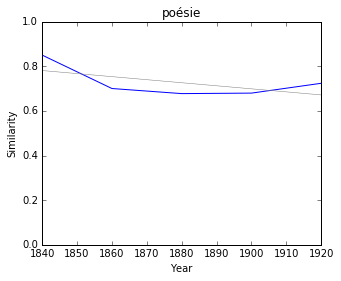

In [189]:
plot_cosine_series('littérature', 'poésie')

The two next cells get the 200 most similar terms to a specific term, from the training models, here "littérature".

In [190]:
def union_neighbor_vocab(anchor, topn=200):
    
    vocab = set()
    
    for year, model in models.items():
        similar = model.most_similar(anchor, topn=topn)
        vocab.update([s[0] for s in similar])
        
    return vocab

At this point, we'll do the same thing as above, and calculate, for each token in the 200 nearest terms to the main entry, the <b>proximity</b> of this term and its <b>significance</b>. The significance is calculated with the p value, that is to say that, below a certain threshold (0.05) we have a strong likelyhood that the result is sure and significant.

In [191]:
testList = ('littérature','poésie', 'science', 'savoir', 'histoire', 'philosophie', 'lettre', 'critique', 
            'roman', 'théâtre', 'drame', 'esprit', 'langue', 'diplomatie', 'politique', 'morale', 'société', 
            'pouvoir', 'théologie', 'droit', 'loi', 'méthode', 'génie', 'romantisme', 'réalisme', 'symbolisme', 
            'naturalisme')
entries={}

for word in testList:
    data = []
    for token in union_neighbor_vocab(word):
    
        series = cosine_series('littérature', token)
        fit = lin_reg(series)
    
        if fit.pvalues[1] < 0.05:
            data.append((token, fit.params[1], fit.pvalues[1]))
    entries[word]=data

# Increasing

In this part, we want to show what terms <b>emerge</b> more and more with the main entry, that is to say each word of the given test list. The <b>"slope"</b> is the degree of progress, and the <b>"p" value</b> its efficiency. So here, the main emergence with "littérature" which is significant is "humanisme". All terms seem to be significant, except "fédéralisme", "welschinger", "maniere", "hennet", "réapparition", "deffence", "bourgin", "colonie", "naturalisme", "réalisme", "sillery", "gréco", "compétence", "symbolisme", "catholique", "japonais", "manuel", "romand", "topographie, "organisme", "prédominance". That is to say that those terms can be nearest, but that statistically they are not significant enough to be sure, while the others are more certain.

In this following cell, we show how the top ten most similar vectors change through time compared to the words in the test list : "humanisme" for example seems to be very rare before 1860, and then becomes more and more similar to "littérature". Those show the terms that were not similar in the beginning, but <b>tend to be more and more related</b> to "littérature". You should keep in mind the p values associated to each vector.

### <i><b>littérature</i></b>

            token     slope         p
8       humanisme  0.010302  0.019004
39  professionnel  0.008294  0.001361
20        éthique  0.007957  0.003634
30     symboliste  0.007367  0.022680
1     orientation  0.007313  0.047529
27     adaptation  0.006944  0.049543
32         apport  0.006558  0.032944
34         manuel  0.006177  0.015870
26     catholique  0.005987  0.007488
14       réaliste  0.005107  0.033174



humanisme


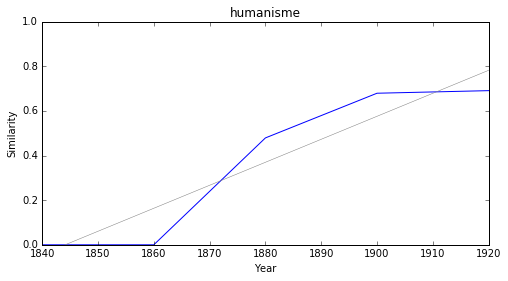

professionnel


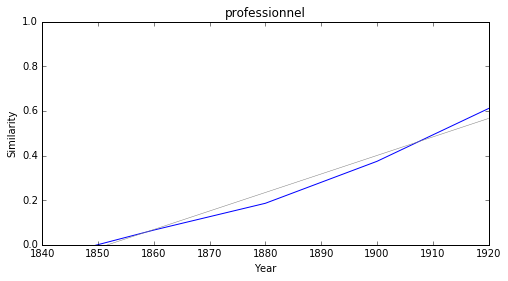

éthique


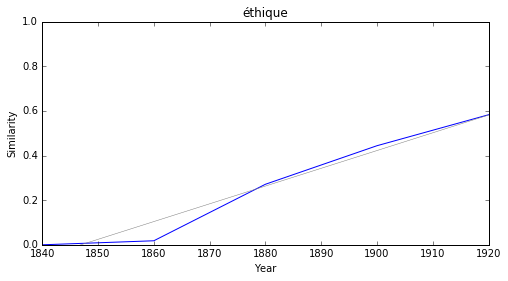

symboliste


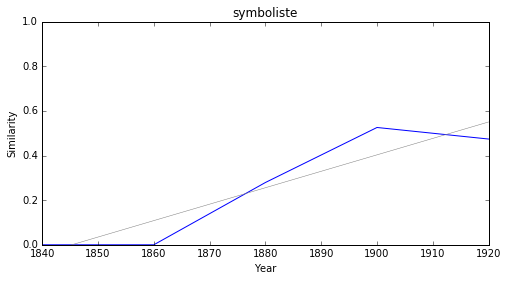

orientation


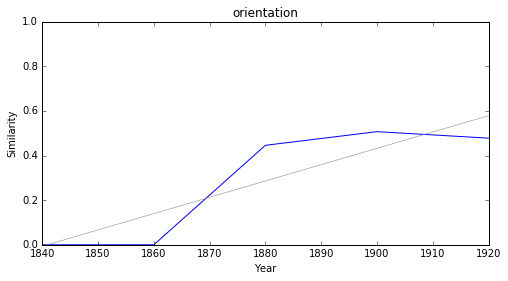

adaptation


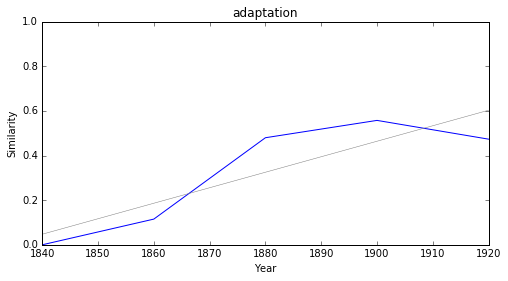

apport


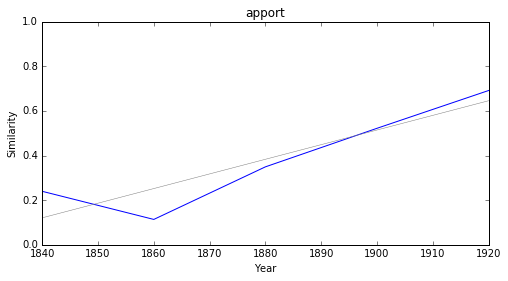

manuel


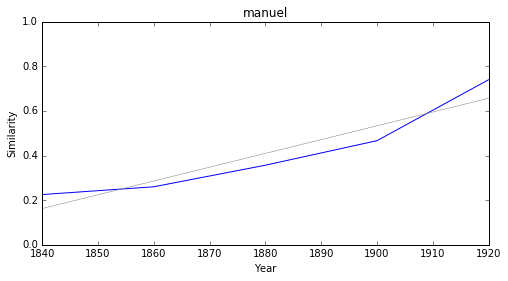

catholique


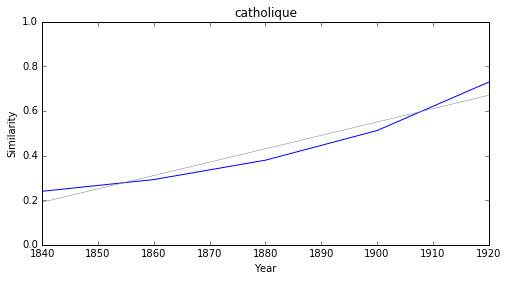

réaliste


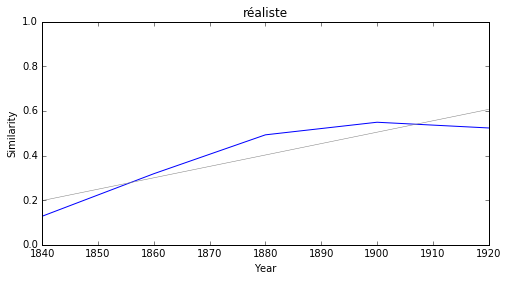

### <i><b>poésie</i></b>

            token     slope         p
7       humanisme  0.010302  0.019004
50  professionnel  0.008294  0.001361
22        éthique  0.007957  0.003634
36     symboliste  0.007367  0.022680
1     orientation  0.007313  0.047529
30     adaptation  0.006944  0.049543
38         ecrits  0.006570  0.032844
41         apport  0.006558  0.032944
13        concept  0.006020  0.011972
12      conscient  0.005300  0.007511



humanisme


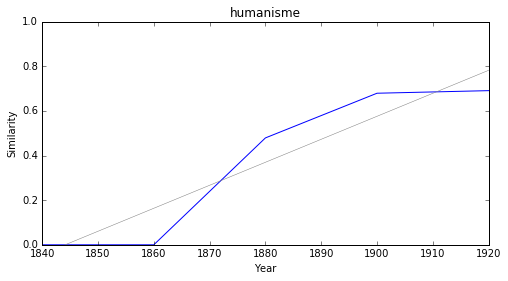

professionnel


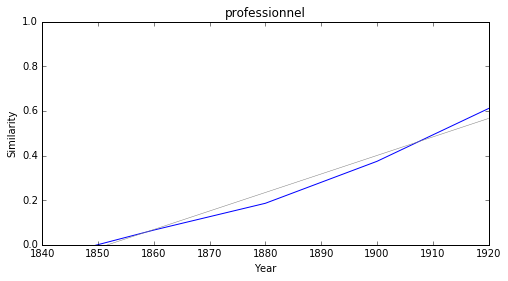

éthique


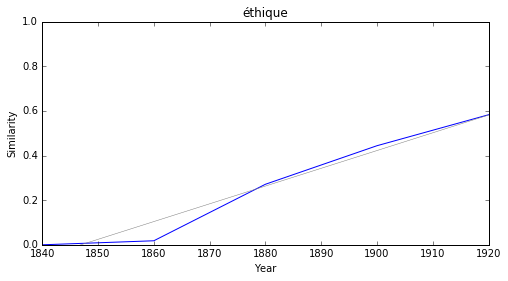

symboliste


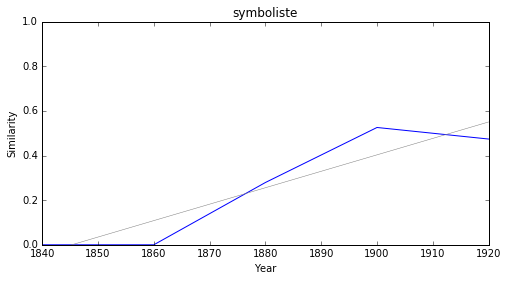

orientation


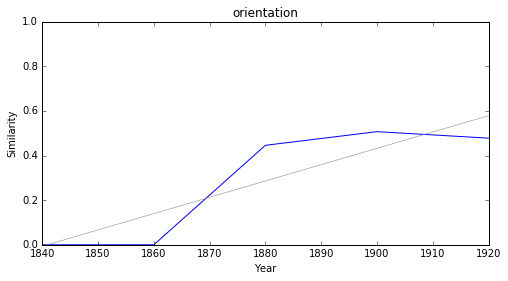

adaptation


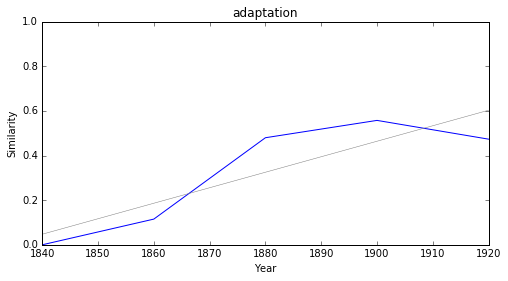

ecrits


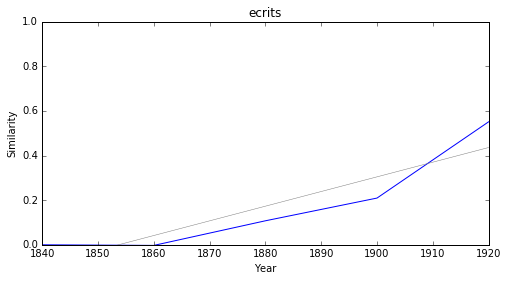

apport


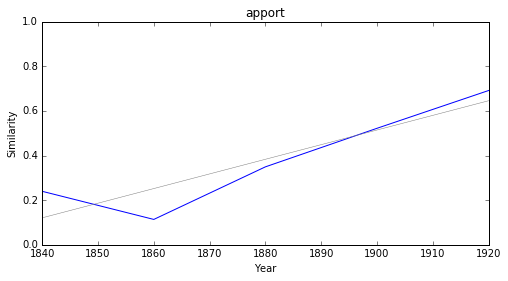

concept


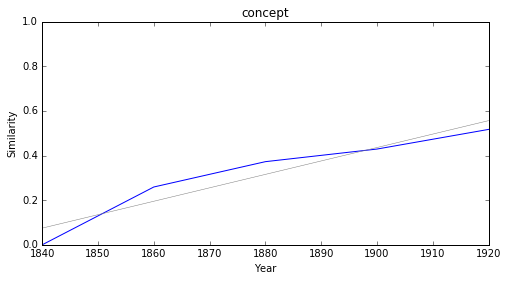

conscient


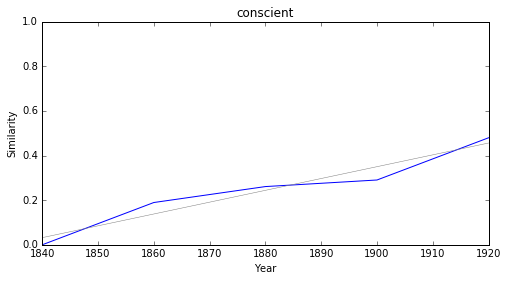

### <i><b>science</i></b>

            token     slope         p
8       humanisme  0.010302  0.019004
37  professionnel  0.008294  0.001361
19        éthique  0.007957  0.003634
25     adaptation  0.006944  0.049543
30         apport  0.006558  0.032944
32         manuel  0.006177  0.015870
14        concept  0.006020  0.011972
24     catholique  0.005987  0.007488
0    déterminisme  0.005564  0.042210
35       majorité  0.004181  0.039357



humanisme


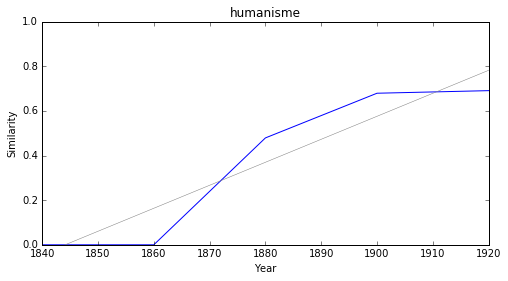

professionnel


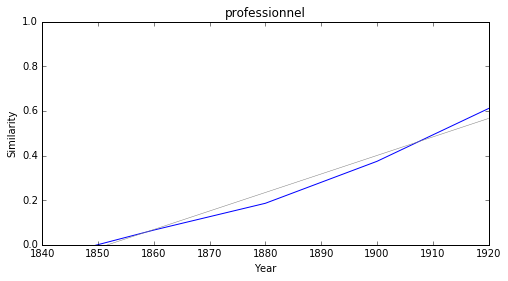

éthique


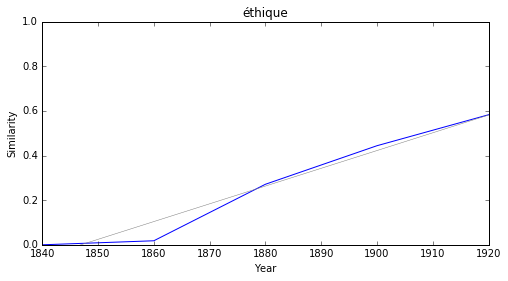

adaptation


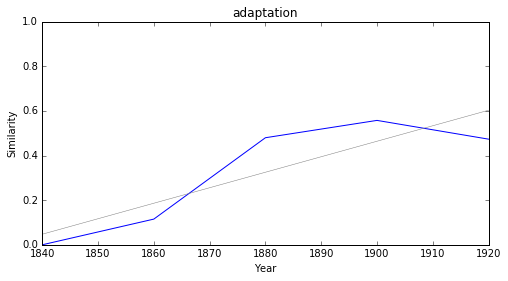

apport


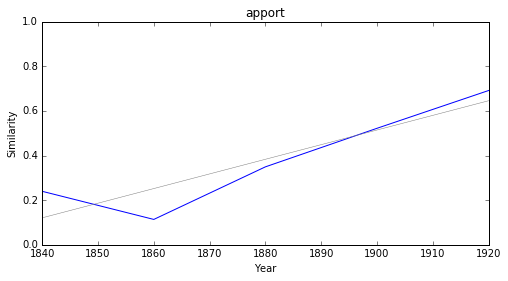

manuel


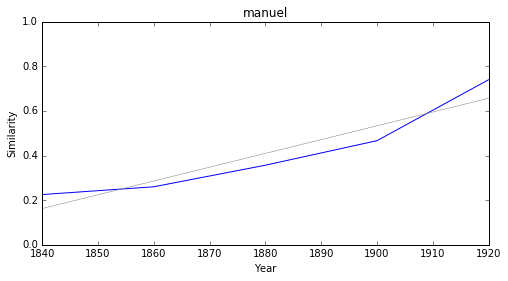

concept


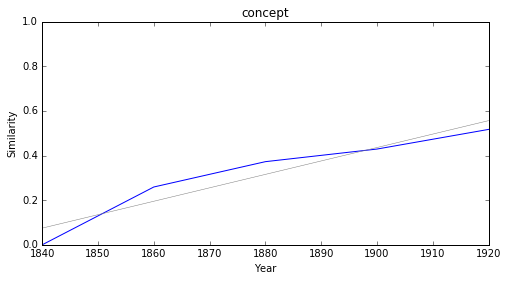

catholique


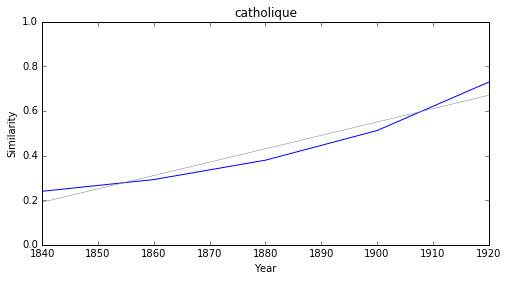

déterminisme


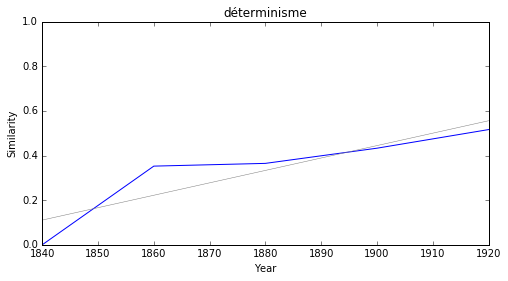

majorité


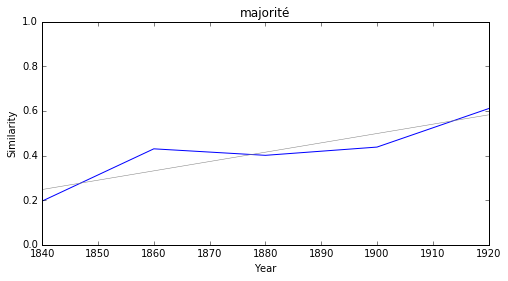

### <i><b>savoir</i></b>

          token     slope         p
7          visé  0.003428  0.044971
11     pâtisser  0.002574  0.032567
5        défier  0.002202  0.011077
16    suspecter  0.002164  0.008146
2     perturber  0.001770  0.042132
9   méconnaître  0.001444  0.047804
6    prétention  0.001296  0.034148
12       défini  0.001105  0.014490
15          oui -0.002151  0.049503
8       écouter -0.002370  0.029324



visé


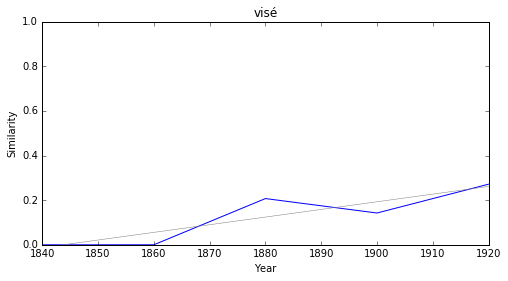

pâtisser


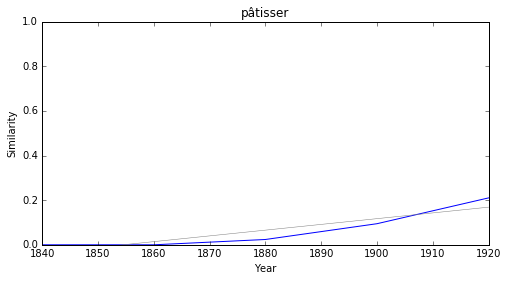

défier


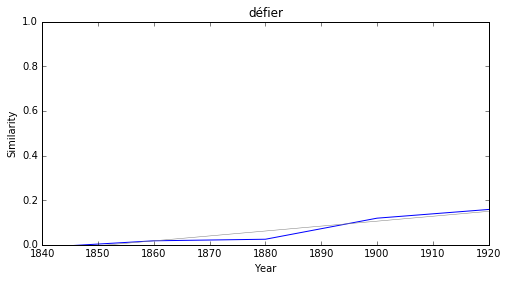

suspecter


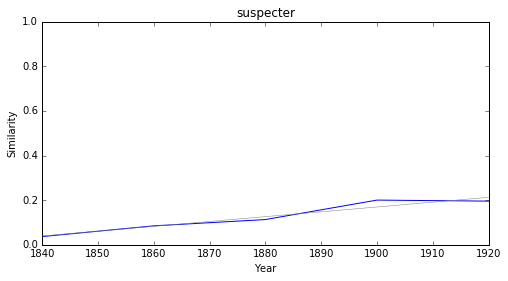

perturber


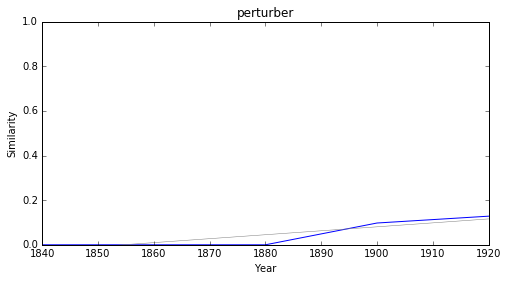

méconnaître


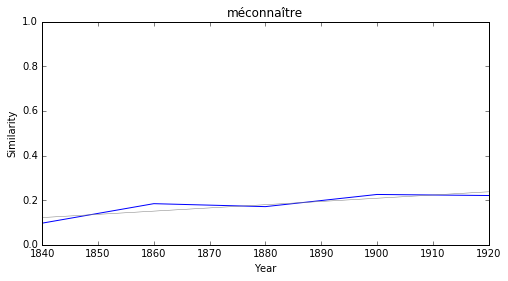

prétention


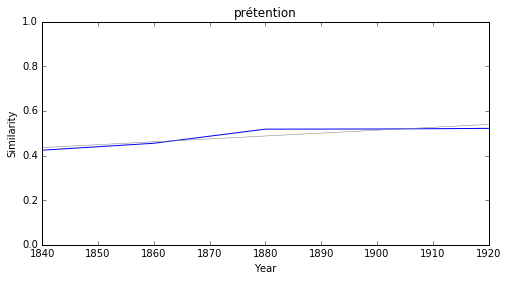

défini


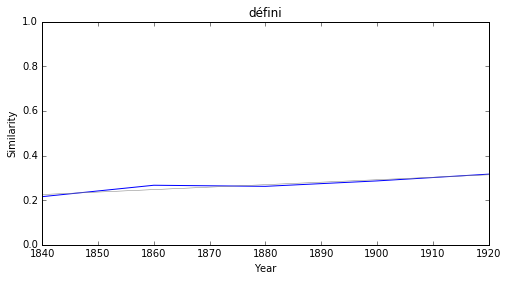

oui


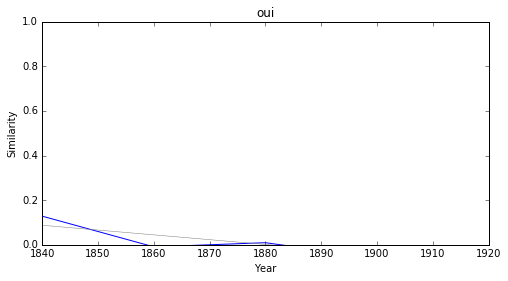

écouter


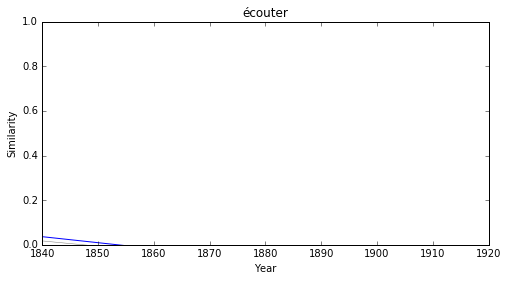

### <i><b>histoire</i></b>

          token     slope         p
7     humanisme  0.010302  0.019004
10    evolution  0.007497  0.018431
2     référence  0.007361  0.014038
1   orientation  0.007313  0.047529
25   adaptation  0.006944  0.049543
32       apport  0.006558  0.032944
34       manuel  0.006177  0.015870
24   catholique  0.005987  0.007488
22    vauquelin  0.005868  0.010593
11    réédition  0.005382  0.019979



humanisme


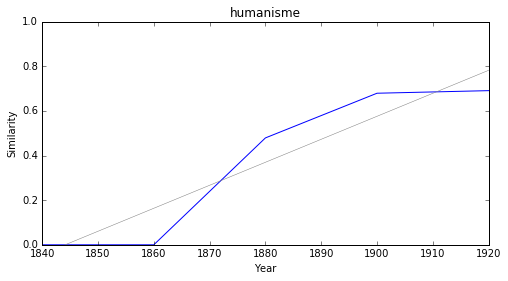

evolution


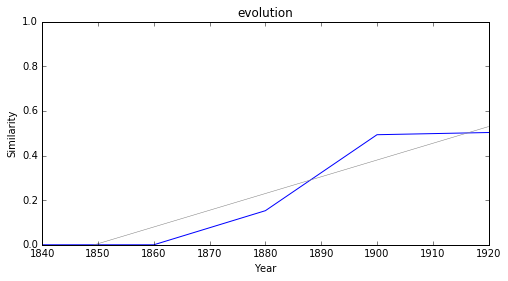

référence


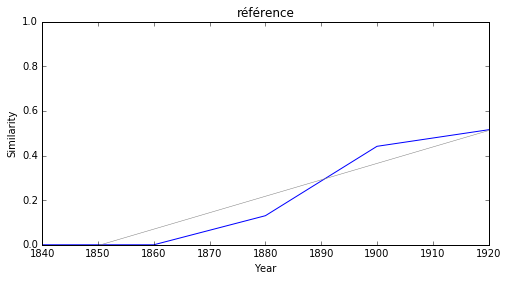

orientation


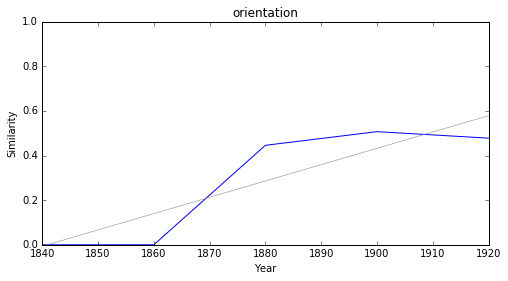

adaptation


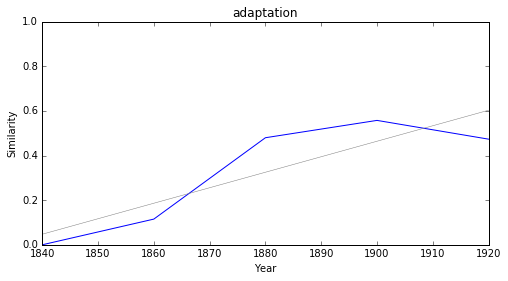

apport


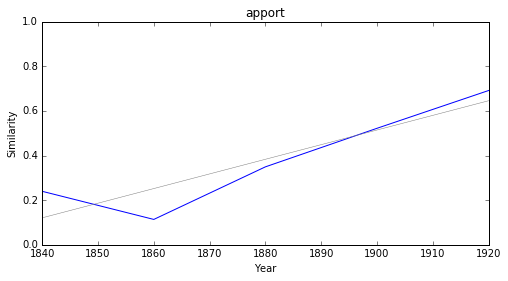

manuel


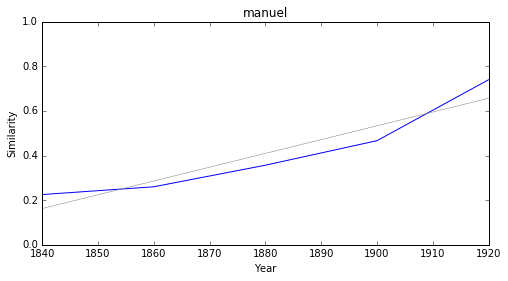

catholique


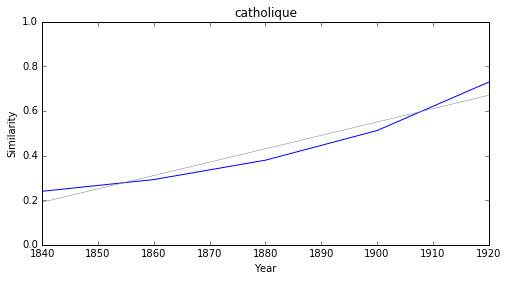

vauquelin


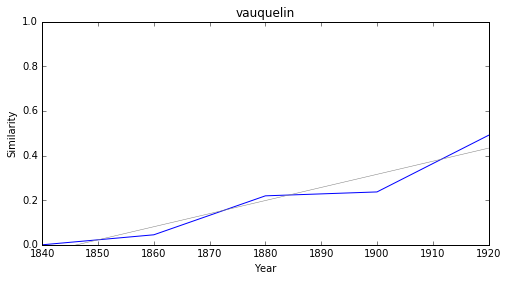

réédition


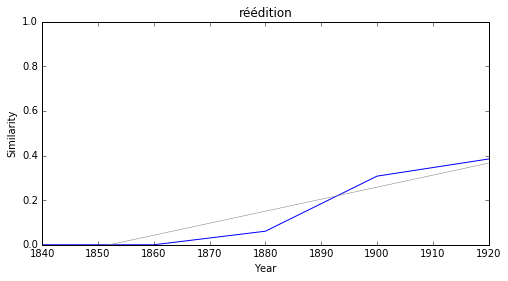

### <i><b>philosophie</i></b>

            token     slope         p
12      humanisme  0.010302  0.019004
47  professionnel  0.008294  0.001361
22        éthique  0.007957  0.003634
2     orientation  0.007313  0.047529
30     adaptation  0.006944  0.049543
46     relativité  0.006794  0.015817
37         apport  0.006558  0.032944
40         manuel  0.006177  0.015870
17        concept  0.006020  0.011972
29     catholique  0.005987  0.007488



humanisme


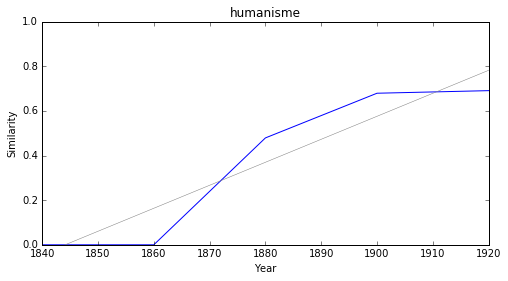

professionnel


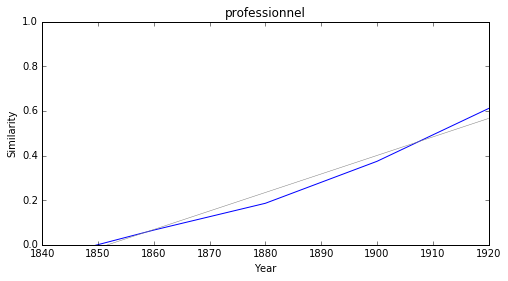

éthique


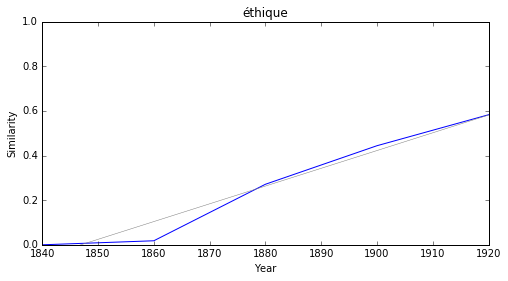

orientation


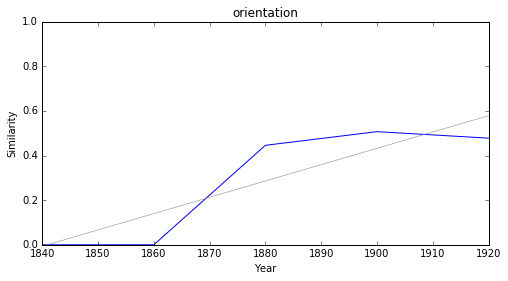

adaptation


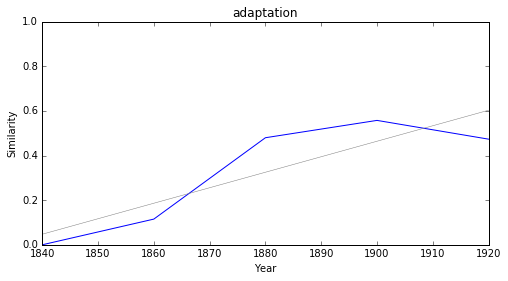

relativité


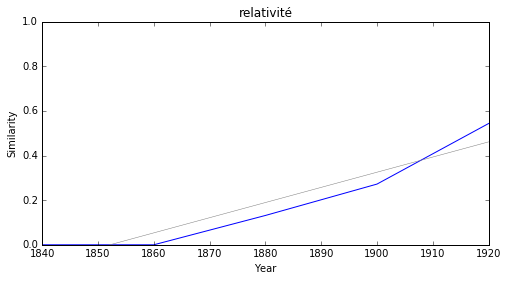

apport


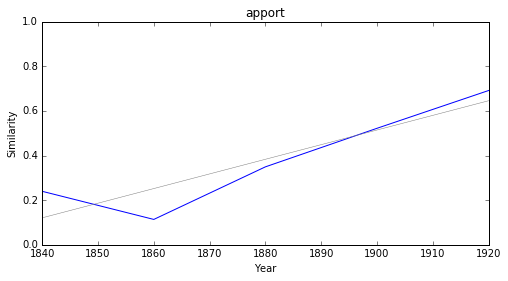

manuel


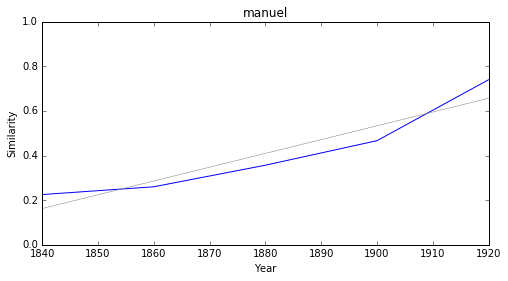

concept


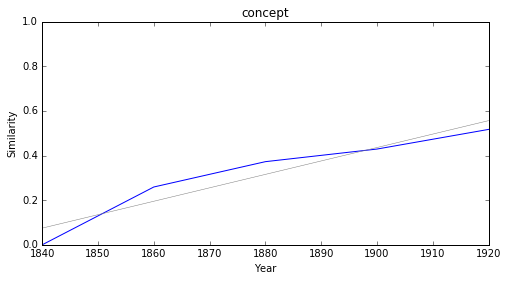

catholique


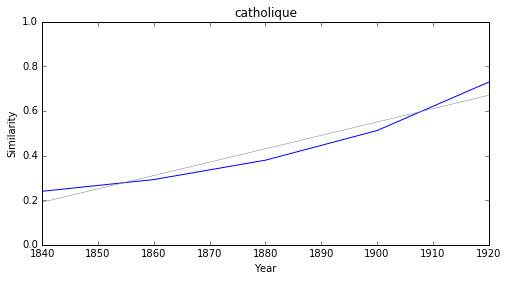

### <i><b>lettre</i></b>

            token     slope         p
20       aubignac  0.006575  0.000055
21         manuel  0.006177  0.015870
7      collaborer  0.004887  0.002064
29    darmesteter  0.004843  0.024437
14        cénacle  0.004167  0.031911
6           thèse  0.003912  0.001754
8   bibliographie  0.003516  0.014661
3         mercure  0.003512  0.044305
27        langeac  0.003176  0.025399
19       stendhal  0.003173  0.028386



aubignac


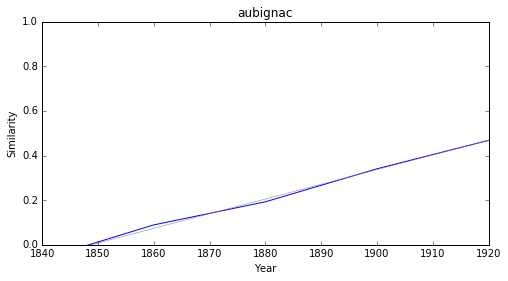

manuel


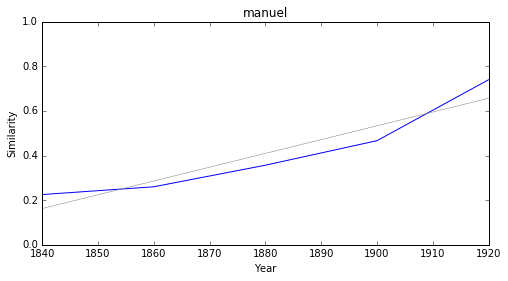

collaborer


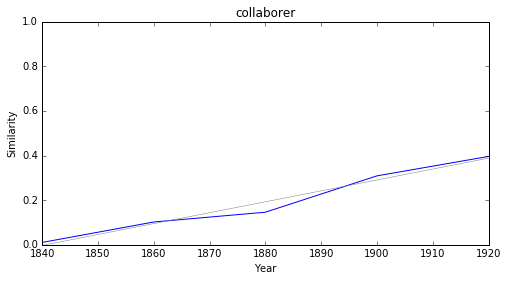

darmesteter


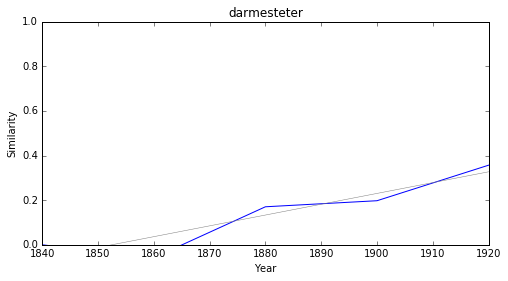

cénacle


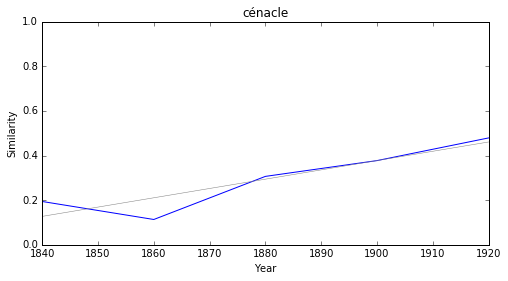

thèse


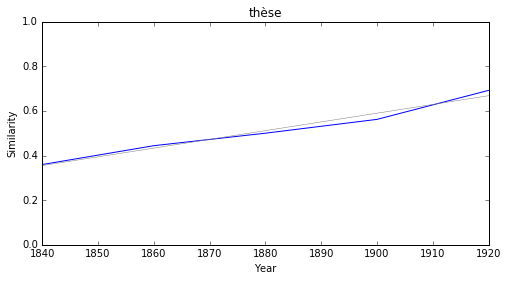

bibliographie


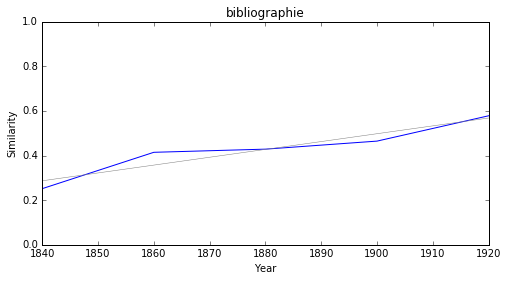

mercure


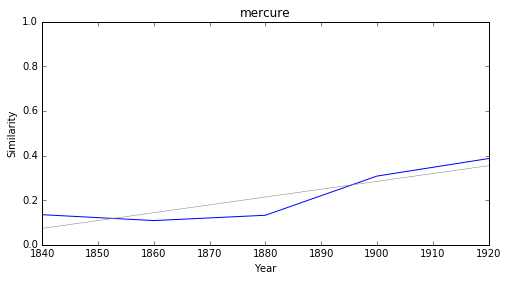

langeac


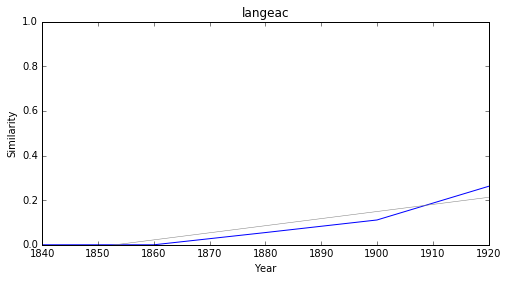

stendhal


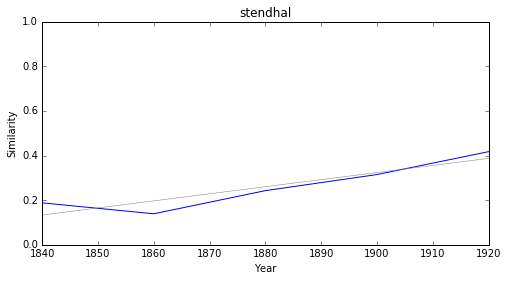

### <i><b>critique</i></b>

            token     slope         p
35  professionnel  0.008294  0.001361
21     adaptation  0.006944  0.049543
29         apport  0.006558  0.032944
30         manuel  0.006177  0.015870
7      brunetière  0.005356  0.011503
12       réaliste  0.005107  0.033174
23    spécialiste  0.004383  0.044534
4           thèse  0.003912  0.001754
3      romantique  0.003671  0.032306
0      théoricien  0.003616  0.036333



professionnel


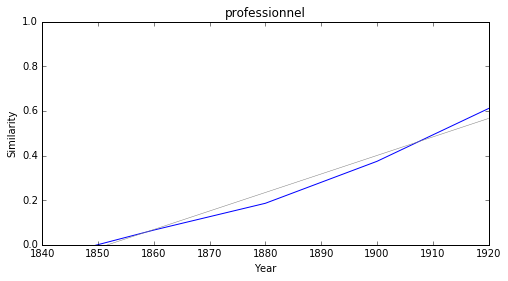

adaptation


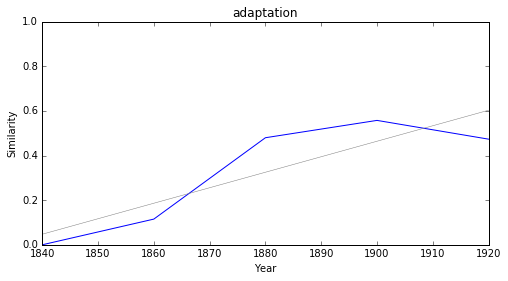

apport


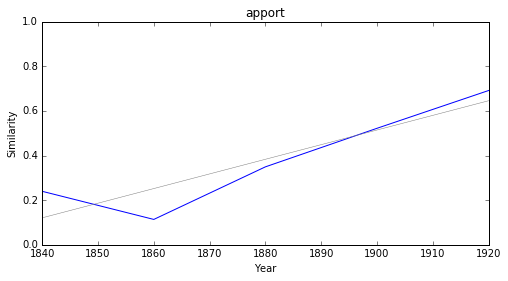

manuel


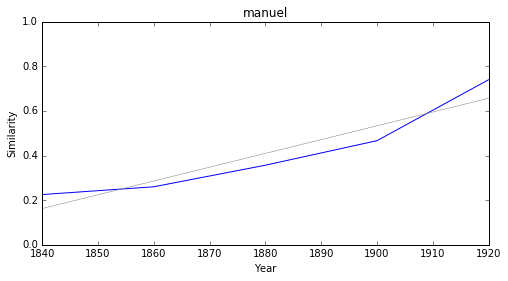

brunetière


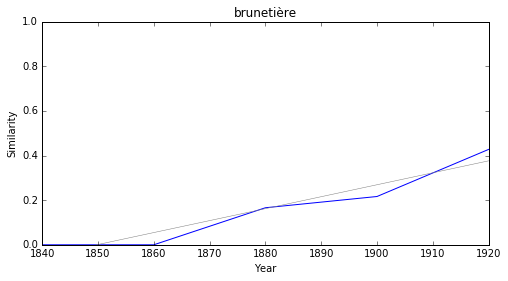

réaliste


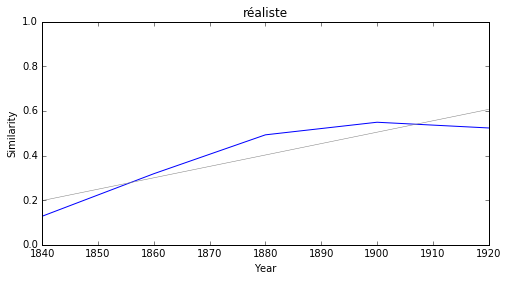

spécialiste


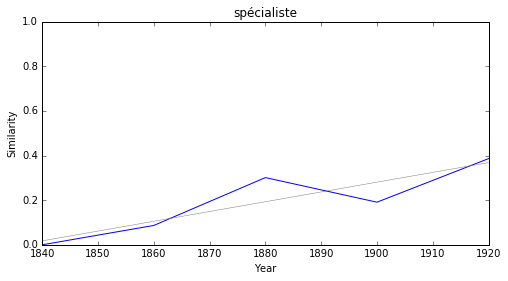

thèse


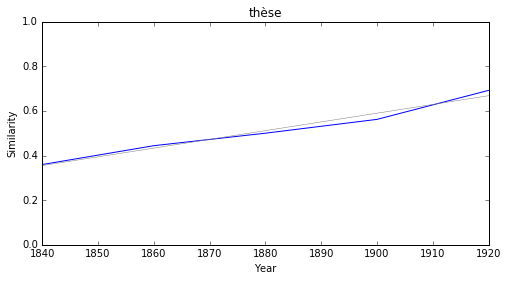

romantique


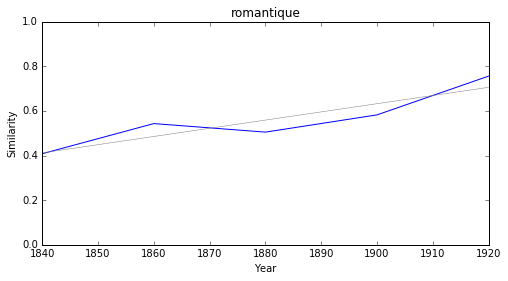

théoricien


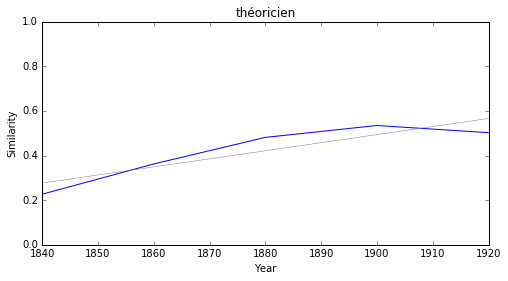

### <i><b>roman</i></b>

         token     slope         p
23      ecrits  0.006570  0.032844
26      apport  0.006558  0.032944
28      manuel  0.006177  0.015870
9    réédition  0.005382  0.019979
7   brunetière  0.005356  0.011503
13    réaliste  0.005107  0.033174
18   fascicule  0.004962  0.006492
17     cénacle  0.004167  0.031911
6        thèse  0.003912  0.001754
0      tristan  0.003849  0.004132



ecrits


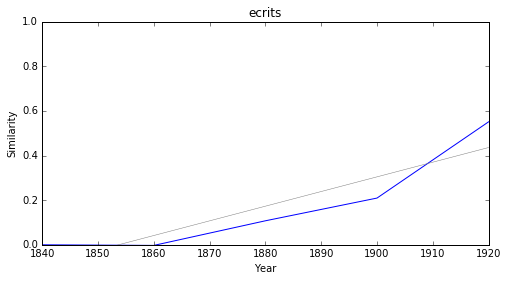

apport


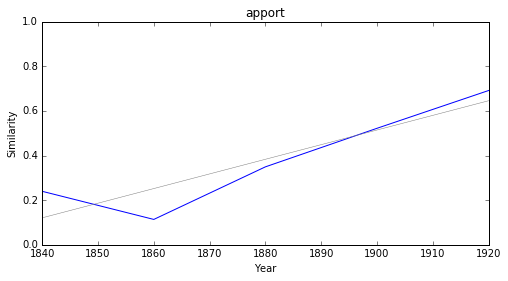

manuel


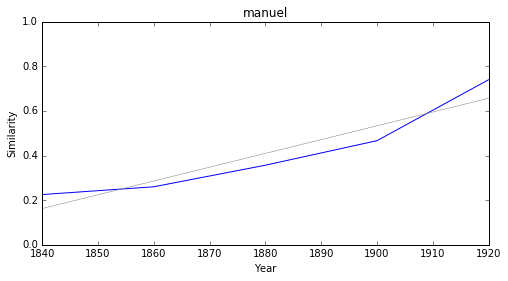

réédition


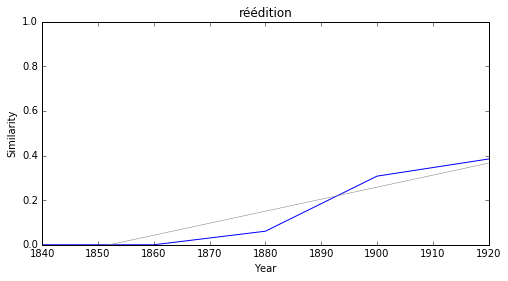

brunetière


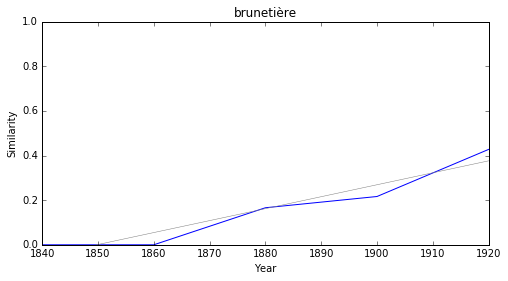

réaliste


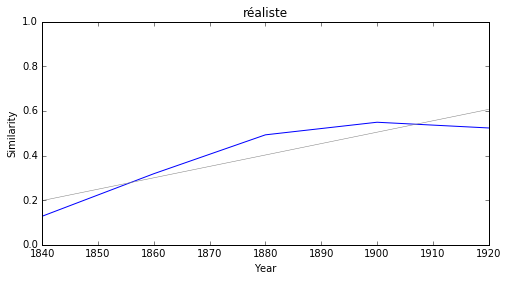

fascicule


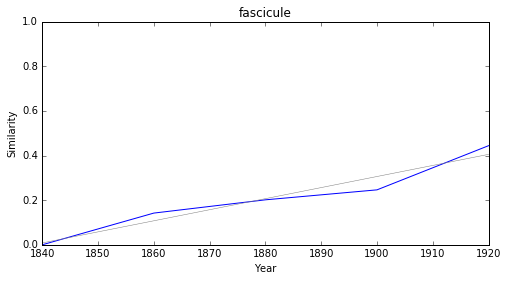

cénacle


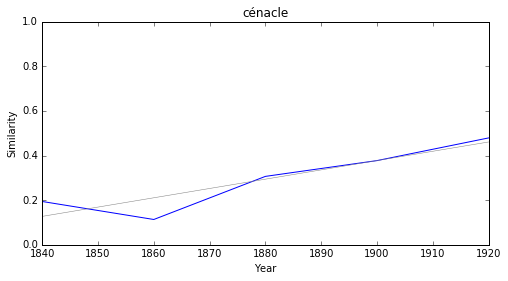

thèse


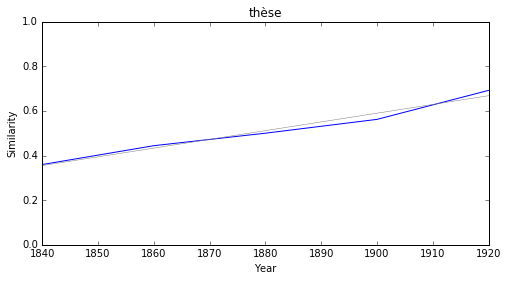

tristan


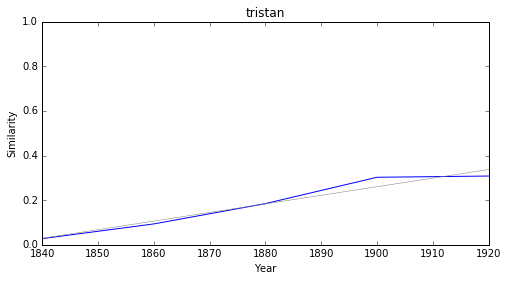

### <i><b>théâtre</i></b>

             token     slope         p
20          ecrits  0.006570  0.032844
24          manuel  0.006177  0.015870
16      catholique  0.005987  0.007488
21   intraduisible  0.004612  0.025111
14         cénacle  0.004167  0.031911
1       romantique  0.003671  0.032306
23     journalisme  0.003473  0.048392
22  complémentaire  0.003455  0.037779
0       romantisme  0.003334  0.016078
11      jansénisme  0.003239  0.045897



ecrits


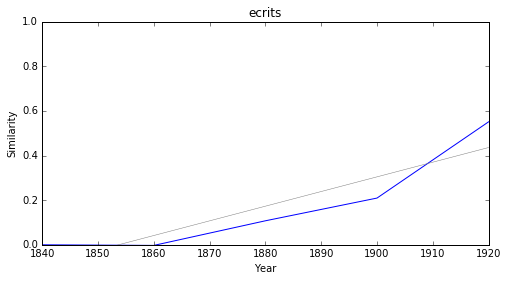

manuel


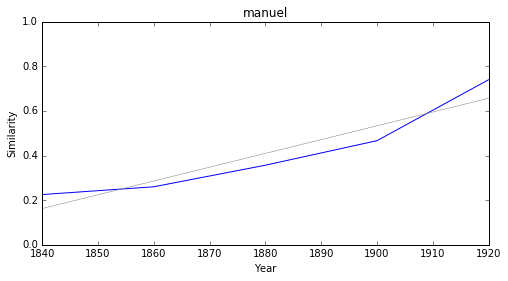

catholique


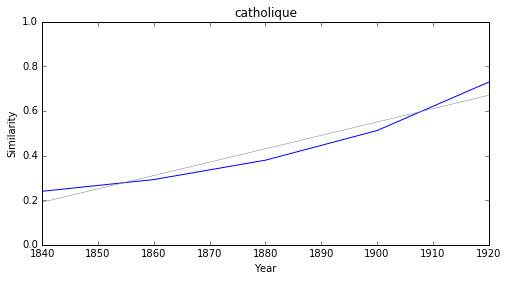

intraduisible


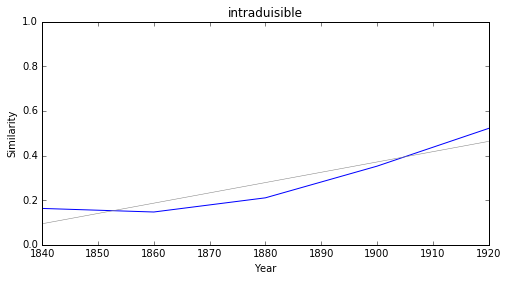

cénacle


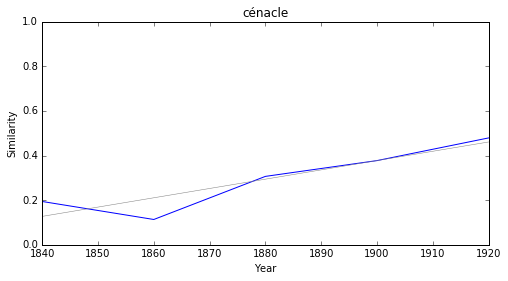

romantique


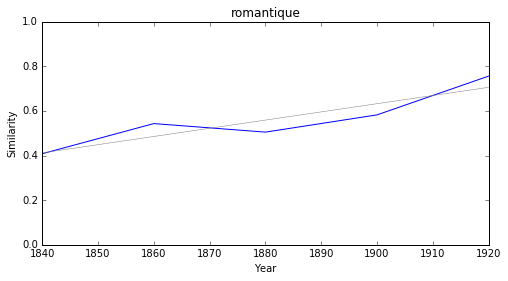

journalisme


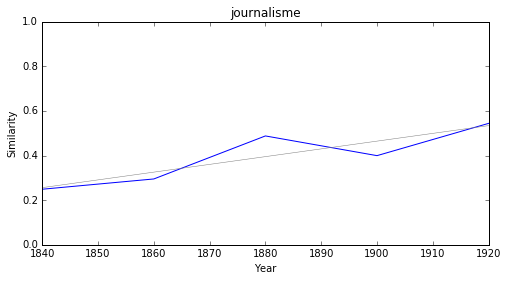

complémentaire


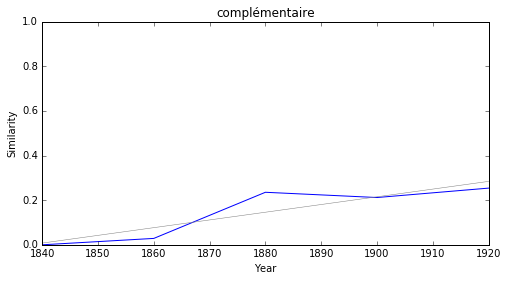

romantisme


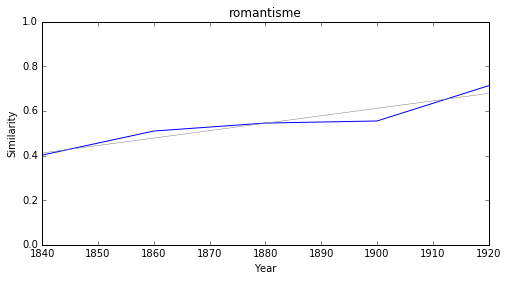

jansénisme


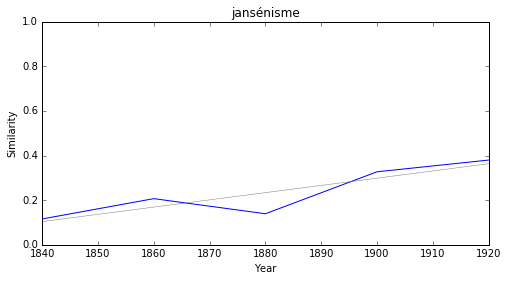

### <i><b>drame</i></b>

           token     slope         p
26        ecrits  0.006570  0.032844
30        apport  0.006558  0.032944
10       concept  0.006020  0.011972
32      intégrer  0.005923  0.017274
11      réaliste  0.005107  0.033174
25  déséquilibre  0.005057  0.016964
5        facteur  0.004927  0.041870
35         recul  0.004904  0.029997
17     processus  0.004841  0.012643
1         cliché  0.004326  0.045000



ecrits


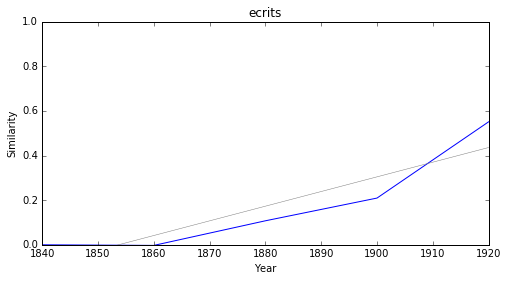

apport


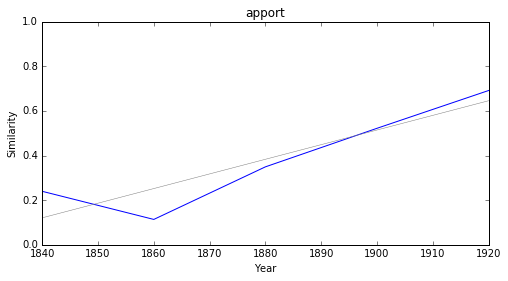

concept


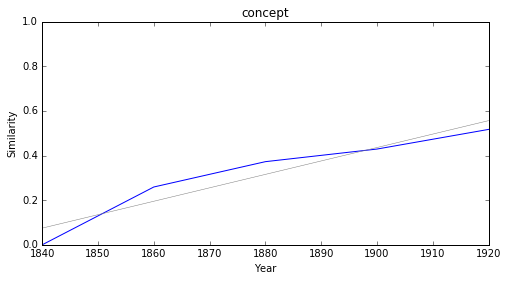

intégrer


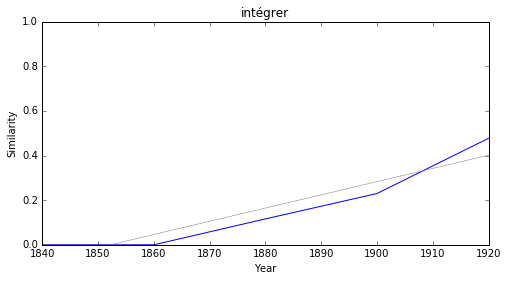

réaliste


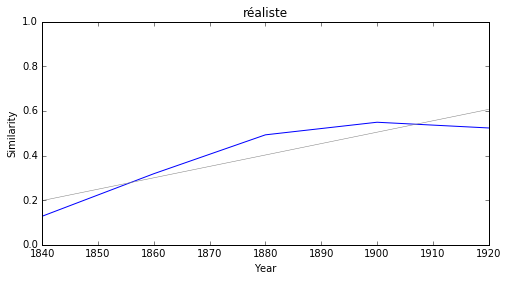

déséquilibre


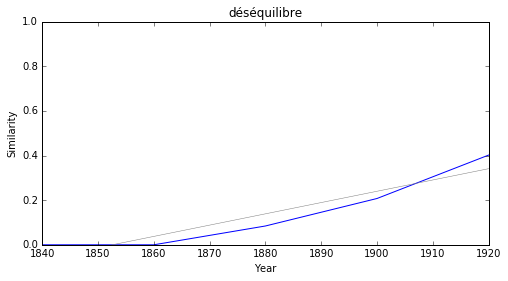

facteur


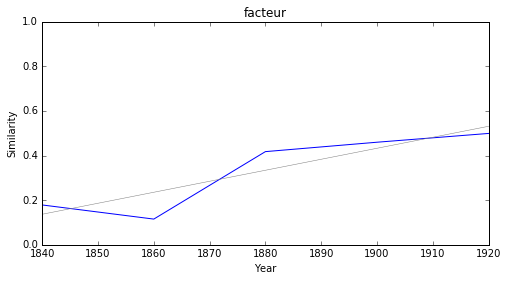

recul


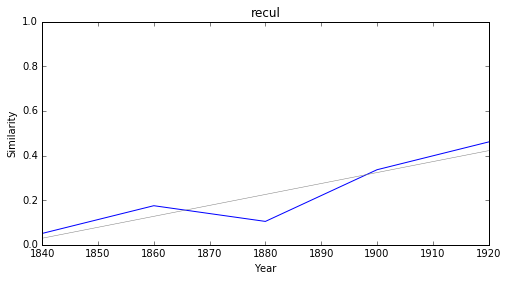

processus


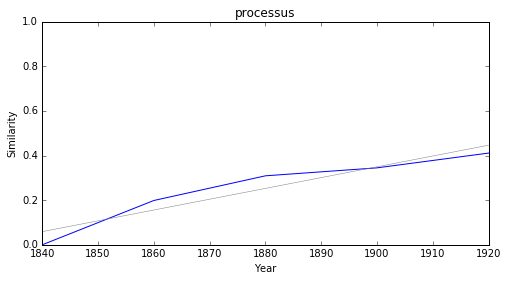

cliché


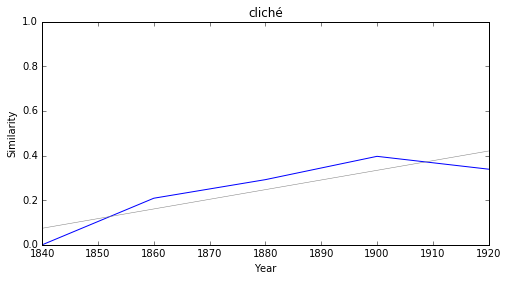

### <i><b>esprit</i></b>

           token     slope         p
6      conscient  0.005300  0.007511
16   inconscient  0.004128  0.024516
7      incapable  0.003698  0.022736
17  entraînement  0.003639  0.021247
1       hérédité  0.003464  0.011880
13       culture  0.003254  0.020990
25    conception  0.002287  0.026294
5        aisance  0.002262  0.045478
12      religion  0.002049  0.025109
2    indépendant  0.001960  0.011496



conscient


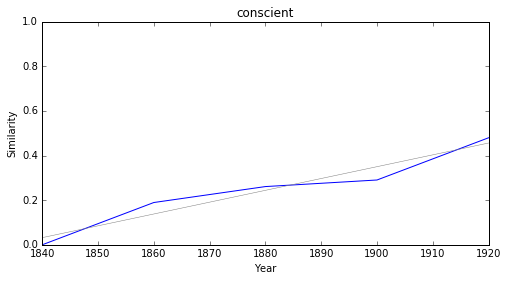

inconscient


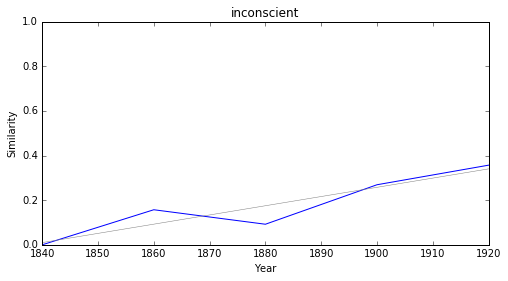

incapable


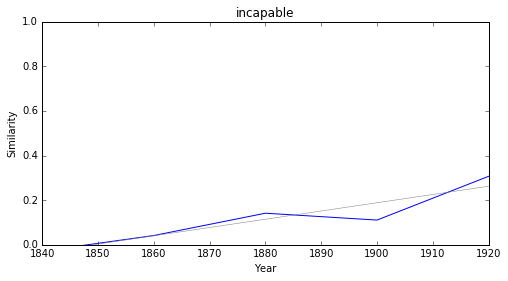

entraînement


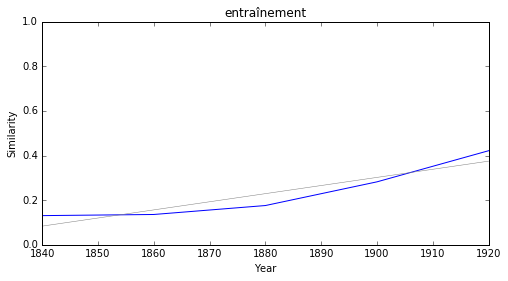

hérédité


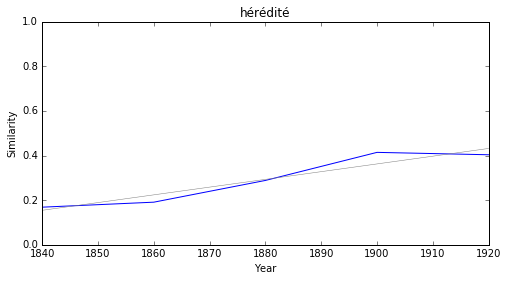

culture


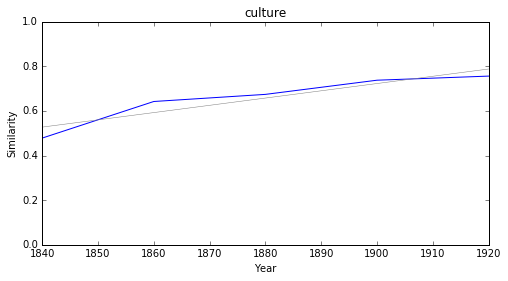

conception


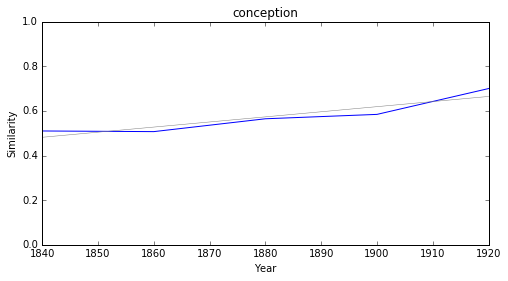

aisance


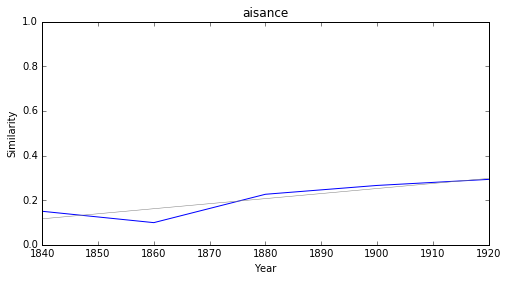

religion


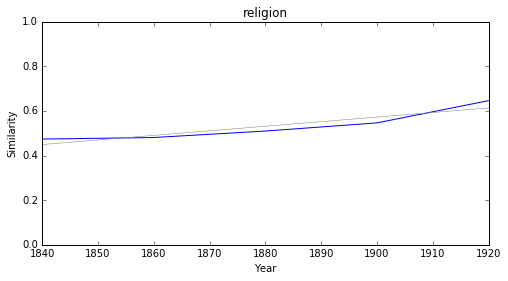

indépendant


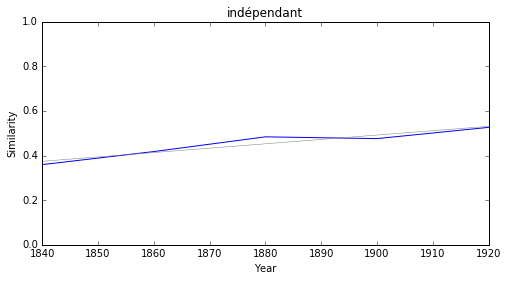

### <i><b>langue</i></b>

            token     slope         p
6       humanisme  0.010302  0.019004
33  professionnel  0.008294  0.001361
24     adaptation  0.006944  0.049543
25      dépendant  0.006583  0.035305
27         apport  0.006558  0.032944
28         manuel  0.006177  0.015870
23     catholique  0.005987  0.007488
21     phonétique  0.005264  0.024514
31       majorité  0.004181  0.039357
11   traditionnel  0.003913  0.033607



humanisme


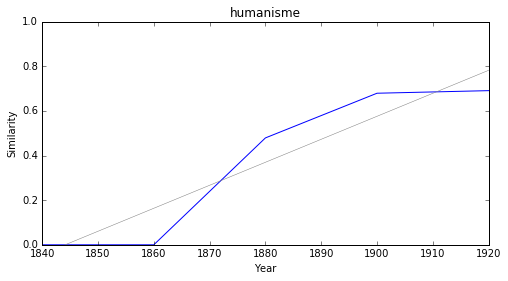

professionnel


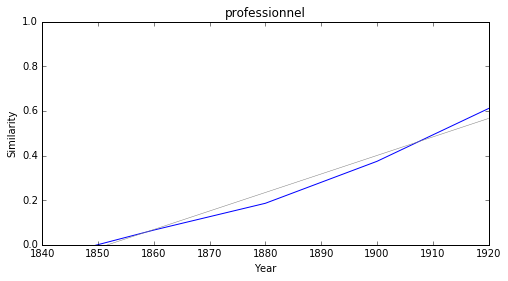

adaptation


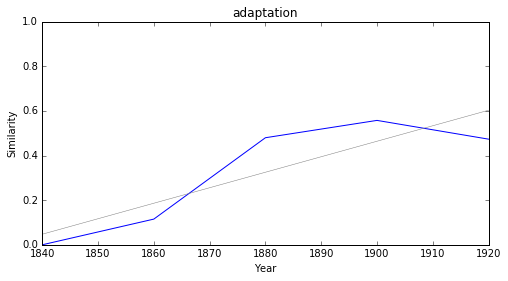

dépendant


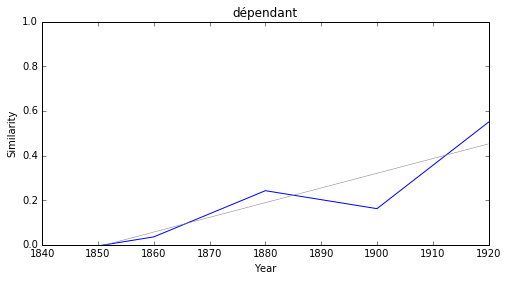

apport


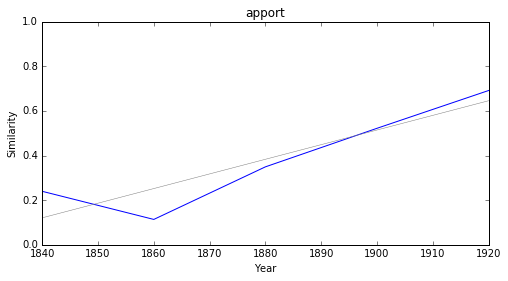

manuel


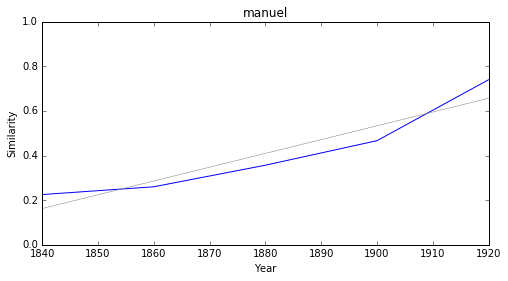

catholique


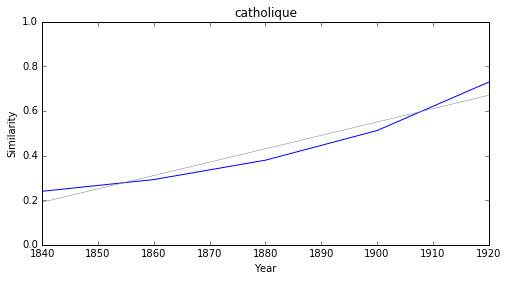

phonétique


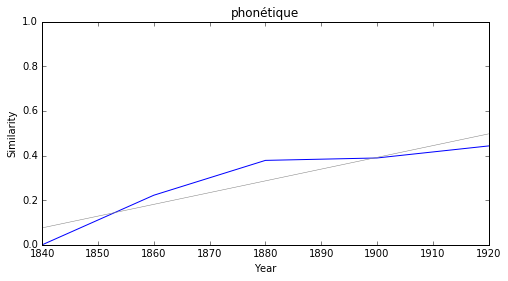

majorité


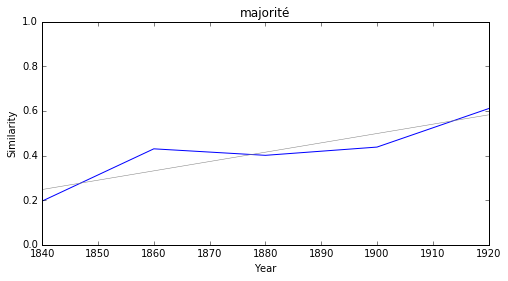

traditionnel


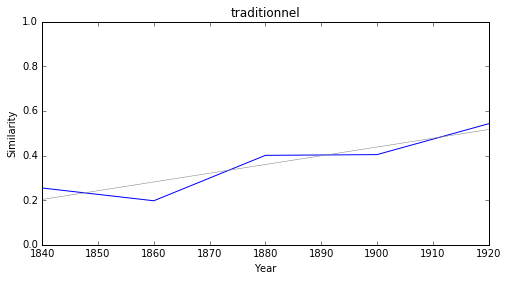

### <i><b>diplomatie</i></b>

             token     slope         p
32      survivance  0.007773  0.036709
60             tri  0.007605  0.039900
33         aveyron  0.007052  0.010570
38       hégémonie  0.006832  0.009022
50    romanisation  0.006508  0.047736
9      descendance  0.006322  0.004496
23  évolutionniste  0.006317  0.007741
16    collectivité  0.006173  0.012107
25        médiéval  0.006012  0.006523
64      ésotérisme  0.005901  0.009231



survivance


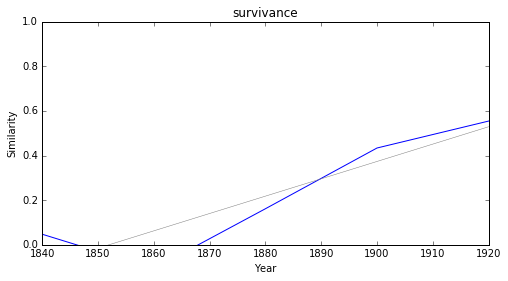

tri


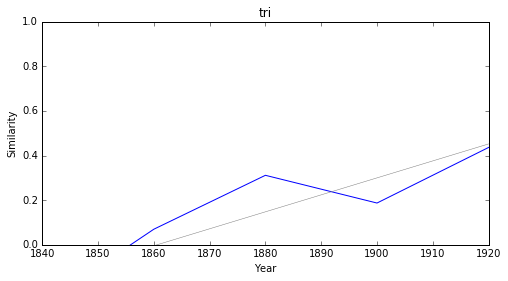

aveyron


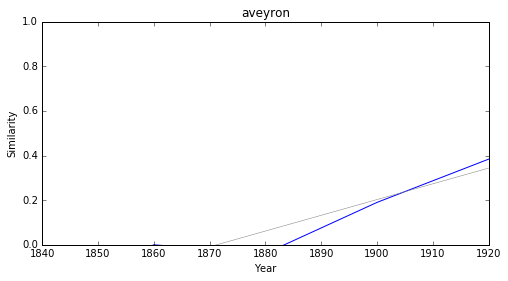

hégémonie


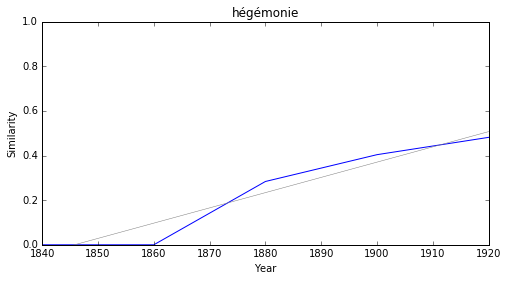

romanisation


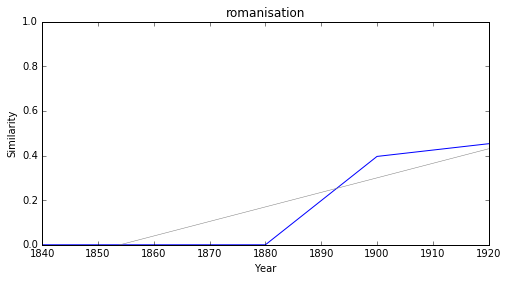

descendance


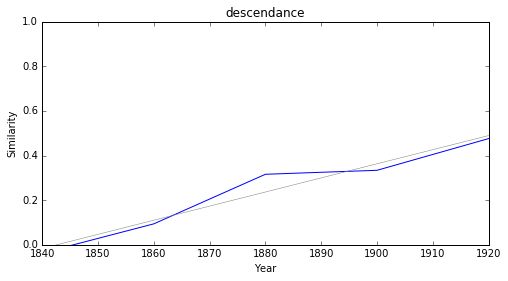

évolutionniste


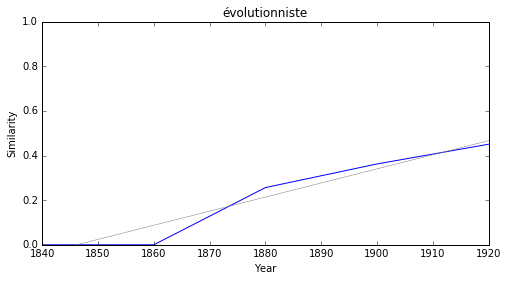

collectivité


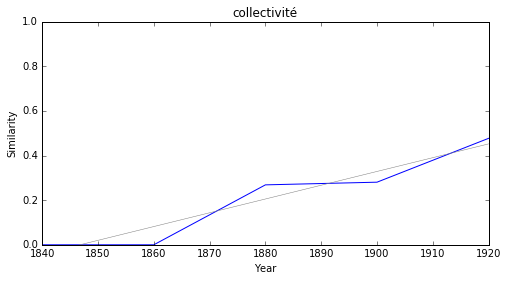

médiéval


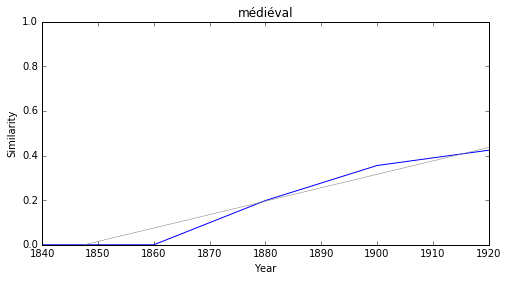

ésotérisme


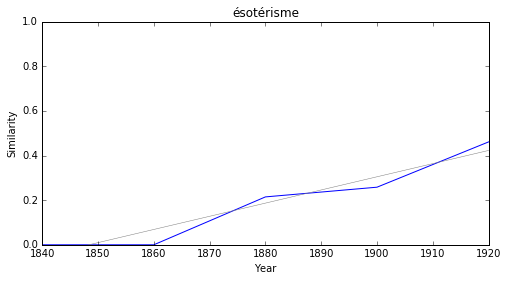

### <i><b>politique</i></b>

            token     slope         p
7       humanisme  0.010302  0.019004
44  professionnel  0.008294  0.001361
21        éthique  0.007957  0.003634
31     symboliste  0.007367  0.022680
40        évoluer  0.006741  0.005248
37         apport  0.006558  0.032944
33  vulgarisation  0.006311  0.003044
17        concept  0.006020  0.011972
27     catholique  0.005987  0.007488
41   sociologique  0.005857  0.009088



humanisme


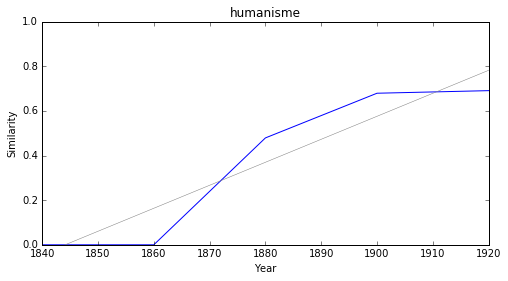

professionnel


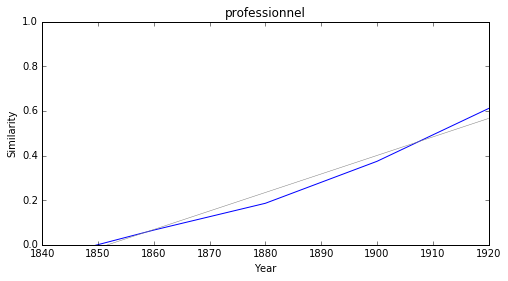

éthique


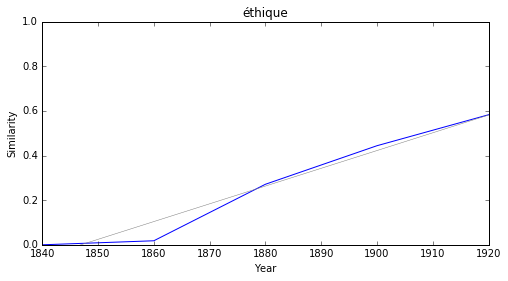

symboliste


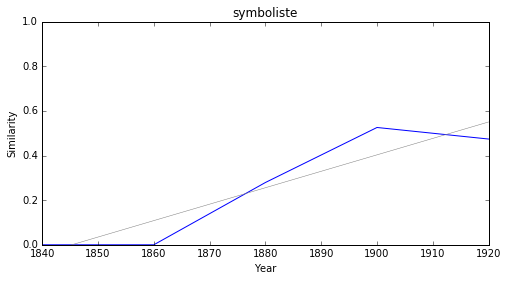

évoluer


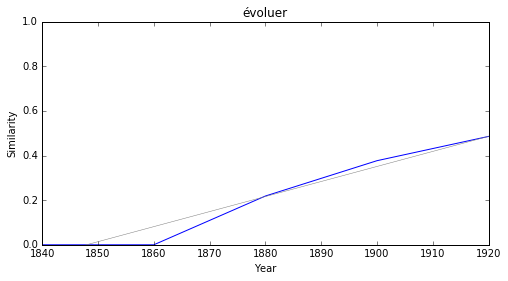

apport


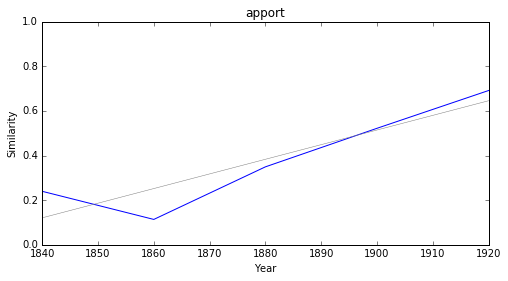

vulgarisation


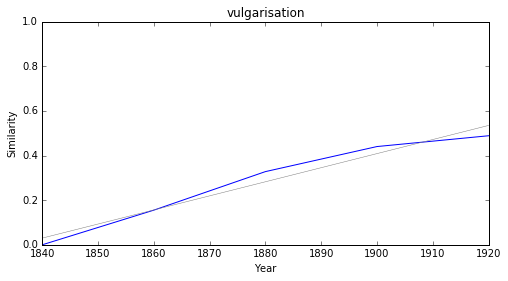

concept


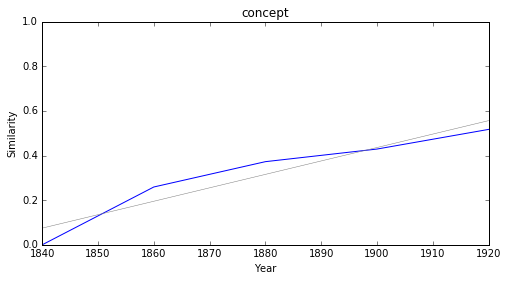

catholique


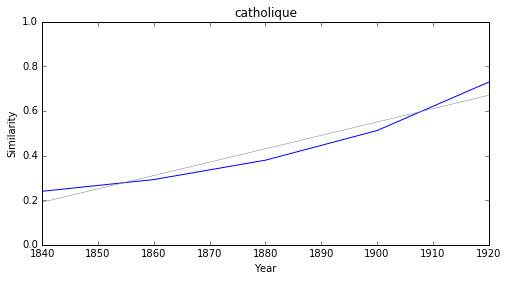

sociologique


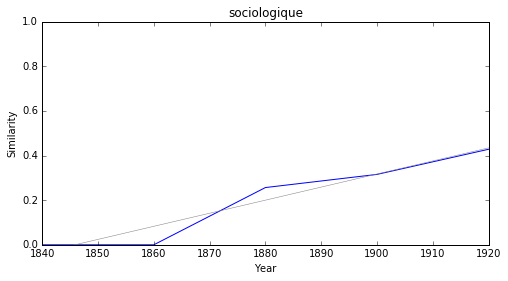

### <i><b>morale</i></b>

             token     slope         p
6        humanisme  0.010302  0.019004
39   professionnel  0.008294  0.001361
19         éthique  0.007957  0.003634
13         concept  0.006020  0.011972
0     déterminisme  0.005564  0.042210
10       conscient  0.005300  0.007511
24     objectivité  0.005062  0.015460
27  inconnaissable  0.004871  0.031872
25     inconscient  0.004128  0.024516
14    traditionnel  0.003913  0.033607



humanisme


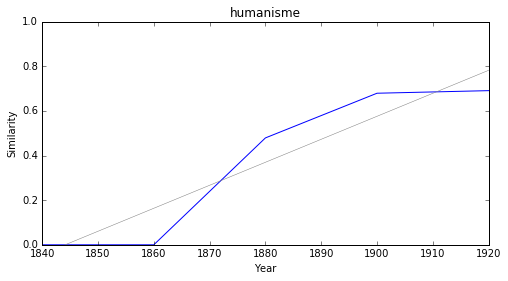

professionnel


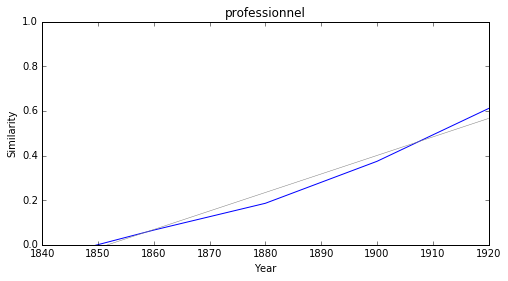

éthique


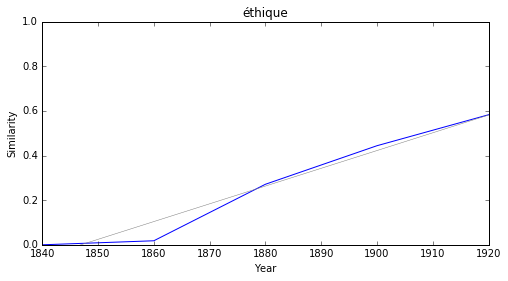

concept


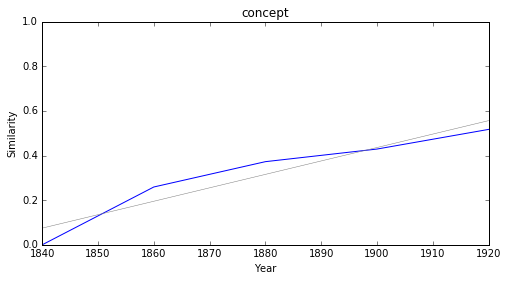

déterminisme


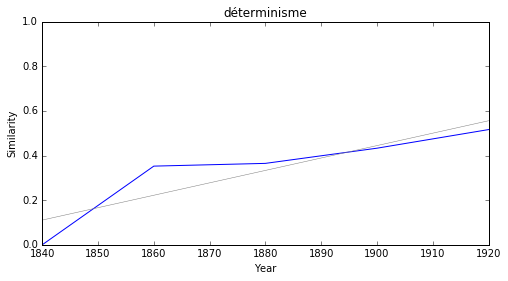

conscient


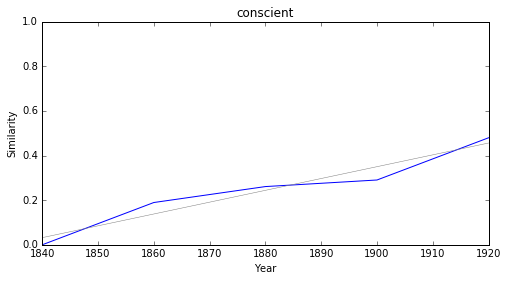

objectivité


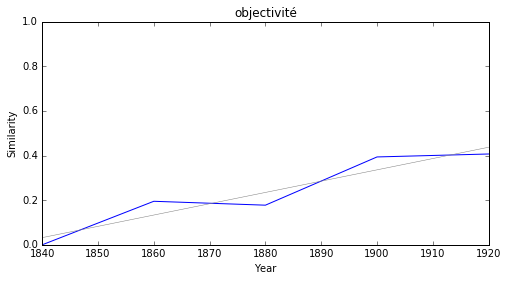

inconnaissable


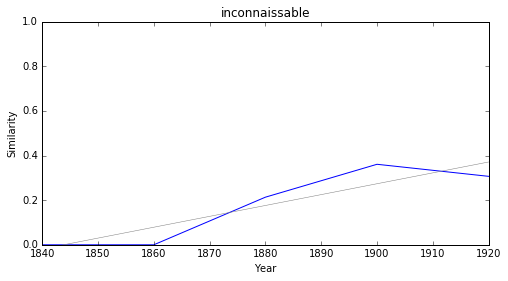

inconscient


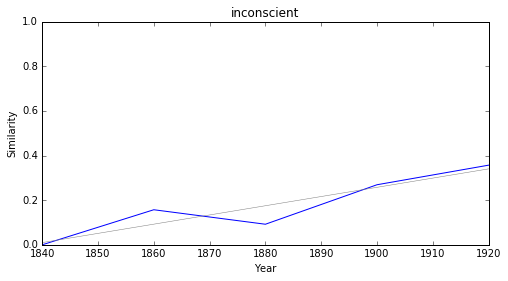

traditionnel


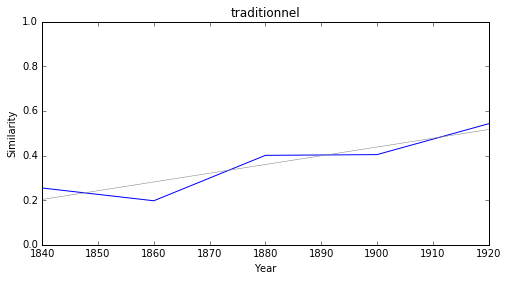

### <i><b>société</i></b>

         token     slope         p
5    humanisme  0.010302  0.019004
29  symboliste  0.007367  0.022680
27  adaptation  0.006944  0.049543
35      apport  0.006558  0.032944
38      manuel  0.006177  0.015870
23  révocation  0.006097  0.015675
26  catholique  0.005987  0.007488
6           sc  0.005552  0.018789
8    illogisme  0.005437  0.031284
4      facteur  0.004927  0.041870



humanisme


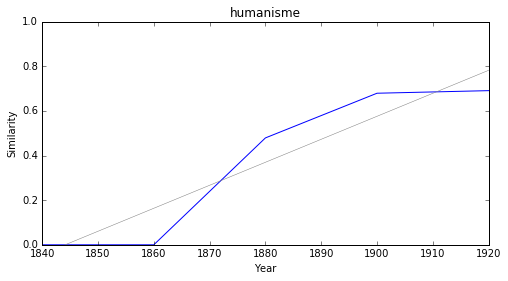

symboliste


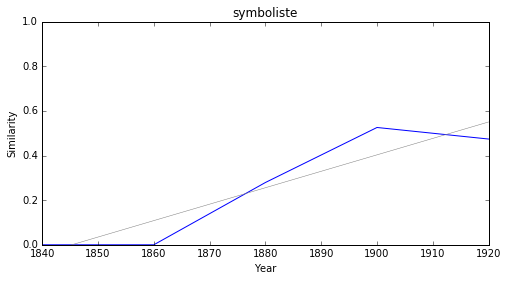

adaptation


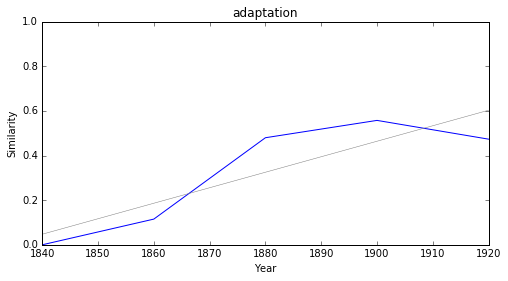

apport


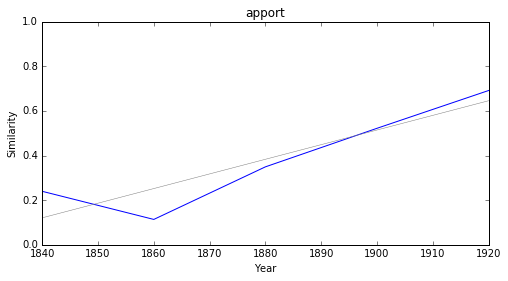

manuel


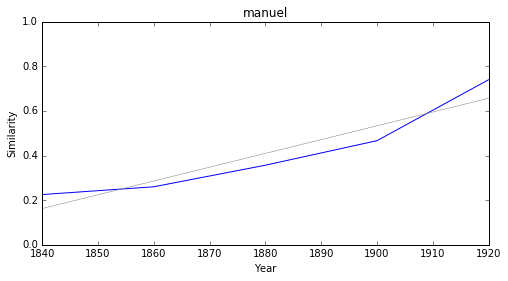

révocation


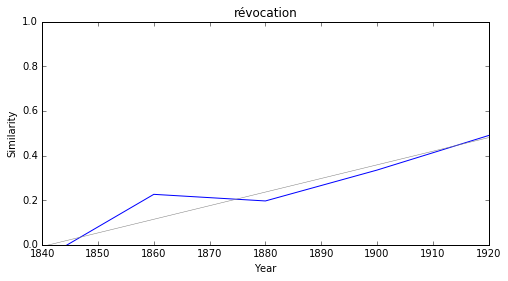

catholique


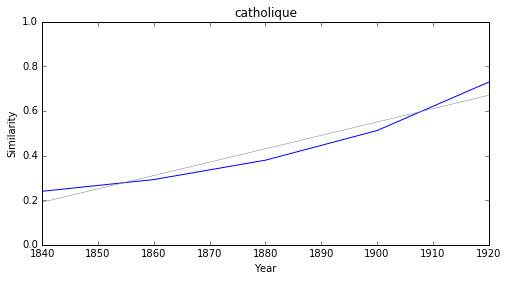

sc


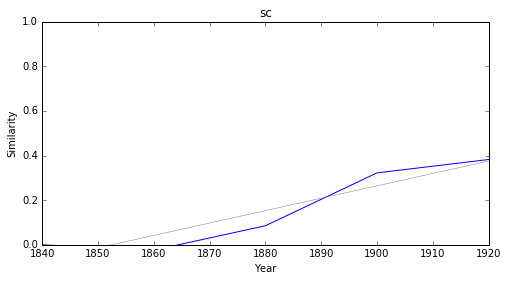

illogisme


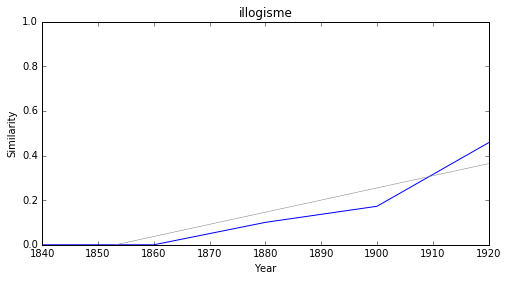

facteur


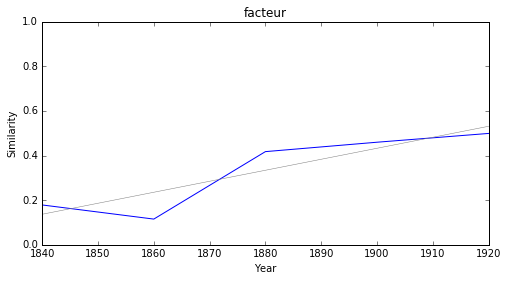

### <i><b>pouvoir</i></b>

          token     slope         p
10  objectivité  0.005062  0.015460
14      miracle  0.003739  0.046563
6     incapable  0.003698  0.022736
0         vagir  0.002241  0.046023
5         moyen  0.002180  0.038991
9      religion  0.002049  0.025109
8    prétention  0.001296  0.034148
11        aucun  0.001265  0.009292
7       utilité  0.001188  0.040852
13    ressource -0.001504  0.009807



objectivité


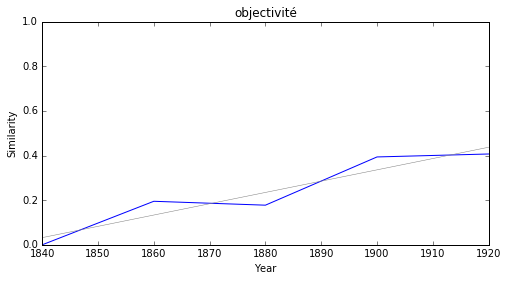

miracle


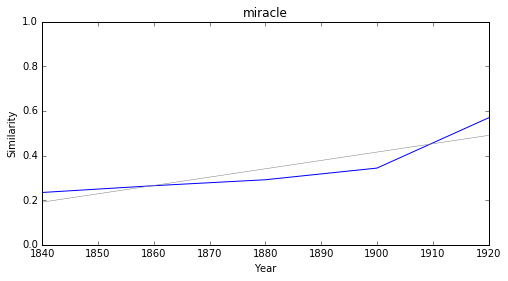

incapable


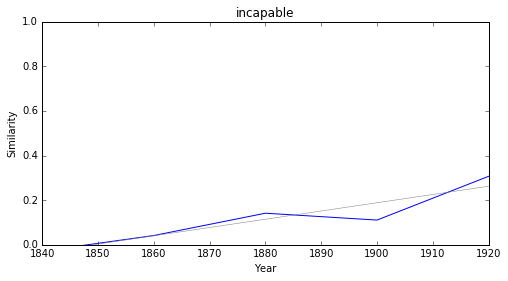

vagir


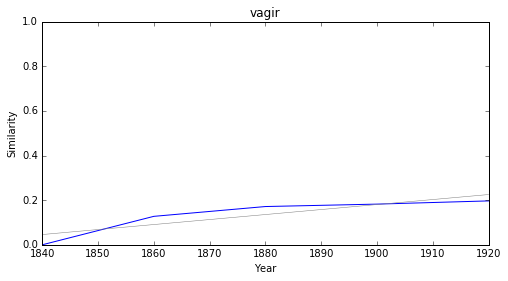

moyen


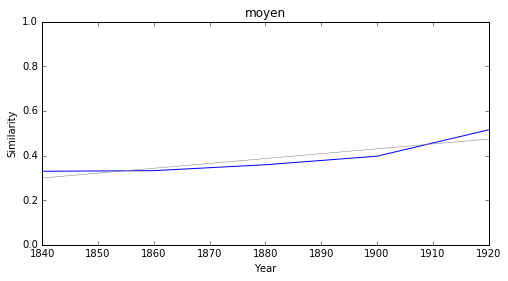

religion


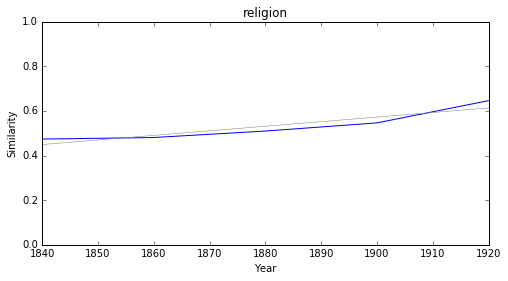

prétention


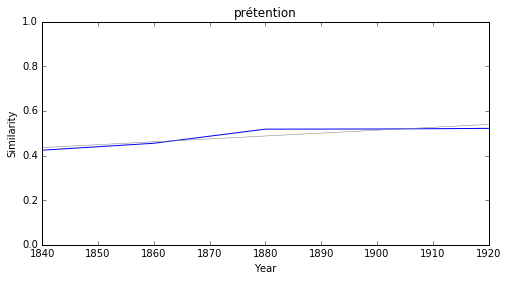

aucun


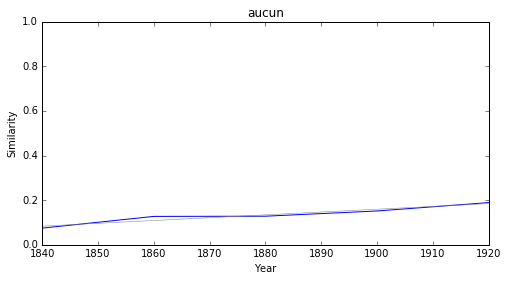

utilité


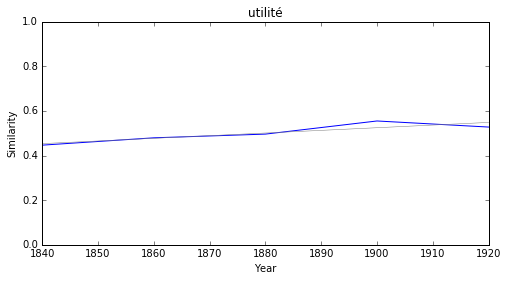

ressource


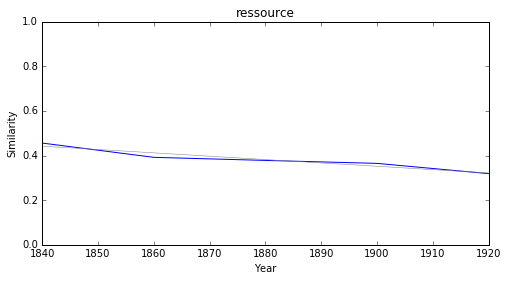

### <i><b>théologie</i></b>

             token     slope         p
11       humanisme  0.010302  0.019004
36         éthique  0.007957  0.003634
38      survivance  0.007773  0.036709
56      symboliste  0.007367  0.022680
4      orientation  0.007313  0.047529
50      adaptation  0.006944  0.049543
63          apport  0.006558  0.032944
53    romanisation  0.006508  0.047736
27  évolutionniste  0.006317  0.007741
59   vulgarisation  0.006311  0.003044



humanisme


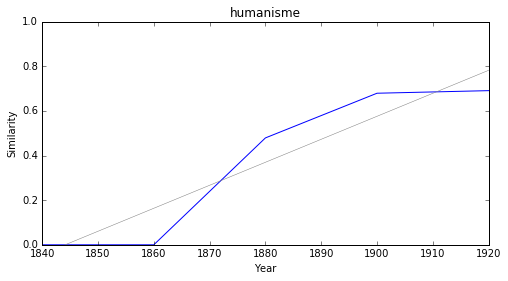

éthique


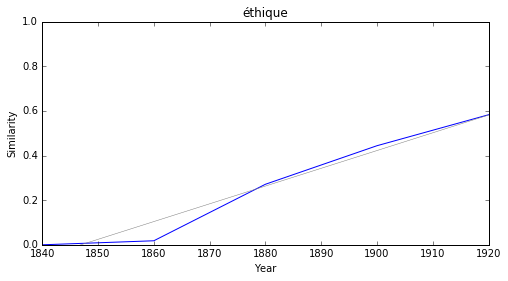

survivance


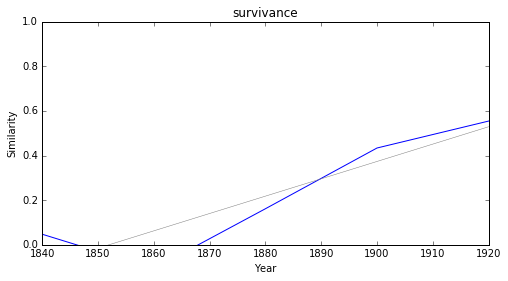

symboliste


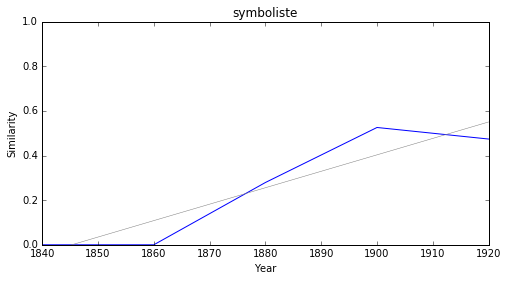

orientation


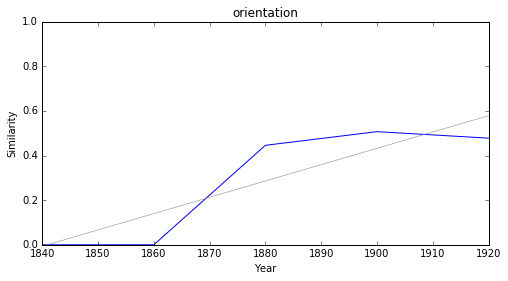

adaptation


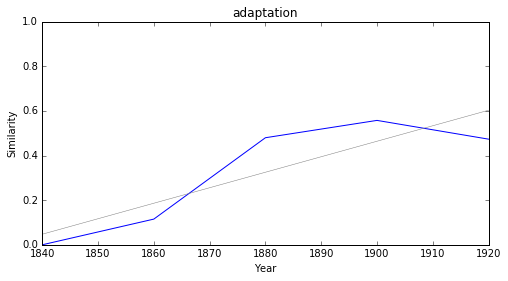

apport


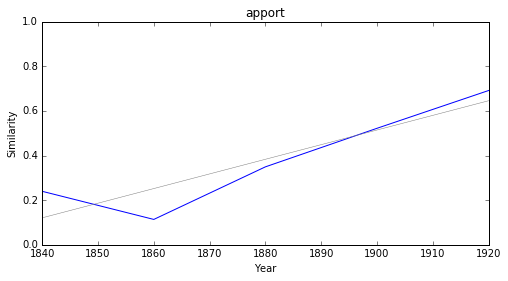

romanisation


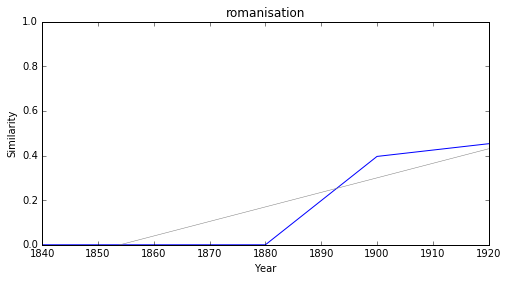

évolutionniste


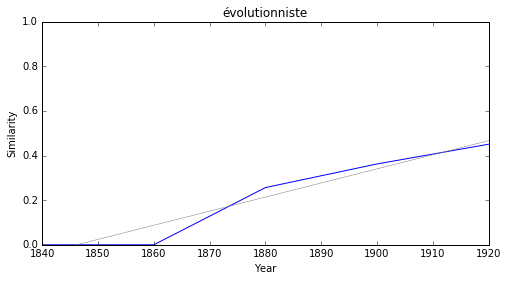

vulgarisation


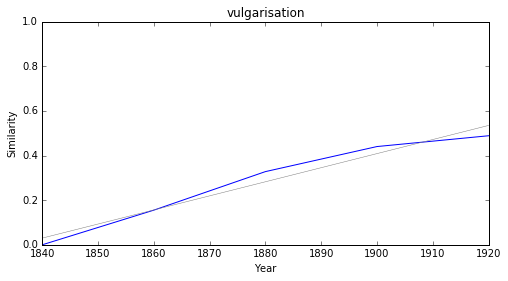

### <i><b>droit</i></b>

           token     slope         p
16    catholique  0.005987  0.007488
0   déterminisme  0.005564  0.042210
6        salaire  0.005346  0.022856
21      majorité  0.004181  0.039357
15         pacte  0.004011  0.044497
20       miracle  0.003739  0.046563
1     théoricien  0.003616  0.036333
8     uniquement  0.002440  0.029501
17    territoire  0.002409  0.024115
7          moyen  0.002180  0.038991



catholique


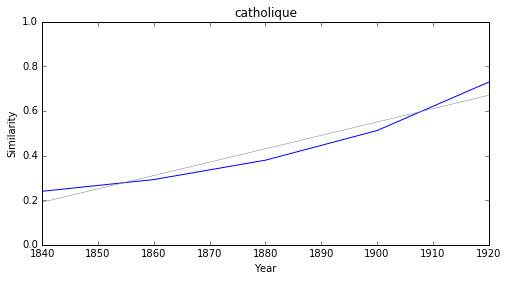

déterminisme


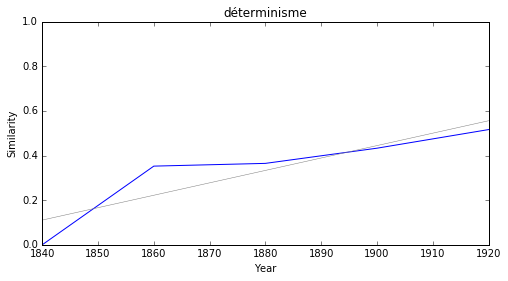

salaire


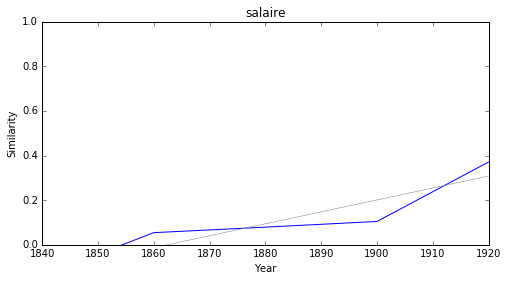

majorité


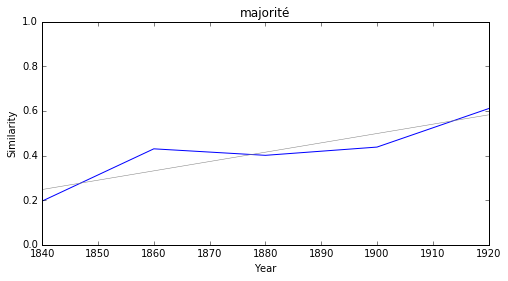

pacte


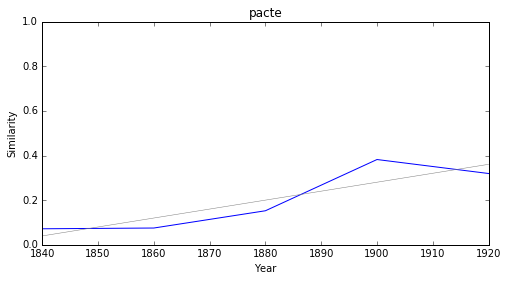

miracle


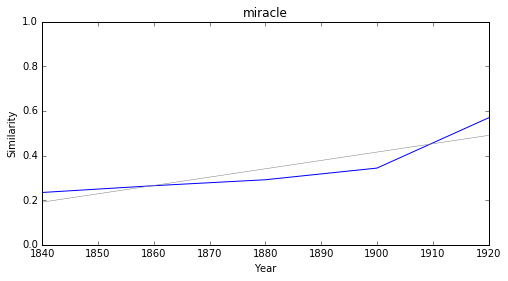

théoricien


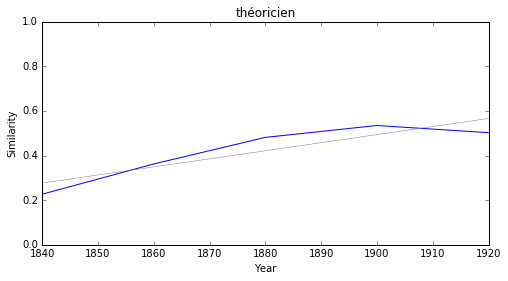

uniquement


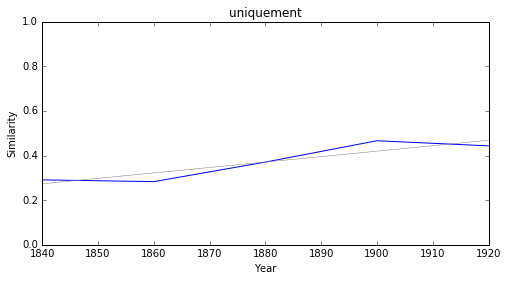

territoire


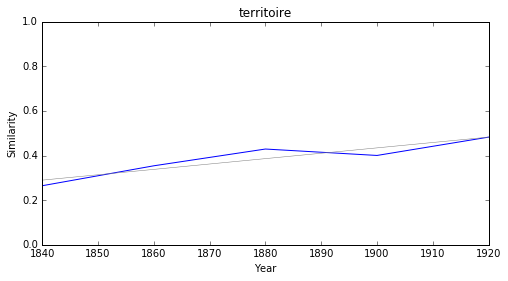

moyen


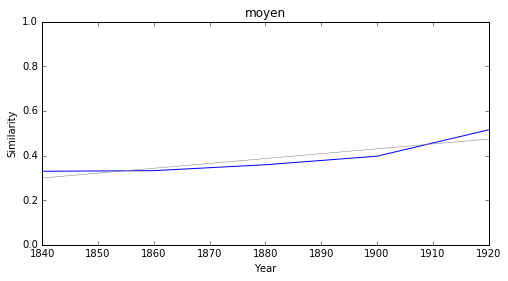

### <i><b>loi</i></b>

           token     slope         p
25        apport  0.006558  0.032944
9        concept  0.006020  0.011972
22    catholique  0.005987  0.007488
0   déterminisme  0.005564  0.042210
7      conscient  0.005300  0.007511
19   objectivité  0.005062  0.015460
4        facteur  0.004927  0.041870
29      majorité  0.004181  0.039357
20   inconscient  0.004128  0.024516
18         pacte  0.004011  0.044497



apport


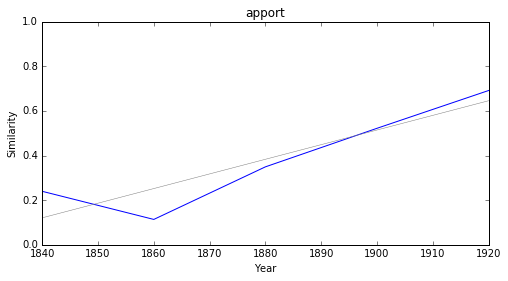

concept


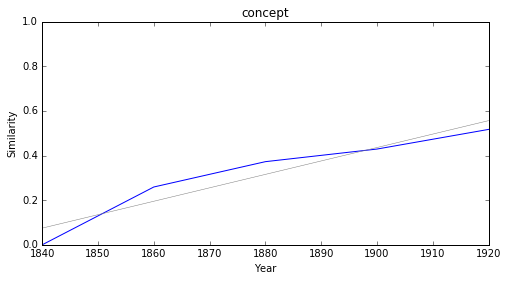

catholique


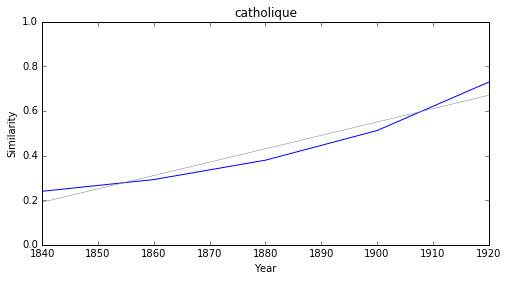

déterminisme


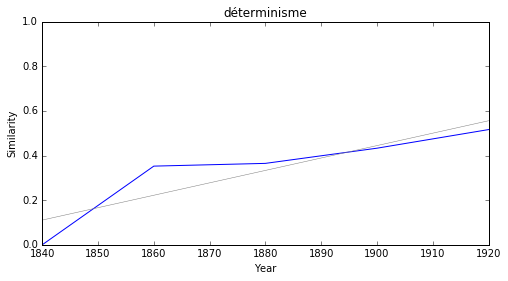

conscient


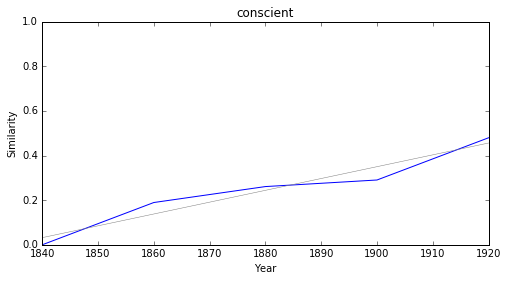

objectivité


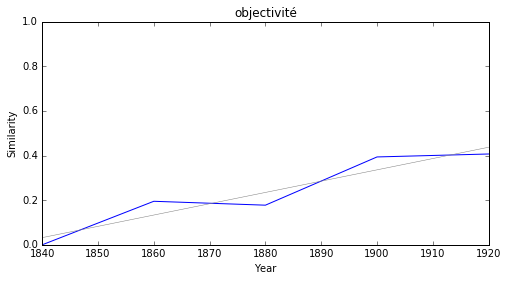

facteur


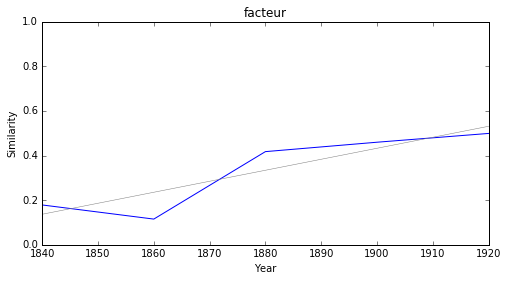

majorité


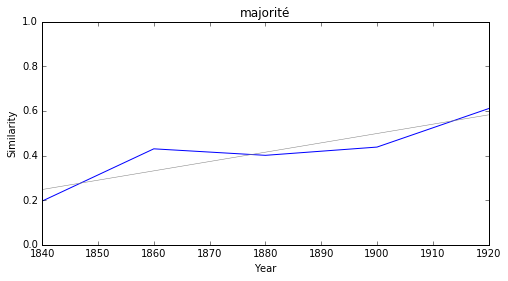

inconscient


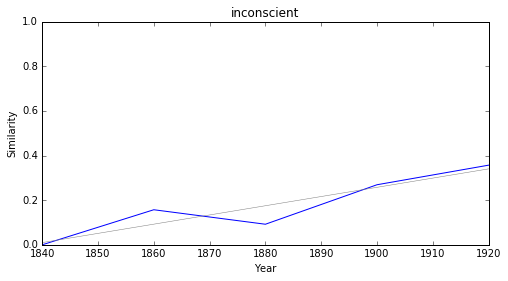

pacte


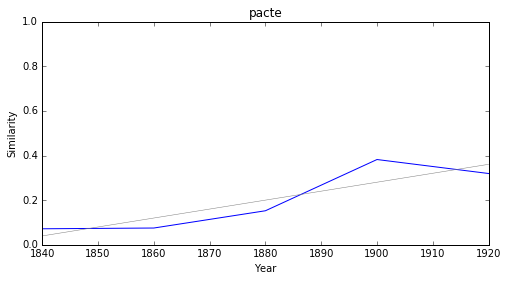

### <i><b>méthode</i></b>

            token     slope         p
28  professionnel  0.008294  0.001361
13        éthique  0.007957  0.003634
2     orientation  0.007313  0.047529
20     adaptation  0.006944  0.049543
24         apport  0.006558  0.032944
9         concept  0.006020  0.011972
0    déterminisme  0.005564  0.042210
7       conscient  0.005300  0.007511
18    objectivité  0.005062  0.015460
5           thèse  0.003912  0.001754



professionnel


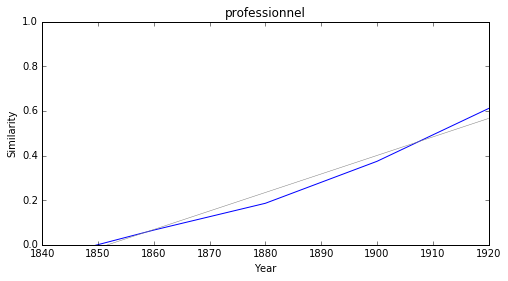

éthique


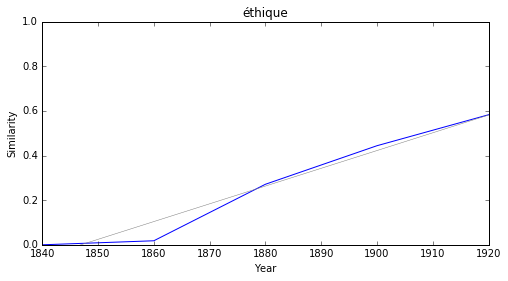

orientation


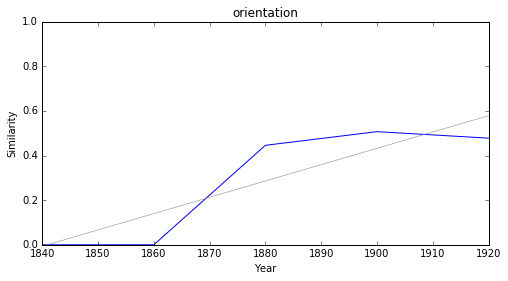

adaptation


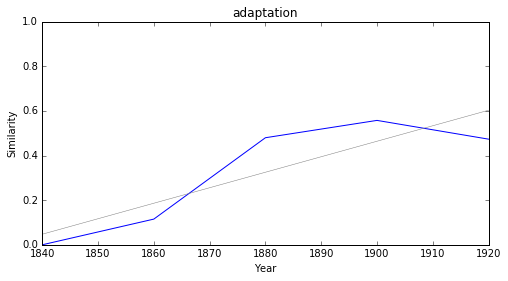

apport


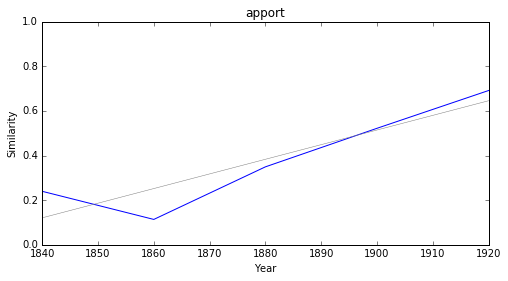

concept


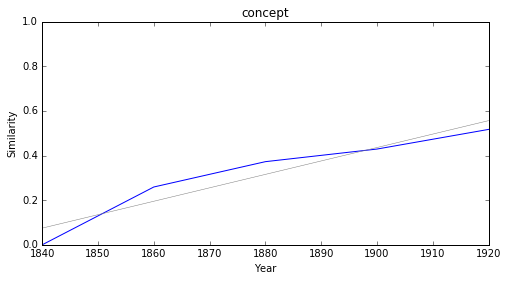

déterminisme


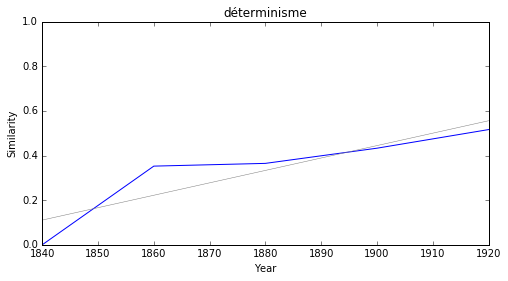

conscient


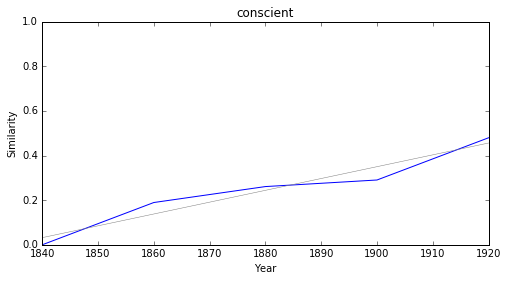

objectivité


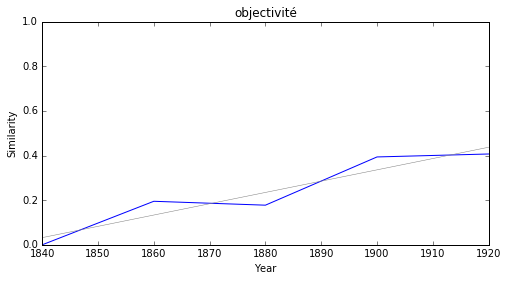

thèse


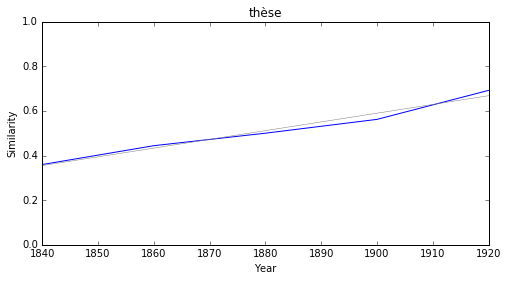

### <i><b>génie</i></b>

            token     slope         p
40  professionnel  0.008294  0.001361
31         apport  0.006558  0.032944
14        concept  0.006020  0.011972
0    déterminisme  0.005564  0.042210
12      conscient  0.005300  0.007511
27   déséquilibre  0.005057  0.016964
22     pessimisme  0.003924  0.031815
26        lyrisme  0.003805  0.023351
36        miracle  0.003739  0.046563
5      romantique  0.003671  0.032306



professionnel


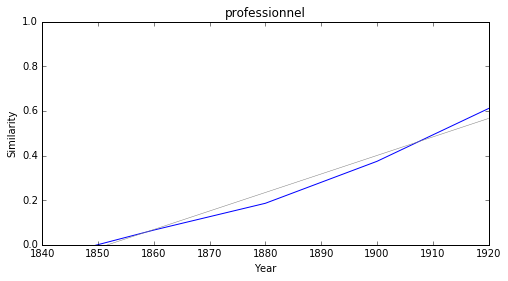

apport


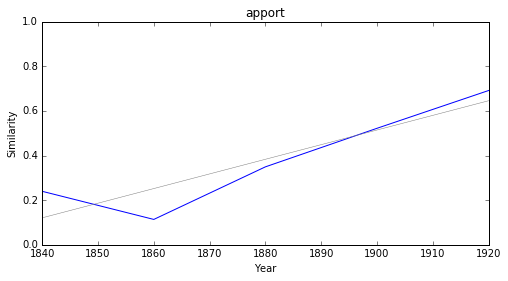

concept


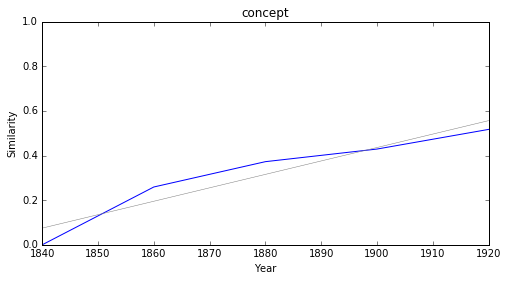

déterminisme


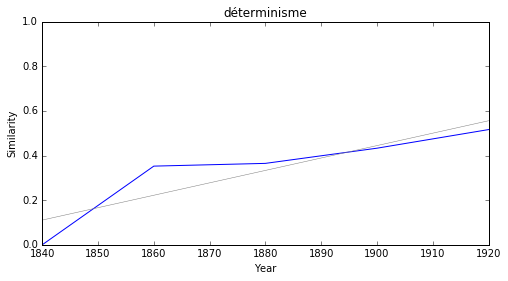

conscient


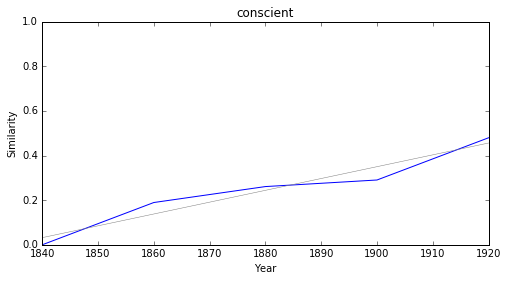

déséquilibre


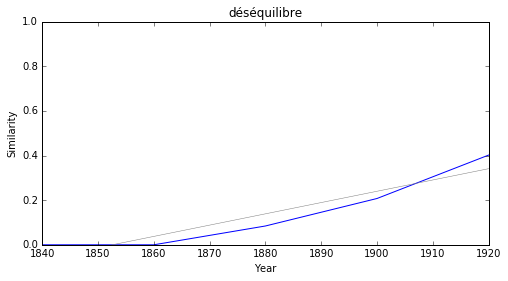

pessimisme


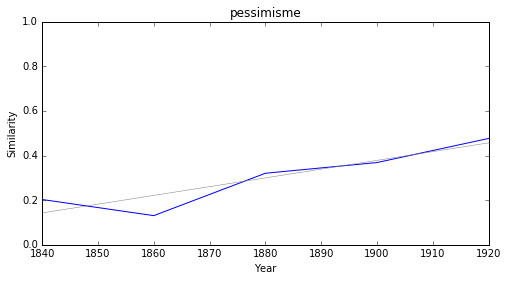

lyrisme


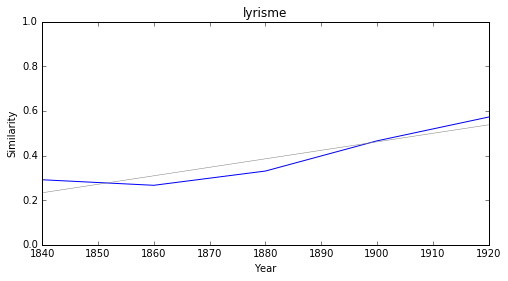

miracle


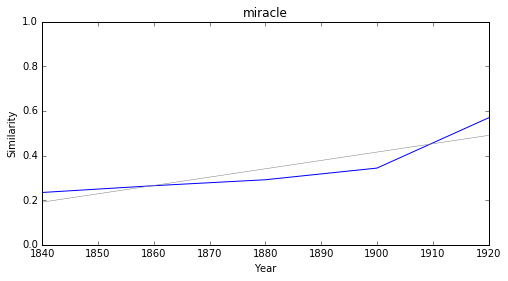

romantique


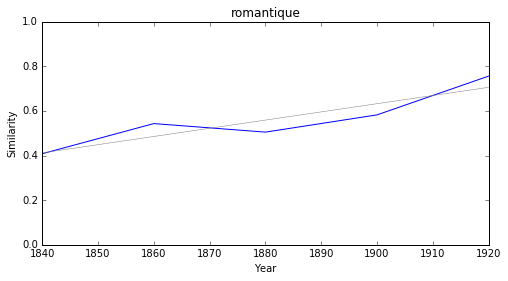

### <i><b>romantisme</i></b>

            token     slope         p
9       humanisme  0.010302  0.019004
70  professionnel  0.008294  0.001361
30     survivance  0.007773  0.036709
50     symboliste  0.007367  0.022680
51         ecrits  0.006570  0.032844
57         apport  0.006558  0.032944
61         manuel  0.006177  0.015870
19        concept  0.006020  0.011972
45     catholique  0.005987  0.007488
74            néo  0.005939  0.040721



humanisme


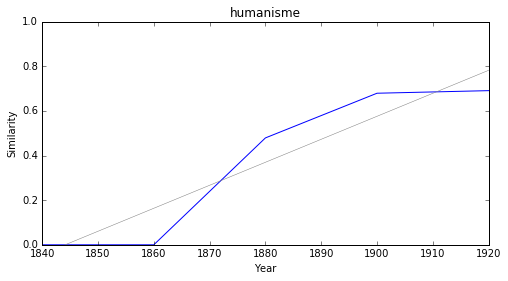

professionnel


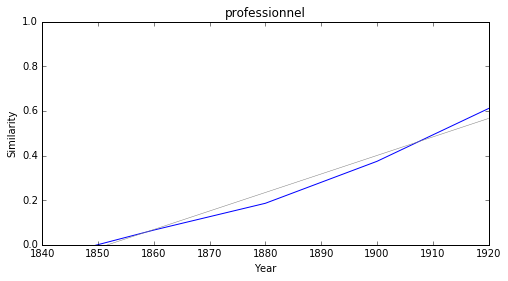

survivance


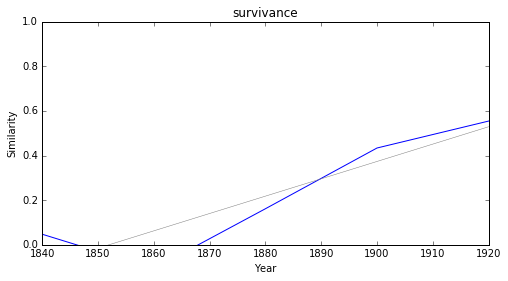

symboliste


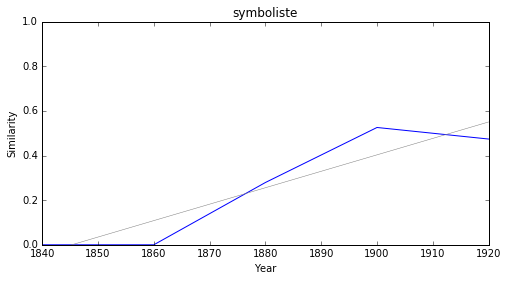

ecrits


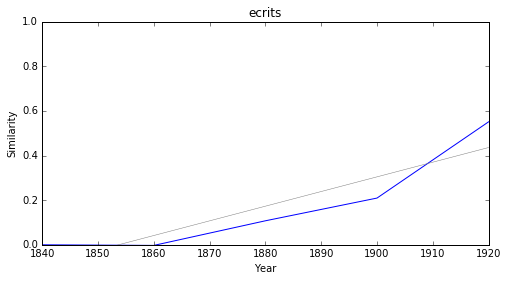

apport


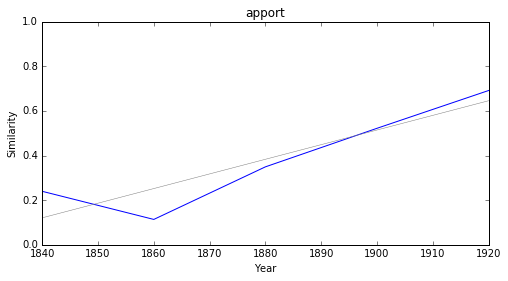

manuel


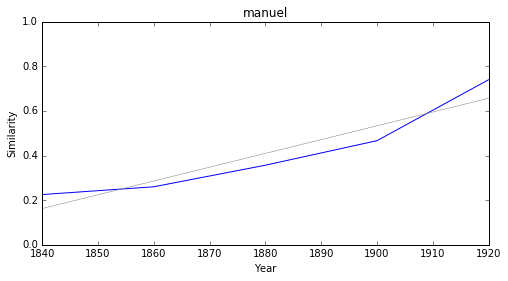

concept


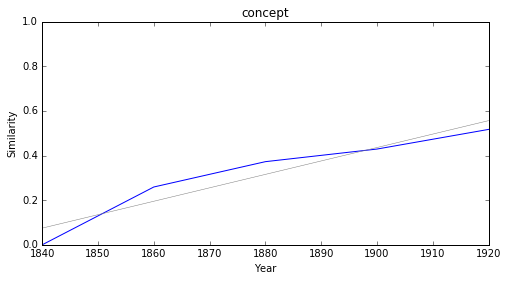

catholique


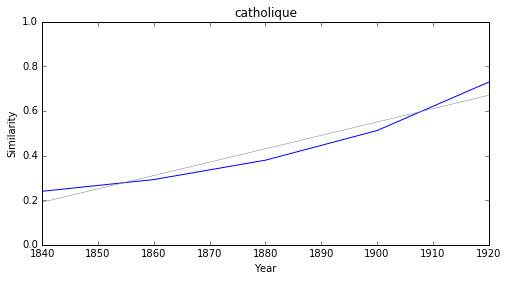

néo


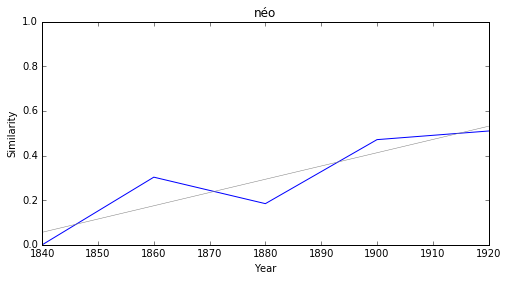

### <i><b>réalisme</i></b>

              token     slope         p
20        humanisme  0.010302  0.019004
54       survivance  0.007773  0.036709
6       orientation  0.007313  0.047529
68       adaptation  0.006944  0.049543
84           apport  0.006558  0.032944
37   évolutionniste  0.006317  0.007741
0   instrumentation  0.006056  0.017826
42         immanent  0.006042  0.012416
38          concept  0.006020  0.011972
46         médiéval  0.006012  0.006523



humanisme


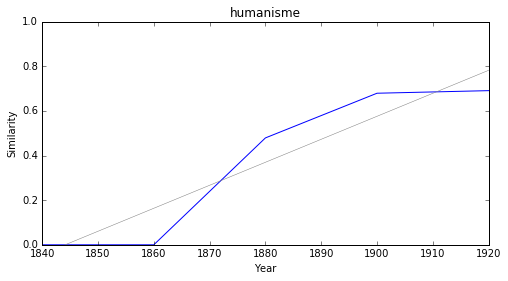

survivance


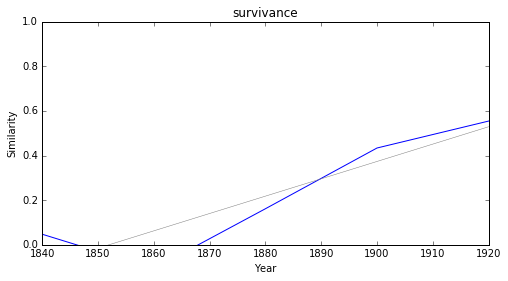

orientation


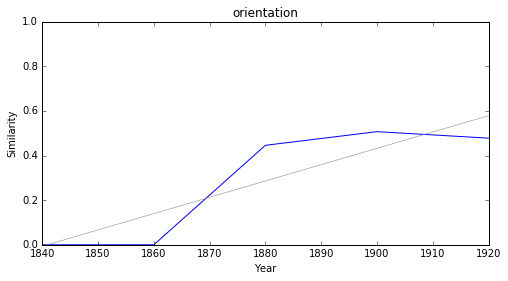

adaptation


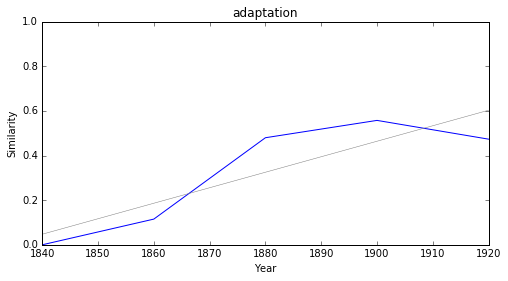

apport


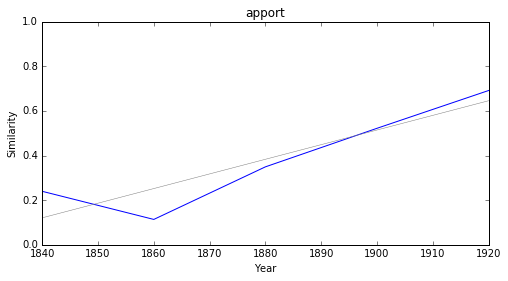

évolutionniste


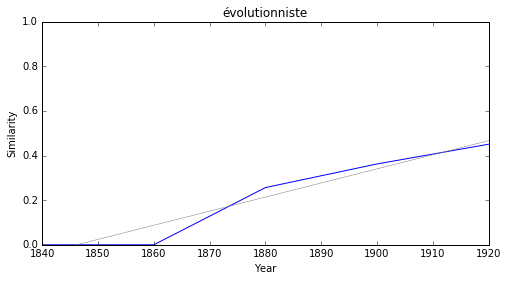

instrumentation


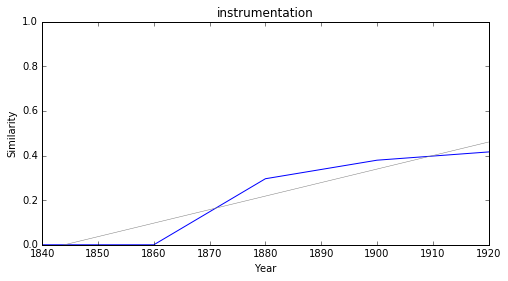

immanent


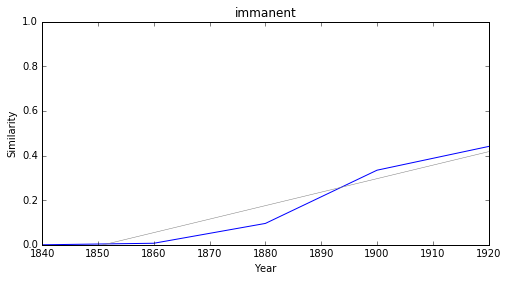

concept


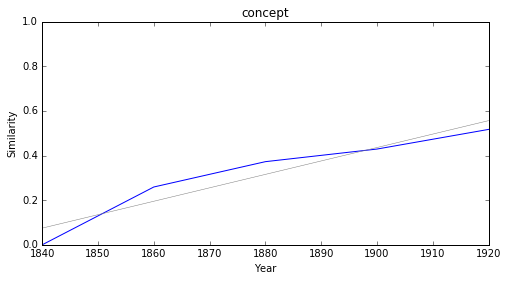

médiéval


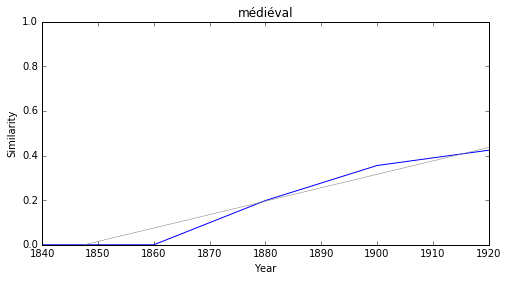

### <i><b>symbolisme</i></b>

           token     slope         p
17     humanisme  0.010302  0.019004
24      parangon  0.007504  0.025820
64    symboliste  0.007367  0.022680
5    orientation  0.007313  0.047529
55    adaptation  0.006944  0.049543
28       concept  0.006020  0.011972
84           néo  0.005939  0.040721
79  sociologique  0.005857  0.009088
19  nationalisme  0.005781  0.017793
85   déformation  0.005659  0.032169



humanisme


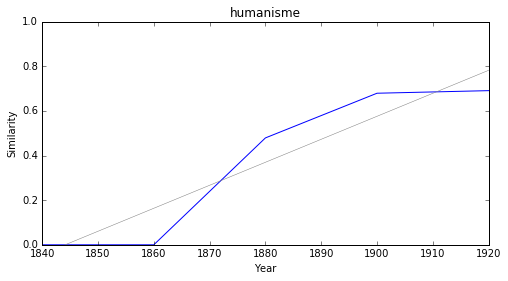

parangon


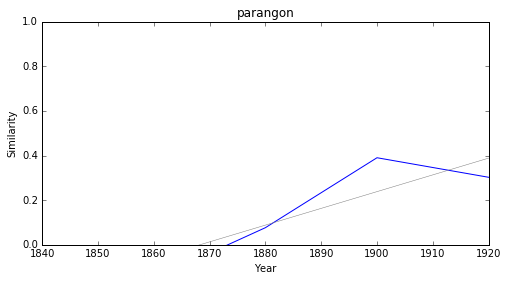

symboliste


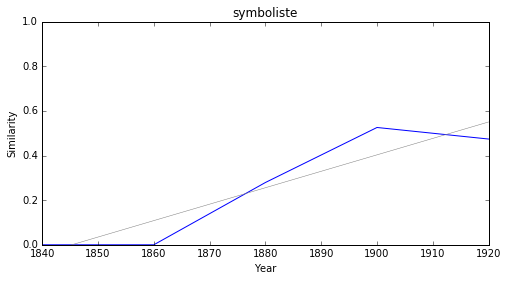

orientation


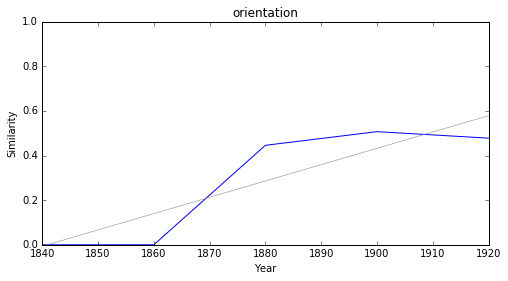

adaptation


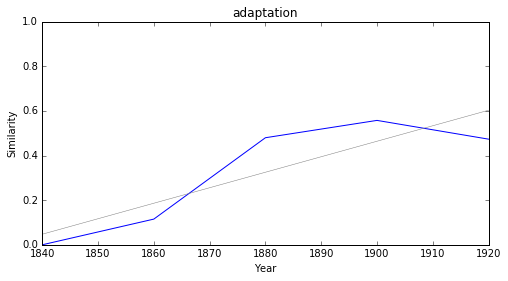

concept


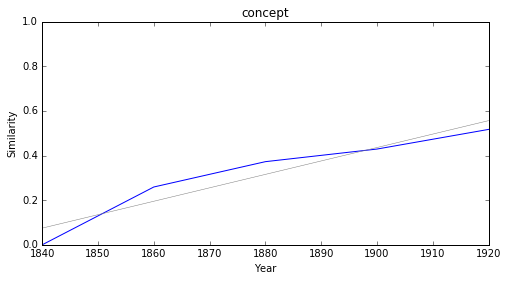

néo


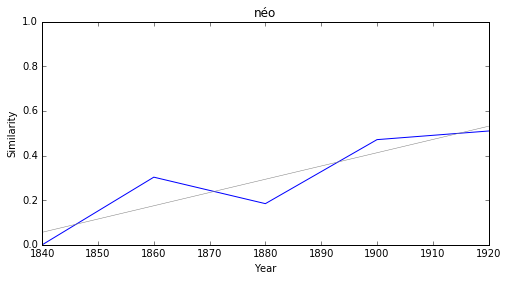

sociologique


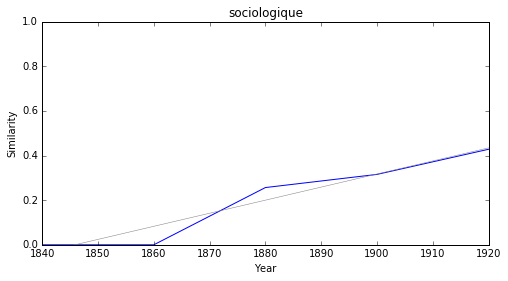

nationalisme


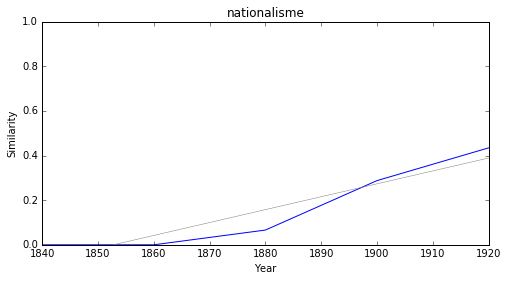

déformation


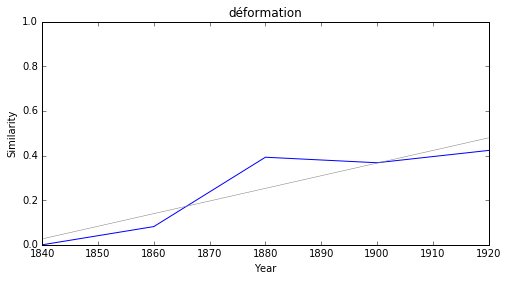

### <i><b>naturalisme</i></b>

              token     slope         p
17        humanisme  0.010302  0.019004
7       orientation  0.007313  0.047529
69       adaptation  0.006944  0.049543
37   évolutionniste  0.006317  0.007741
43         immanent  0.006042  0.012416
38          concept  0.006020  0.011972
99              néo  0.005939  0.040721
96     sociologique  0.005857  0.009088
23     nationalisme  0.005781  0.017793
101     déformation  0.005659  0.032169



humanisme


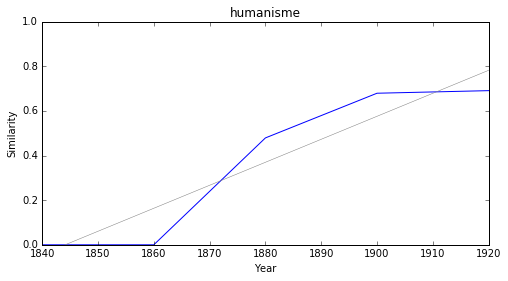

orientation


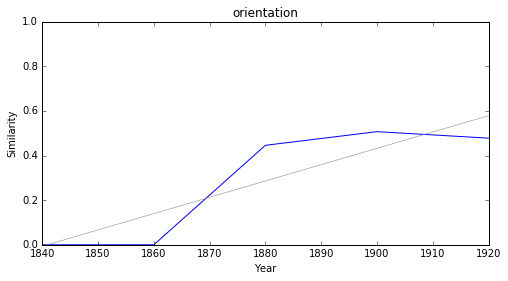

adaptation


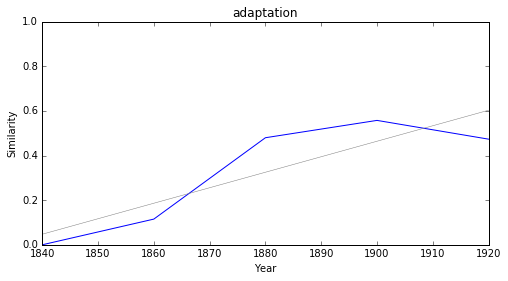

évolutionniste


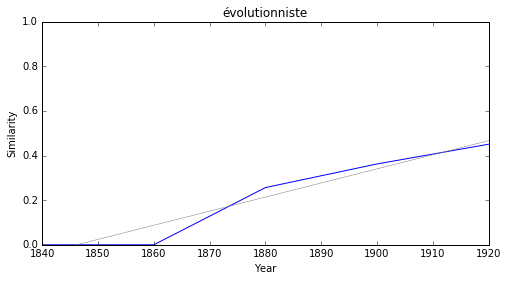

immanent


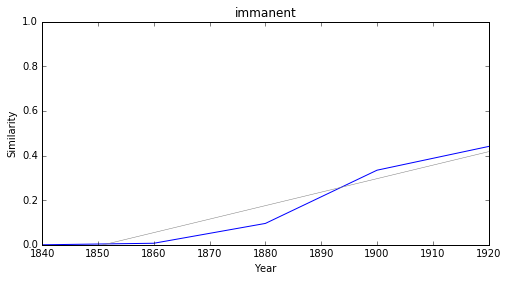

concept


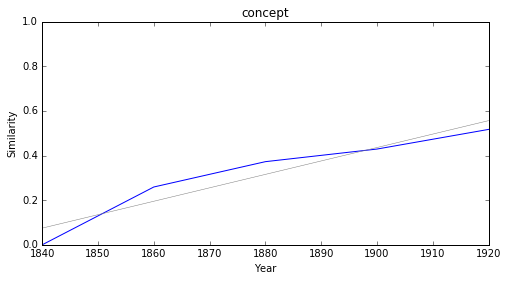

néo


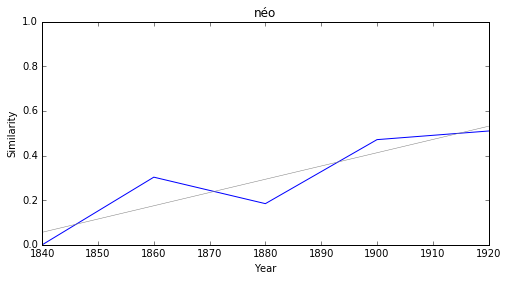

sociologique


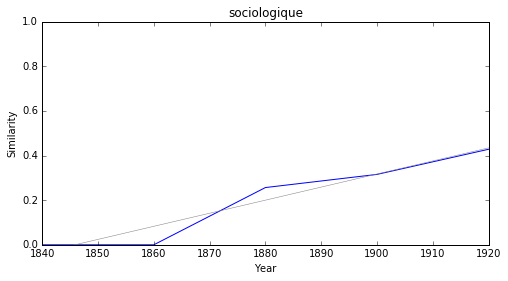

nationalisme


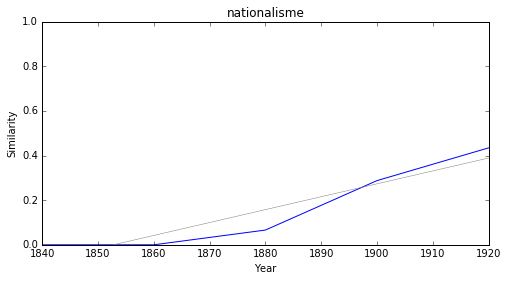

déformation


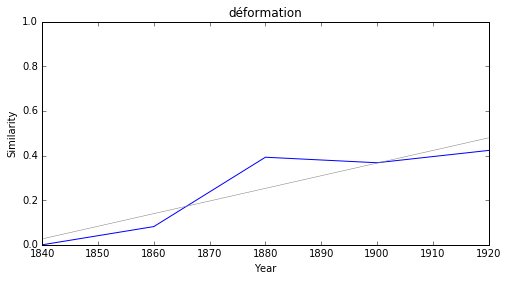

In [192]:
import pandas as pd
from IPython.display import Markdown, display
pd.set_option('display.max_rows', 1000)

for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df1 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df1.sort_values('slope', ascending=False).head(10))
    print('\n\n')
    
    for i, row in df1.sort_values('slope', ascending=False).head(10).iterrows():
        plot_cosine_series('littérature', row['token'], 8, 4)

humanisme


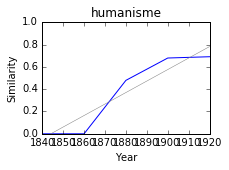

orientation


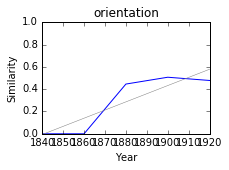

adaptation


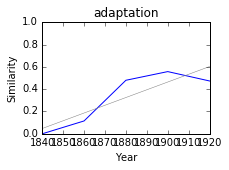

évolutionniste


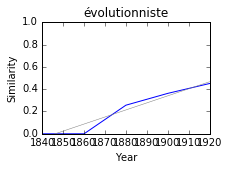

immanent


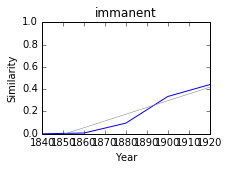

concept


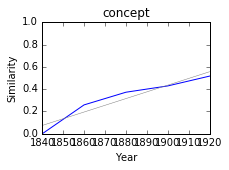

néo


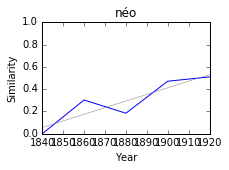

sociologique


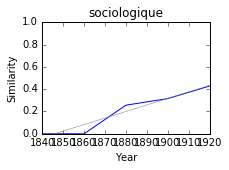

nationalisme


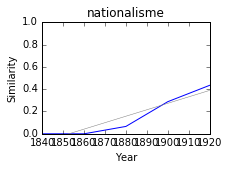

déformation


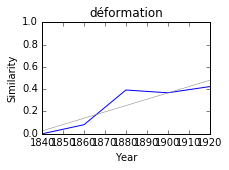

déterminisme


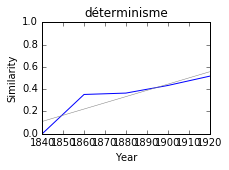

impersonnalité


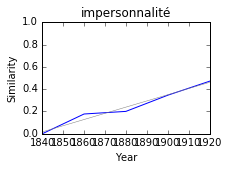

thomiste


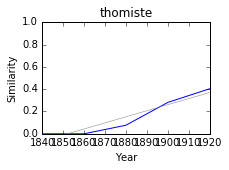

subconscient


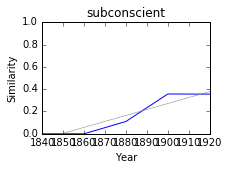

conformisme


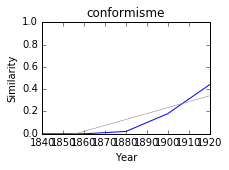

réaliste


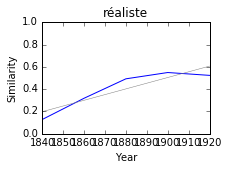

coexistence


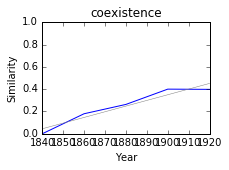

fonctionnement


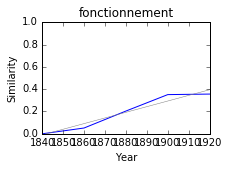

gland


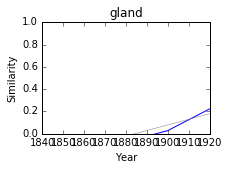

facteur


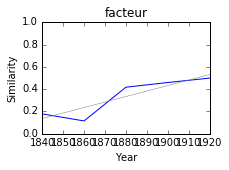

In [193]:
for i, row in df1.sort_values('slope', ascending=False).head(20).iterrows():
    plot_cosine_series('littérature', row['token'], 3, 2)

# Decreasing

This is the same process here : we want to see which terms tend to <b>disassociate</b> themselves from "littérature" (by default, which you can change with the trained models). Then again, you have to check the p values. "transplantation", "choeur" and "philé" are not considered significant, "chaldéen" is, and "destination", "morceau", etc. are as well. The fact that those are less significant is logical : the fewer the terms, the more erratic their series tend to be.

### <i><b>littérature</i></b>

          token     slope         p
9    naturalisé -0.004513  0.042377
23  théologique -0.003168  0.017397
2      barbarie -0.003002  0.020017
40     monument -0.002199  0.010337
7   comparaison -0.002012  0.041023
36         goût -0.001436  0.022249
24      domaine  0.001052  0.005780
13      utilité  0.001188  0.040852
16   prétention  0.001296  0.034148
18        revue  0.001511  0.012991



humanisme


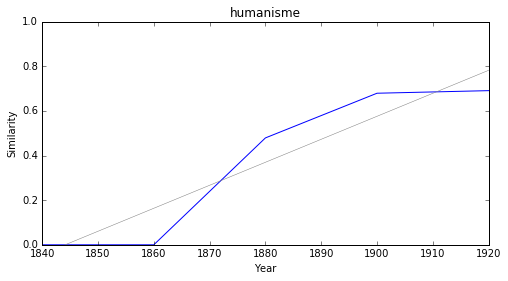

professionnel


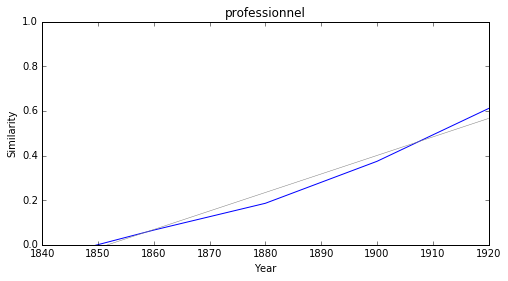

éthique


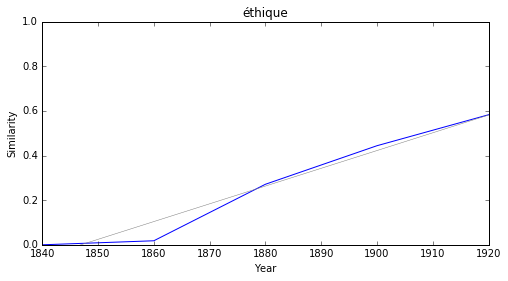

symboliste


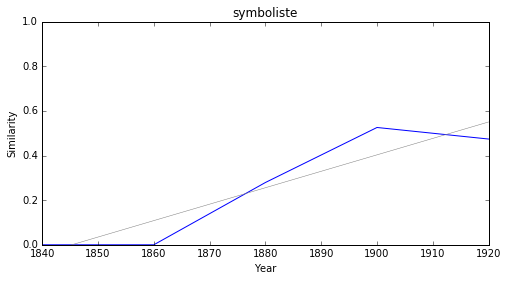

orientation


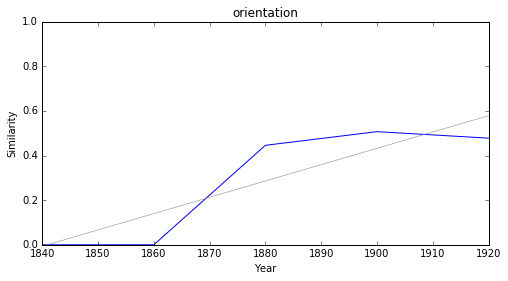

adaptation


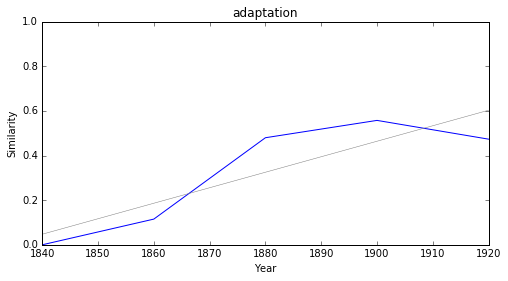

apport


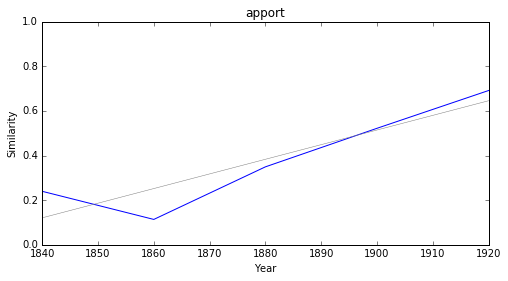

manuel


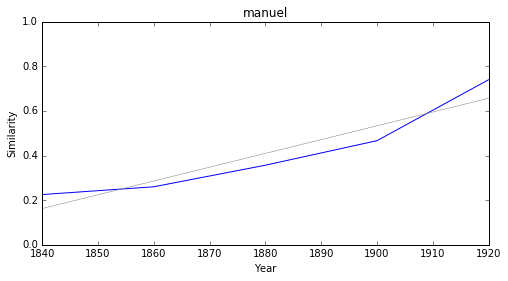

catholique


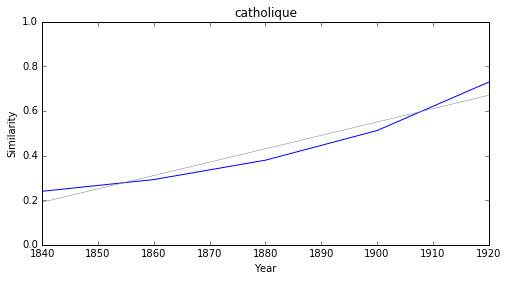

réaliste


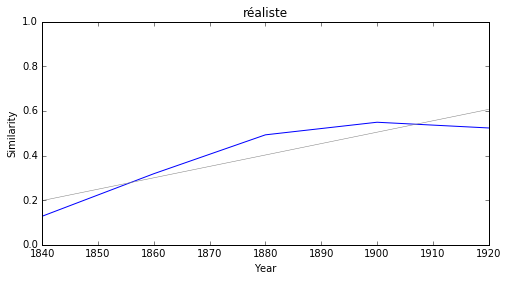

### <i><b>poésie</i></b>

            token     slope         p
10          haydn -0.006210  0.029317
40           lied -0.004905  0.036744
34         idylle -0.004198  0.015530
4       cervantes -0.004003  0.022144
45         sonnet -0.003838  0.003141
18           naïf -0.003521  0.022573
49         élégie -0.003516  0.026233
32        curieux -0.003188  0.009404
25    théologique -0.003168  0.017397
8   véritablement -0.002781  0.027337



humanisme


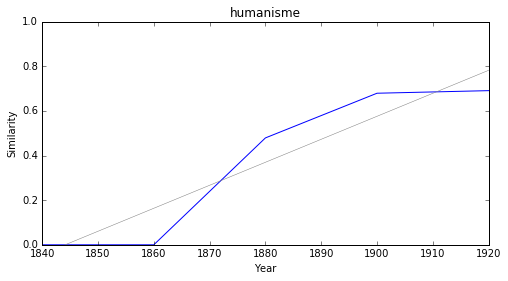

professionnel


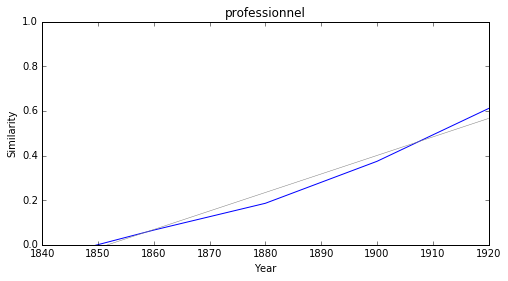

éthique


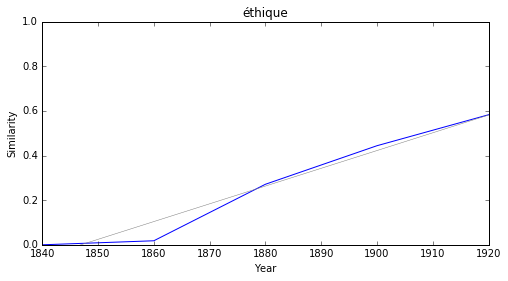

symboliste


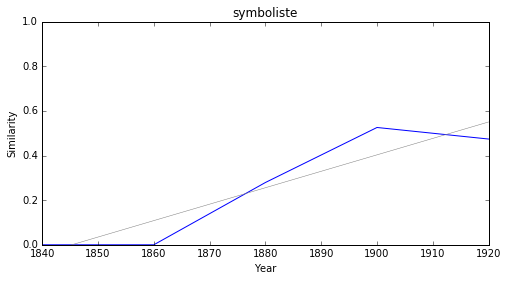

orientation


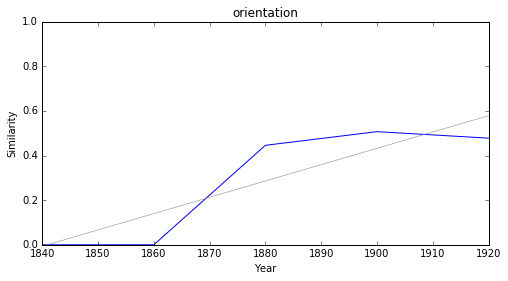

adaptation


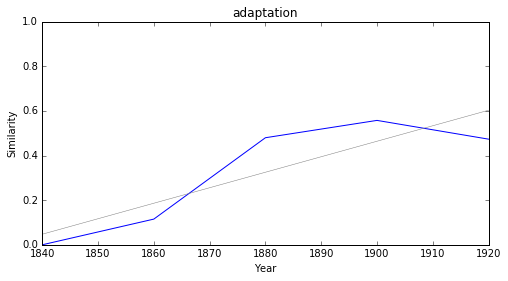

ecrits


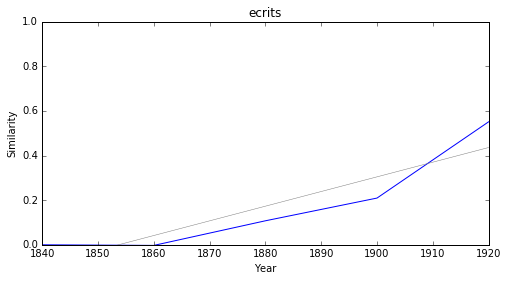

apport


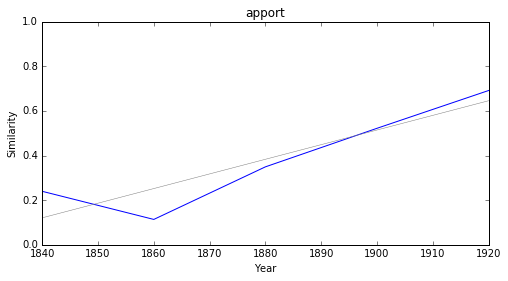

concept


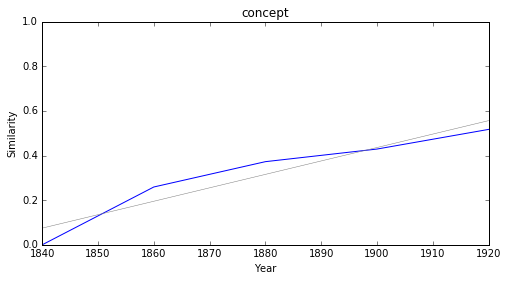

conscient


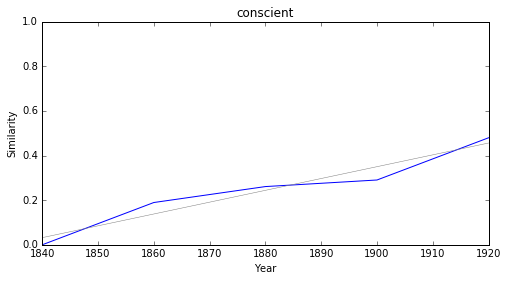

### <i><b>science</i></b>

               token     slope         p
3      physiologique -0.003338  0.019118
21       théologique -0.003168  0.017397
7        comparaison -0.002012  0.041023
31         ressource -0.001504  0.009807
29  affranchissement -0.001287  0.041211
26          négation  0.000728  0.018132
22           domaine  0.001052  0.005780
9        association  0.001079  0.022985
12           utilité  0.001188  0.040852
17        prétention  0.001296  0.034148



humanisme


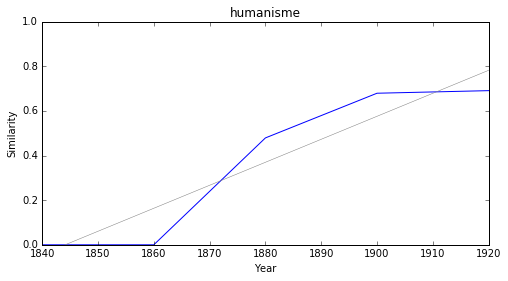

professionnel


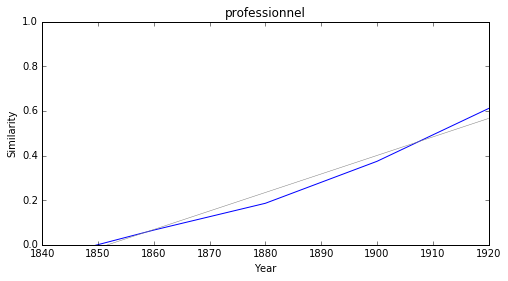

éthique


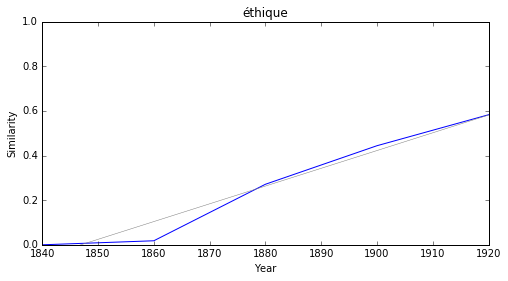

adaptation


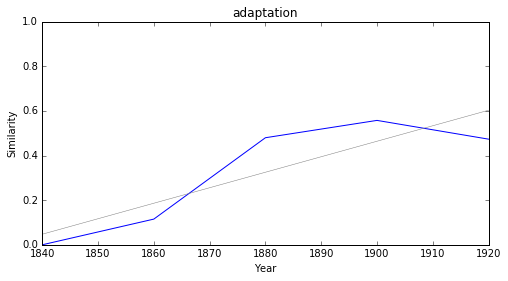

apport


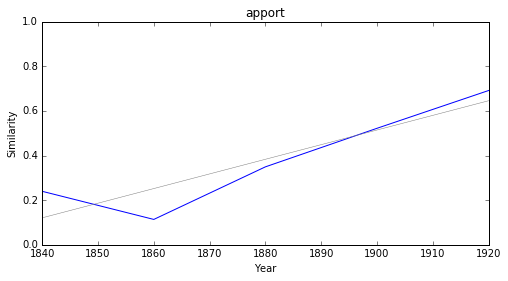

manuel


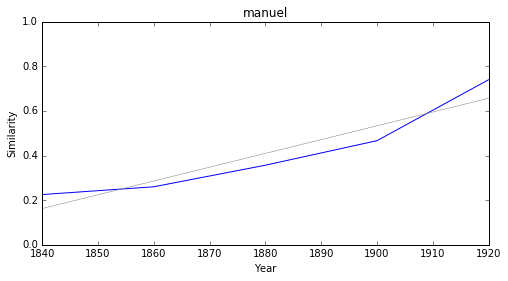

concept


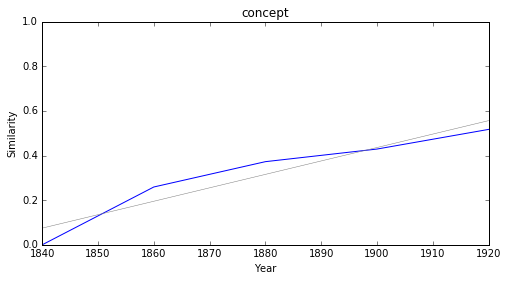

catholique


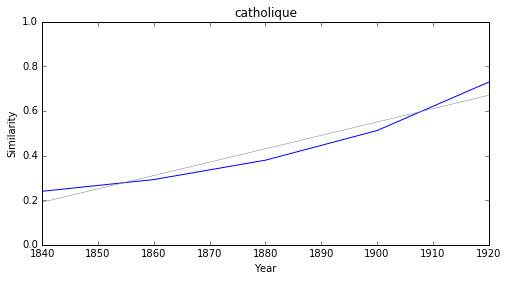

déterminisme


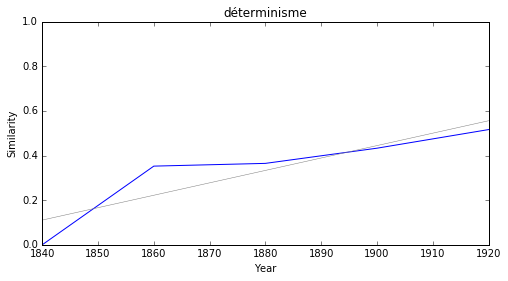

majorité


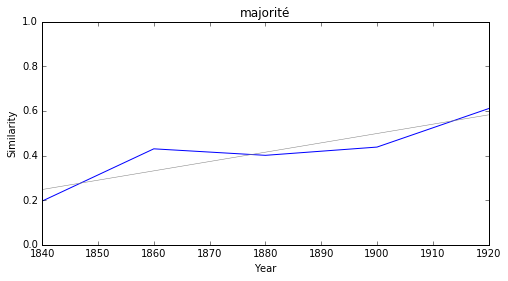

### <i><b>savoir</i></b>

            token     slope         p
13      spécifier -0.003364  0.048046
1       réfléchir -0.003284  0.030711
4     embarrasser -0.002848  0.018916
3   véritablement -0.002781  0.027337
0           envie -0.002764  0.016561
10       regarder -0.002592  0.005209
14        admirer -0.002447  0.034599
8         écouter -0.002370  0.029324
15            oui -0.002151  0.049503
12         défini  0.001105  0.014490



visé


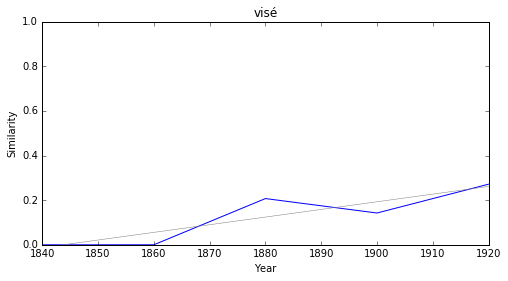

pâtisser


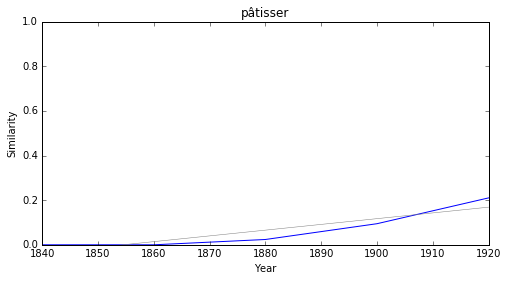

défier


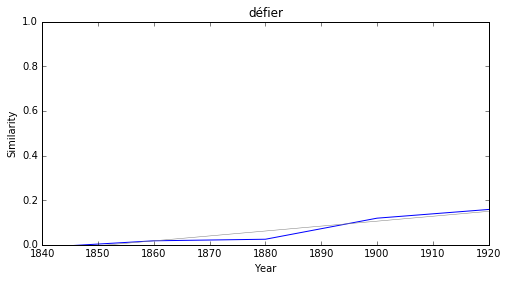

suspecter


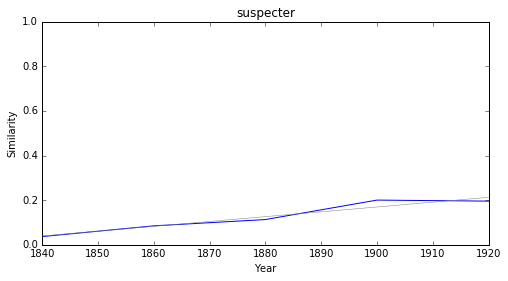

perturber


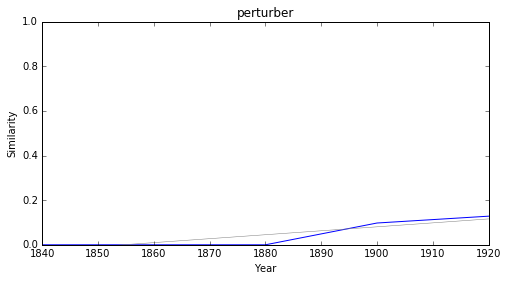

méconnaître


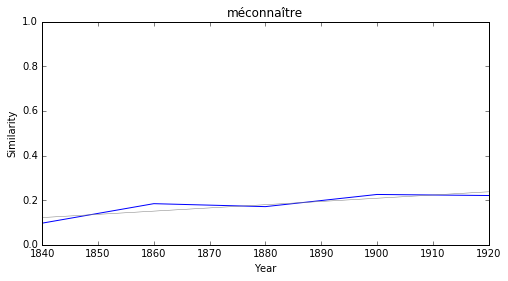

prétention


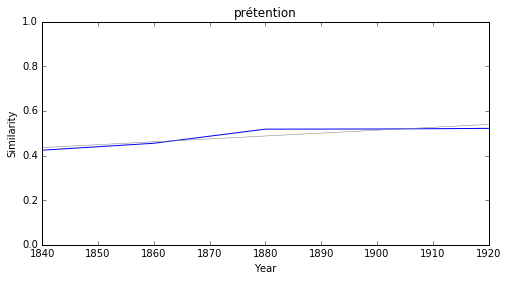

défini


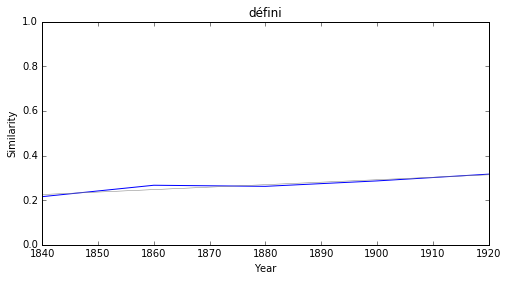

oui


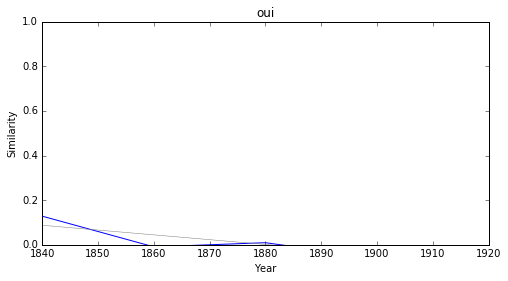

écouter


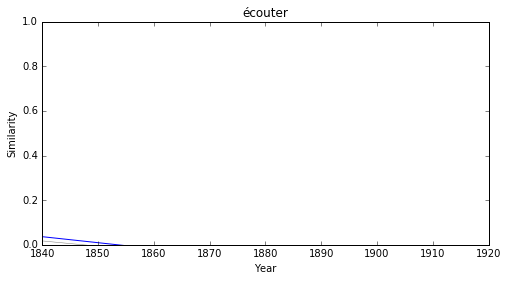

### <i><b>histoire</i></b>

            token     slope         p
31  métempsychose -0.006656  0.025715
8      naturalisé -0.004513  0.042377
3   physiologique -0.003338  0.019118
26        curieux -0.003188  0.009404
20    théologique -0.003168  0.017397
38       monument -0.002199  0.010337
21        domaine  0.001052  0.005780
14        utilité  0.001188  0.040852
17          revue  0.001511  0.012991
23       synthèse  0.001765  0.014498



humanisme


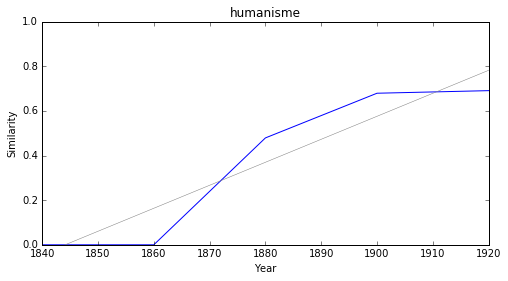

evolution


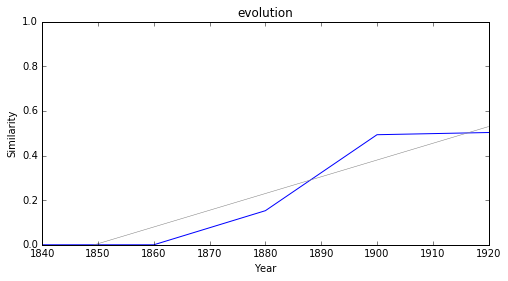

référence


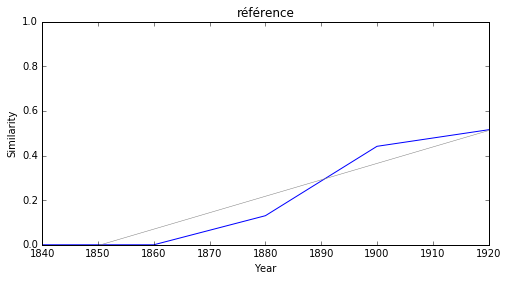

orientation


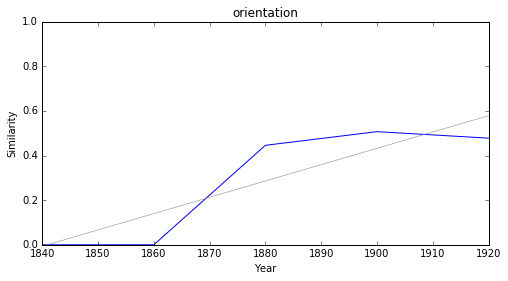

adaptation


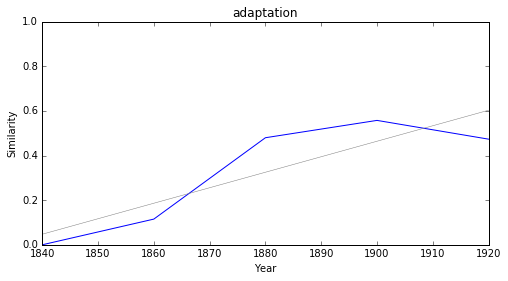

apport


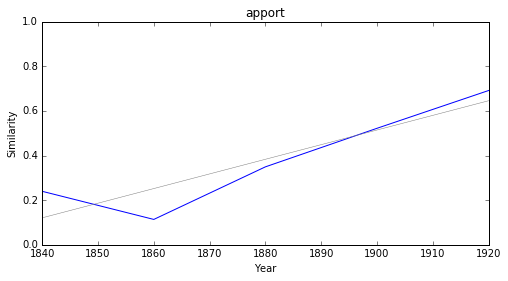

manuel


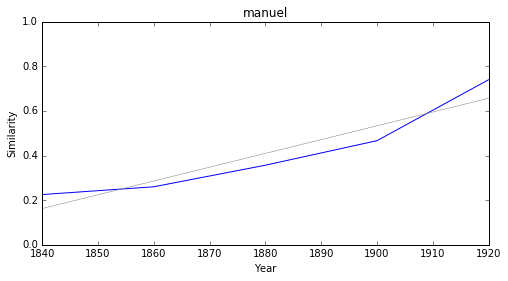

catholique


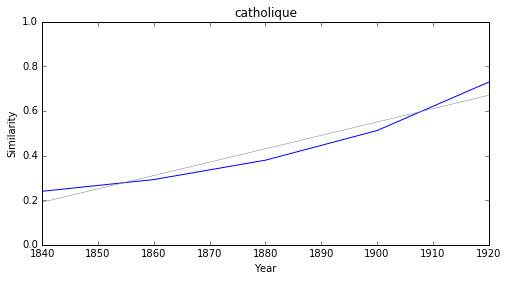

vauquelin


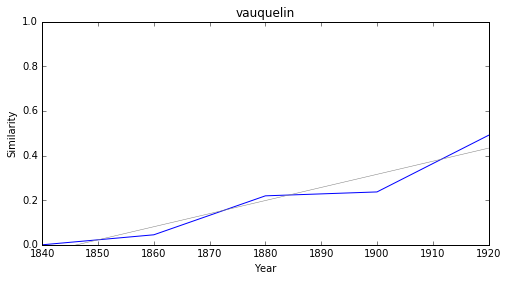

réédition


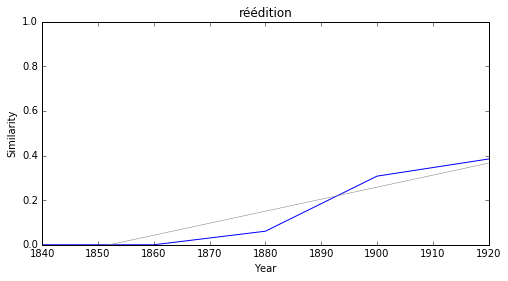

### <i><b>philosophie</i></b>

               token     slope         p
3      physiologique -0.003338  0.019118
25       théologique -0.003168  0.017397
4           barbarie -0.003002  0.020017
15           papauté -0.002511  0.033482
11       comparaison -0.002012  0.041023
13      souveraineté -0.001730  0.013678
38         ressource -0.001504  0.009807
35  affranchissement -0.001287  0.041211
32          négation  0.000728  0.018132
26           domaine  0.001052  0.005780



humanisme


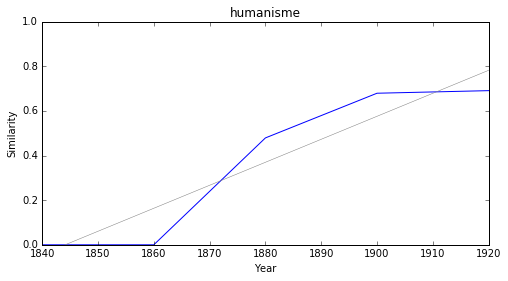

professionnel


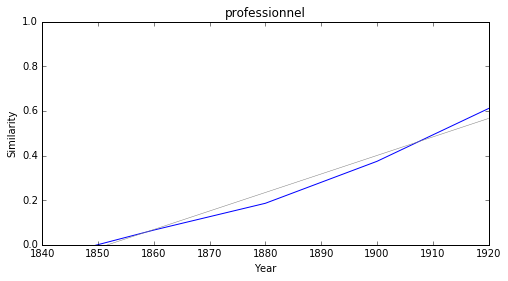

éthique


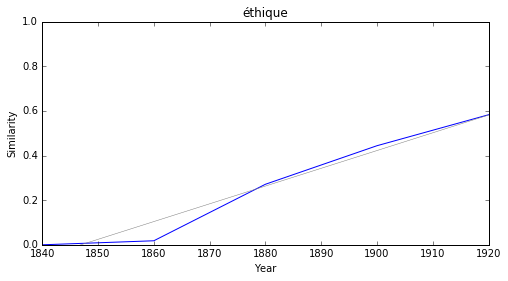

orientation


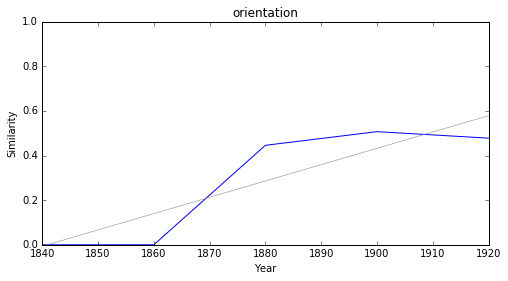

adaptation


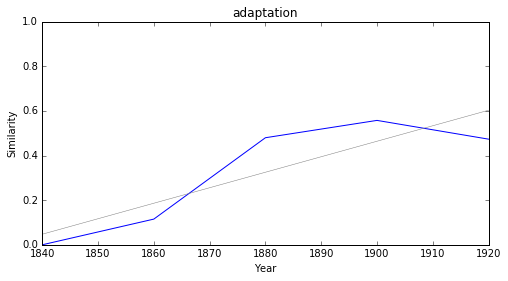

relativité


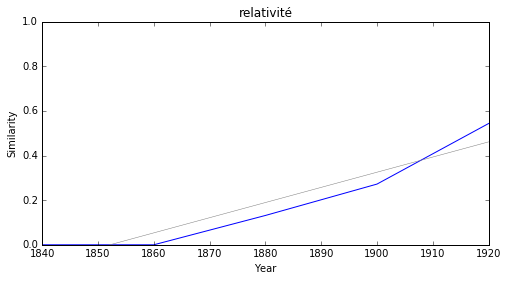

apport


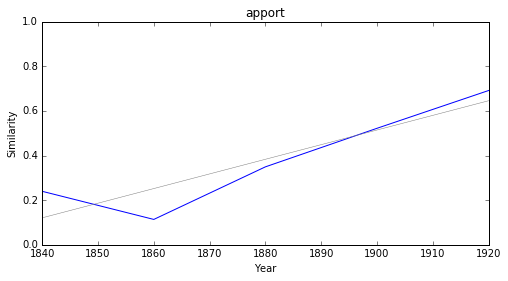

manuel


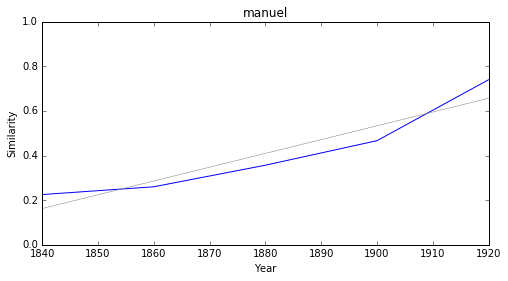

concept


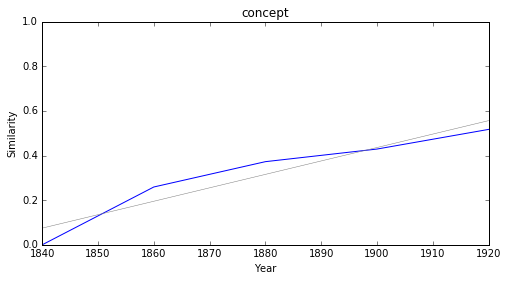

catholique


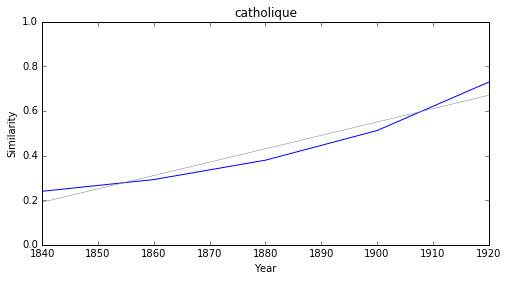

### <i><b>lettre</i></b>

        token     slope         p
4        reid -0.004147  0.003984
16    bouhier -0.003935  0.044895
23     sonnet -0.003838  0.003141
24     élégie -0.003516  0.026233
12        mom -0.002993  0.002742
5         sue -0.002718  0.030901
26   monument -0.002199  0.010337
13     agrégé -0.001755  0.003492
15  lamartine -0.001616  0.033566
2     joubert -0.001581  0.049438



aubignac


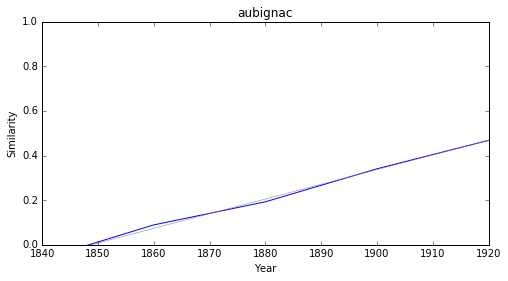

manuel


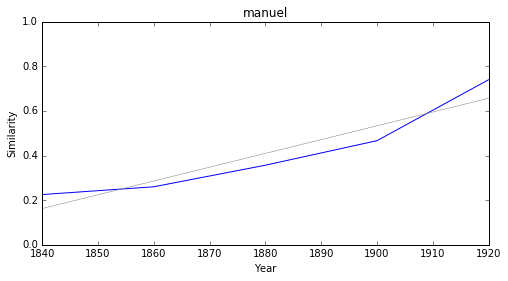

collaborer


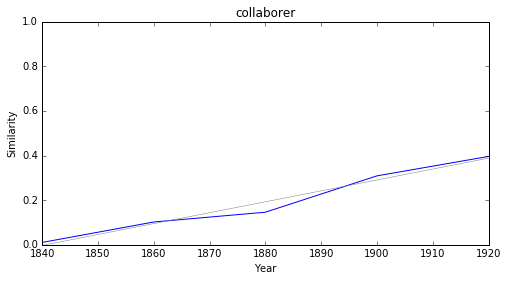

darmesteter


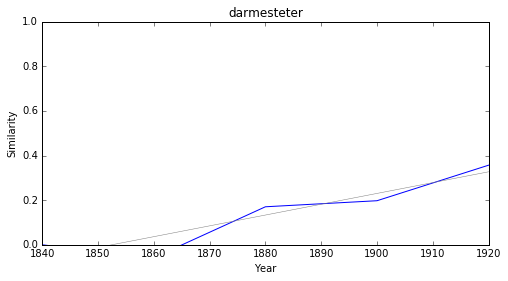

cénacle


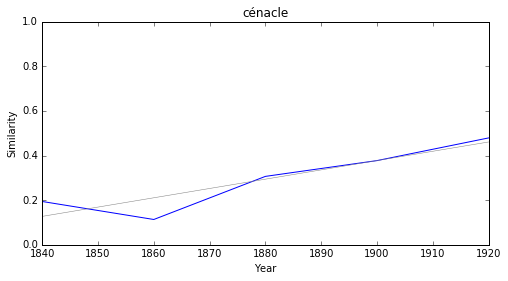

thèse


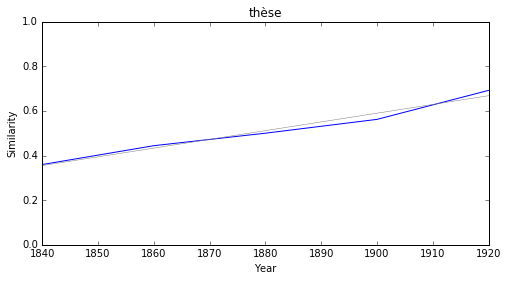

bibliographie


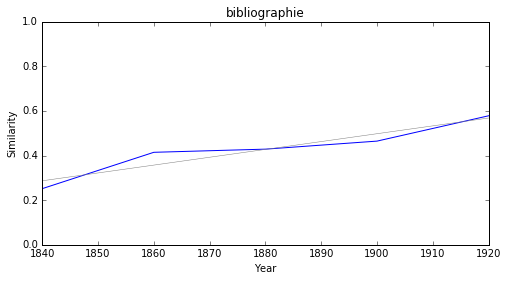

mercure


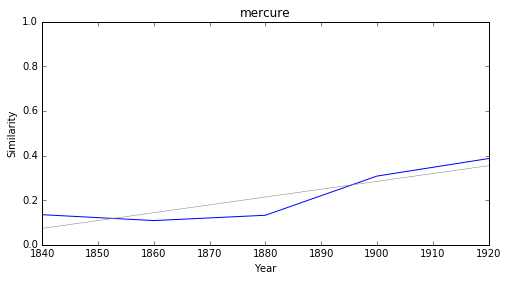

langeac


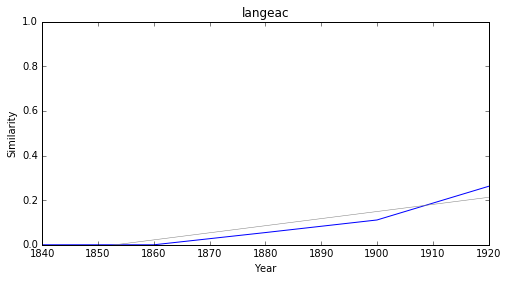

stendhal


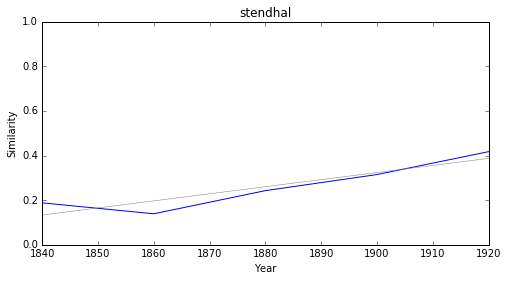

### <i><b>critique</i></b>

            token     slope         p
6       fabuliste -0.005517  0.036967
1   physiologique -0.003338  0.019118
24        curieux -0.003188  0.009404
16    théologique -0.003168  0.017397
18      induction -0.002543  0.043163
28        réfuter -0.002353  0.016774
22       corriger -0.002326  0.033348
20      judicieux -0.002171  0.037193
5     comparaison -0.002012  0.041023
33           goût -0.001436  0.022249



professionnel


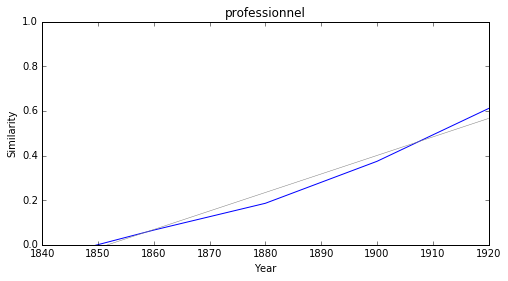

adaptation


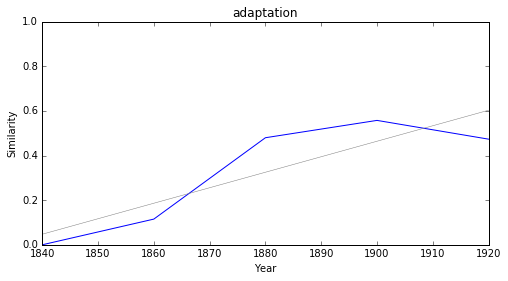

apport


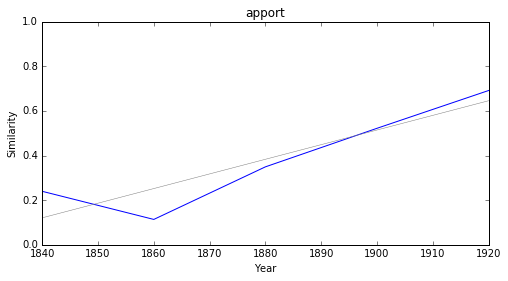

manuel


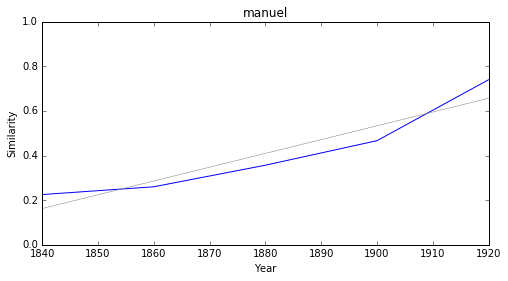

brunetière


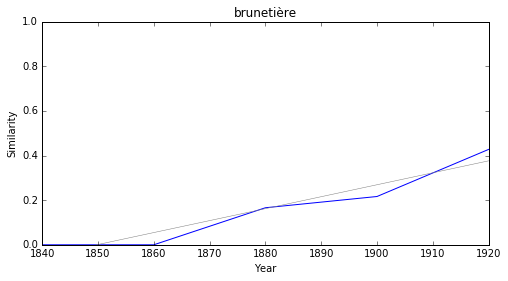

réaliste


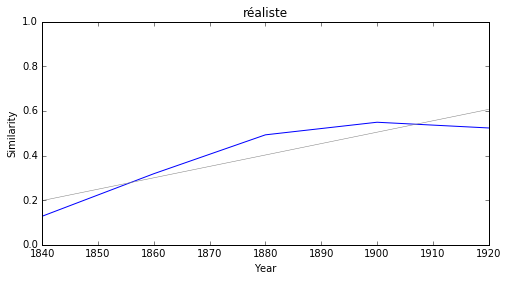

spécialiste


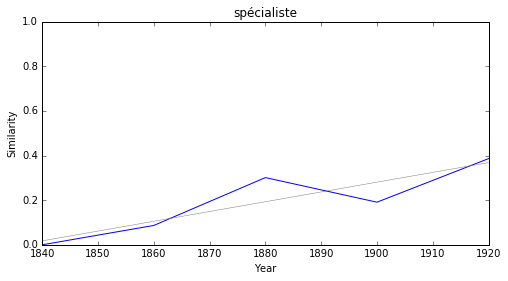

thèse


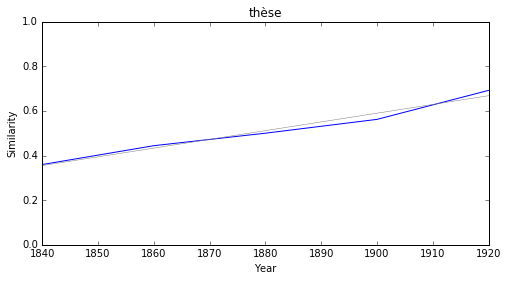

romantique


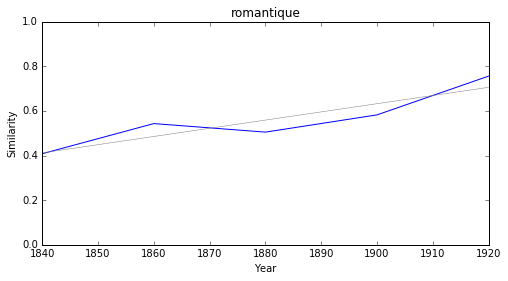

théoricien


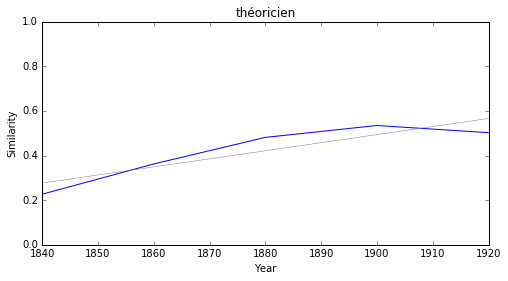

### <i><b>roman</i></b>

         token     slope         p
36    llorente -0.005927  0.012813
20      idylle -0.004198  0.015530
5    cervantes -0.004003  0.022144
31      sonnet -0.003838  0.003141
34      élégie -0.003516  0.026233
22   spécifier -0.003364  0.048046
19     curieux -0.003188  0.009404
30    proverbe -0.002514  0.031290
35    monument -0.002199  0.010337
16  romanesque  0.000956  0.041144



ecrits


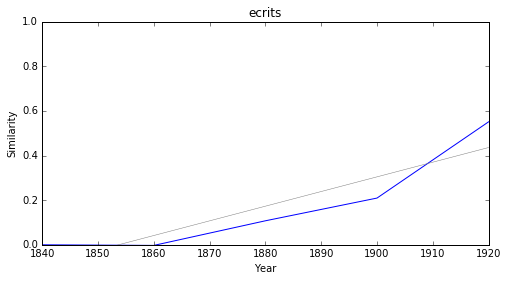

apport


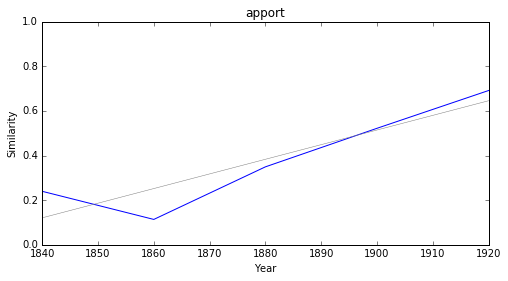

manuel


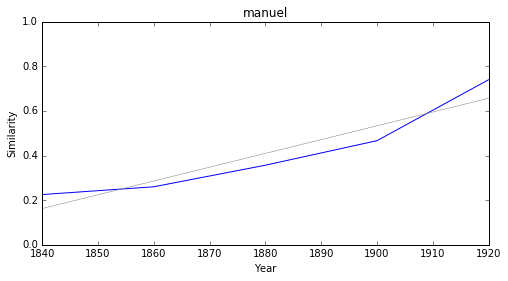

réédition


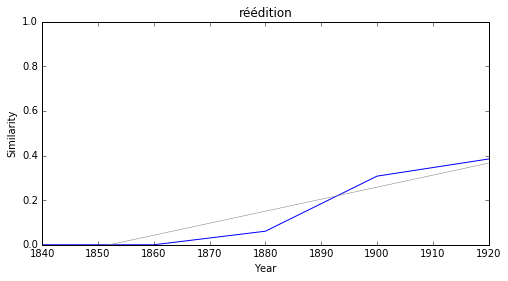

brunetière


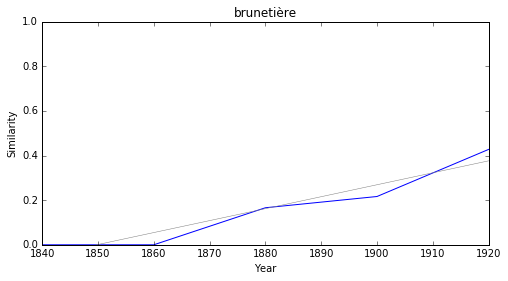

réaliste


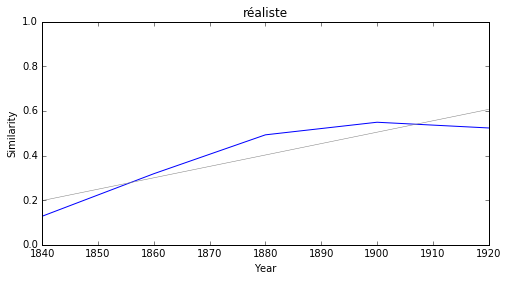

fascicule


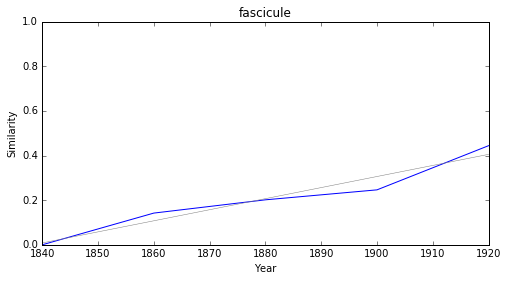

cénacle


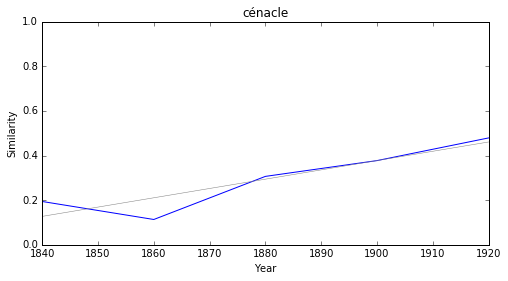

thèse


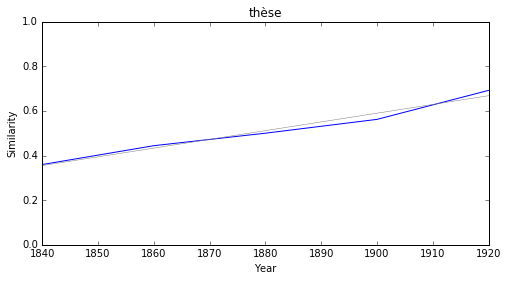

tristan


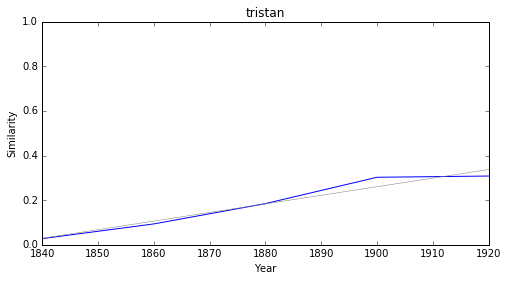

### <i><b>théâtre</i></b>

              token     slope         p
31         llorente -0.005927  0.012813
28             cuba -0.004737  0.017909
12          collége -0.004592  0.048370
3        naturalisé -0.004513  0.042377
6          coryphée -0.004298  0.030611
2          ormesson -0.004120  0.009328
32  constitutionnel -0.003246  0.005289
10       baptistère -0.002856  0.027863
26          saccade -0.002817  0.034675
25         proverbe -0.002514  0.031290



ecrits


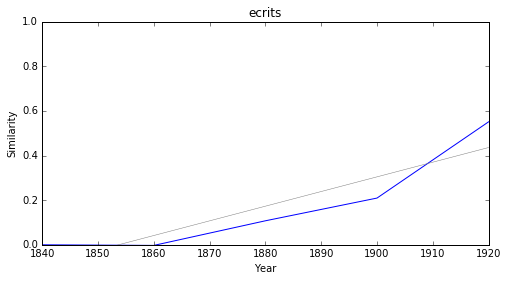

manuel


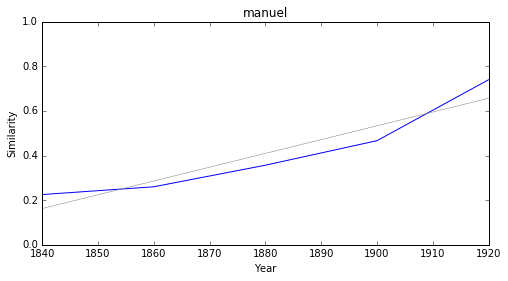

catholique


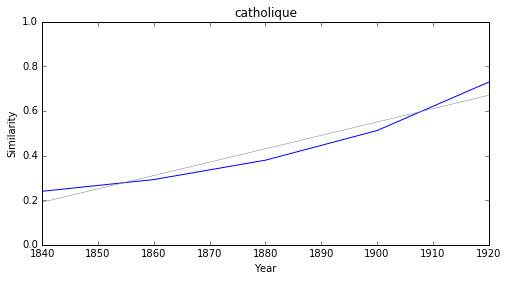

intraduisible


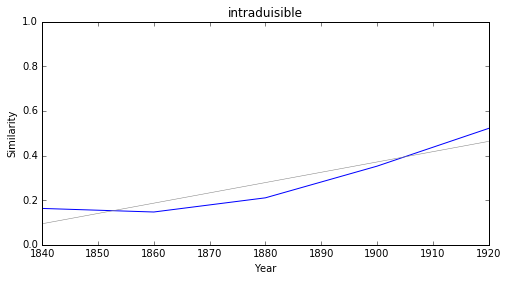

cénacle


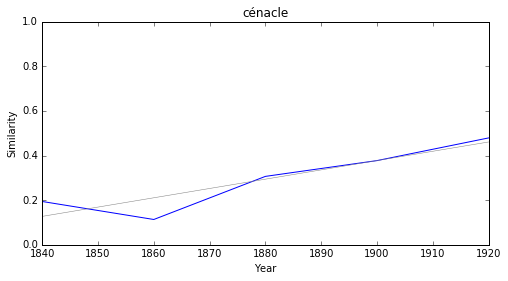

romantique


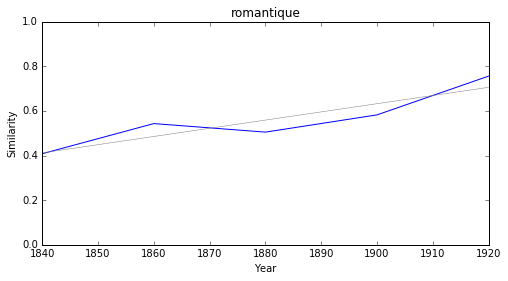

journalisme


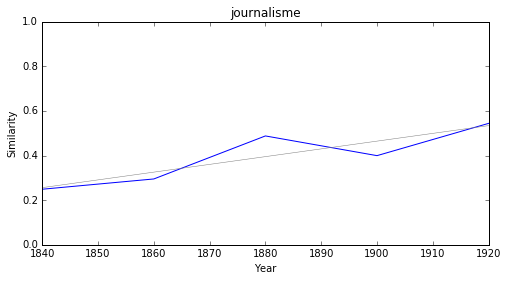

complémentaire


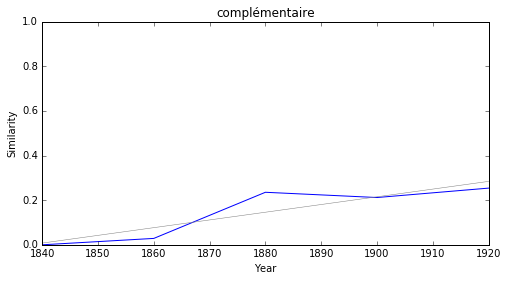

romantisme


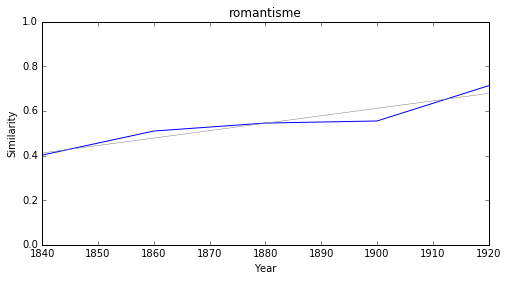

jansénisme


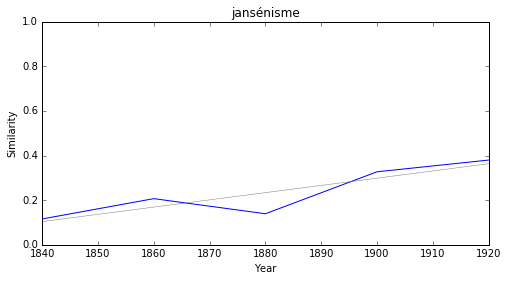

### <i><b>drame</i></b>

          token     slope         p
7         haydn -0.006210  0.029317
42     llorente -0.005927  0.012813
29         lied -0.004905  0.036744
23       idylle -0.004198  0.015530
36       sonnet -0.003838  0.003141
40       élégie -0.003516  0.026233
38  vicissitude -0.003064  0.019470
34     proverbe -0.002514  0.031290
41     monument -0.002199  0.010337
14      dériver -0.001752  0.037587



ecrits


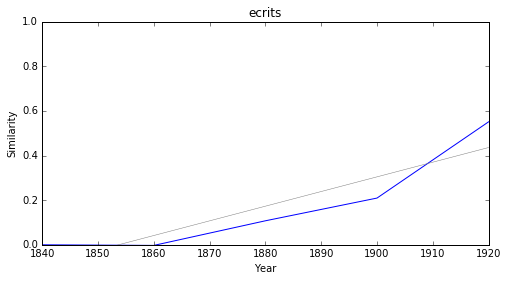

apport


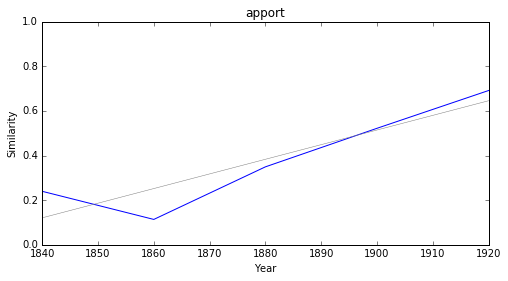

concept


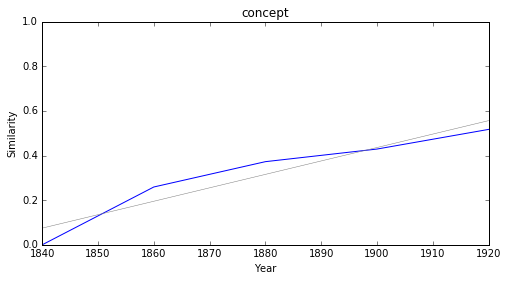

intégrer


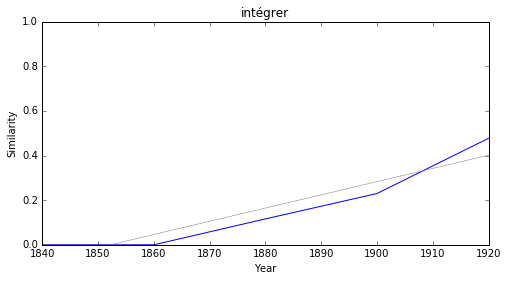

réaliste


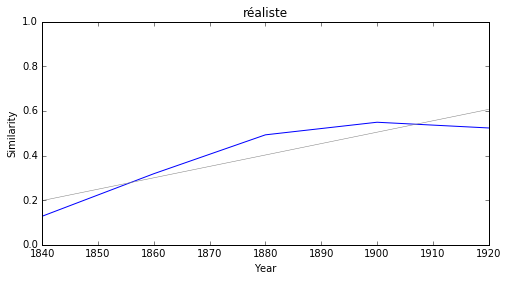

déséquilibre


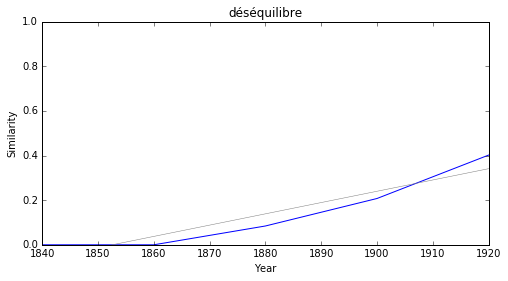

facteur


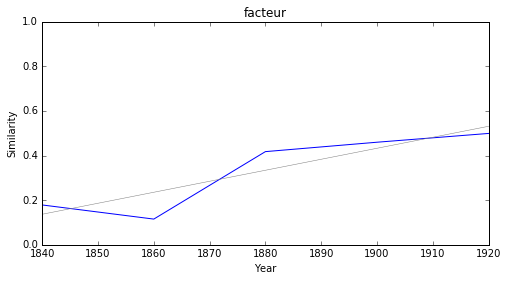

recul


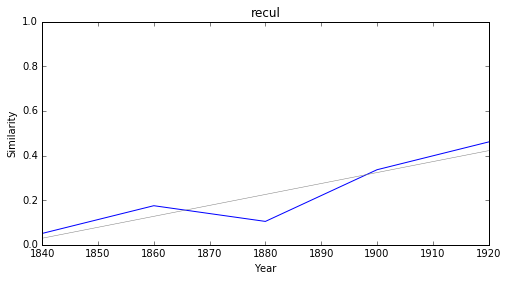

processus


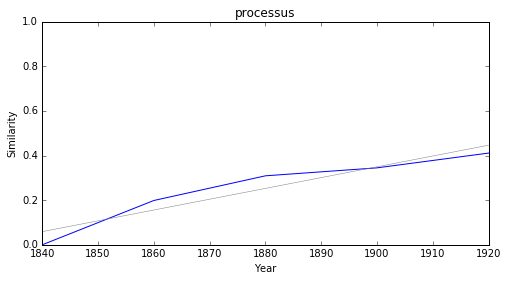

cliché


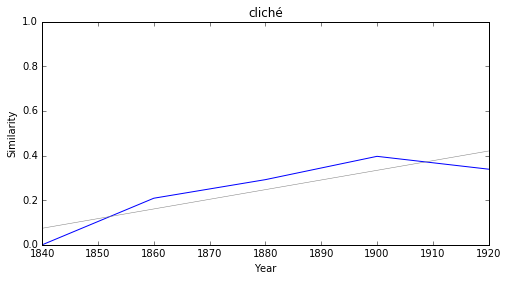

### <i><b>esprit</i></b>

          token     slope         p
8        allure -0.002426  0.036996
14     droiture -0.002164  0.031709
3   comparaison -0.002012  0.041023
19         tact -0.001997  0.029596
4   sociabilité -0.001989  0.016107
23    ressource -0.001504  0.009807
24         goût -0.001436  0.022249
18     négation  0.000728  0.018132
15      domaine  0.001052  0.005780
9       utilité  0.001188  0.040852



conscient


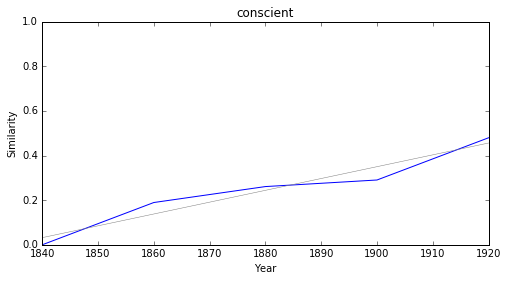

inconscient


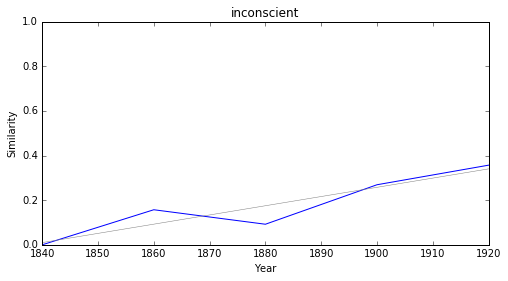

incapable


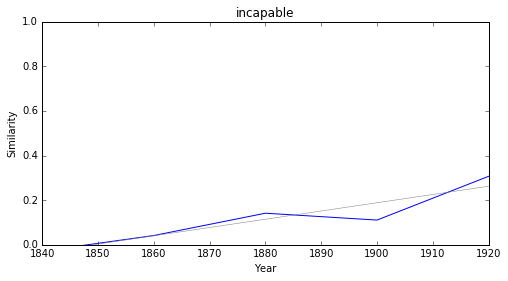

entraînement


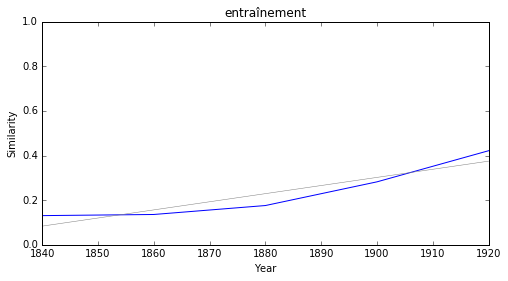

hérédité


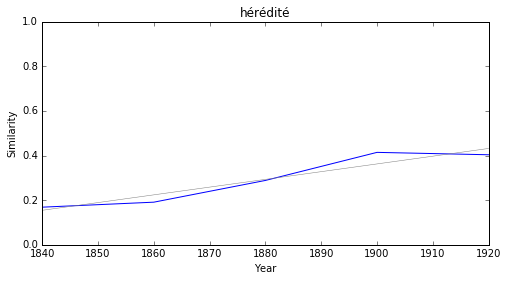

culture


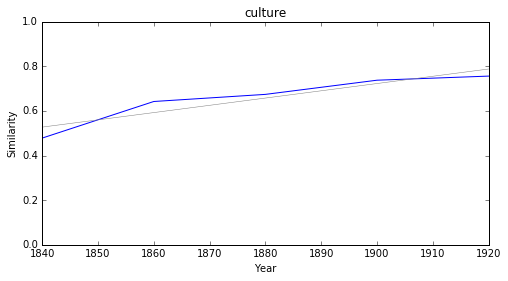

conception


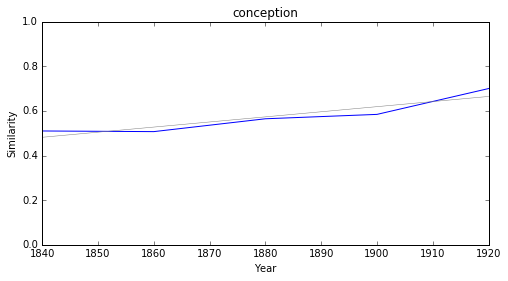

aisance


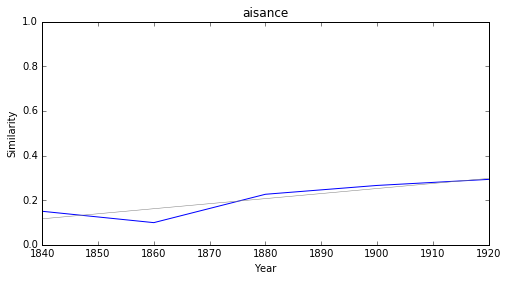

religion


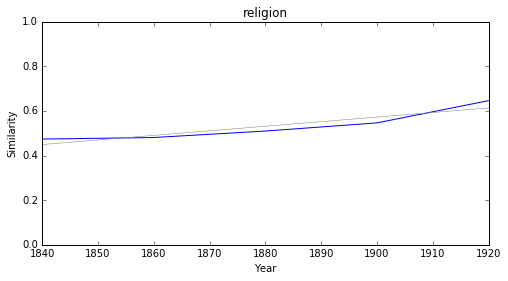

indépendant


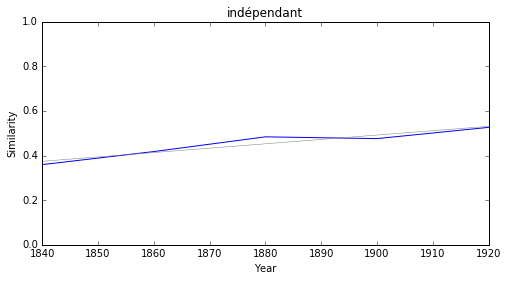

### <i><b>langue</i></b>

          token     slope         p
19  théologique -0.003168  0.017397
1      barbarie -0.003002  0.020017
26    sémitique -0.002797  0.028644
34     monument -0.002199  0.010337
5   comparaison -0.002012  0.041023
30         goût -0.001436  0.022249
20      domaine  0.001052  0.005780
10      utilité  0.001188  0.040852
13   prétention  0.001296  0.034148
15        revue  0.001511  0.012991



humanisme


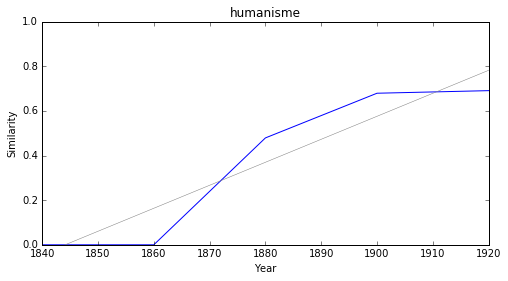

professionnel


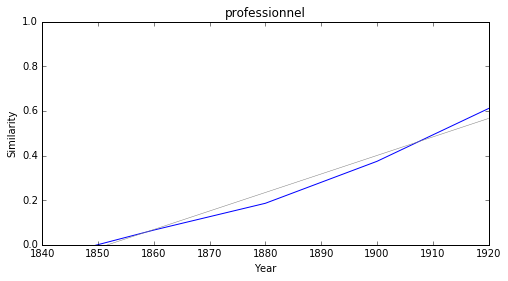

adaptation


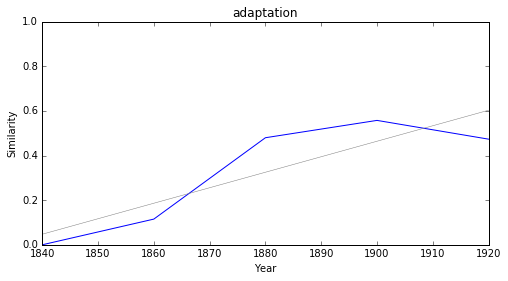

dépendant


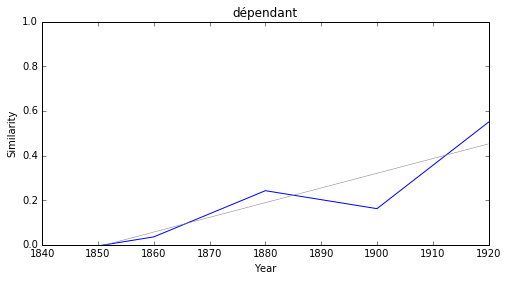

apport


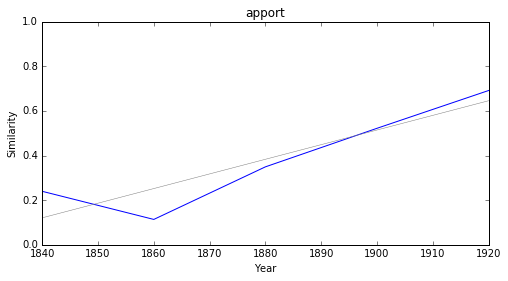

manuel


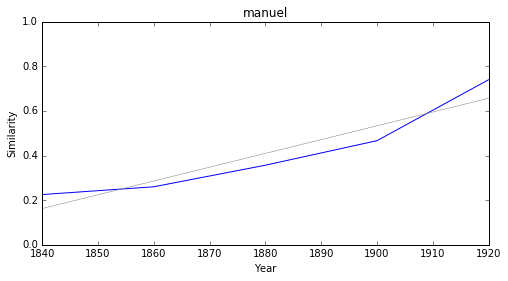

catholique


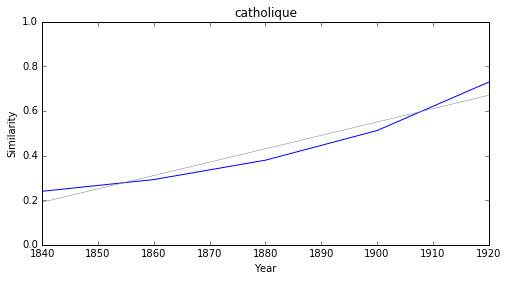

phonétique


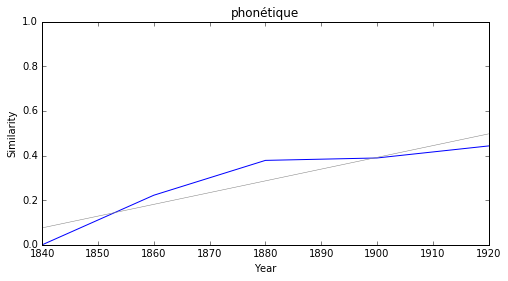

majorité


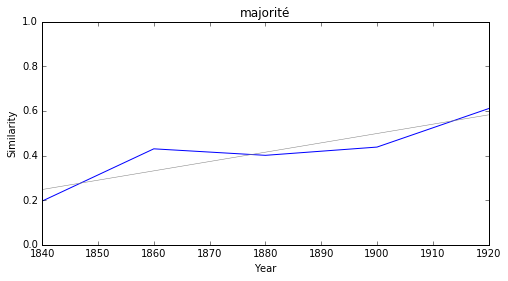

traditionnel


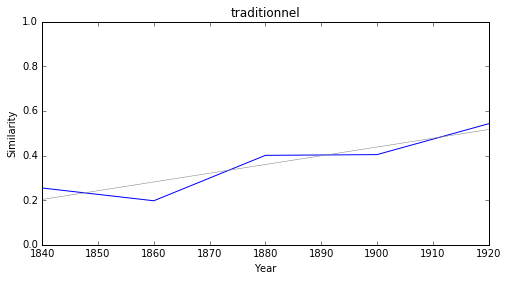

### <i><b>diplomatie</i></b>

              token     slope         p
41       spoliation -0.006144  0.037820
44           mollir -0.005799  0.046137
62          fédéral -0.005358  0.036636
1          cauchois -0.004647  0.033813
45      gravitation -0.003988  0.041923
37      empiétement -0.003877  0.044013
27          glander -0.003725  0.017461
4      schismatique -0.003584  0.020541
48           teuton -0.003384  0.019528
72  constitutionnel -0.003246  0.005289



survivance


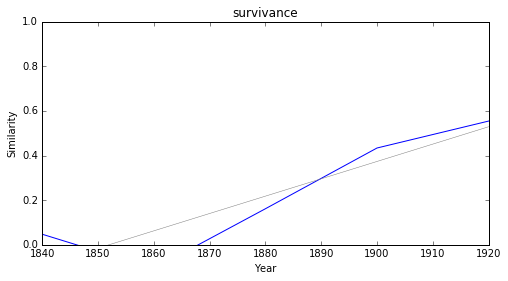

tri


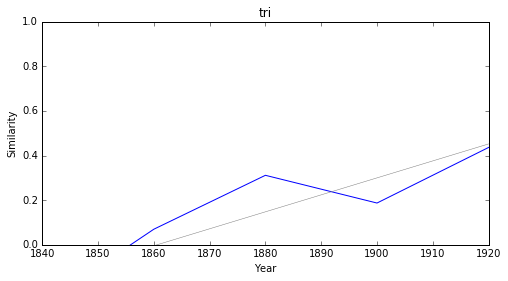

aveyron


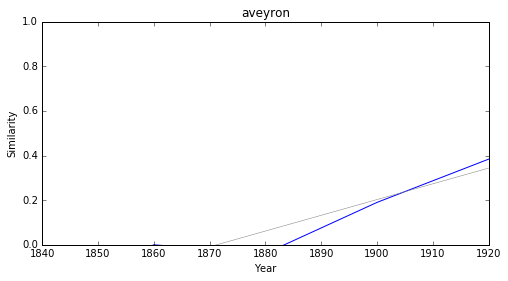

hégémonie


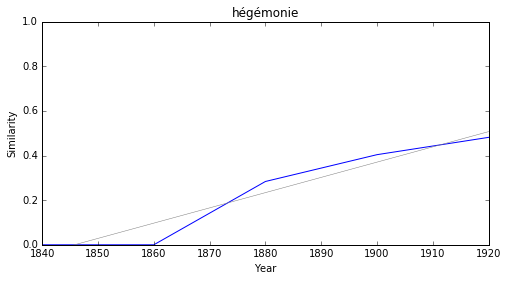

romanisation


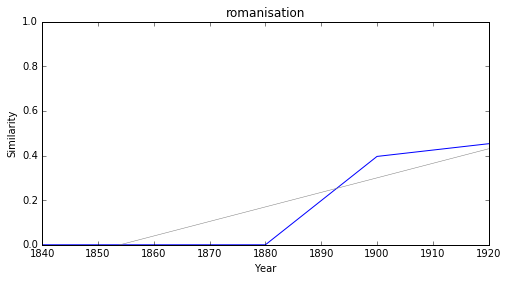

descendance


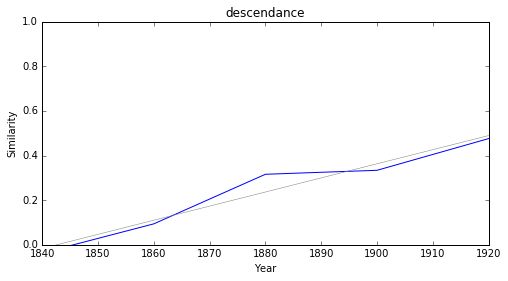

évolutionniste


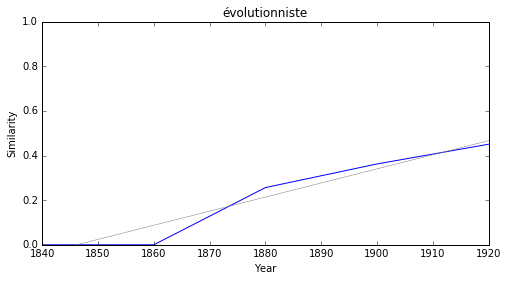

collectivité


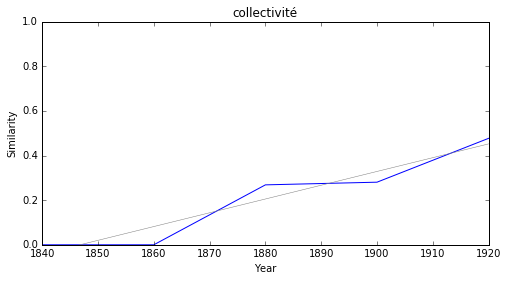

médiéval


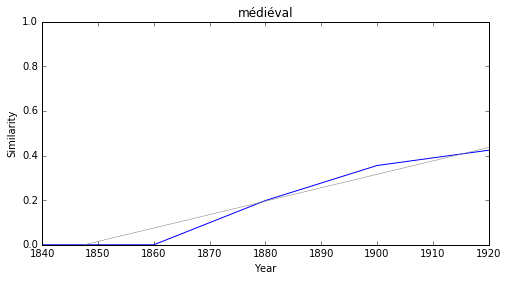

ésotérisme


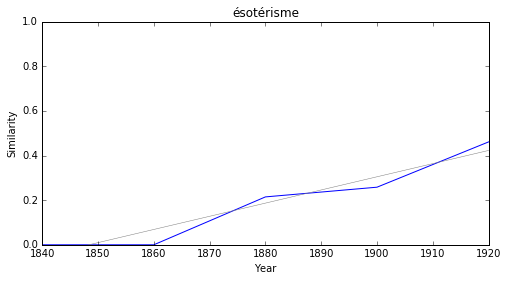

### <i><b>politique</i></b>

               token     slope         p
47           scinder -0.003375  0.013671
3      physiologique -0.003338  0.019118
48   constitutionnel -0.003246  0.005289
23       théologique -0.003168  0.017397
4           barbarie -0.003002  0.020017
8      véritablement -0.002781  0.027337
14           papauté -0.002511  0.033482
9        sociabilité -0.001989  0.016107
11      souveraineté -0.001730  0.013678
35  affranchissement -0.001287  0.041211



humanisme


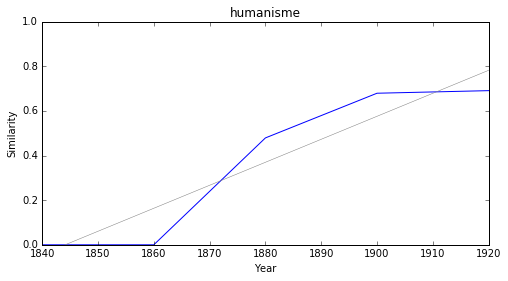

professionnel


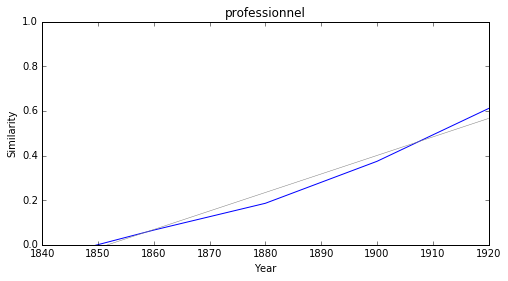

éthique


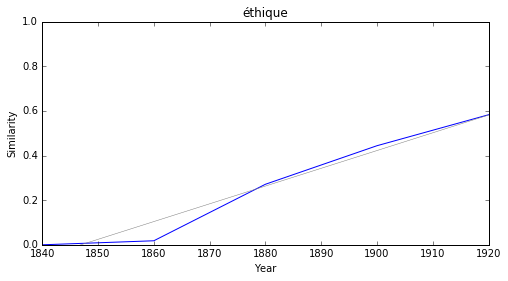

symboliste


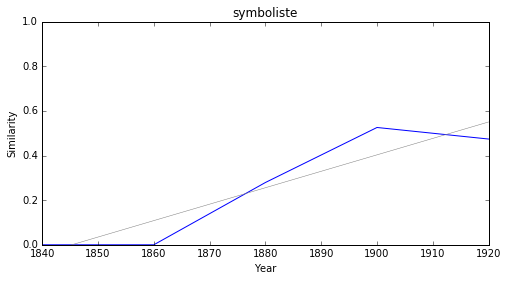

évoluer


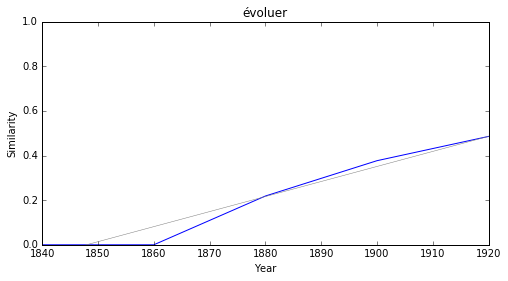

apport


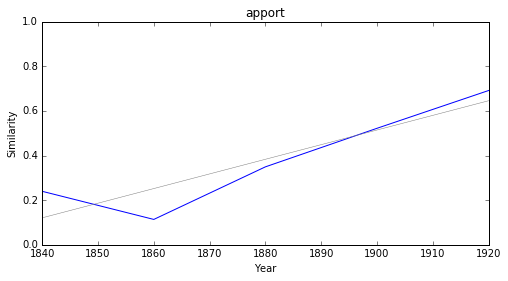

vulgarisation


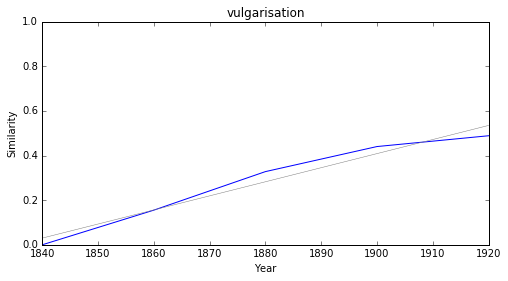

concept


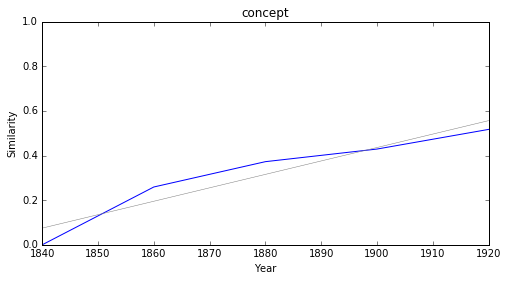

catholique


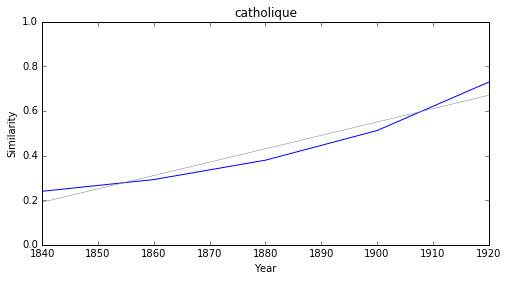

sociologique


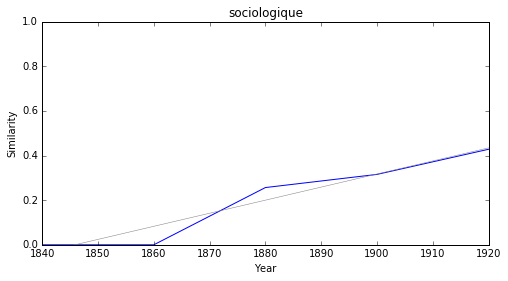

### <i><b>morale</i></b>

               token     slope         p
2      physiologique -0.003338  0.019118
22       théologique -0.003168  0.017397
29            infini -0.003155  0.022718
21          droiture -0.002164  0.031709
5        comparaison -0.002012  0.041023
8        sociabilité -0.001989  0.016107
7            absence -0.001836  0.009778
9       souveraineté -0.001730  0.013678
36         ressource -0.001504  0.009807
33  affranchissement -0.001287  0.041211



humanisme


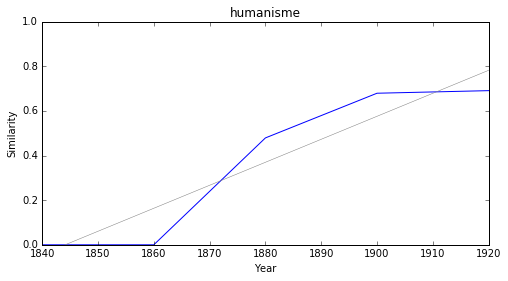

professionnel


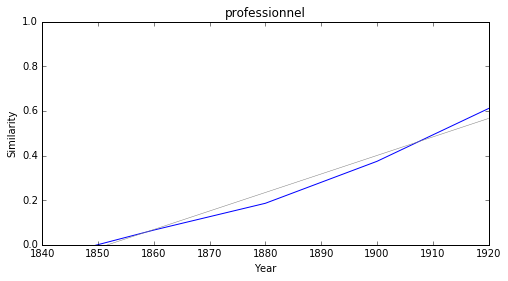

éthique


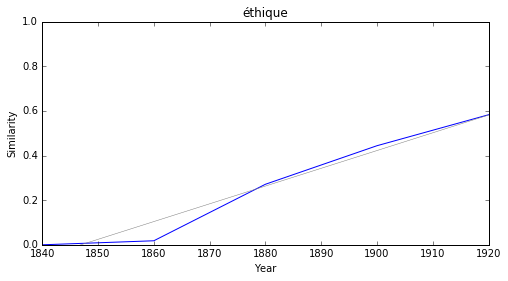

concept


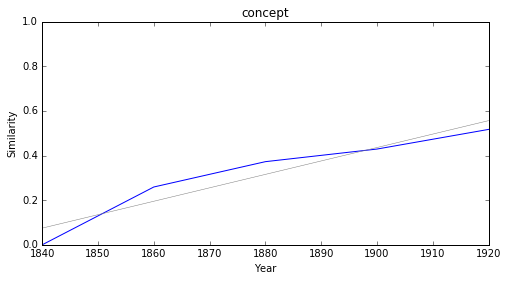

déterminisme


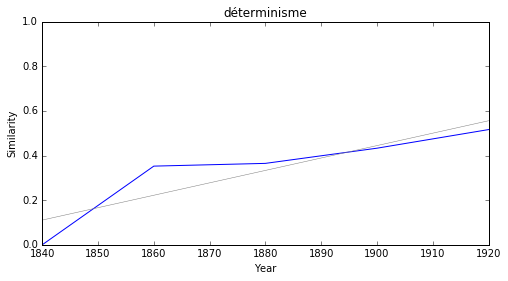

conscient


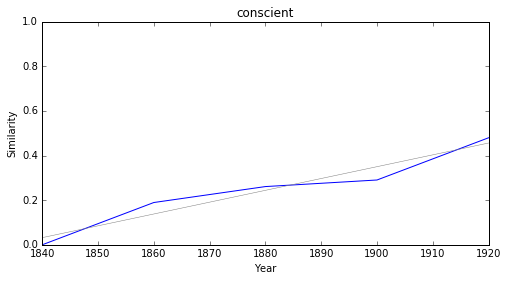

objectivité


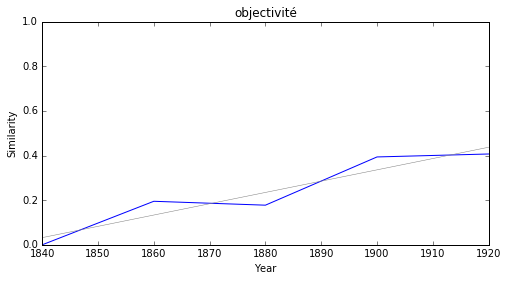

inconnaissable


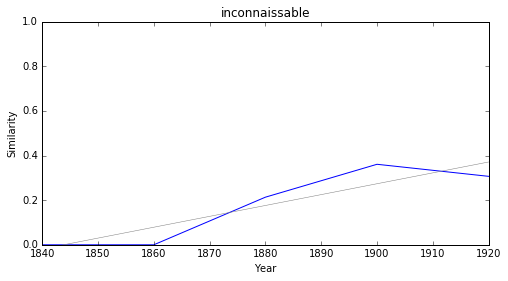

inconscient


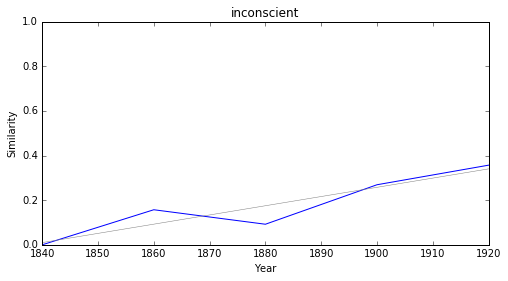

traditionnel


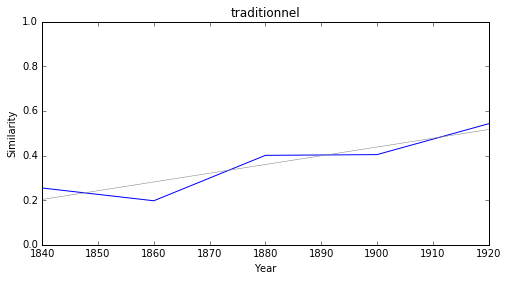

### <i><b>société</i></b>

               token     slope         p
20       théologique -0.003168  0.017397
1           barbarie -0.003002  0.020017
45          monument -0.002199  0.010337
10      souveraineté -0.001730  0.013678
37         ressource -0.001504  0.009807
33  affranchissement -0.001287  0.041211
21           domaine  0.001052  0.005780
30            charte  0.001073  0.007169
11       association  0.001079  0.022985
36           cerveau  0.001214  0.042282



humanisme


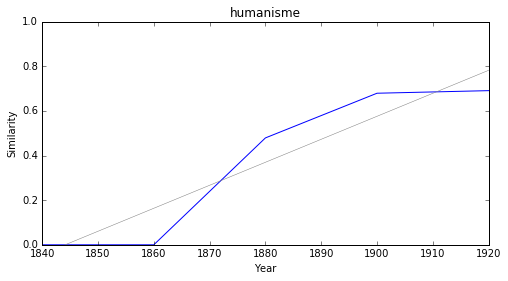

symboliste


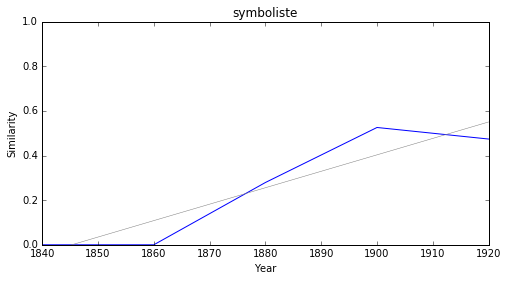

adaptation


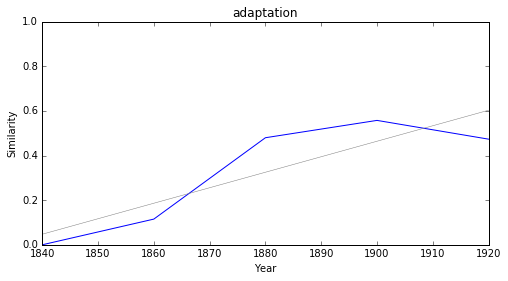

apport


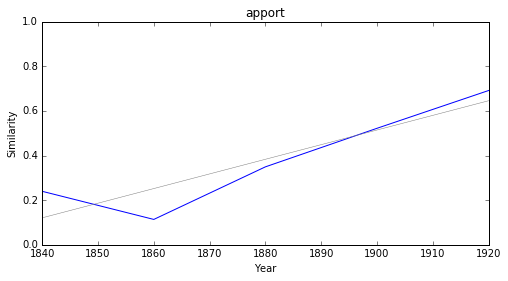

manuel


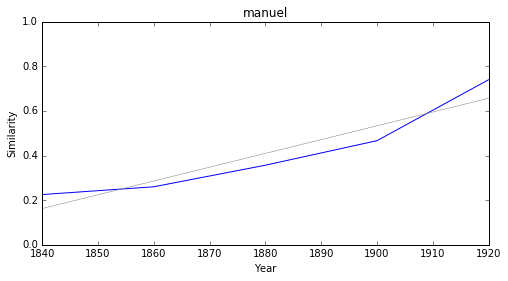

révocation


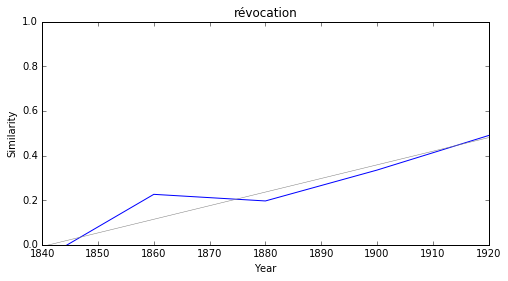

catholique


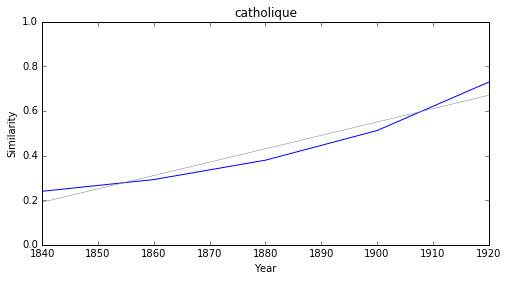

sc


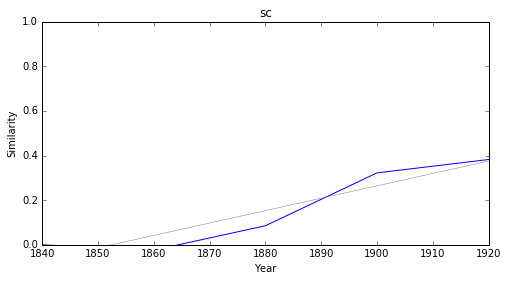

illogisme


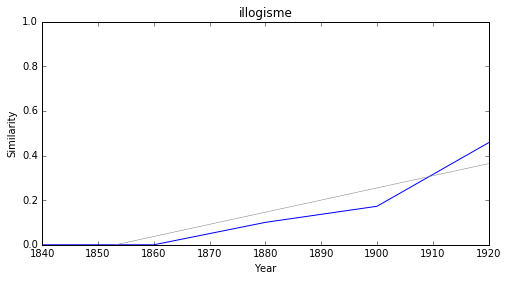

facteur


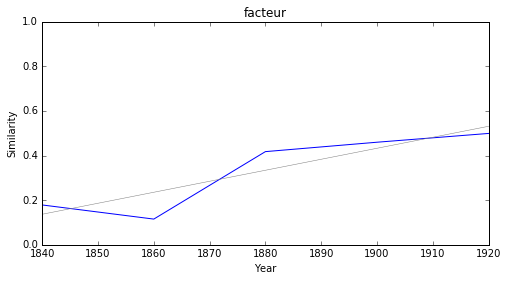

### <i><b>pouvoir</i></b>

            token     slope         p
1       réfléchir -0.003284  0.030711
3   véritablement -0.002781  0.027337
12        admirer -0.002447  0.034599
2     comparaison -0.002012  0.041023
4         absence -0.001836  0.009778
13      ressource -0.001504  0.009807
7         utilité  0.001188  0.040852
11          aucun  0.001265  0.009292
8      prétention  0.001296  0.034148
9        religion  0.002049  0.025109



objectivité


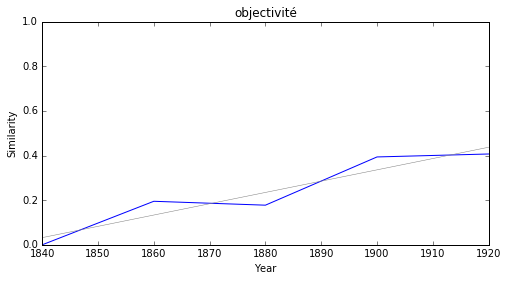

miracle


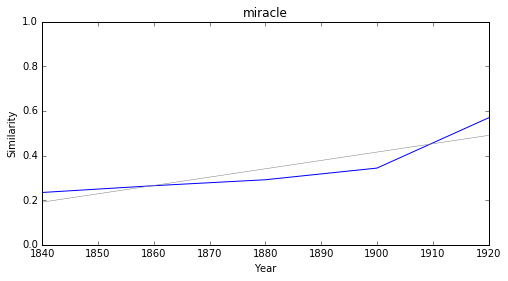

incapable


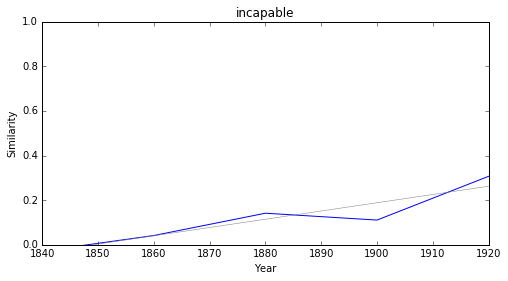

vagir


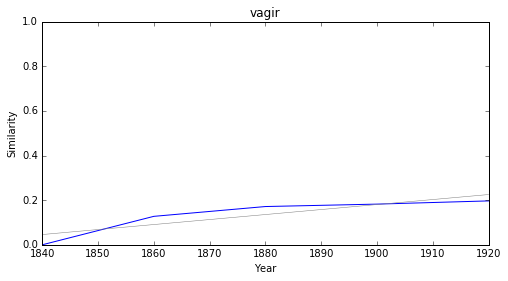

moyen


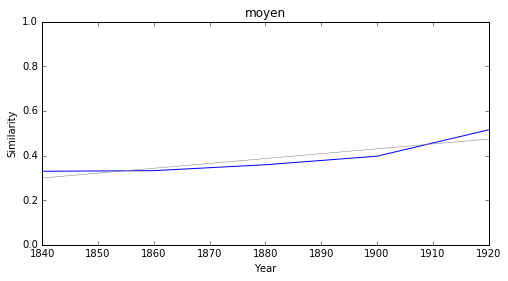

religion


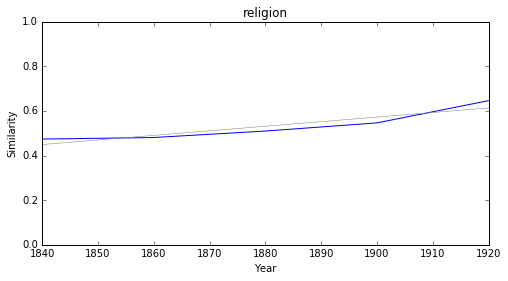

prétention


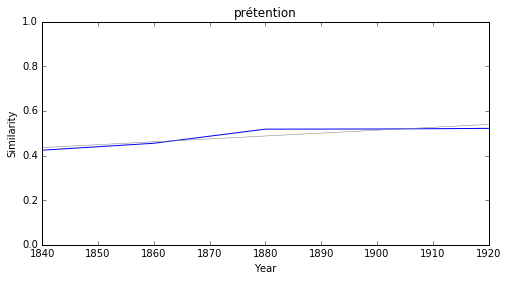

aucun


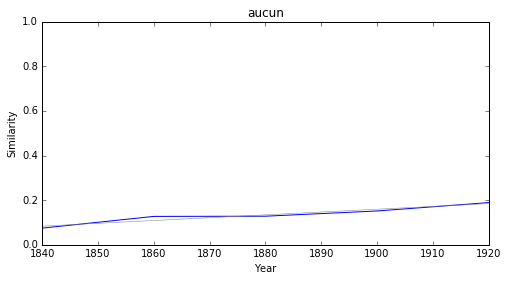

utilité


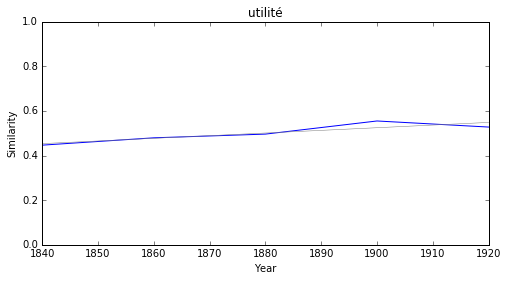

ressource


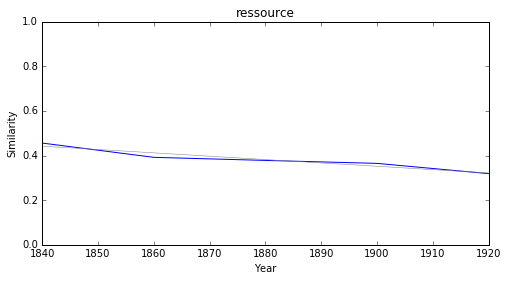

### <i><b>théologie</i></b>

              token     slope         p
46     horticulture -0.004754  0.018397
52            arius -0.004680  0.008177
47      gravitation -0.003988  0.041923
57          nuancer -0.003608  0.048697
7     physiologique -0.003338  0.019118
79  constitutionnel -0.003246  0.005289
41      théologique -0.003168  0.017397
70      vicissitude -0.003064  0.019470
60        sémitique -0.002797  0.028644
25          papauté -0.002511  0.033482



humanisme


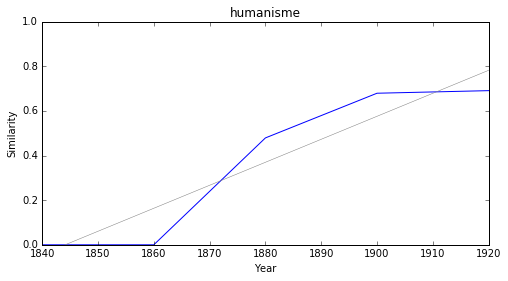

éthique


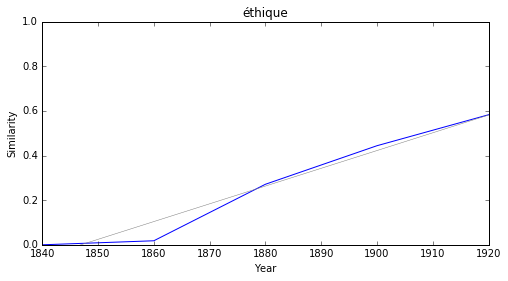

survivance


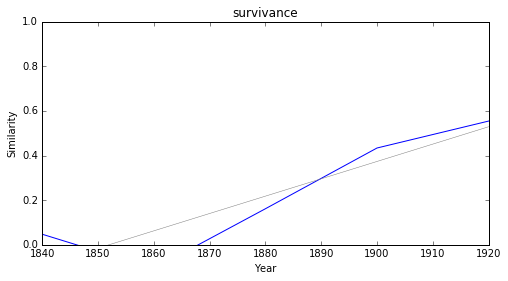

symboliste


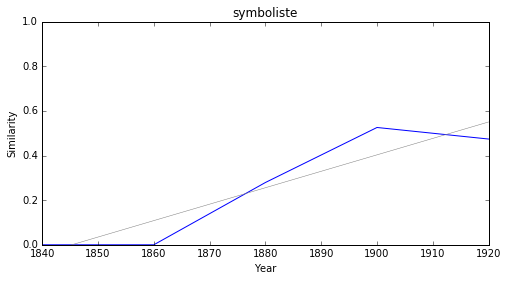

orientation


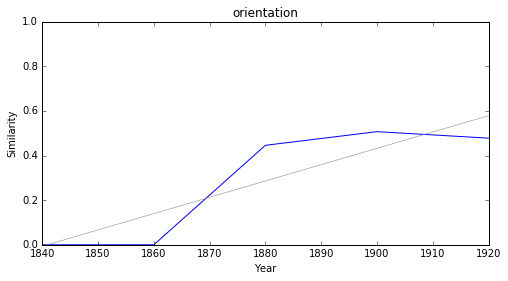

adaptation


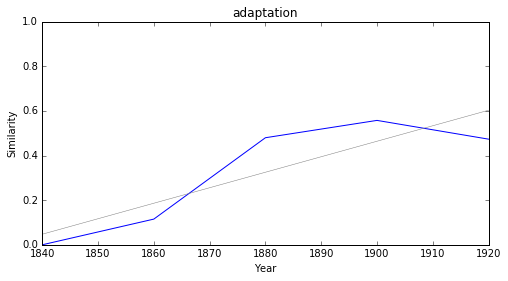

apport


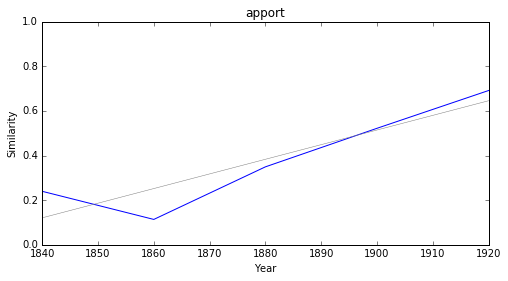

romanisation


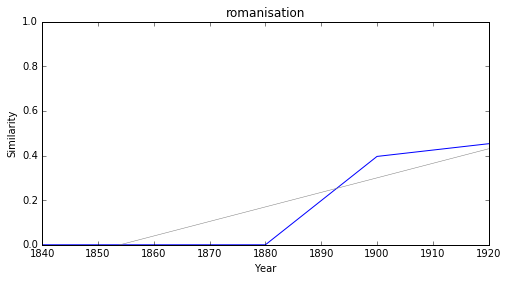

évolutionniste


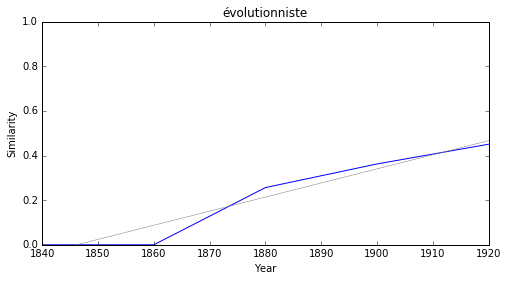

vulgarisation


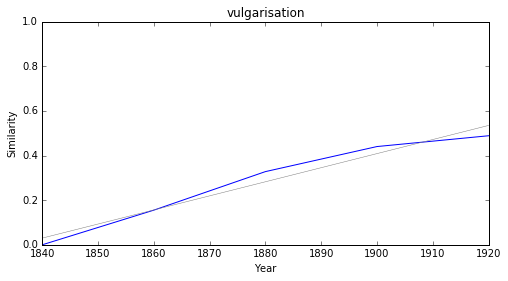

### <i><b>droit</i></b>

           token     slope         p
13   législateur -0.001952  0.001201
4   souveraineté -0.001730  0.013678
19     ressource -0.001504  0.009807
14       domaine  0.001052  0.005780
9        utilité  0.001188  0.040852
11    prétention  0.001296  0.034148
10    communauté  0.001860  0.027865
5     socialisme  0.001888  0.049450
2         patrie  0.001922  0.038558
18      ambition  0.001923  0.010064



catholique


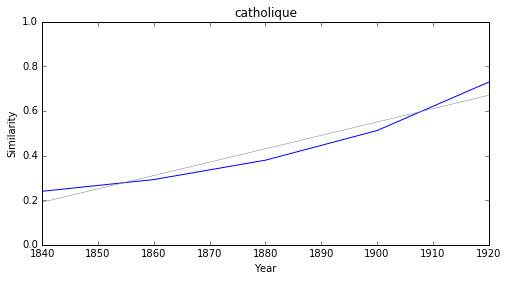

déterminisme


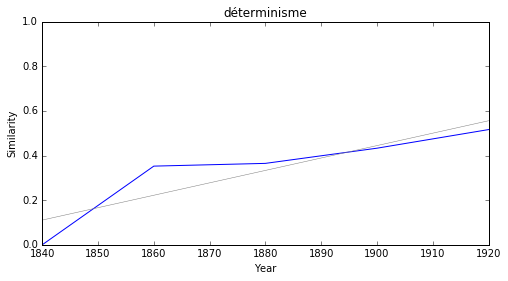

salaire


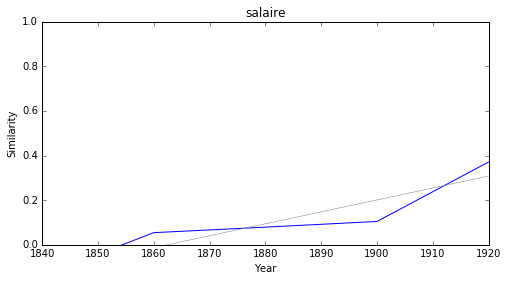

majorité


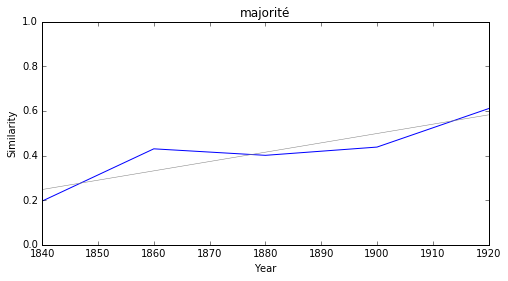

pacte


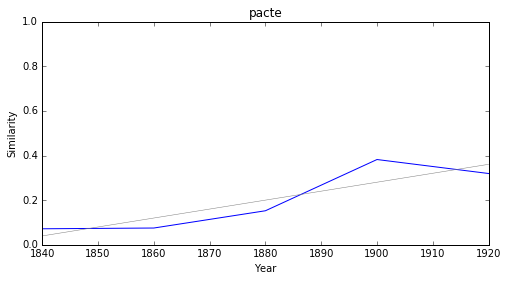

miracle


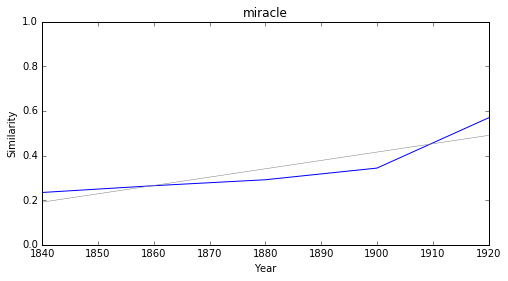

théoricien


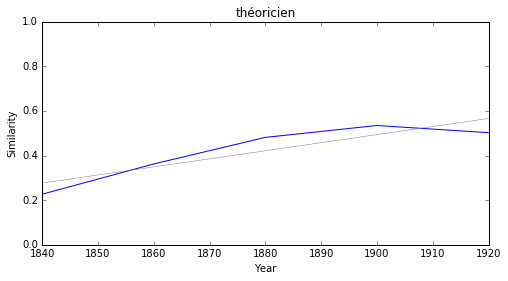

uniquement


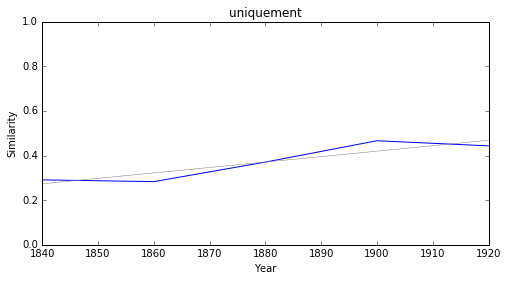

territoire


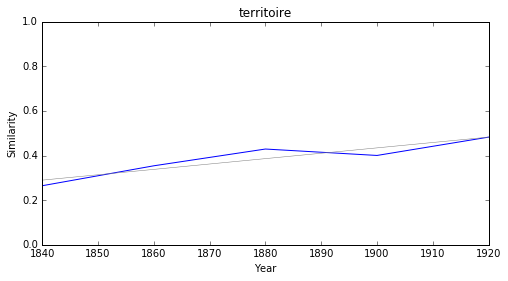

moyen


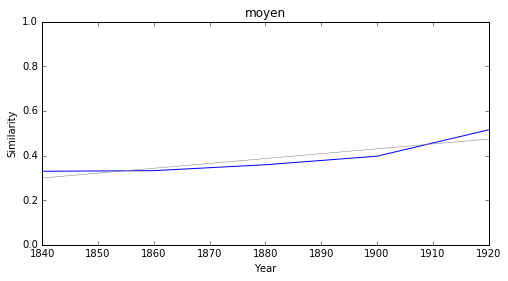

### <i><b>loi</i></b>

            token     slope         p
2   physiologique -0.003338  0.019118
15        physico -0.002723  0.021953
16    législateur -0.001952  0.001201
5    souveraineté -0.001730  0.013678
26      ressource -0.001504  0.009807
23       négation  0.000728  0.018132
17        domaine  0.001052  0.005780
6     association  0.001079  0.022985
8         utilité  0.001188  0.040852
12     prétention  0.001296  0.034148



apport


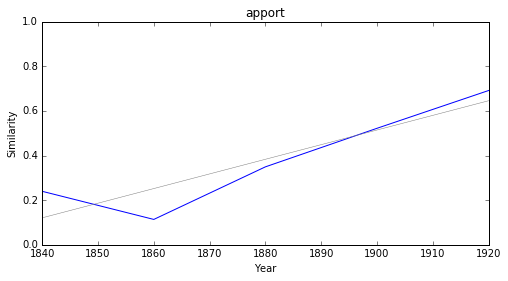

concept


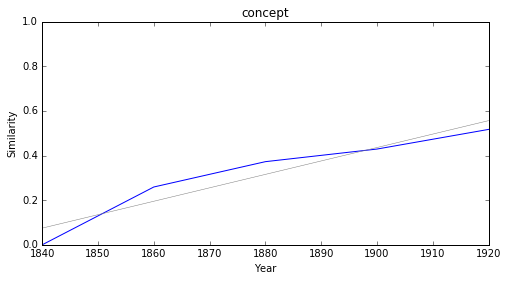

catholique


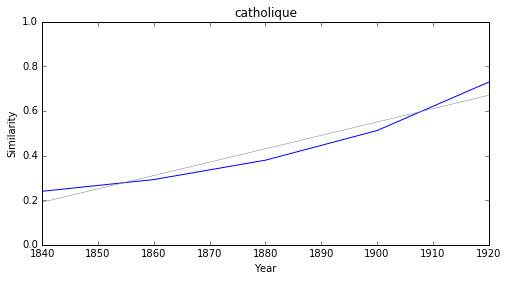

déterminisme


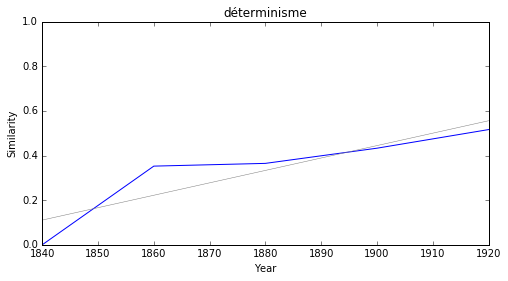

conscient


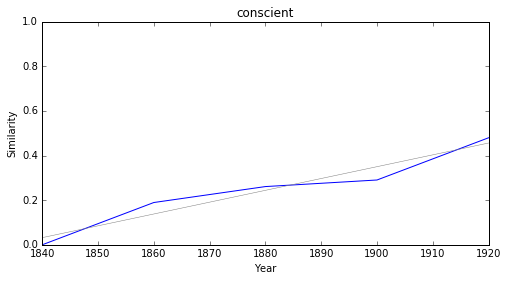

objectivité


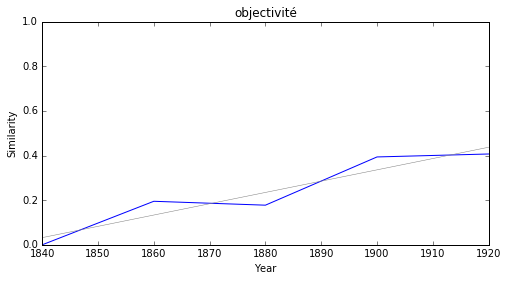

facteur


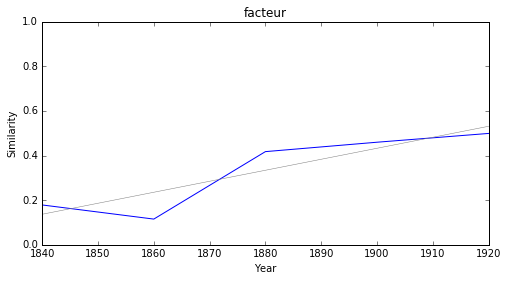

majorité


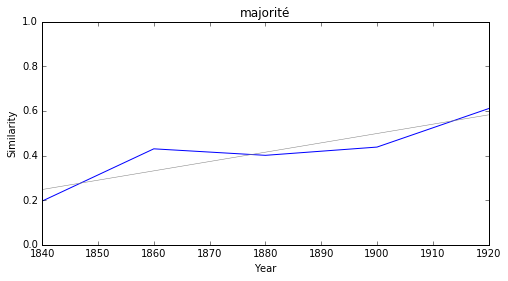

inconscient


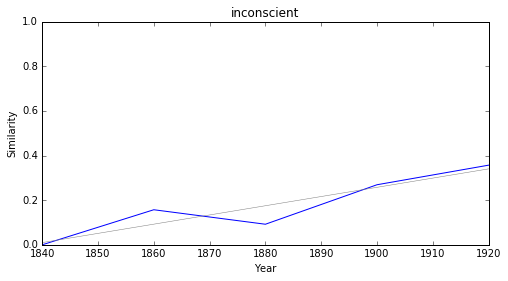

pacte


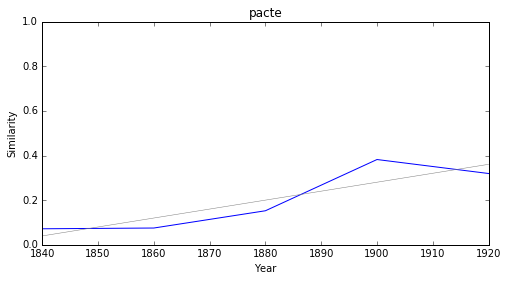

### <i><b>méthode</i></b>

            token     slope         p
3   physiologique -0.003338  0.019118
16    théologique -0.003168  0.017397
17      induction -0.002543  0.043163
23        réfuter -0.002353  0.016774
6     comparaison -0.002012  0.041023
25      ressource -0.001504  0.009807
21       négation  0.000728  0.018132
8         utilité  0.001188  0.040852
11     prétention  0.001296  0.034148
19       synthèse  0.001765  0.014498



professionnel


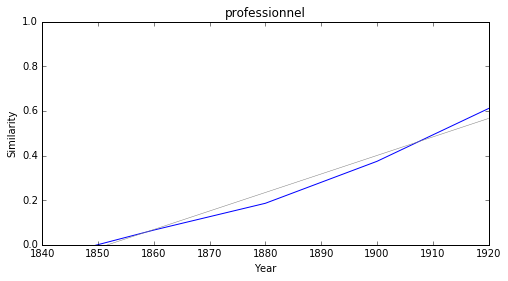

éthique


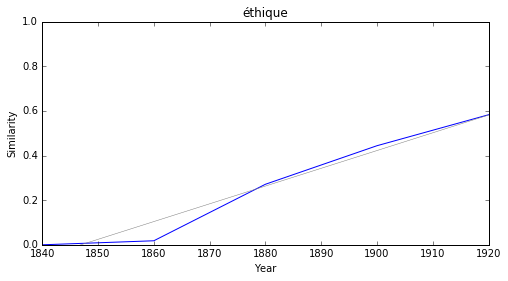

orientation


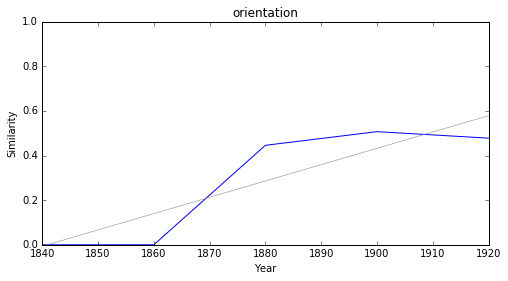

adaptation


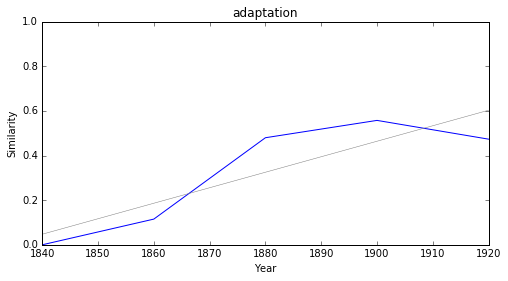

apport


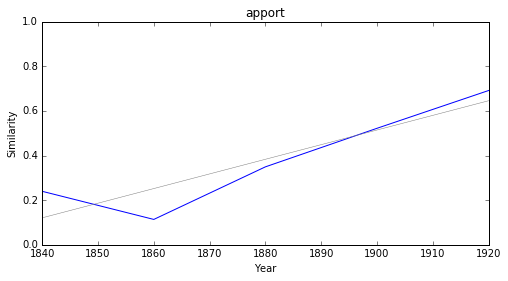

concept


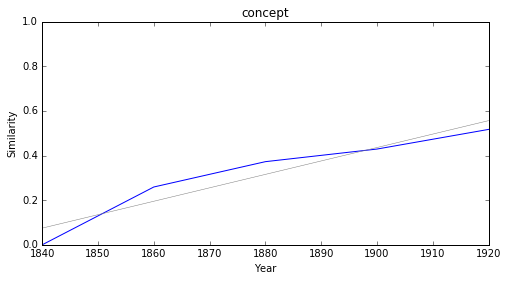

déterminisme


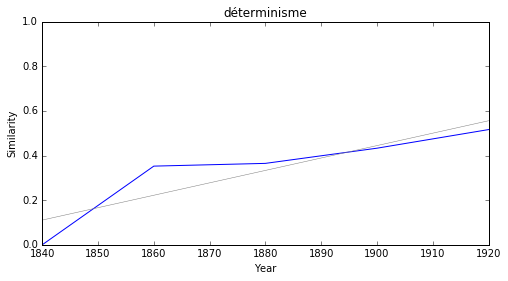

conscient


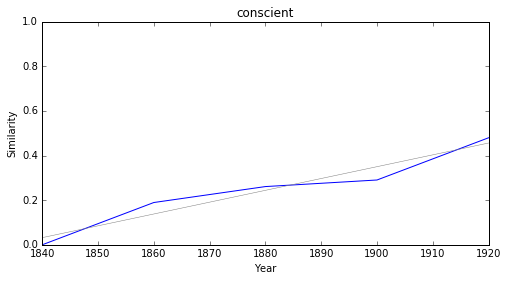

objectivité


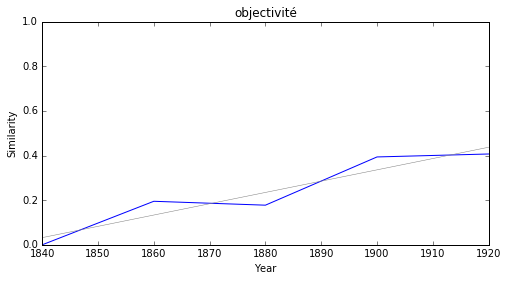

thèse


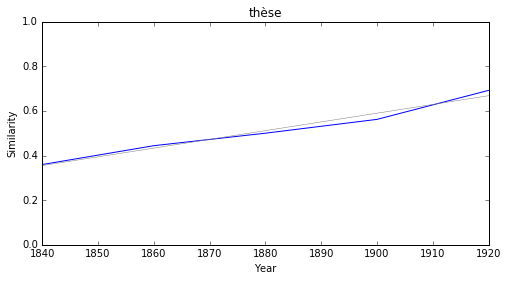

### <i><b>génie</i></b>

            token     slope         p
2     monothéisme -0.005142  0.006018
8           débit -0.004468  0.034008
9      fétichisme -0.004308  0.009534
17           naïf -0.003521  0.022573
7   véritablement -0.002781  0.027337
15         cupide -0.002240  0.024844
41       monument -0.002199  0.010337
20       droiture -0.002164  0.031709
29           tact -0.001997  0.029596
13    merveilleux -0.001801  0.022211



professionnel


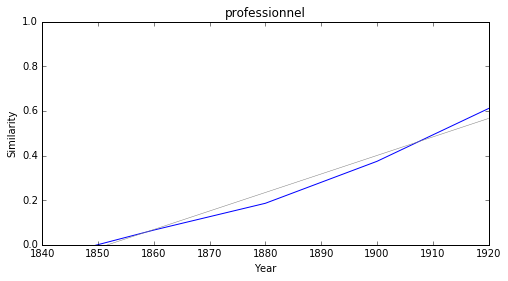

apport


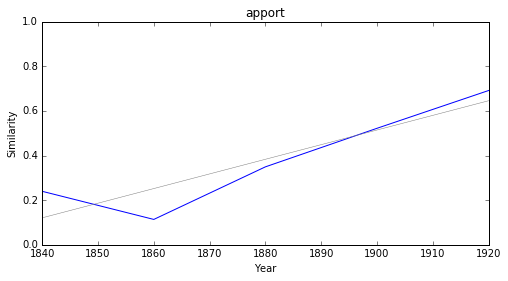

concept


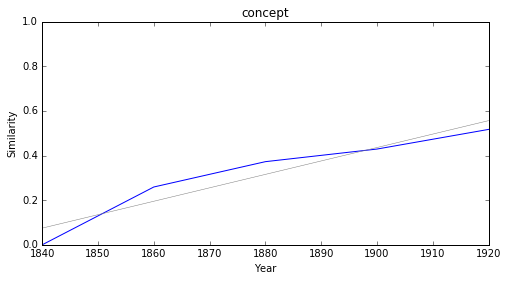

déterminisme


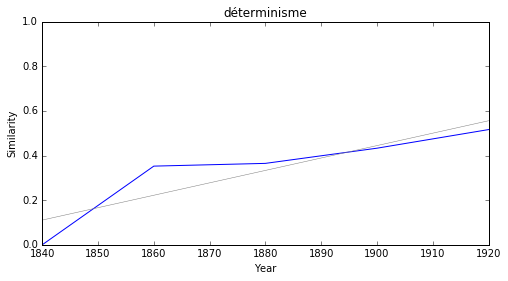

conscient


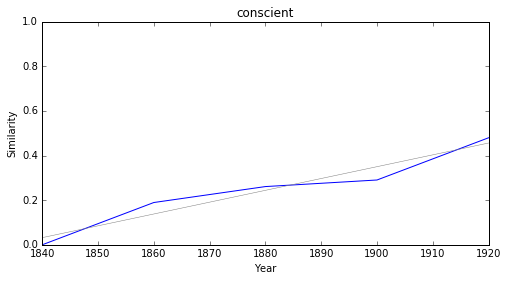

déséquilibre


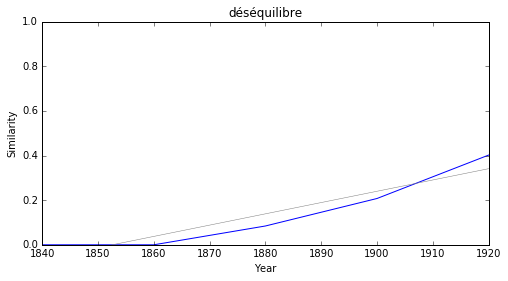

pessimisme


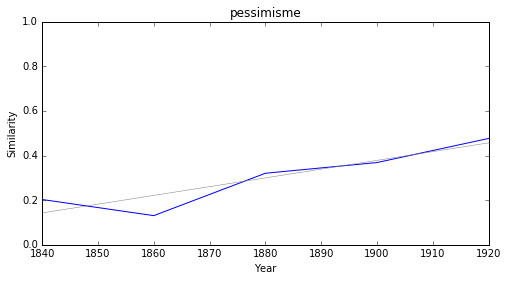

lyrisme


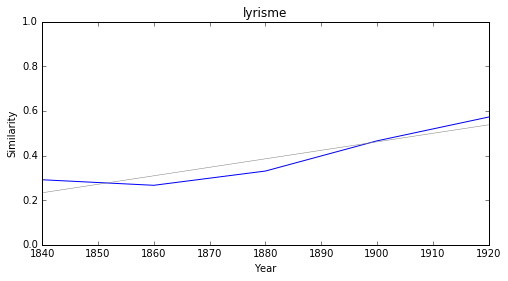

miracle


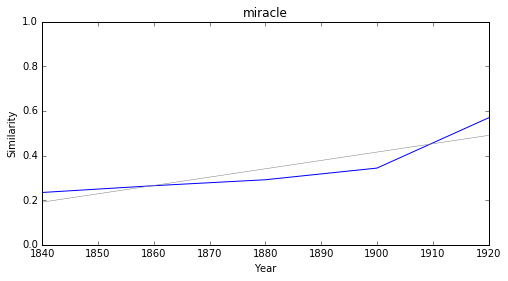

romantique


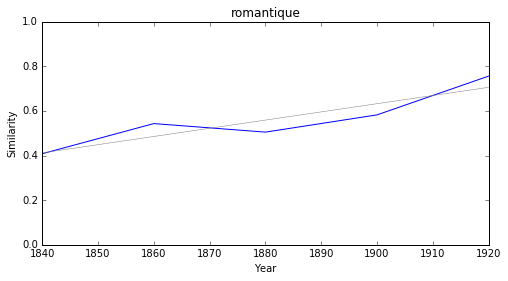

### <i><b>romantisme</i></b>

            token     slope         p
55  métempsychose -0.006656  0.025715
12      fabuliste -0.005517  0.036967
5     monothéisme -0.005142  0.006018
56           lied -0.004905  0.036744
2        cauchois -0.004647  0.033813
31        collége -0.004592  0.048370
11          débit -0.004468  0.034008
47         idylle -0.004198  0.015530
37    empiétement -0.003877  0.044013
66         sonnet -0.003838  0.003141



humanisme


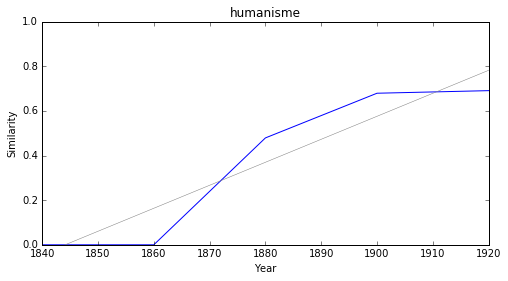

professionnel


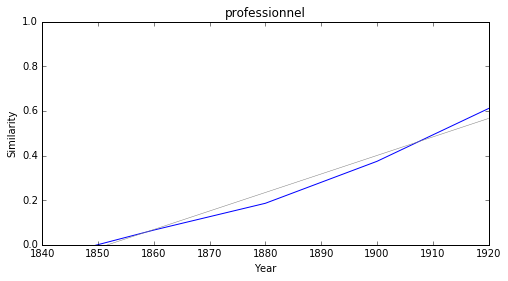

survivance


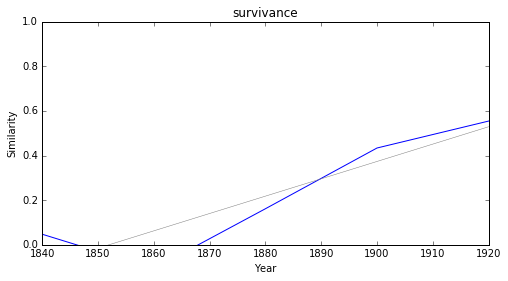

symboliste


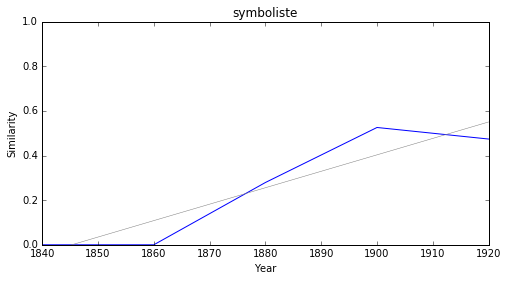

ecrits


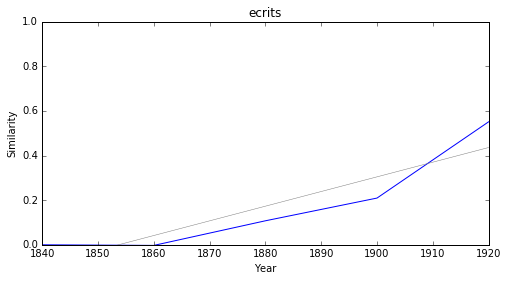

apport


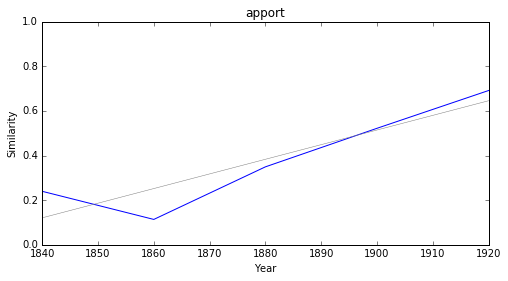

manuel


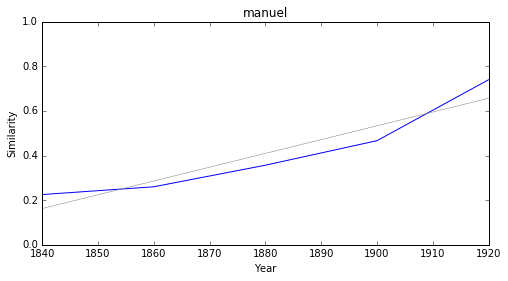

concept


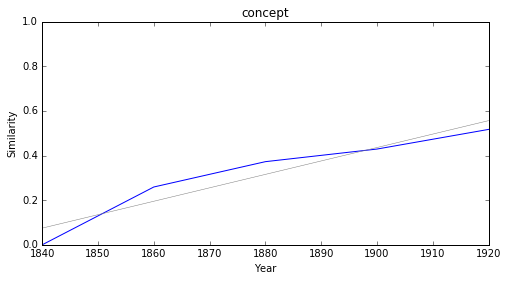

catholique


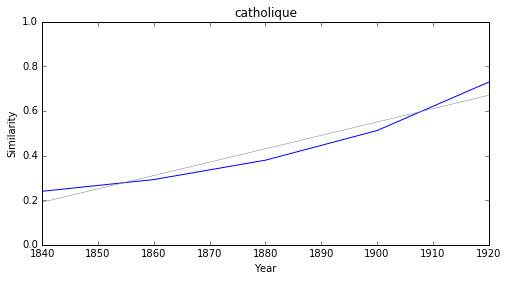

néo


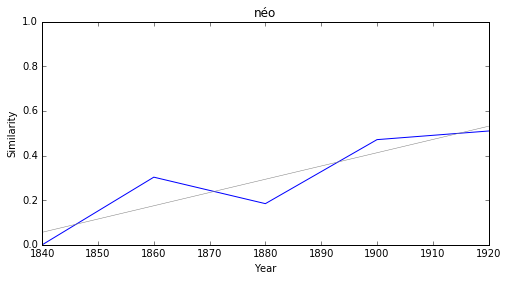

### <i><b>réalisme</i></b>

            token     slope         p
83  métempsychose -0.006656  0.025715
65       urbanité -0.004910  0.020588
23          débit -0.004468  0.034008
26     fétichisme -0.004308  0.009534
32       coryphée -0.004298  0.030611
79    déperdition -0.004195  0.009138
55             dl -0.003615  0.019519
95      sculpteur -0.003577  0.006245
10  physiologique -0.003338  0.019118
18    protectorat -0.003307  0.038180



humanisme


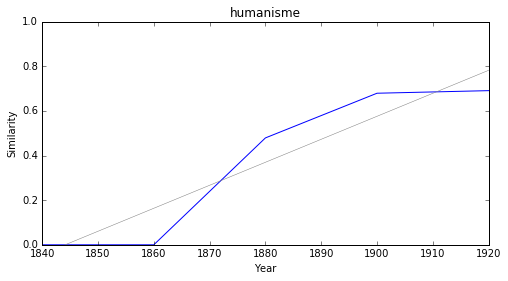

survivance


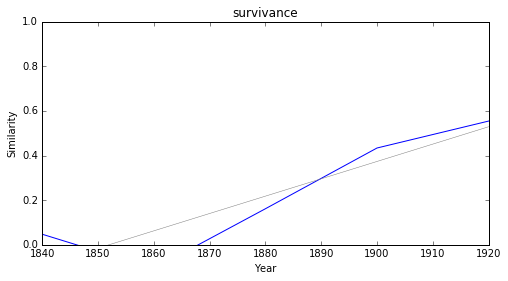

orientation


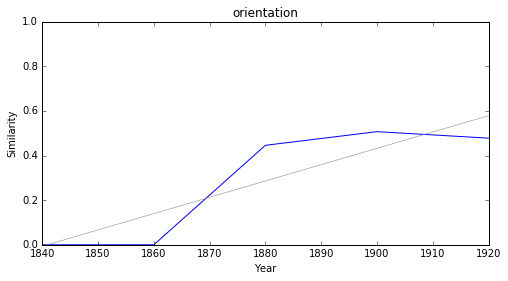

adaptation


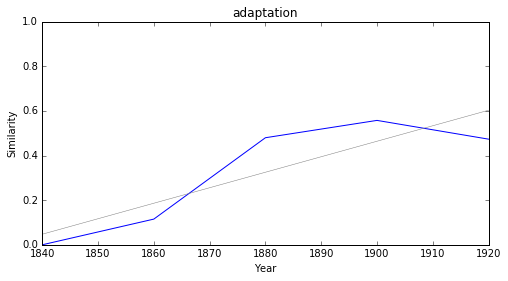

apport


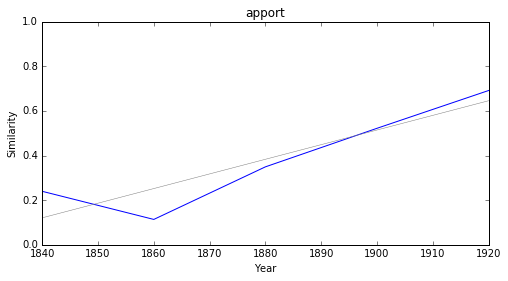

évolutionniste


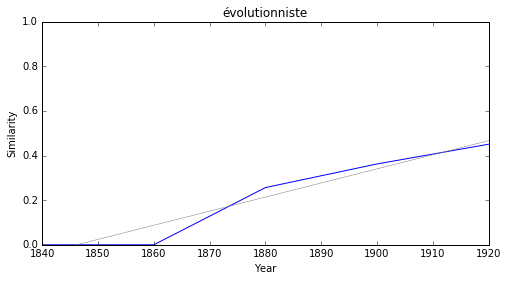

instrumentation


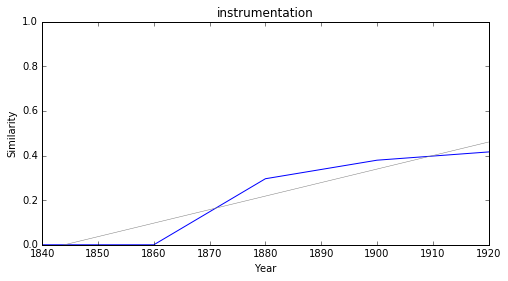

immanent


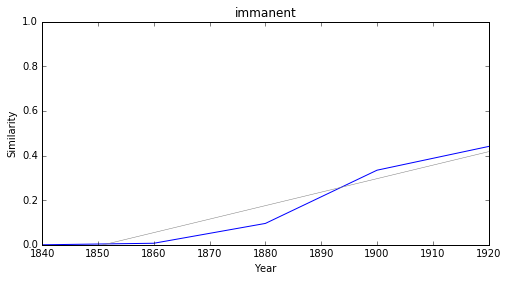

concept


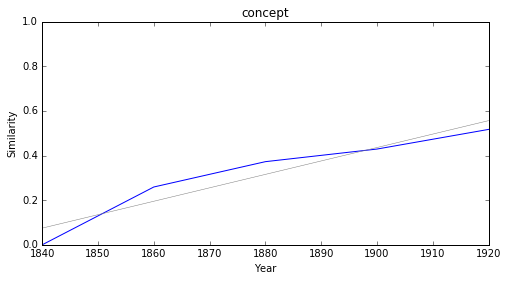

médiéval


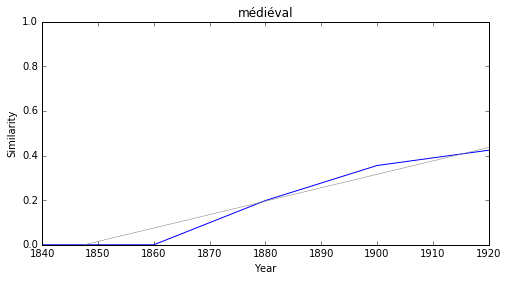

### <i><b>symbolisme</i></b>

           token     slope         p
73     idiotisme -0.005405  0.039228
51      urbanité -0.004910  0.020588
57      jocrisse -0.004880  0.004221
42    polyglotte -0.004093  0.024040
53   gravitation -0.003988  0.041923
60  monstruosité -0.003939  0.026360
45   empiétement -0.003877  0.044013
40   théologique -0.003168  0.017397
11  fermentation -0.003046  0.023650
69     sémitique -0.002797  0.028644



humanisme


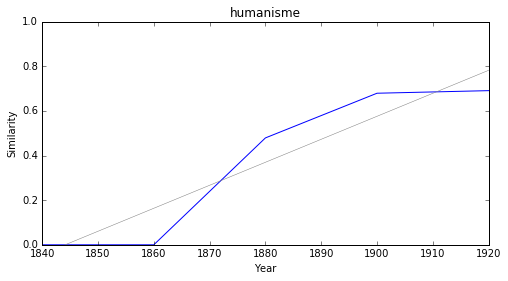

parangon


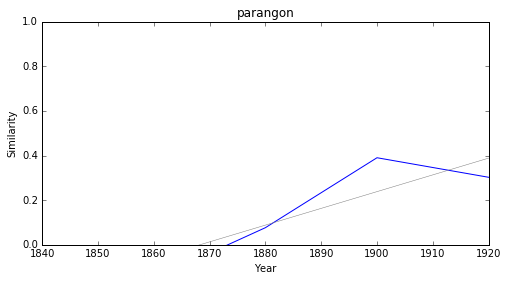

symboliste


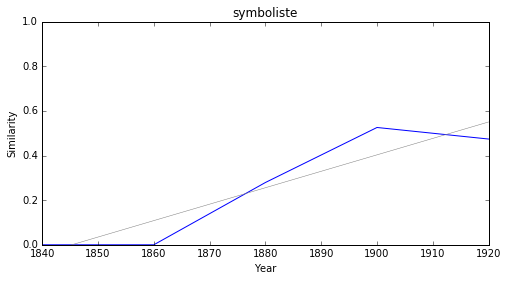

orientation


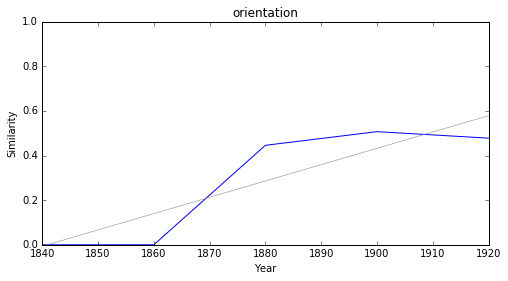

adaptation


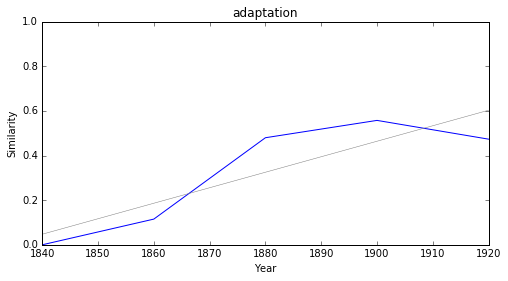

concept


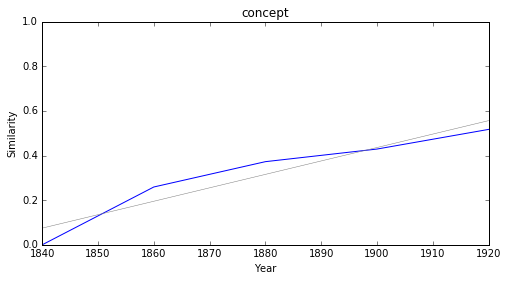

néo


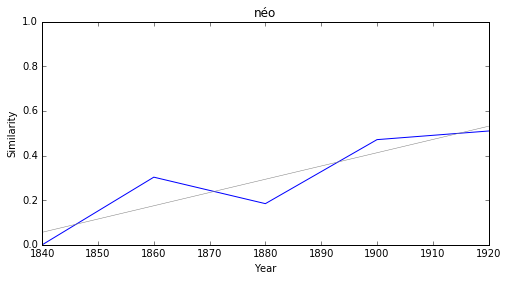

sociologique


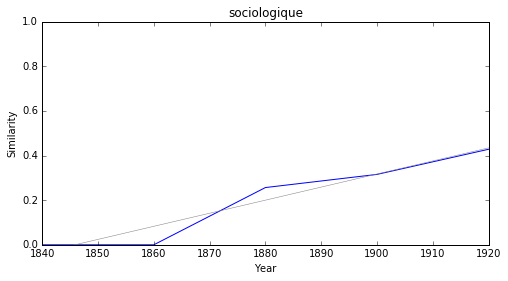

nationalisme


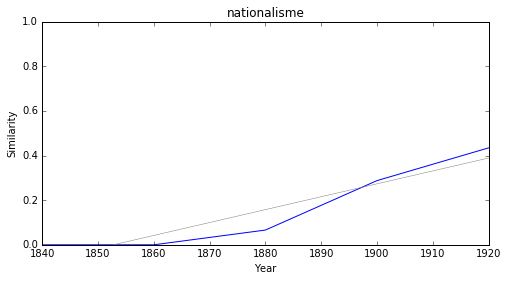

déformation


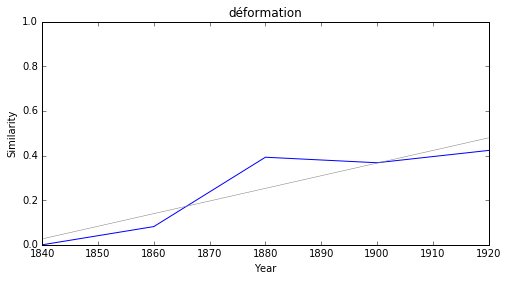

### <i><b>naturalisme</i></b>

                token     slope         p
79         macpherson -0.005598  0.000078
64           urbanité -0.004910  0.020588
72           jocrisse -0.004880  0.004221
2            cauchois -0.004647  0.033813
74       monstruosité -0.003939  0.026360
67        prostration -0.003902  0.008070
60        empiétement -0.003877  0.044013
34            étrurie -0.003649  0.013272
36  expérimentalement -0.003593  0.027558
6        schismatique -0.003584  0.020541



humanisme


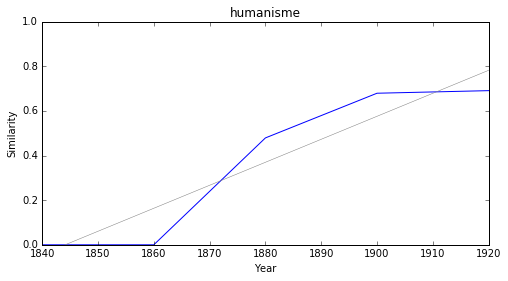

orientation


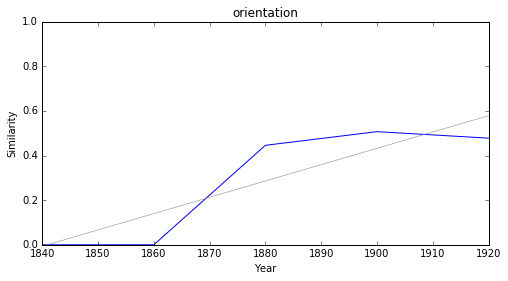

adaptation


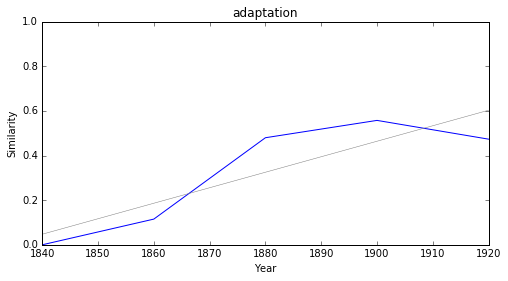

évolutionniste


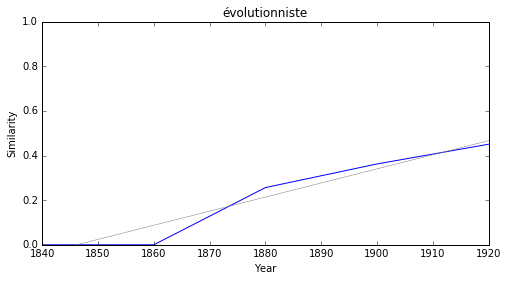

immanent


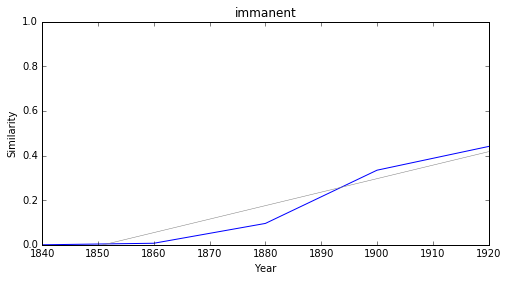

concept


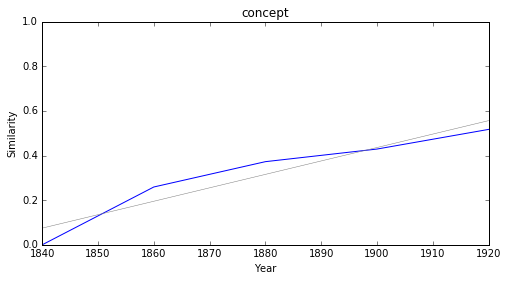

néo


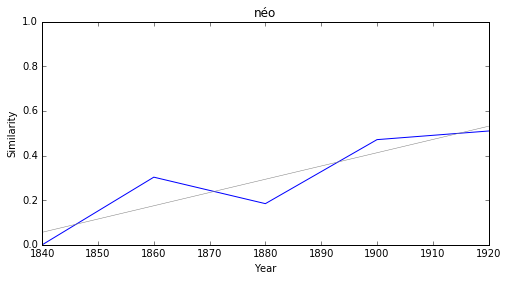

sociologique


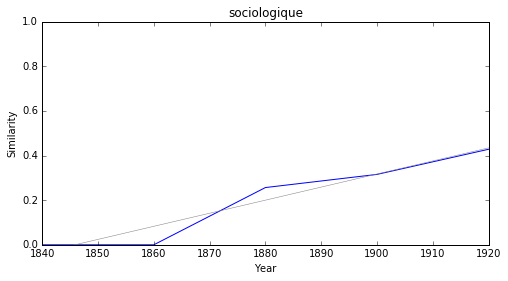

nationalisme


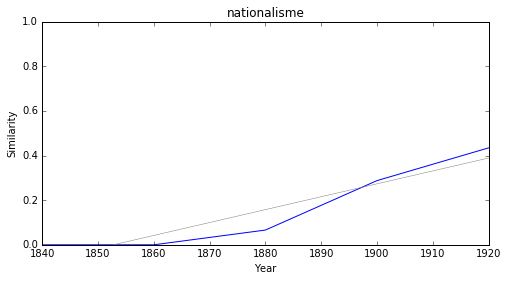

déformation


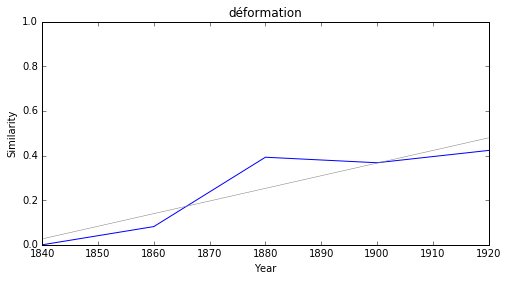

In [194]:
for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df2 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df2.sort_values('slope', ascending=True).head(10))
    print('\n\n')
    
    for i, row in df2.sort_values('slope', ascending=False).head(10).iterrows():
        plot_cosine_series('littérature', row['token'], 8, 4)

# Intersected neighbors

In this part, we show which significant terms tend to be, throughout time, the nearest neighbours to the main entry. That is to say that these vectors follow the same evolution through time as the main entry and are very near to the "littérature" vector. At this stage, we only ask for significant terms (filter above : "if fit.pvalues[1] < 0.05").

In [195]:
def intersect_neighbor_vocab(anchor, topn=2000):
    
    vocabs = []
    
    for year, model in models.items():
        similar = model.most_similar(anchor, topn=topn)
        vocabs.append(set([s[0] for s in similar]))
        
    return set.intersection(*vocabs)

In [196]:
intersect_vocab = intersect_neighbor_vocab('littérature')

In [197]:
entries={}

for word in testList:
    data = []
    for token in intersect_neighbor_vocab(word):
    
        series = cosine_series('littérature', token)
        fit = lin_reg(series)
    
        if fit.pvalues[1] < 0.05:
            data.append((token, fit.params[1], fit.pvalues[1]))
    entries[word]=data

In [198]:
import pandas as pd

### <i><b>littérature</i></b>

          token     slope         p
26     monument -0.002199  0.010337
5   comparaison -0.002012  0.041023
24         goût -0.001436  0.022249
21     négation  0.000728  0.018132
20   romanesque  0.000956  0.041144
18      domaine  0.001052  0.005780
7   association  0.001079  0.022985
0      enrichir  0.001115  0.034291
9       utilité  0.001188  0.040852
23    inventeur  0.001277  0.012185



monument


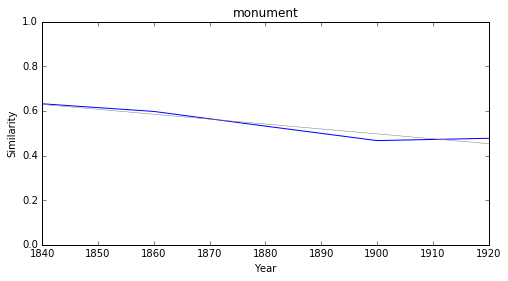

comparaison


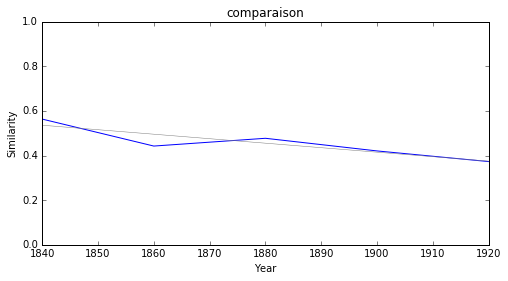

goût


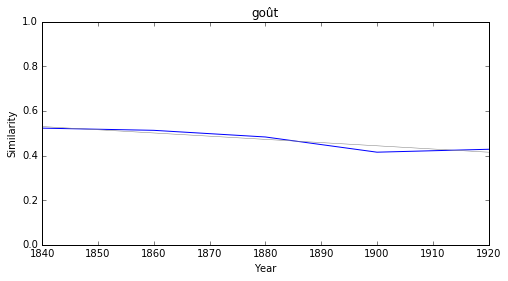

négation


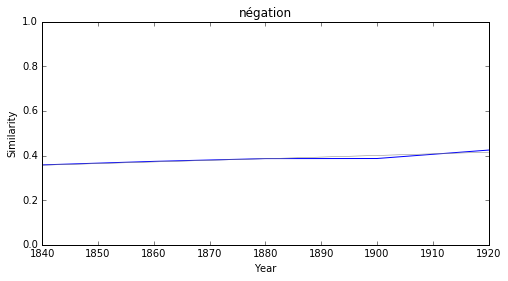

romanesque


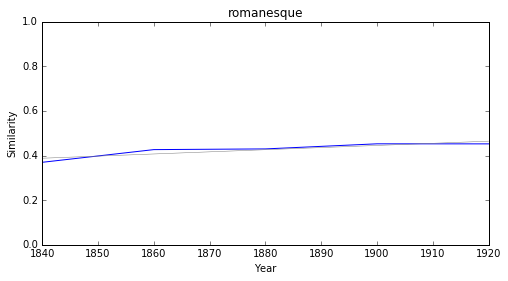

domaine


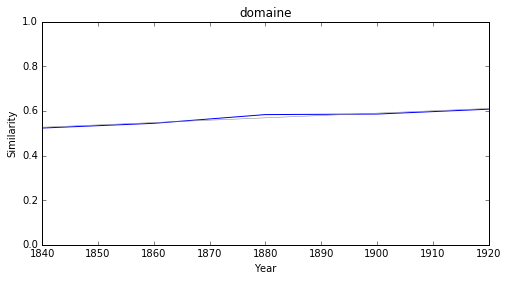

association


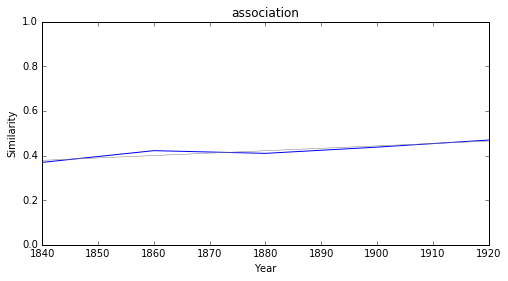

enrichir


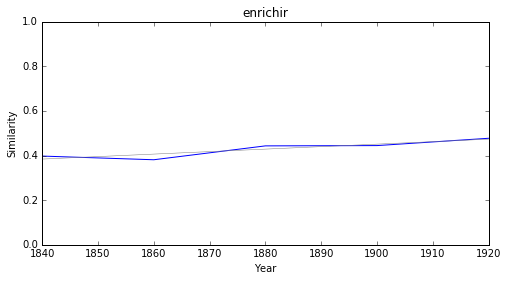

utilité


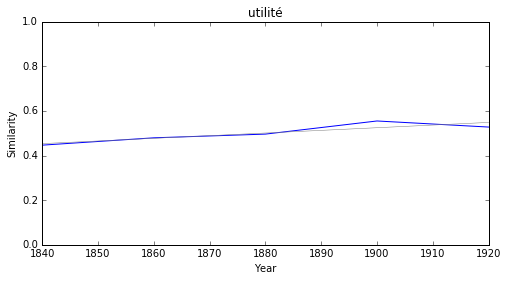

inventeur


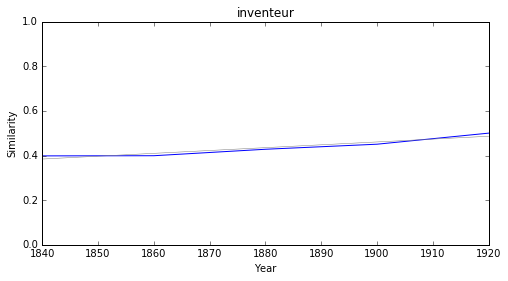

### <i><b>poésie</i></b>

            token     slope         p
4   véritablement -0.002781  0.027337
24       monument -0.002199  0.010337
3     comparaison -0.002012  0.041023
7     merveilleux -0.001801  0.022211
22      ressource -0.001504  0.009807
13           vers -0.001211  0.048255
19     romanesque  0.000956  0.041144
17        domaine  0.001052  0.005780
8         utilité  0.001188  0.040852
21      inventeur  0.001277  0.012185



véritablement


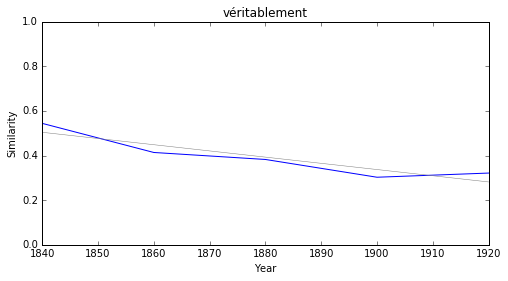

monument


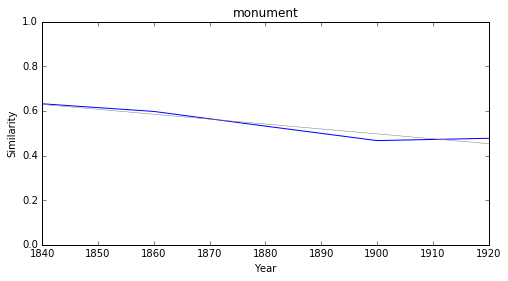

comparaison


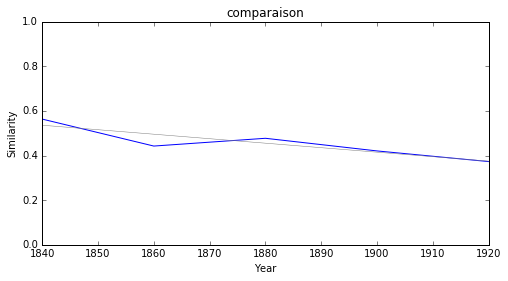

merveilleux


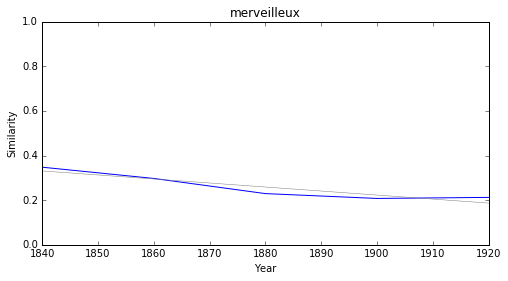

ressource


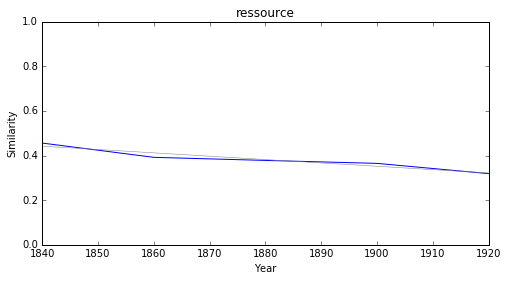

vers


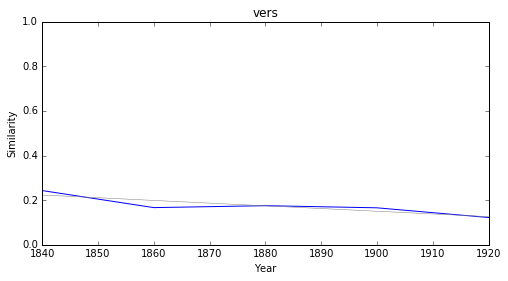

romanesque


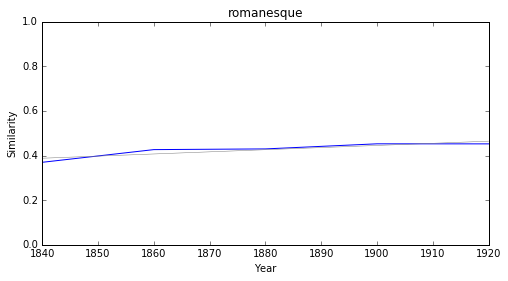

domaine


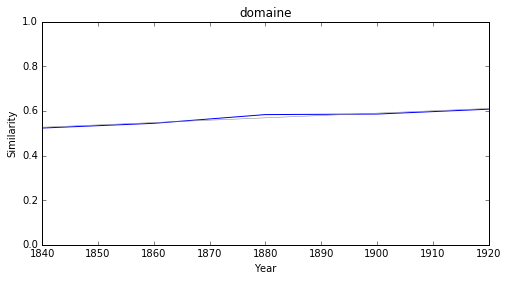

utilité


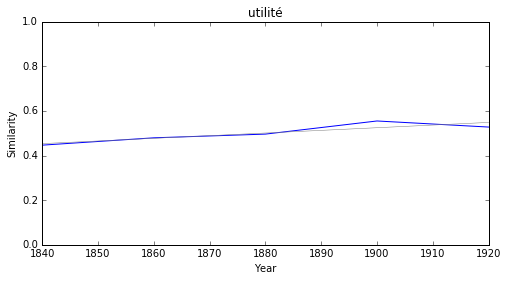

inventeur


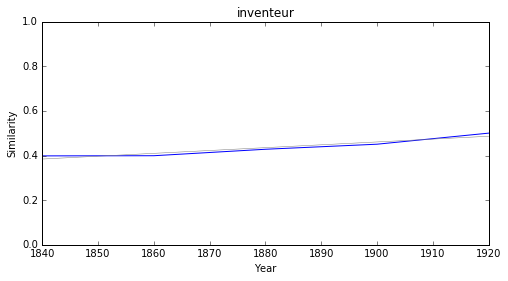

### <i><b>science</i></b>

               token     slope         p
1      physiologique -0.003338  0.019118
15       théologique -0.003168  0.017397
4      véritablement -0.002781  0.027337
26         ressource -0.001504  0.009807
27              goût -0.001436  0.022249
22  affranchissement -0.001287  0.041211
20          négation  0.000728  0.018132
16           domaine  0.001052  0.005780
5        association  0.001079  0.022985
9            utilité  0.001188  0.040852



physiologique


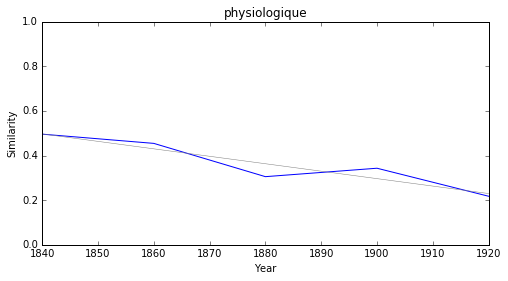

théologique


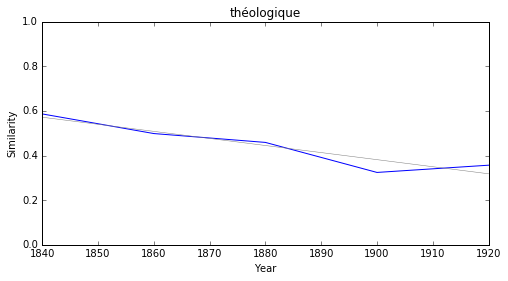

véritablement


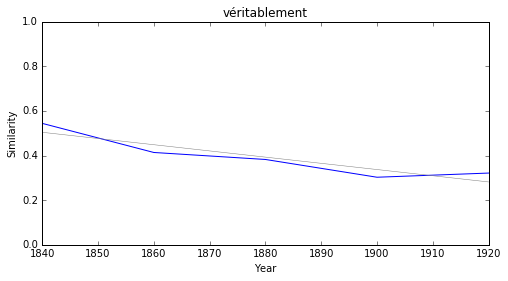

ressource


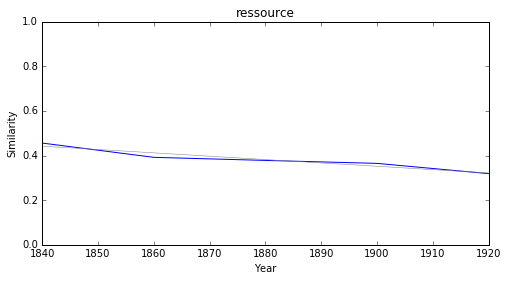

goût


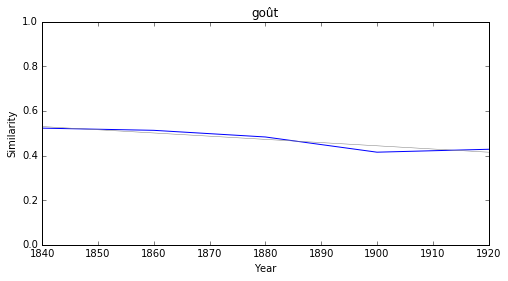

affranchissement


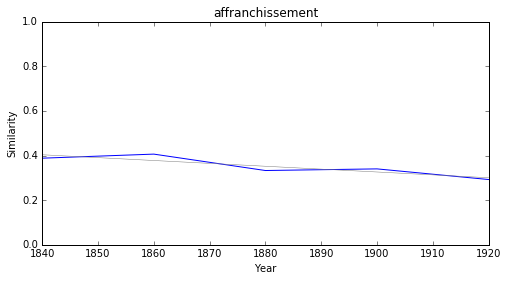

négation


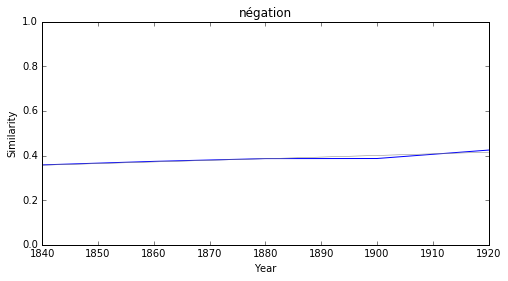

domaine


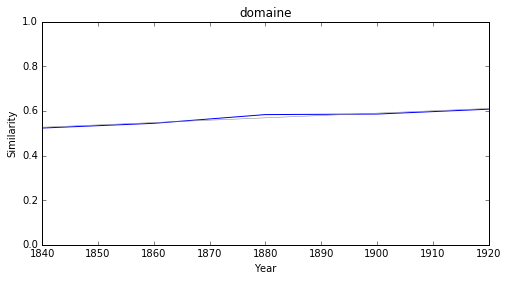

association


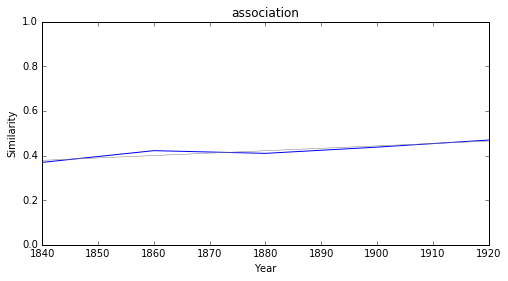

utilité


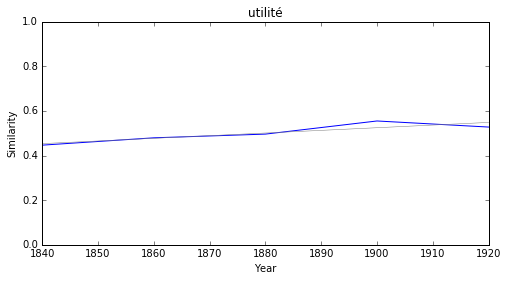

### <i><b>savoir</i></b>

            token     slope         p
0              oh -0.003587  0.029046
6         charmer -0.003341  0.049599
2       réfléchir -0.003284  0.030711
5   véritablement -0.002781  0.027337
1           envie -0.002764  0.016561
16       regarder -0.002592  0.005209
18        admirer -0.002447  0.034599
11        écouter -0.002370  0.029324
12       corriger -0.002326  0.033348
20            oui -0.002151  0.049503



oh


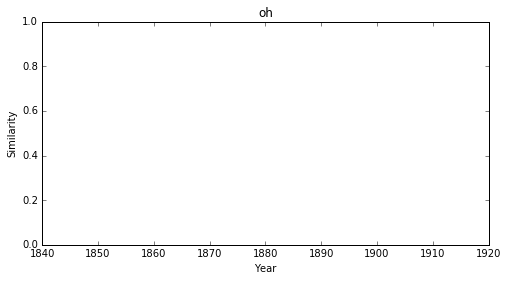

charmer


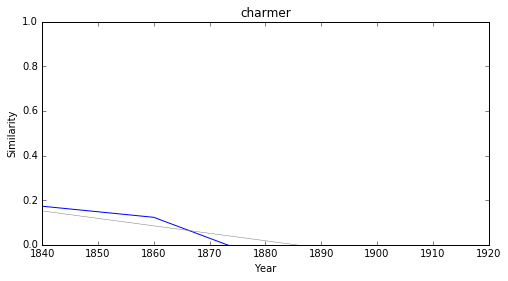

réfléchir


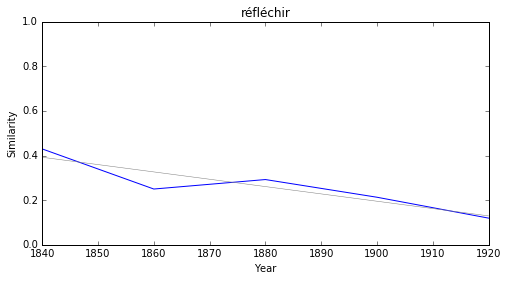

véritablement


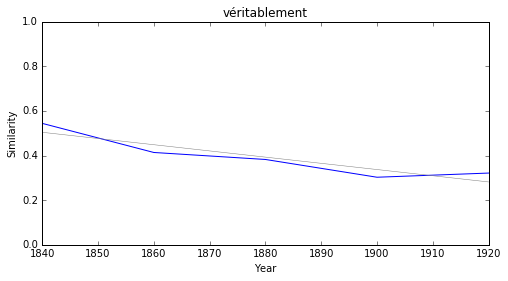

envie


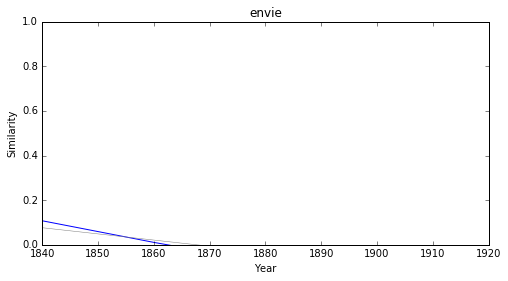

regarder


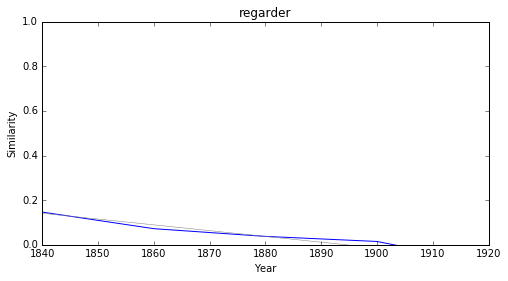

admirer


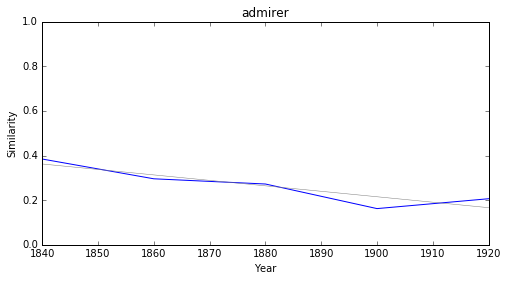

écouter


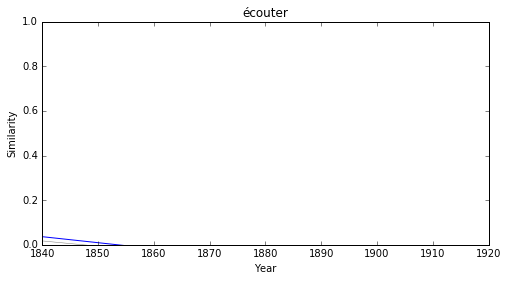

corriger


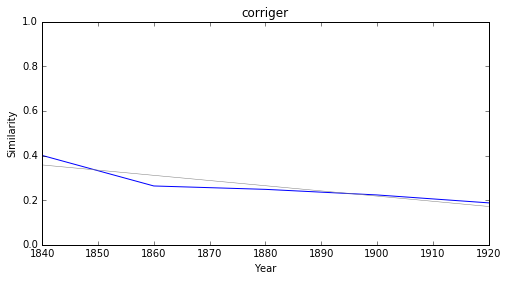

oui


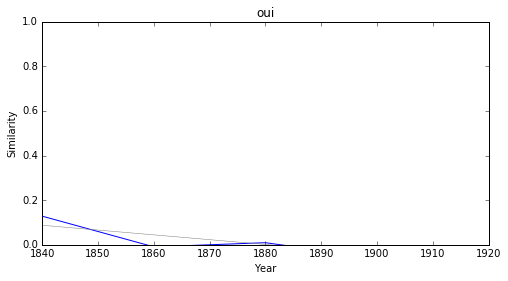

### <i><b>histoire</i></b>

          token     slope         p
22     monument -0.002199  0.010337
17   romanesque  0.000956  0.041144
15      domaine  0.001052  0.005780
18       charte  0.001073  0.007169
6   association  0.001079  0.022985
8       utilité  0.001188  0.040852
11        revue  0.001511  0.012991
16     synthèse  0.001765  0.014498
0      institut  0.001843  0.037446
9    communauté  0.001860  0.027865



monument


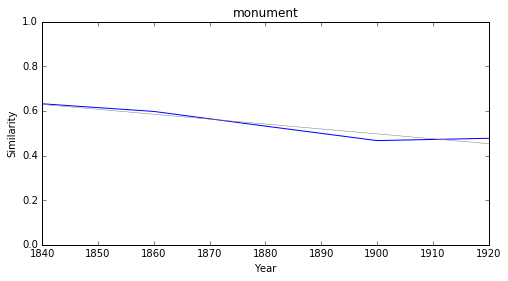

romanesque


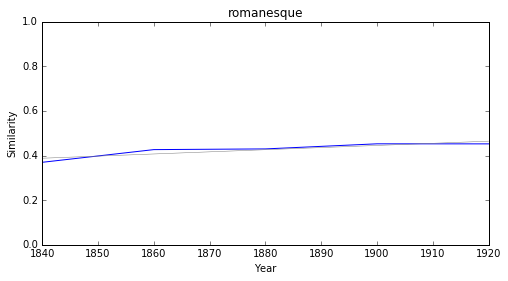

domaine


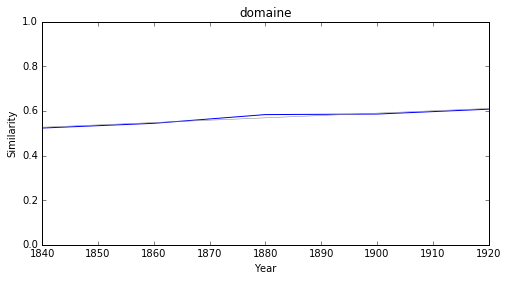

charte


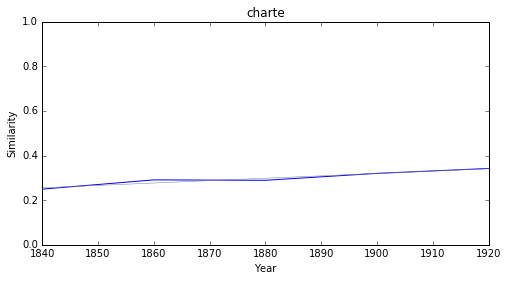

association


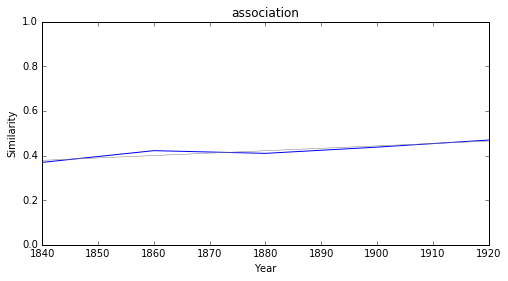

utilité


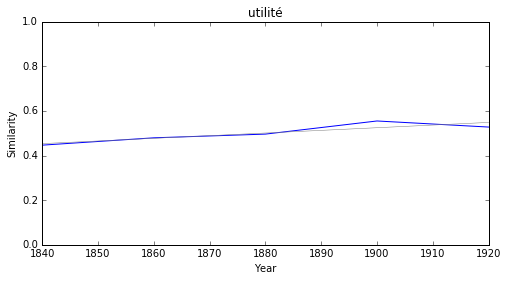

revue


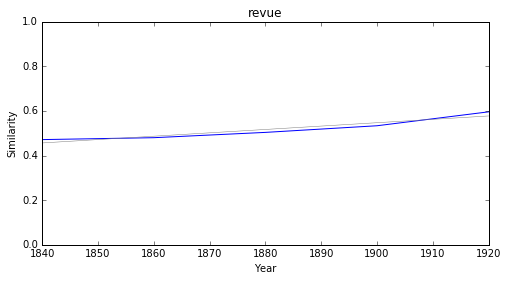

synthèse


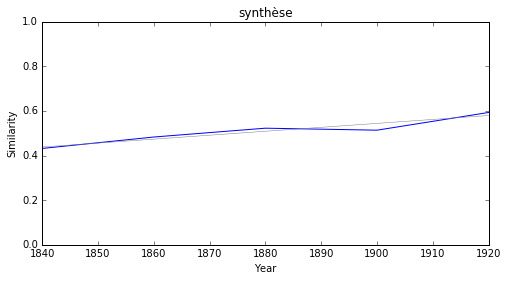

institut


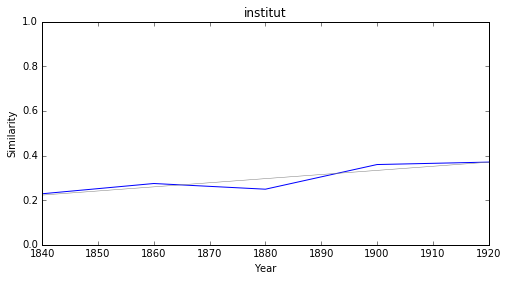

communauté


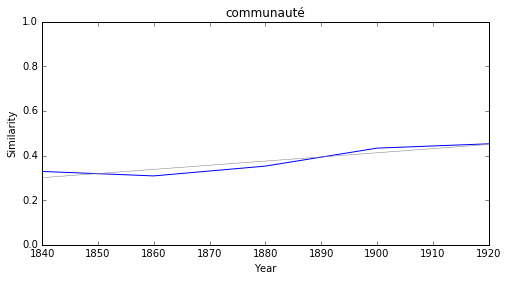

### <i><b>philosophie</i></b>

               token     slope         p
14       théologique -0.003168  0.017397
27          monument -0.002199  0.010337
12           dériver -0.001752  0.037587
25              goût -0.001436  0.022249
21  affranchissement -0.001287  0.041211
18          négation  0.000728  0.018132
17        romanesque  0.000956  0.041144
15           domaine  0.001052  0.005780
4        association  0.001079  0.022985
6            utilité  0.001188  0.040852



théologique


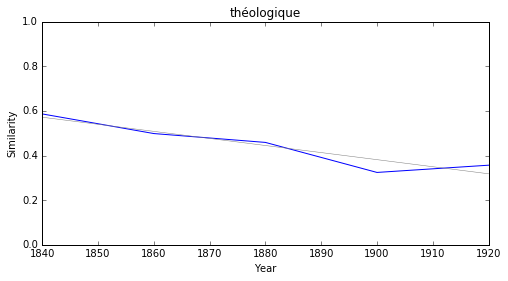

monument


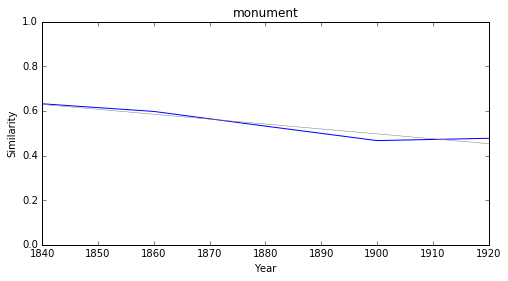

dériver


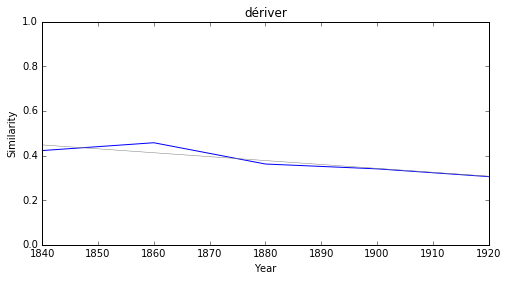

goût


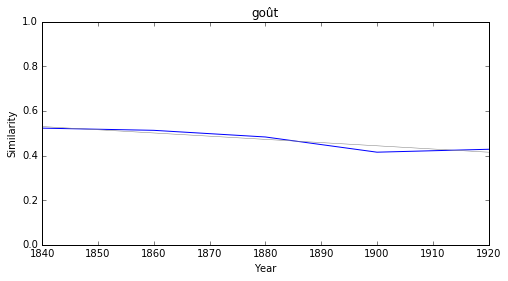

affranchissement


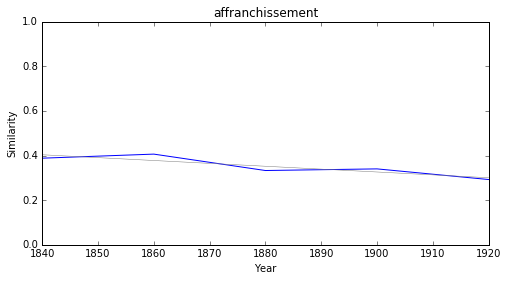

négation


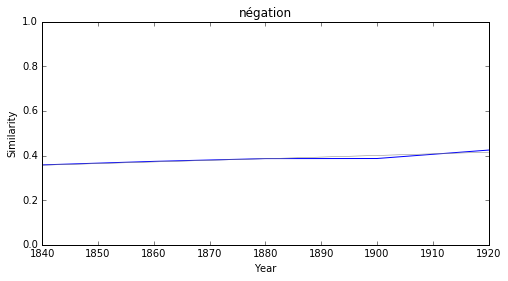

romanesque


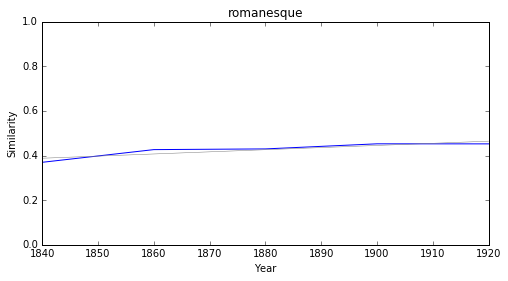

domaine


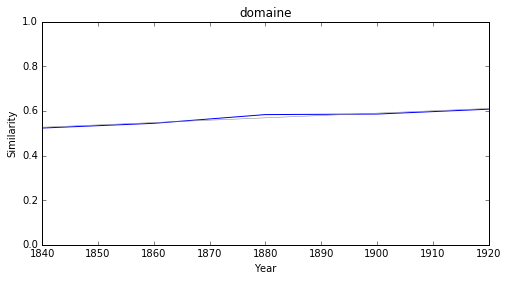

association


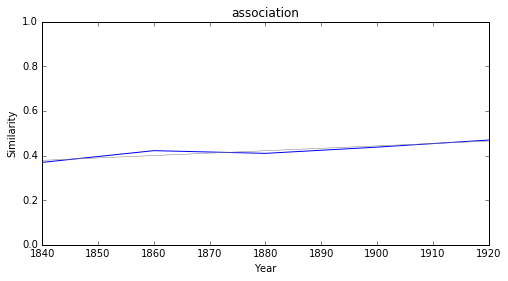

utilité


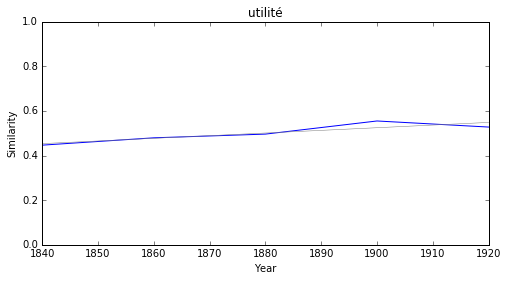

### <i><b>lettre</i></b>

            token     slope         p
4          sonnet -0.003838  0.003141
6          eugène -0.001914  0.015835
7           revue  0.001511  0.012991
1        institut  0.001843  0.037446
3          sermon  0.001849  0.046824
10       province  0.002332  0.021761
2            mars  0.002677  0.003709
8       grammaire  0.002686  0.019628
9        bulletin  0.002832  0.038166
0   bibliographie  0.003516  0.014661



sonnet


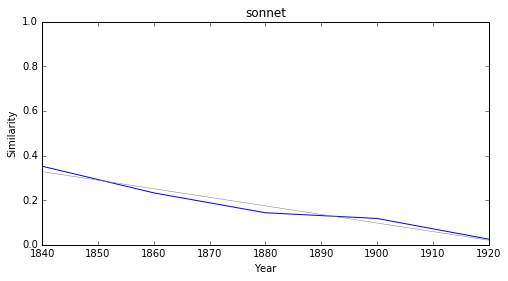

eugène


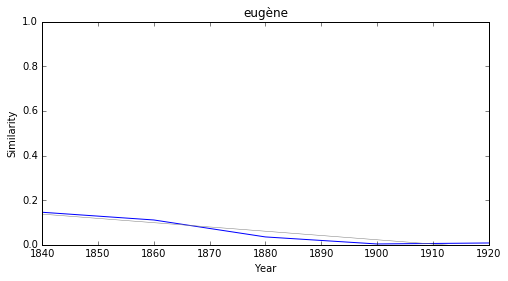

revue


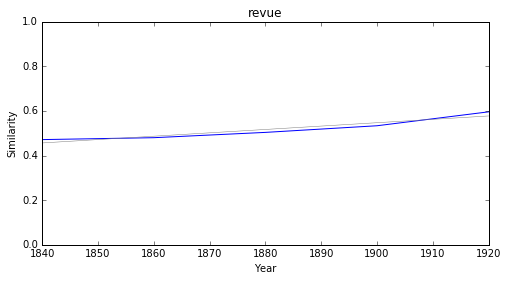

institut


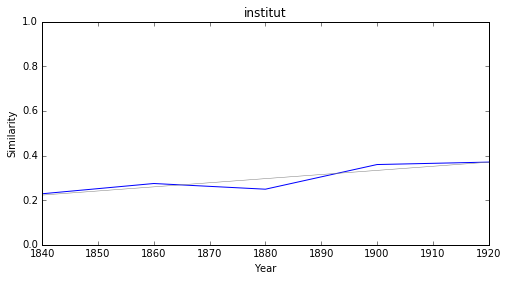

sermon


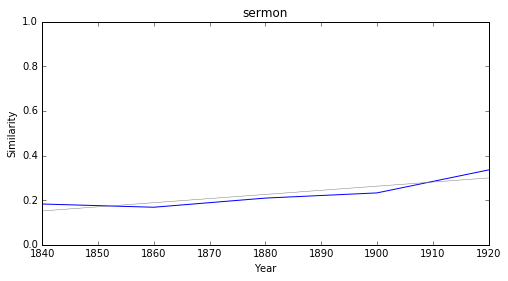

province


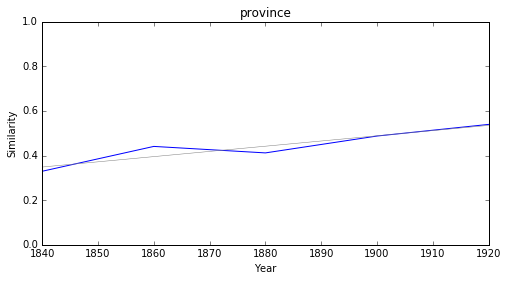

mars


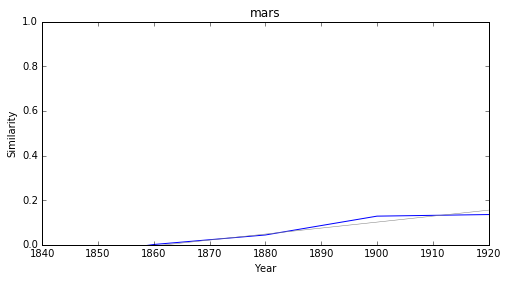

grammaire


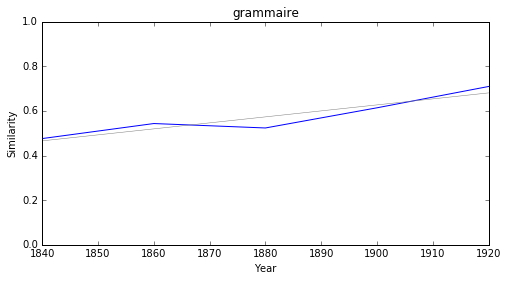

bulletin


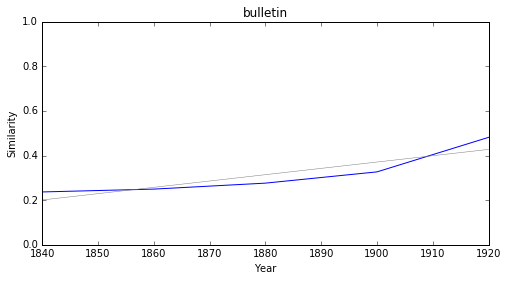

bibliographie


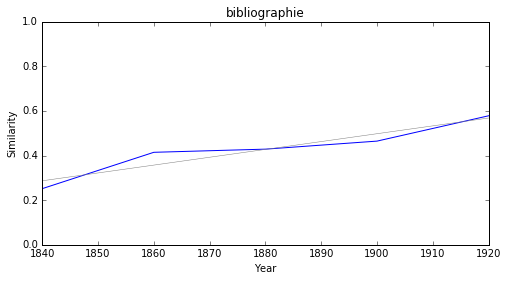

### <i><b>critique</i></b>

          token     slope         p
17      curieux -0.003188  0.009404
14     corriger -0.002326  0.033348
3   comparaison -0.002012  0.041023
19         goût -0.001436  0.022249
16     négation  0.000728  0.018132
13   romanesque  0.000956  0.041144
11      domaine  0.001052  0.005780
15       défini  0.001105  0.014490
7       utilité  0.001188  0.040852
18    inventeur  0.001277  0.012185



curieux


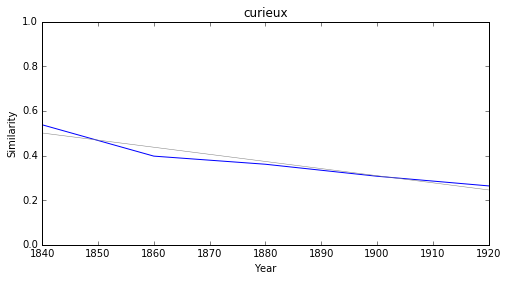

corriger


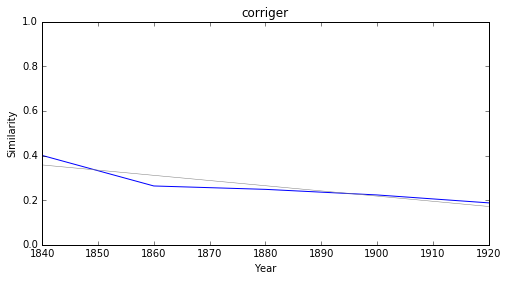

comparaison


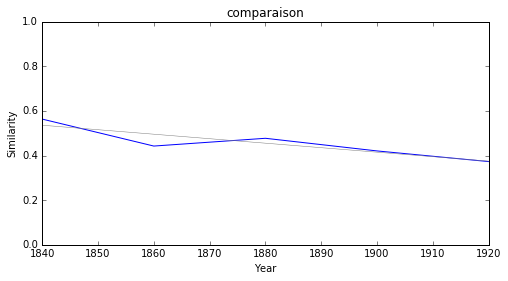

goût


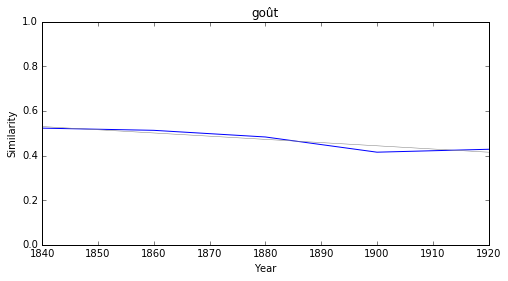

négation


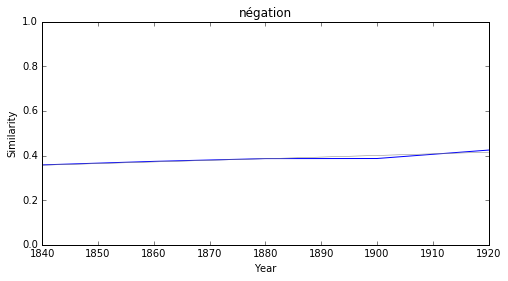

romanesque


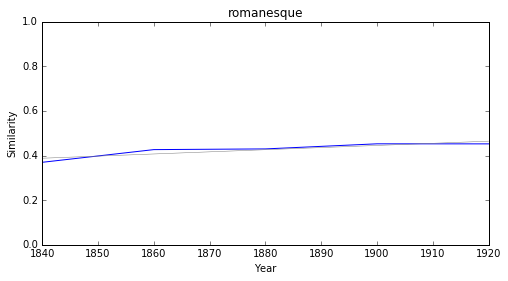

domaine


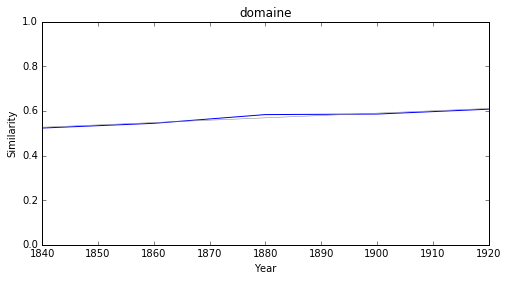

défini


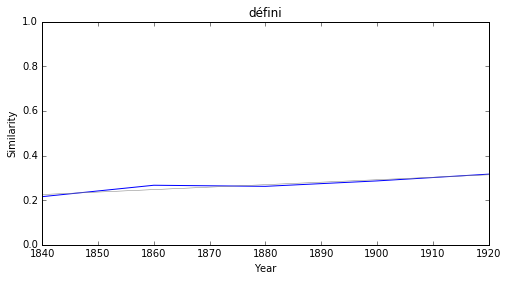

utilité


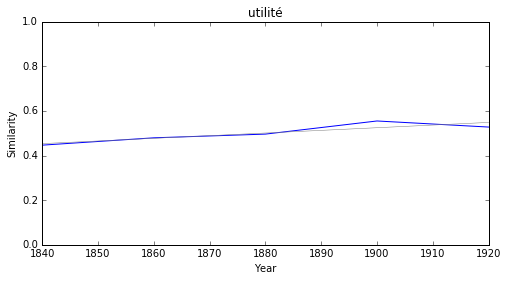

inventeur


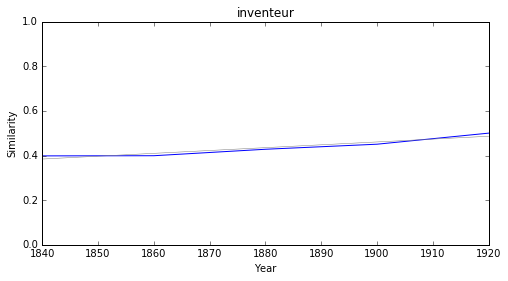

### <i><b>roman</i></b>

         token     slope         p
13      sonnet -0.003838  0.003141
10     curieux -0.003188  0.009404
16    monument -0.002199  0.010337
11   romancero -0.000984  0.028103
9   romanesque  0.000956  0.041144
8      domaine  0.001052  0.005780
12   inventeur  0.001277  0.012185
6        revue  0.001511  0.012991
0       sermon  0.001849  0.046824
3   précurseur  0.002266  0.036940



sonnet


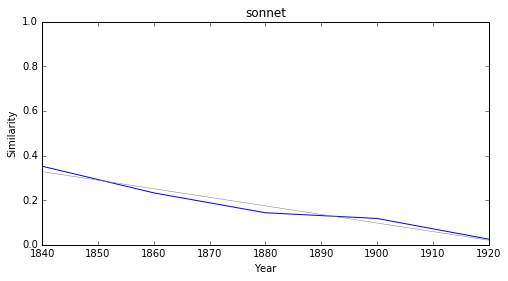

curieux


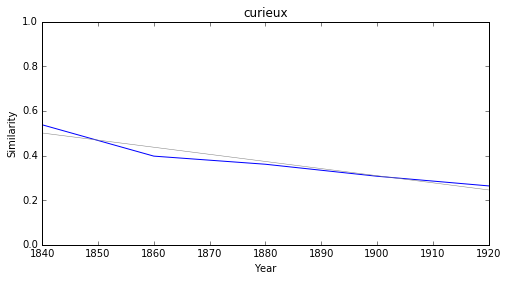

monument


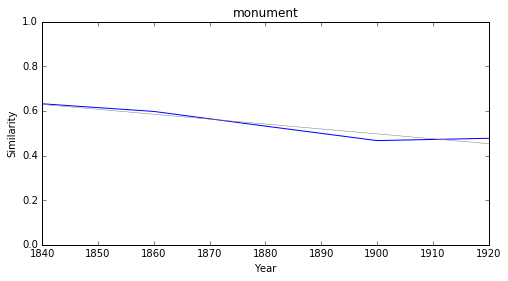

romancero


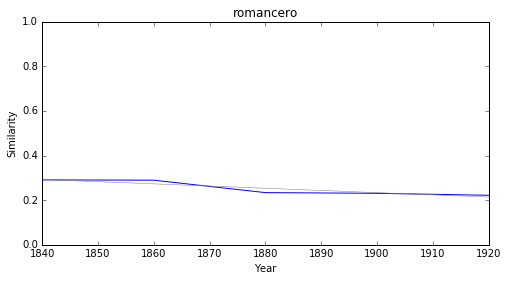

romanesque


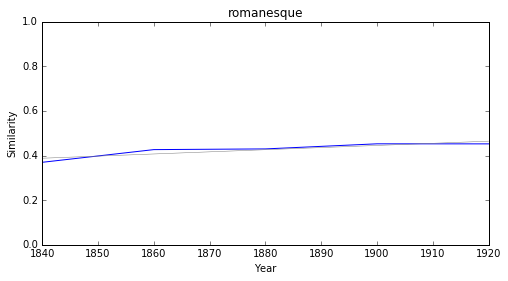

domaine


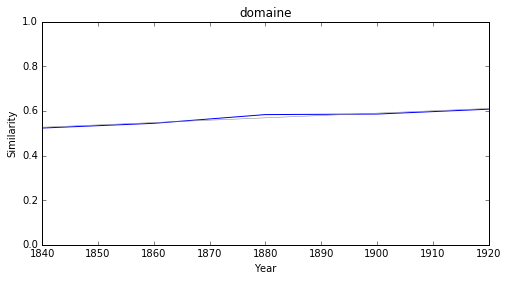

inventeur


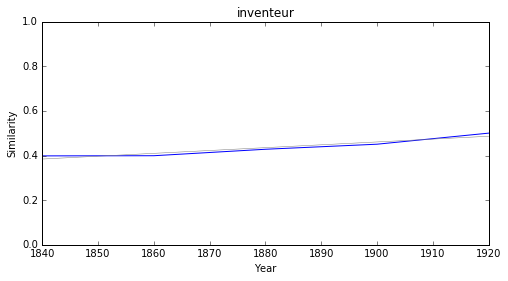

revue


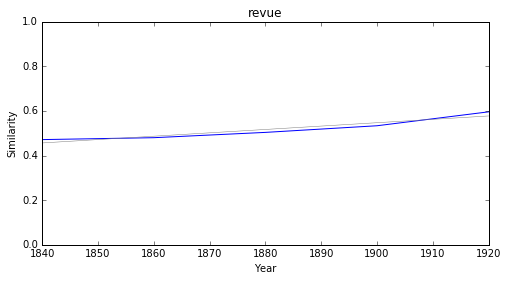

sermon


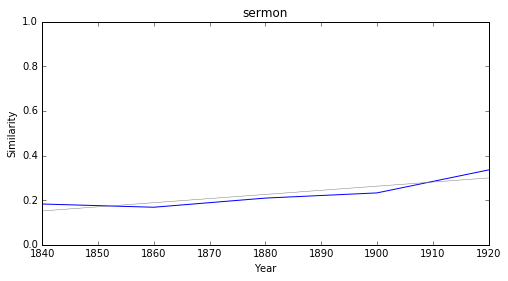

précurseur


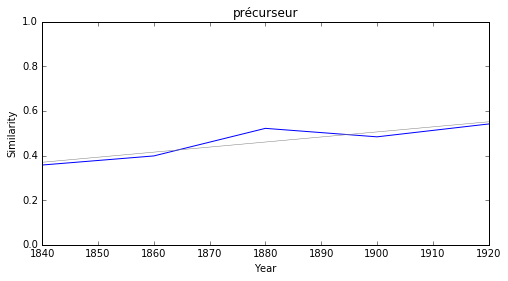

### <i><b>théâtre</i></b>

          token     slope         p
13     monument -0.002199  0.010337
10         goût -0.001436  0.022249
5       domaine  0.001052  0.005780
2         moyen  0.002180  0.038991
8      province  0.002332  0.021761
7    territoire  0.002409  0.024115
4      parnasse  0.002535  0.034833
3   renaissance  0.002579  0.005921
11    grammaire  0.002686  0.019628
12     bulletin  0.002832  0.038166



monument


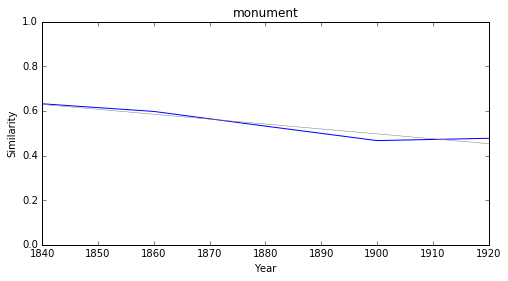

goût


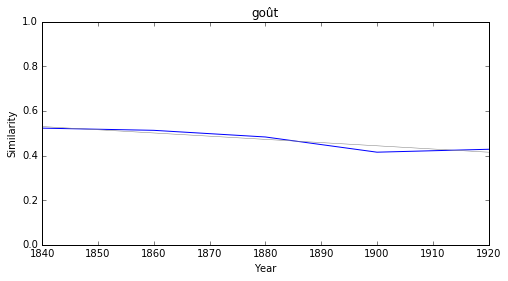

domaine


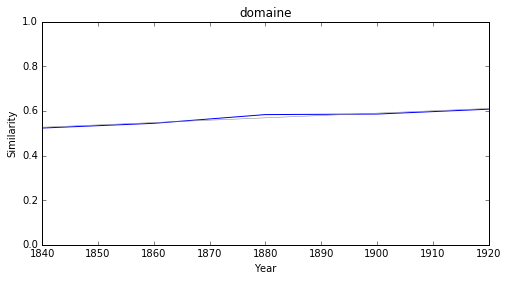

moyen


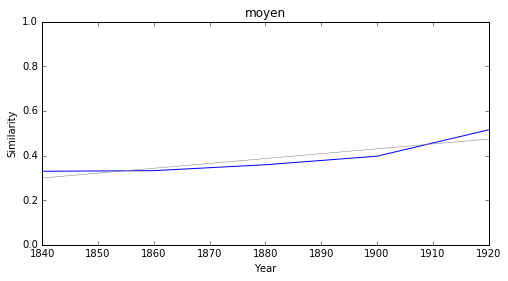

province


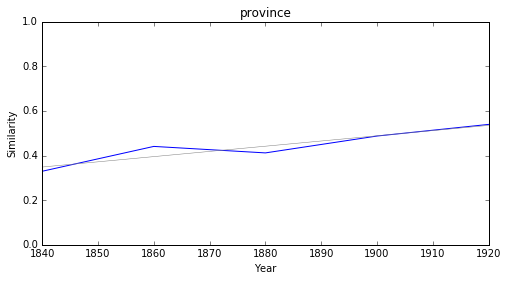

territoire


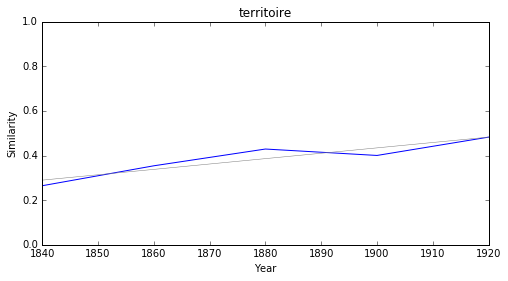

parnasse


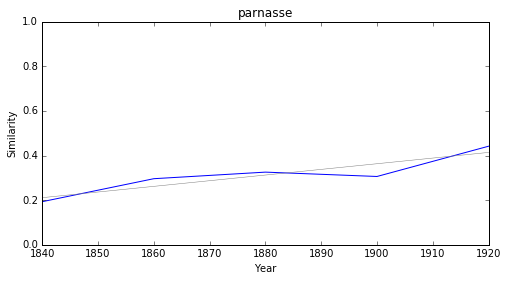

renaissance


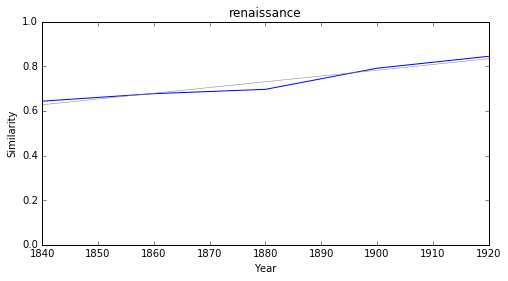

grammaire


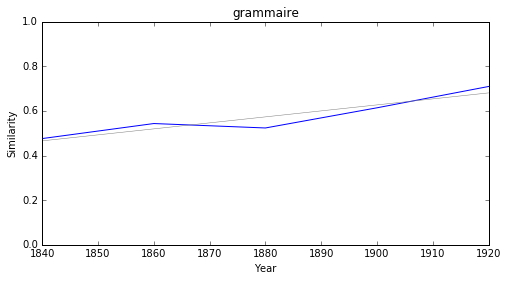

bulletin


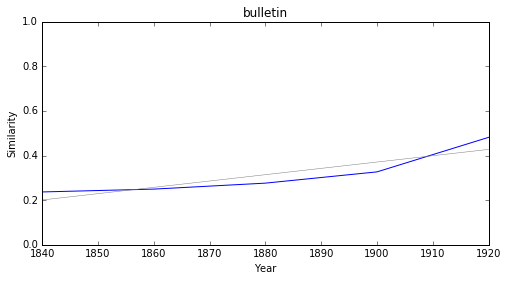

### <i><b>drame</i></b>

         token     slope         p
8         vers -0.001211  0.048255
11   romancero -0.000984  0.028103
2   romanesque  0.000956  0.041144
14     domaine  0.001052  0.005780
15   inventeur  0.001277  0.012185
1     synthèse  0.001765  0.014498
0       sermon  0.001849  0.046824
6   esthétique  0.001901  0.000404
13  conception  0.002287  0.026294
4     parnasse  0.002535  0.034833



vers


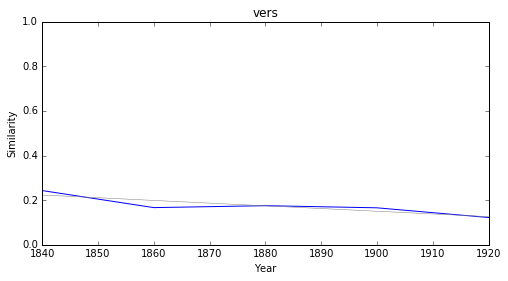

romancero


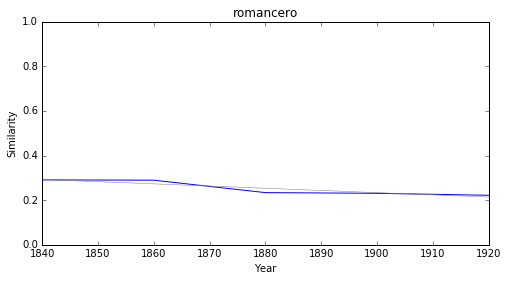

romanesque


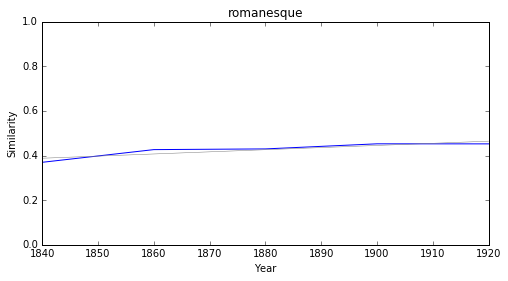

domaine


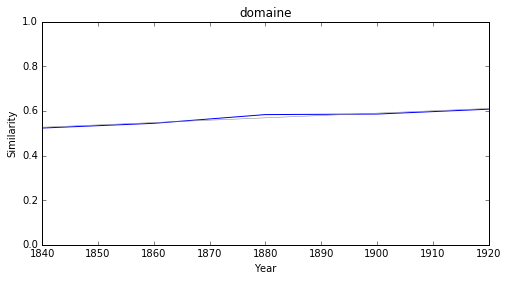

inventeur


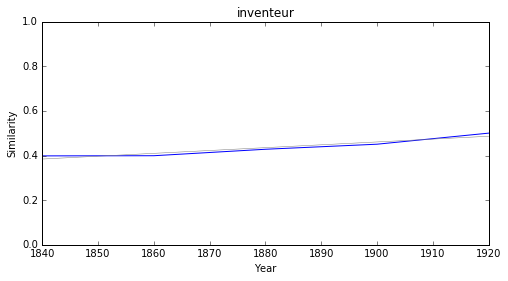

synthèse


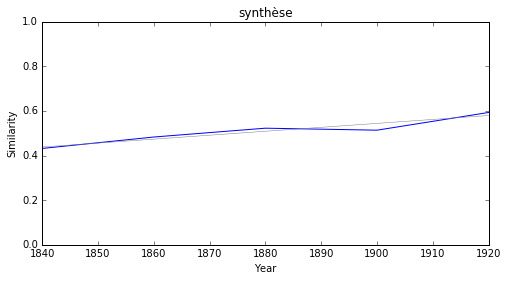

sermon


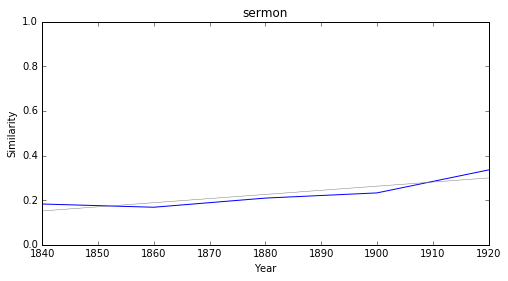

esthétique


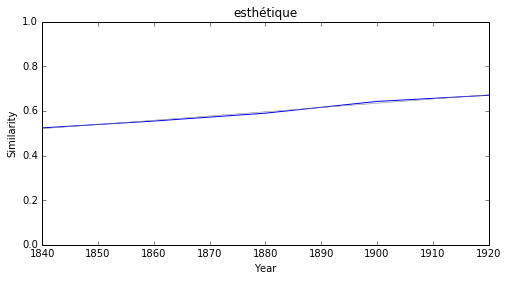

conception


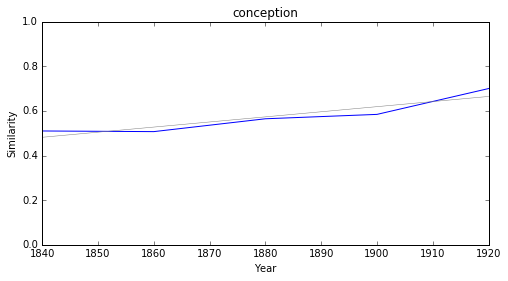

parnasse


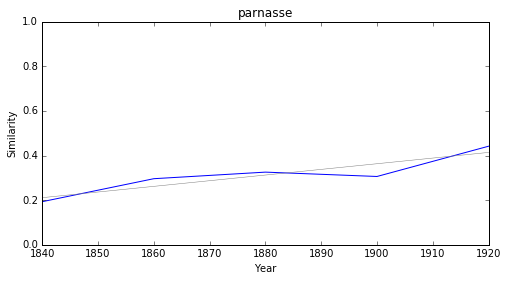

### <i><b>esprit</i></b>

            token     slope         p
19         infini -0.003155  0.022718
20        lumière -0.002905  0.038098
4   véritablement -0.002781  0.027337
25      concilier -0.002535  0.012500
9          allure -0.002426  0.036996
3     comparaison -0.002012  0.041023
5     sociabilité -0.001989  0.016107
7          simple -0.001824  0.043342
24      ressource -0.001504  0.009807
27           goût -0.001436  0.022249



infini


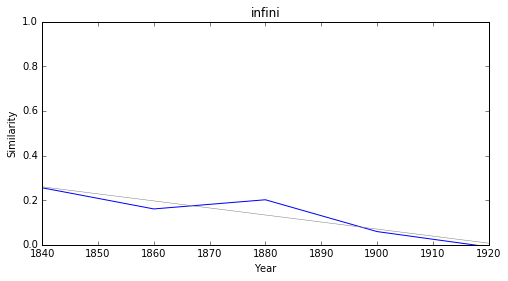

lumière


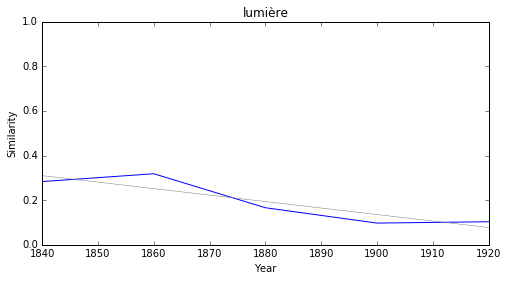

véritablement


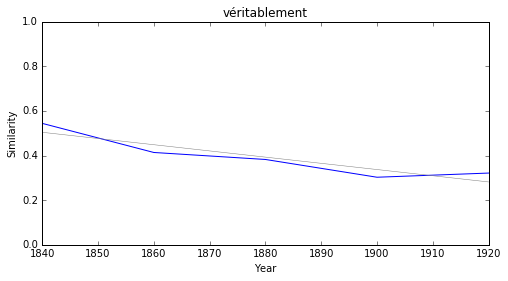

concilier


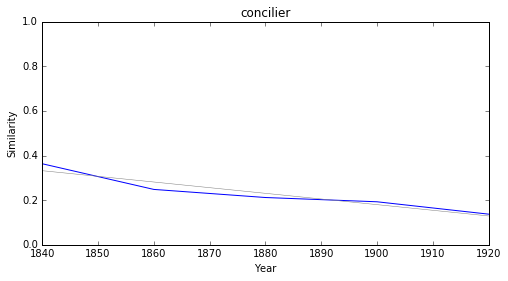

allure


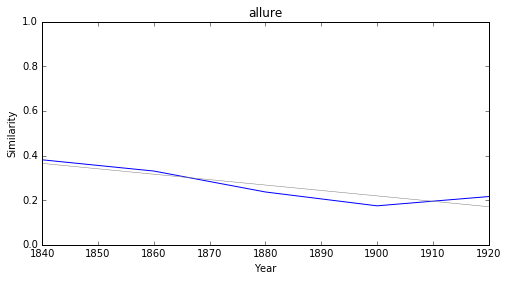

comparaison


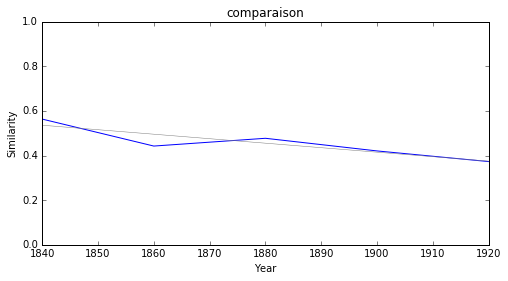

sociabilité


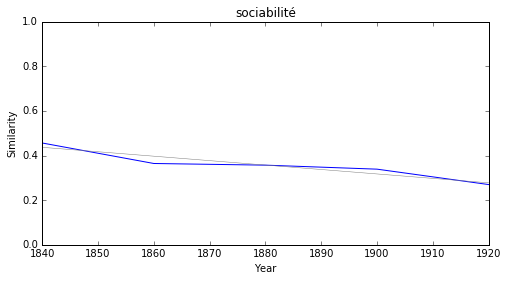

simple


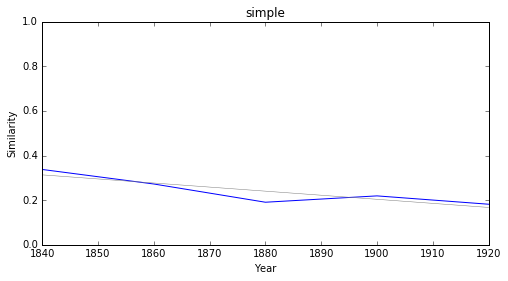

ressource


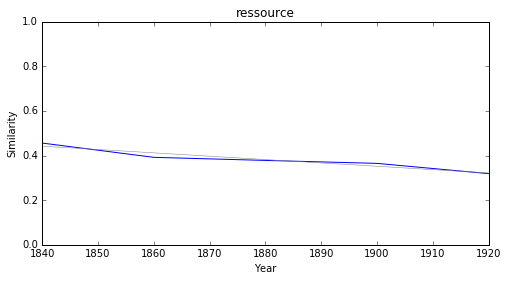

goût


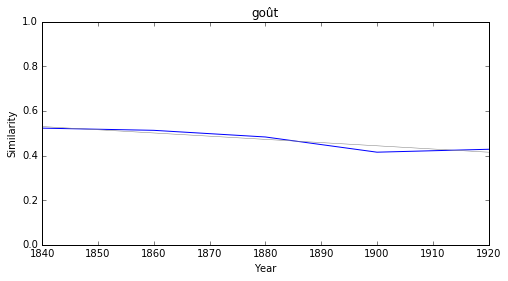

### <i><b>langue</i></b>

          token     slope         p
23     monument -0.002199  0.010337
4   comparaison -0.002012  0.041023
21         goût -0.001436  0.022249
19     négation  0.000728  0.018132
17      domaine  0.001052  0.005780
5   association  0.001079  0.022985
0      enrichir  0.001115  0.034291
8       utilité  0.001188  0.040852
20    inventeur  0.001277  0.012185
11   prétention  0.001296  0.034148



monument


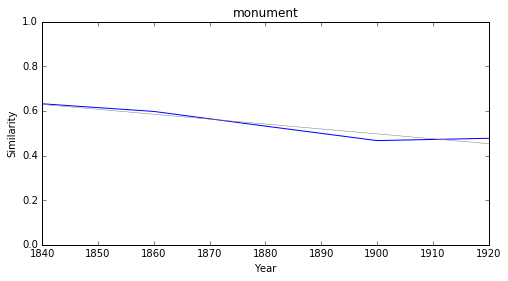

comparaison


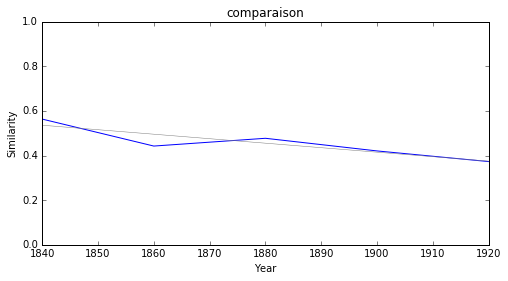

goût


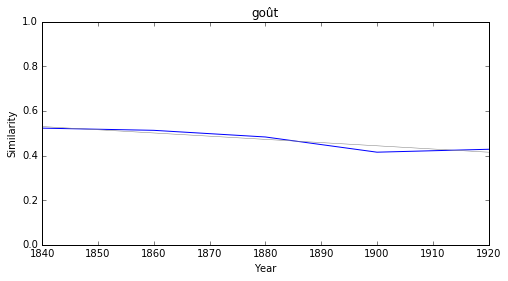

négation


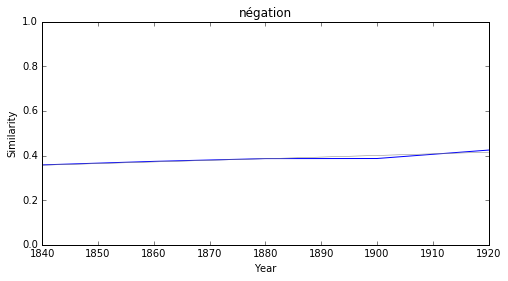

domaine


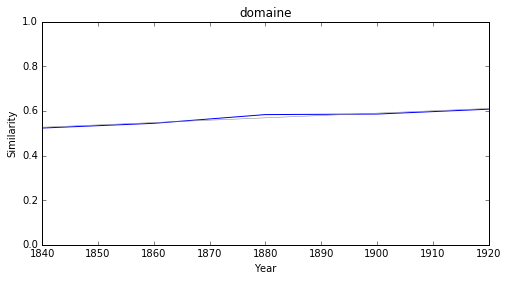

association


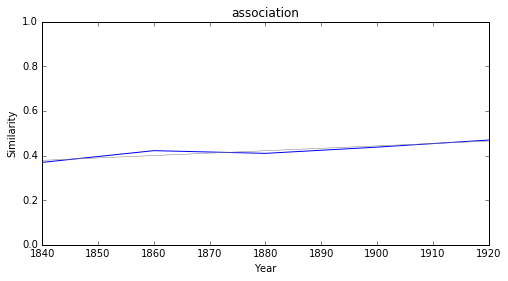

enrichir


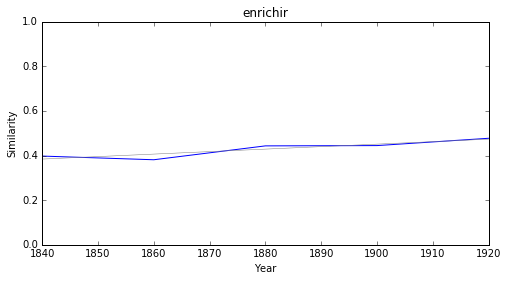

utilité


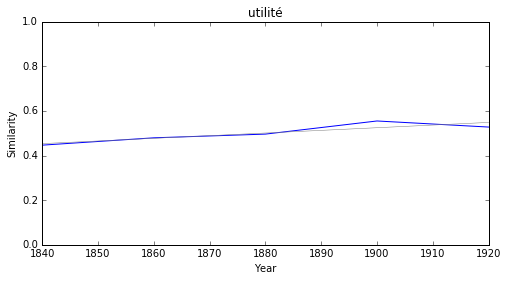

inventeur


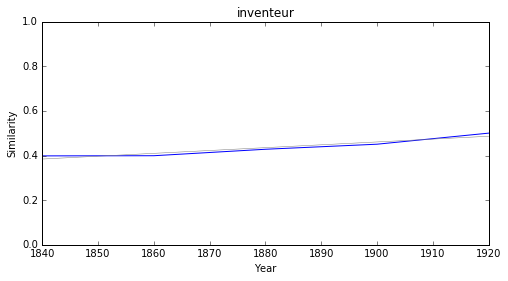

prétention


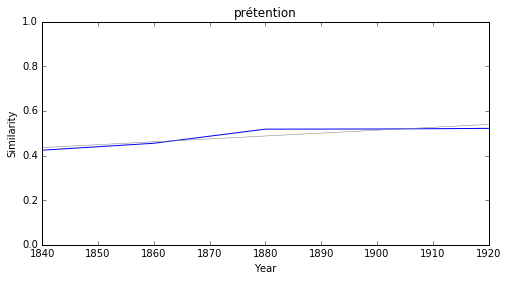

### <i><b>diplomatie</i></b>

     token     slope         p
0  papauté -0.002511  0.033482



papauté


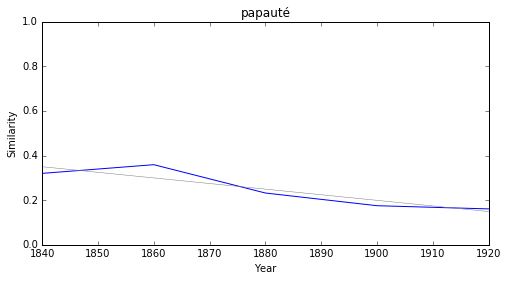

### <i><b>politique</i></b>

               token     slope         p
2      physiologique -0.003338  0.019118
18       théologique -0.003168  0.017397
3           barbarie -0.003002  0.020017
16           dériver -0.001752  0.037587
31              goût -0.001436  0.022249
28  affranchissement -0.001287  0.041211
23          négation  0.000728  0.018132
19           domaine  0.001052  0.005780
6        association  0.001079  0.022985
9            utilité  0.001188  0.040852



physiologique


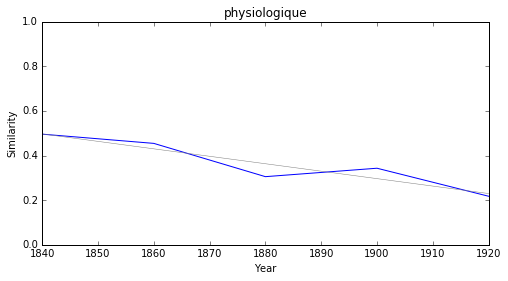

théologique


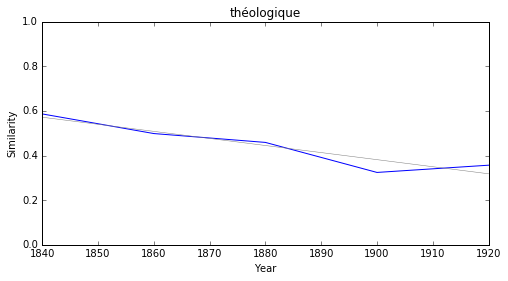

barbarie


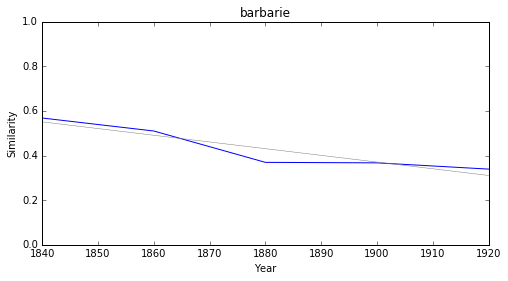

dériver


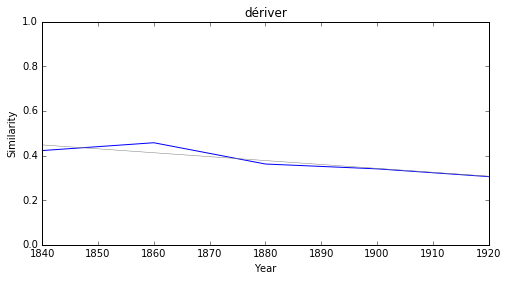

goût


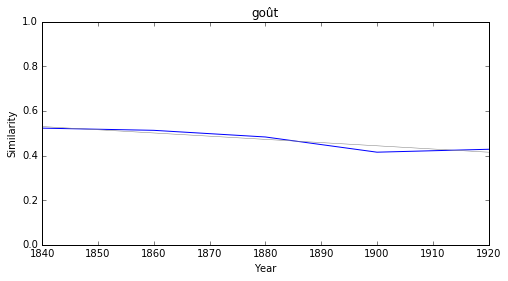

affranchissement


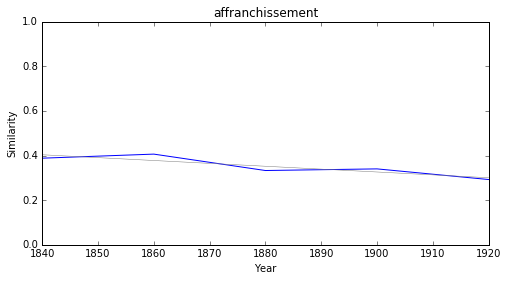

négation


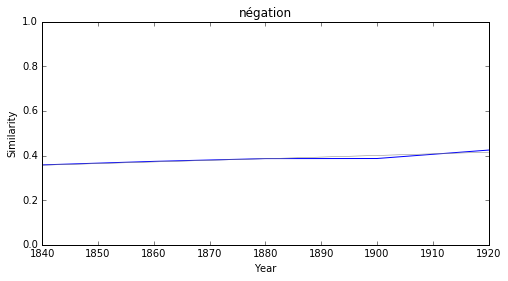

domaine


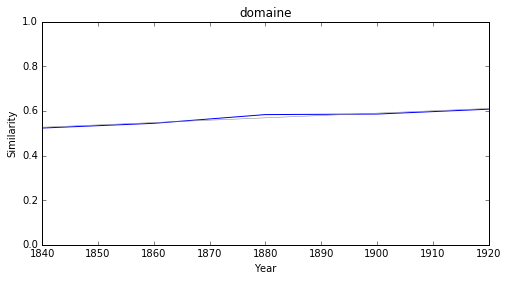

association


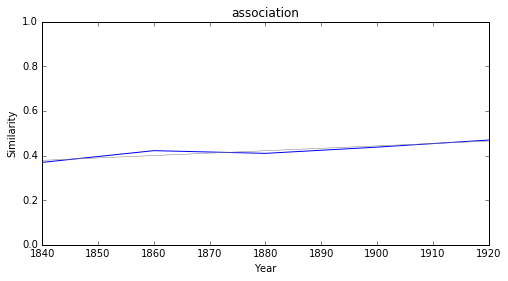

utilité


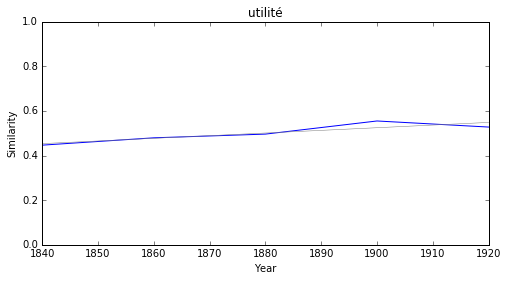

### <i><b>morale</i></b>

               token     slope         p
2      physiologique -0.003338  0.019118
15       théologique -0.003168  0.017397
21            infini -0.003155  0.022718
4      véritablement -0.002781  0.027337
17         induction -0.002543  0.043163
5             simple -0.001824  0.043342
27         ressource -0.001504  0.009807
29              goût -0.001436  0.022249
23  affranchissement -0.001287  0.041211
22          négation  0.000728  0.018132



physiologique


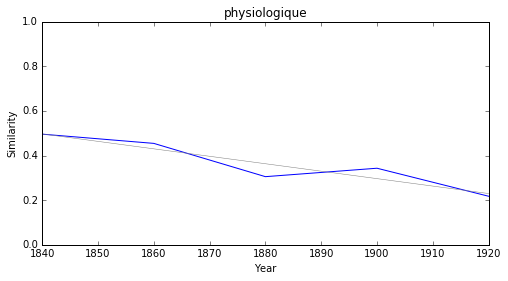

théologique


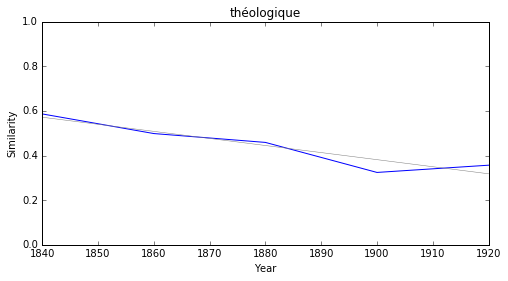

infini


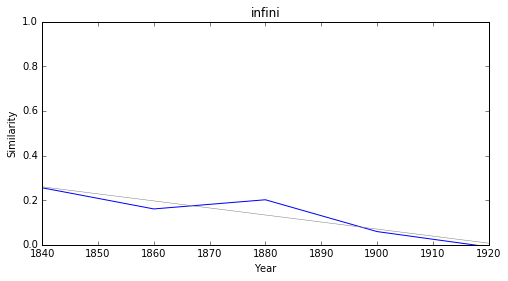

véritablement


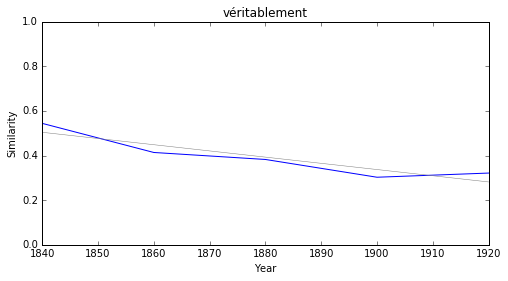

induction


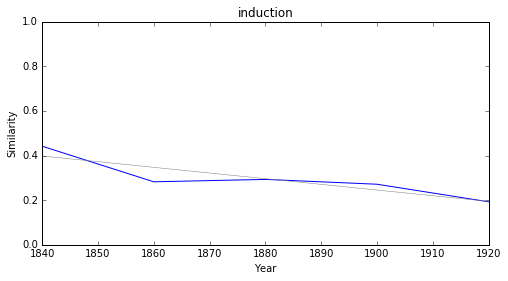

simple


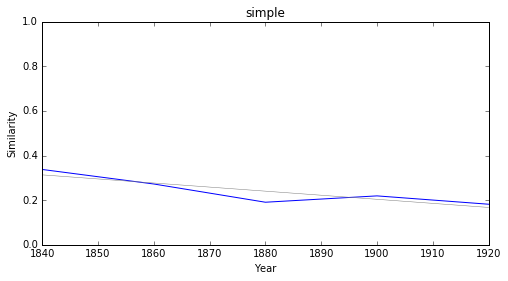

ressource


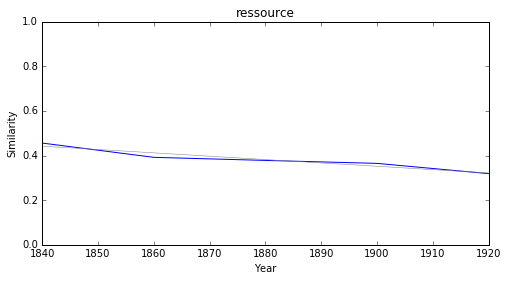

goût


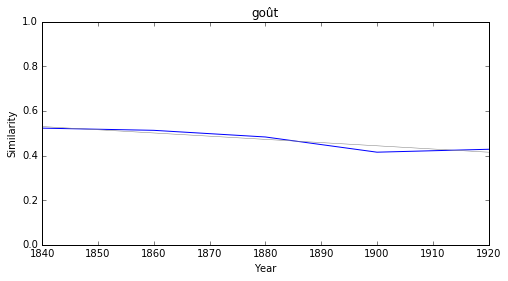

affranchissement


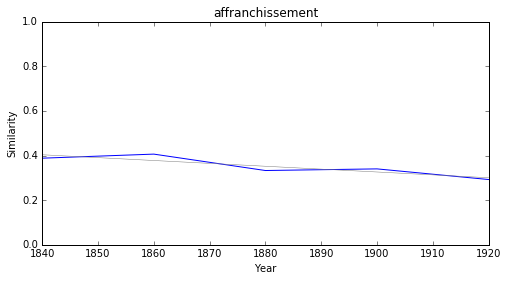

négation


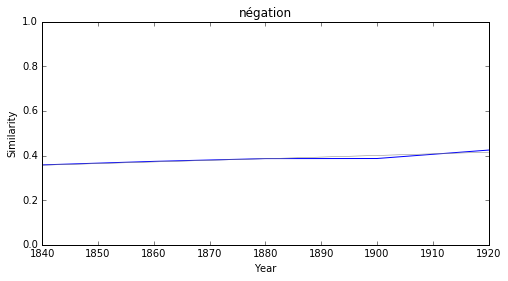

### <i><b>société</i></b>

          token     slope         p
4      barbarie -0.003002  0.020017
12     monument -0.002199  0.010337
14     négation  0.000728  0.018132
19      domaine  0.001052  0.005780
0   association  0.001079  0.022985
2      synthèse  0.001765  0.014498
3    communauté  0.001860  0.027865
6    esthétique  0.001901  0.000404
9   indépendant  0.001960  0.011496
11     vitalité  0.001964  0.014778



barbarie


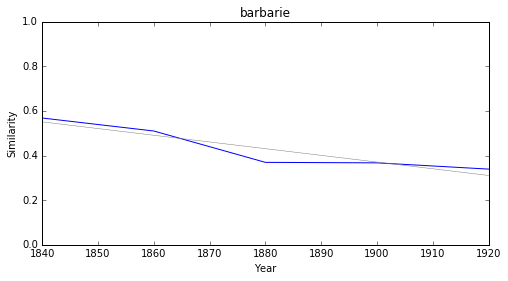

monument


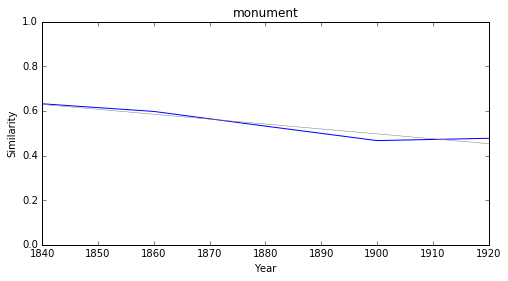

négation


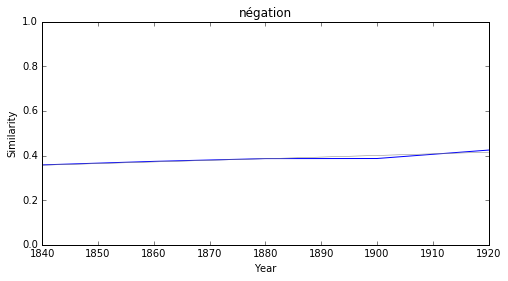

domaine


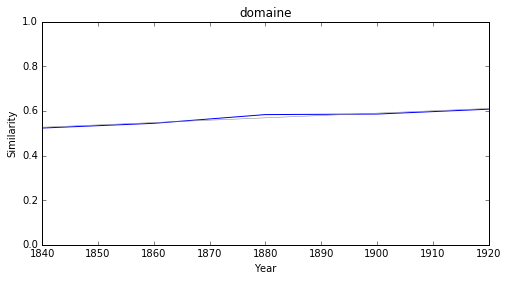

association


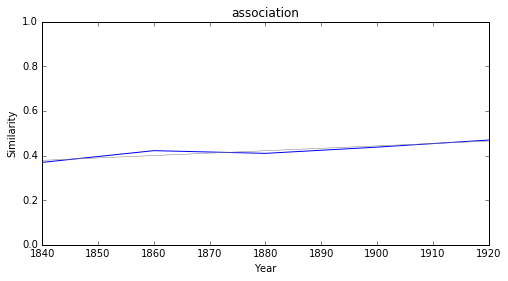

synthèse


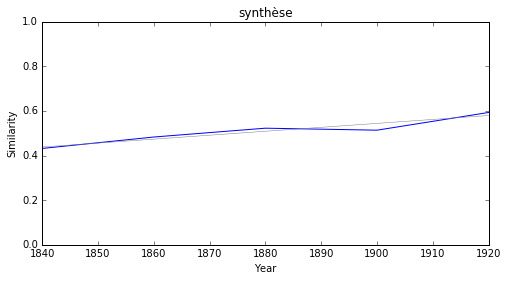

communauté


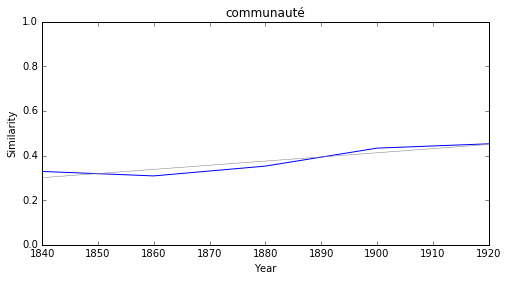

esthétique


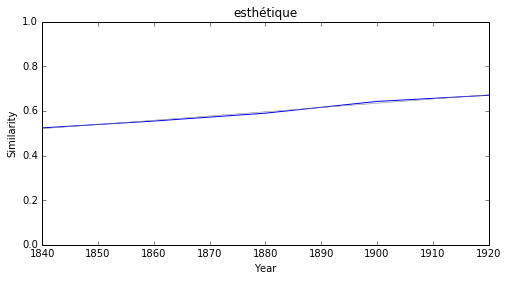

indépendant


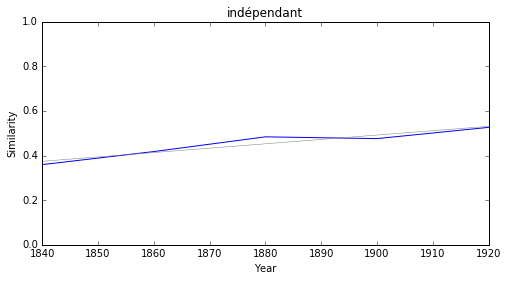

vitalité


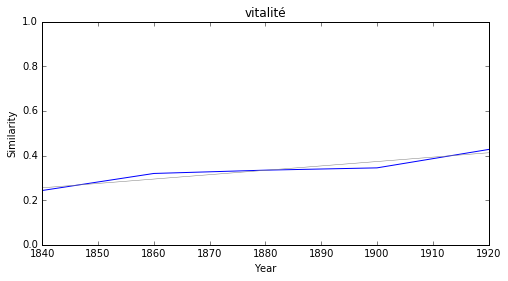

### <i><b>pouvoir</i></b>

            token     slope         p
1       réfléchir -0.003284  0.030711
3   véritablement -0.002781  0.027337
0           envie -0.002764  0.016561
17        admirer -0.002447  0.034599
11     pleinement -0.002273  0.020330
2     comparaison -0.002012  0.041023
19      ressource -0.001504  0.009807
21           goût -0.001436  0.022249
16       négation  0.000728  0.018132
15          avoir  0.000764  0.045412



réfléchir


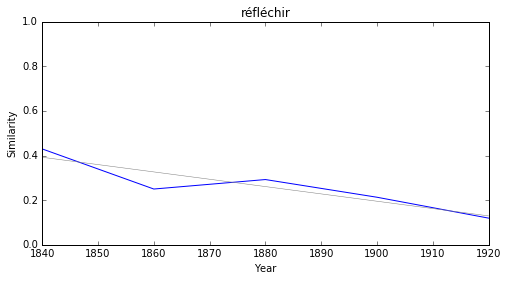

véritablement


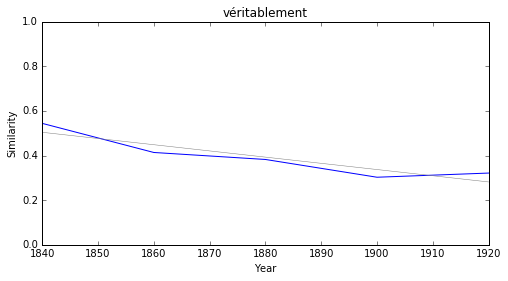

envie


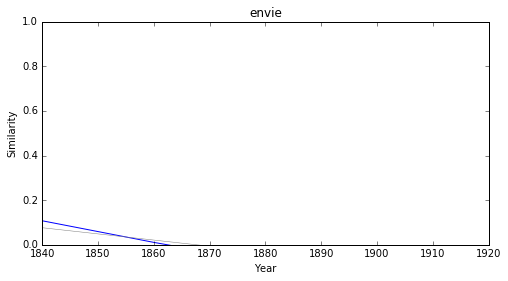

admirer


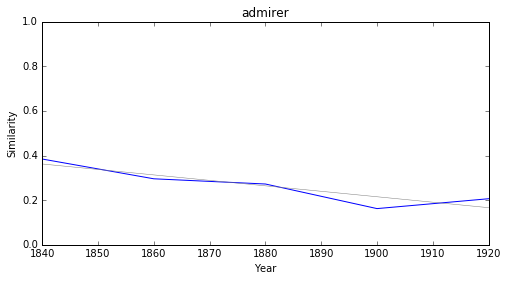

pleinement


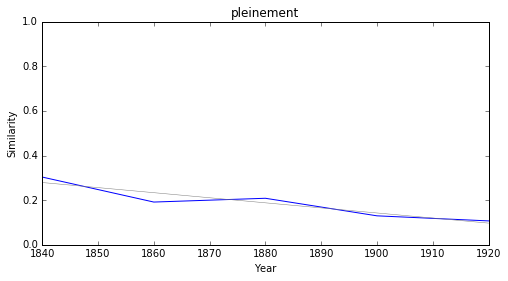

comparaison


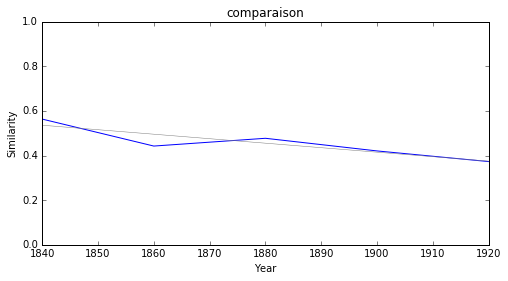

ressource


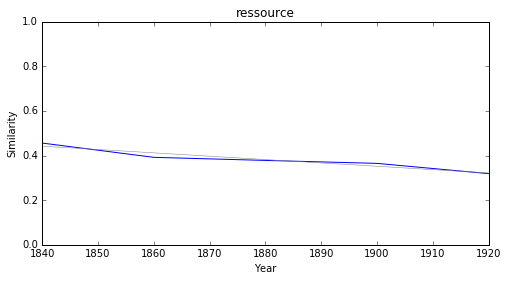

goût


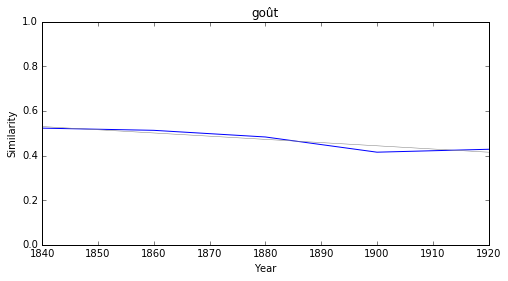

négation


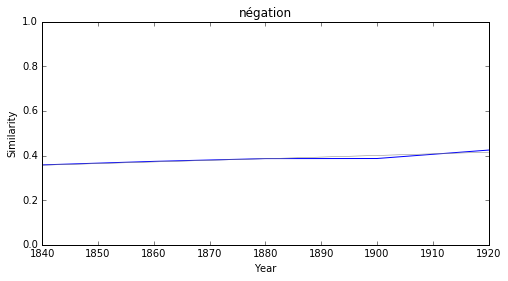

avoir


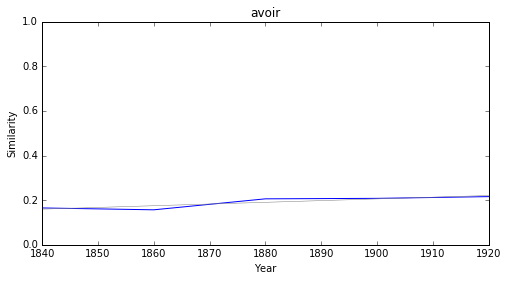

### <i><b>théologie</i></b>

               token     slope         p
14           dériver -0.001752  0.037587
0   affranchissement -0.001287  0.041211
16          négation  0.000728  0.018132
19            charte  0.001073  0.007169
1        association  0.001079  0.022985
4            utilité  0.001188  0.040852
21         inventeur  0.001277  0.012185
3           synthèse  0.001765  0.014498
5         communauté  0.001860  0.027865
9         esthétique  0.001901  0.000404



dériver


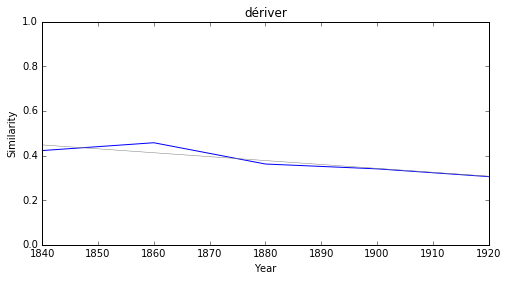

affranchissement


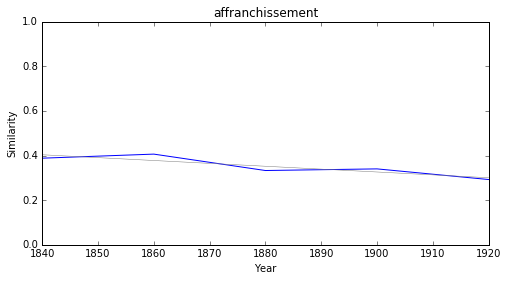

négation


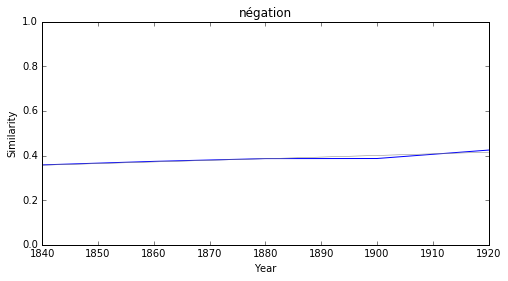

charte


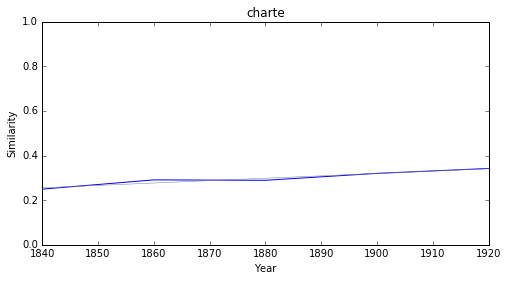

association


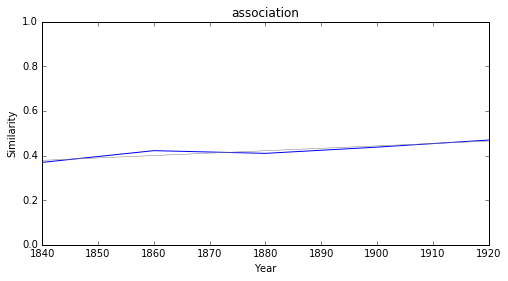

utilité


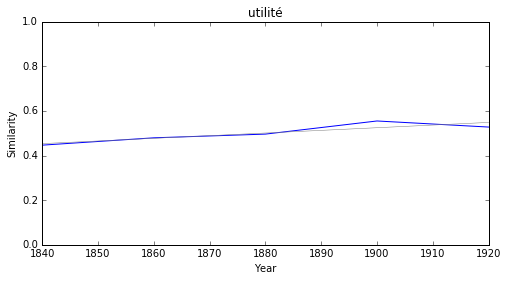

inventeur


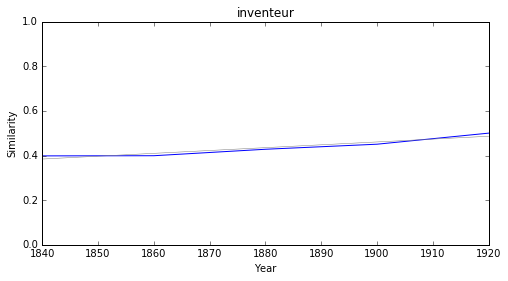

synthèse


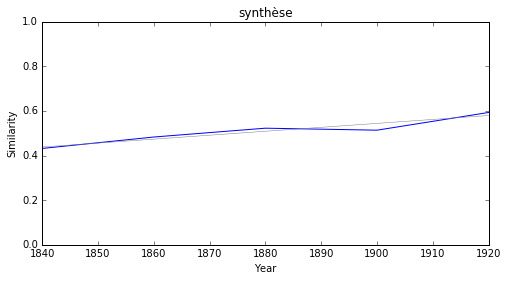

communauté


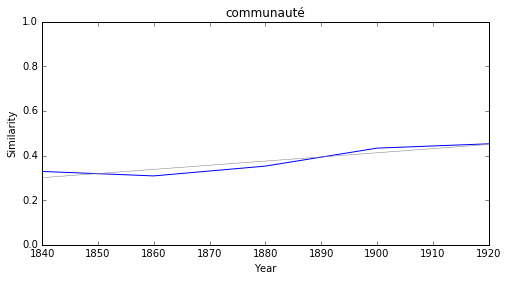

esthétique


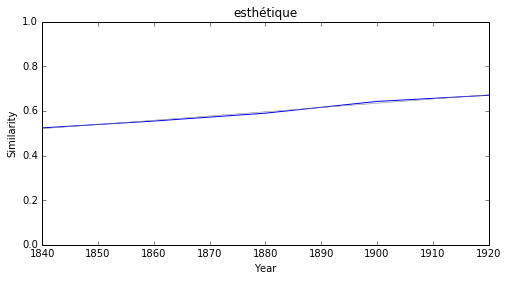

### <i><b>droit</i></b>

         token     slope         p
0        envie -0.002764  0.016561
14   ressource -0.001504  0.009807
15        goût -0.001436  0.022249
11    négation  0.000728  0.018132
7      domaine  0.001052  0.005780
4      utilité  0.001188  0.040852
5   prétention  0.001296  0.034148
10        insu  0.001661  0.016174
1       patrie  0.001922  0.038558
13    ambition  0.001923  0.010064



envie


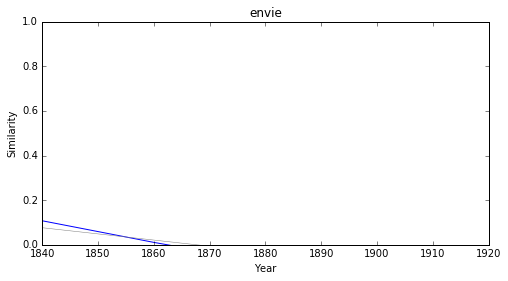

ressource


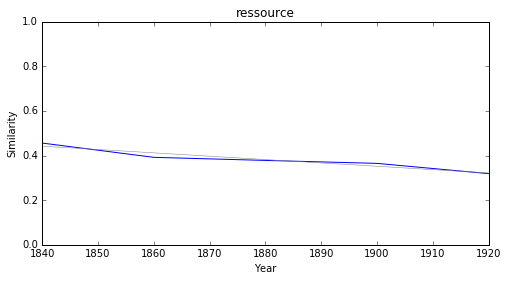

goût


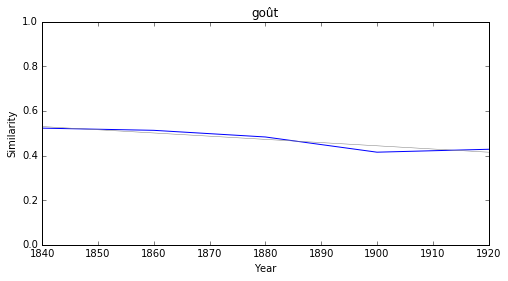

négation


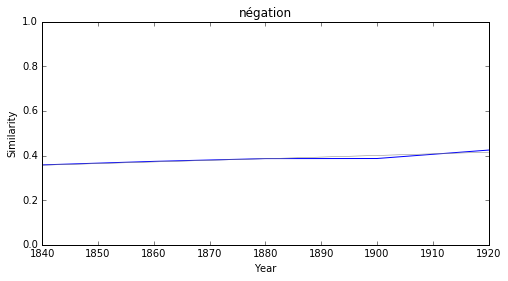

domaine


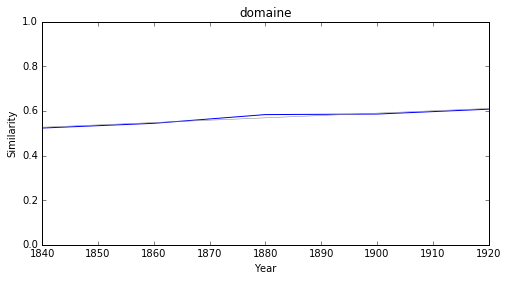

utilité


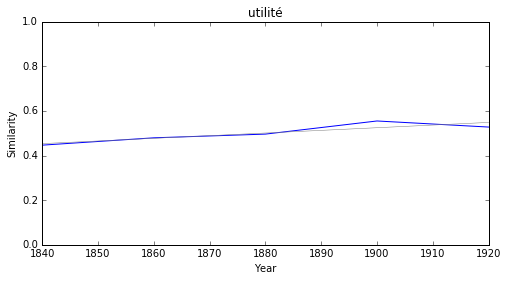

prétention


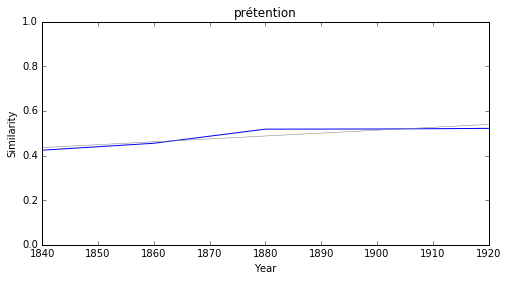

insu


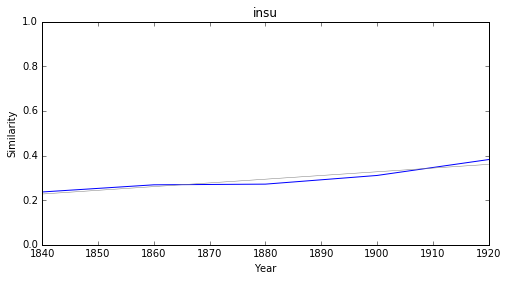

patrie


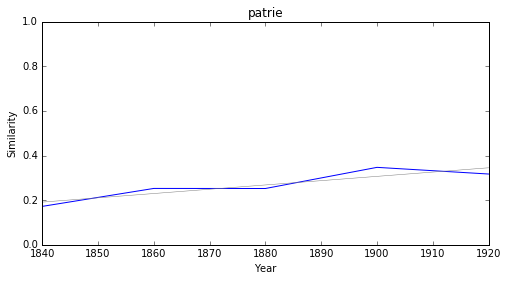

ambition


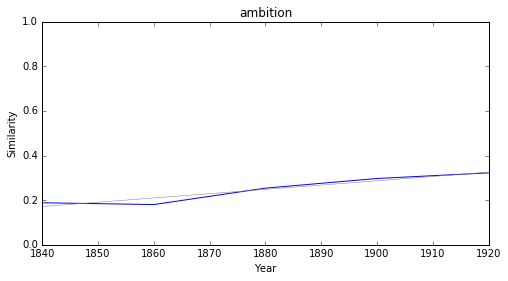

### <i><b>loi</i></b>

            token     slope         p
5   véritablement -0.002781  0.027337
4     comparaison -0.002012  0.041023
22      ressource -0.001504  0.009807
19       négation  0.000728  0.018132
15        domaine  0.001052  0.005780
6     association  0.001079  0.022985
8         utilité  0.001188  0.040852
12     prétention  0.001296  0.034148
16       synthèse  0.001765  0.014498
9      communauté  0.001860  0.027865



véritablement


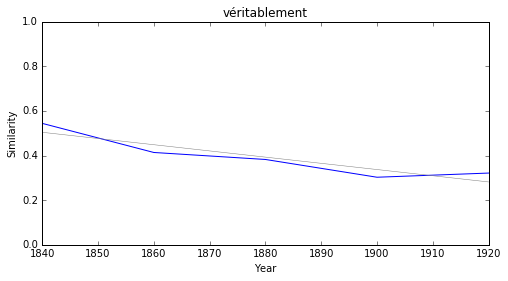

comparaison


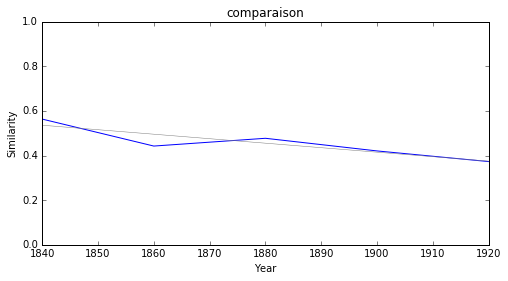

ressource


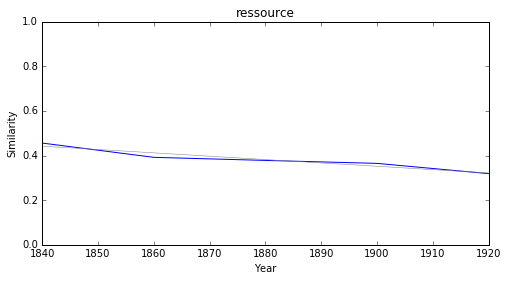

négation


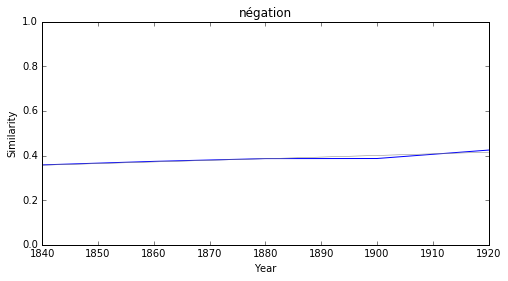

domaine


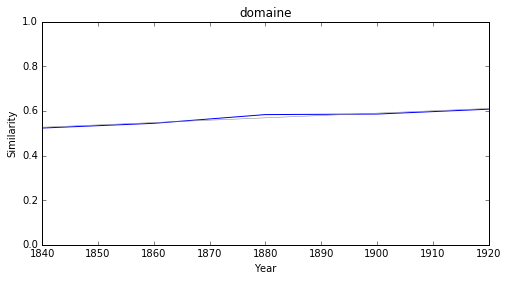

association


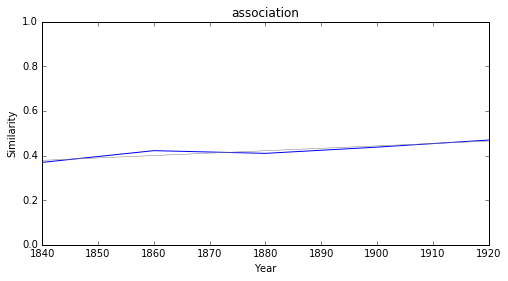

utilité


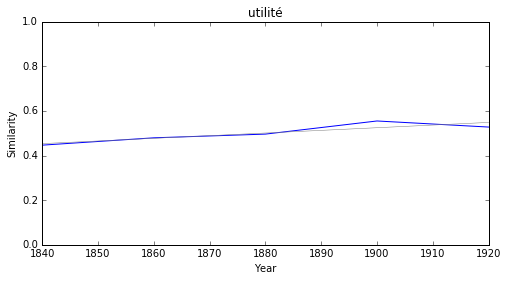

prétention


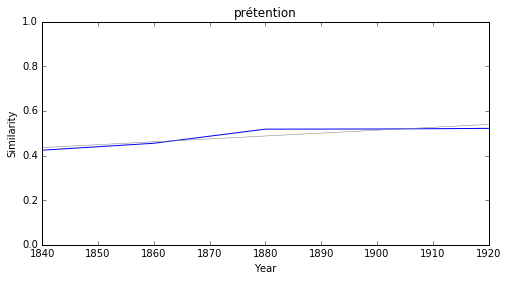

synthèse


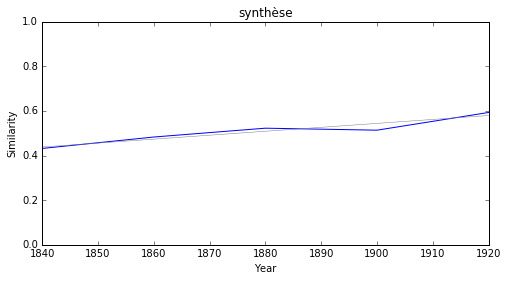

communauté


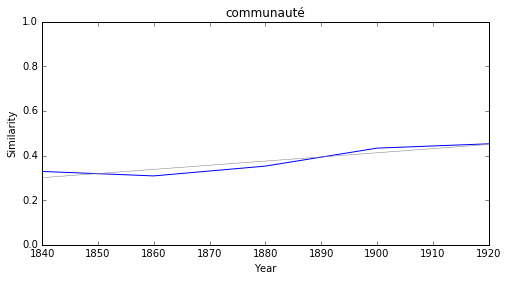

### <i><b>méthode</i></b>

            token     slope         p
0   physiologique -0.003338  0.019118
4   véritablement -0.002781  0.027337
16       corriger -0.002326  0.033348
3     comparaison -0.002012  0.041023
5         absence -0.001836  0.009778
20      ressource -0.001504  0.009807
21           goût -0.001436  0.022249
17       négation  0.000728  0.018132
13        domaine  0.001052  0.005780
6     association  0.001079  0.022985



physiologique


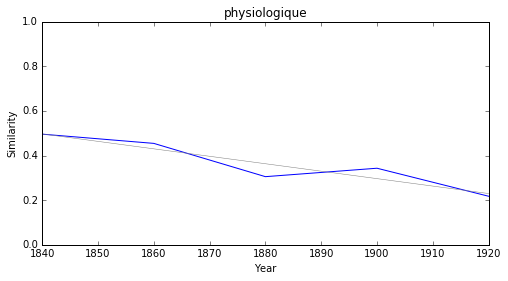

véritablement


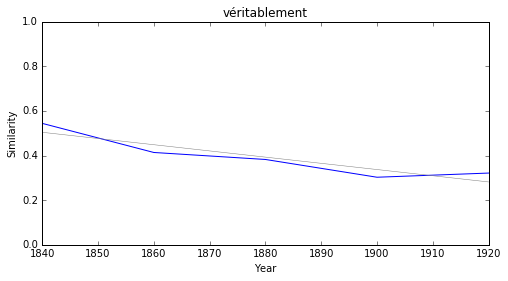

corriger


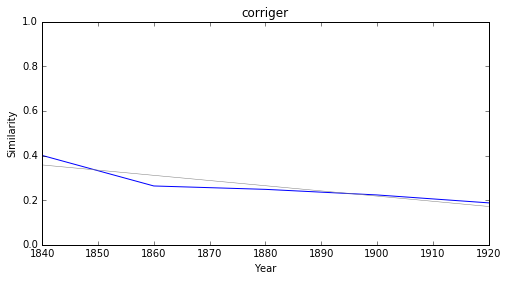

comparaison


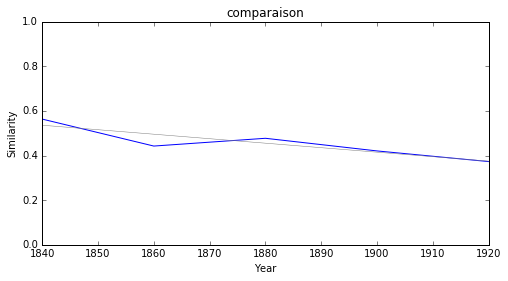

absence


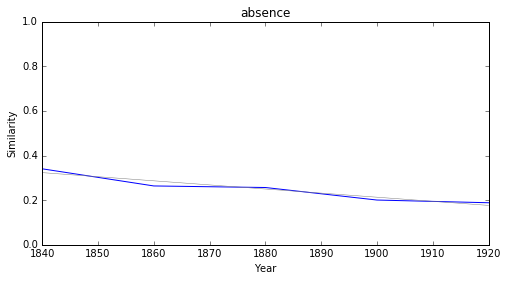

ressource


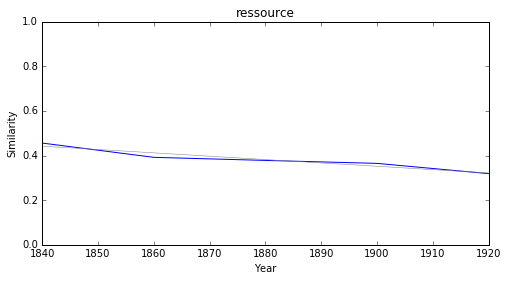

goût


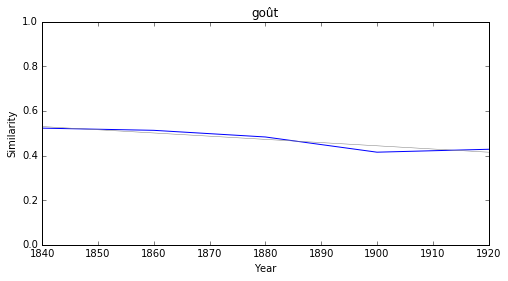

négation


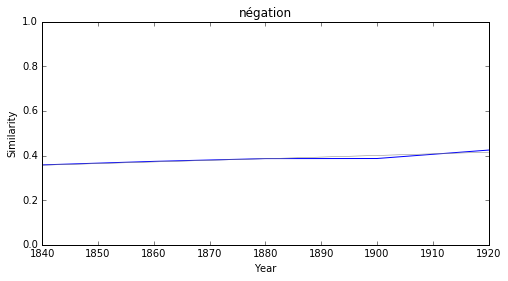

domaine


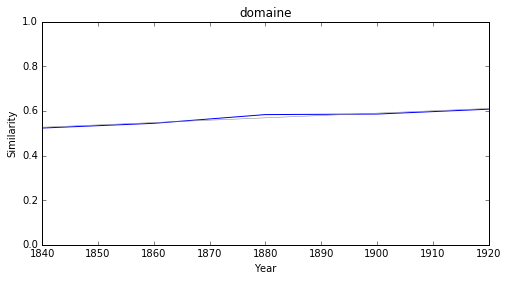

association


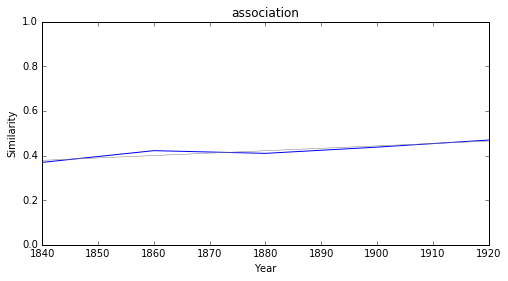

### <i><b>génie</i></b>

            token     slope         p
5   véritablement -0.002781  0.027337
24        admirer -0.002447  0.034599
10         allure -0.002426  0.036996
16    législateur -0.001952  0.001201
9     merveilleux -0.001801  0.022211
6    souveraineté -0.001730  0.013678
28      ressource -0.001504  0.009807
30           goût -0.001436  0.022249
20       négation  0.000728  0.018132
17        domaine  0.001052  0.005780



véritablement


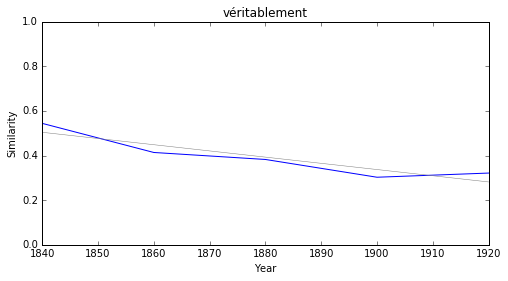

admirer


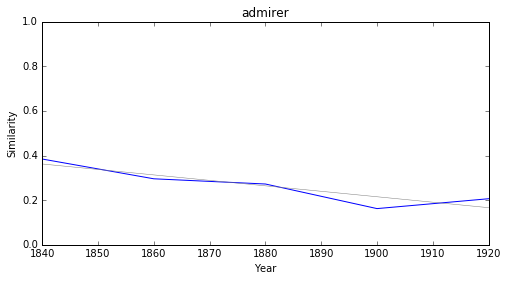

allure


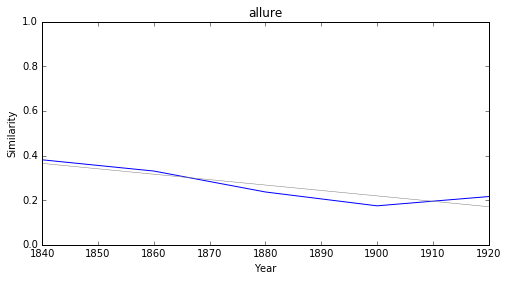

législateur


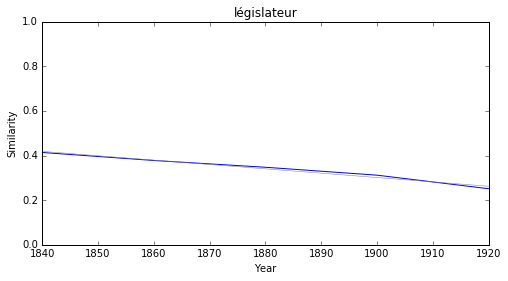

merveilleux


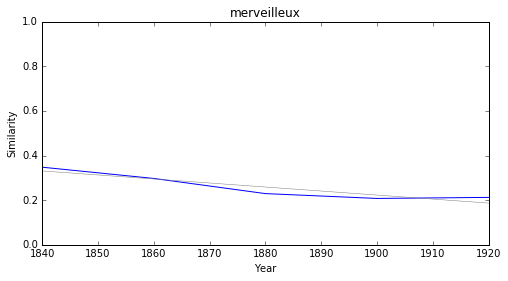

souveraineté


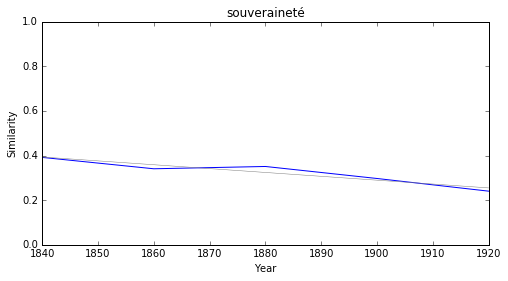

ressource


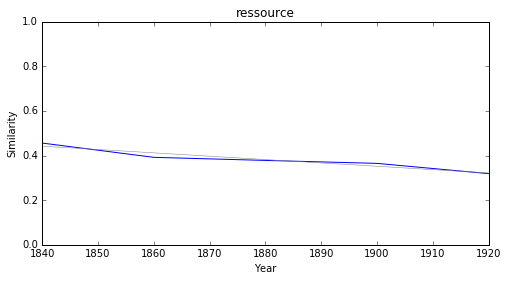

goût


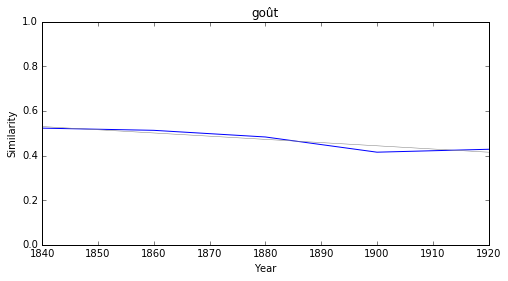

négation


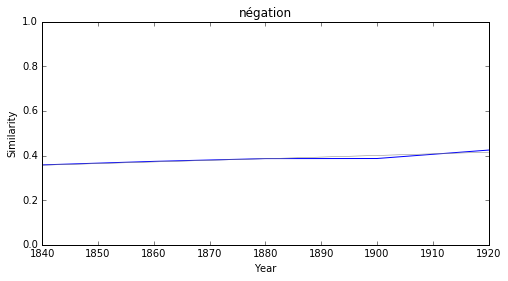

domaine


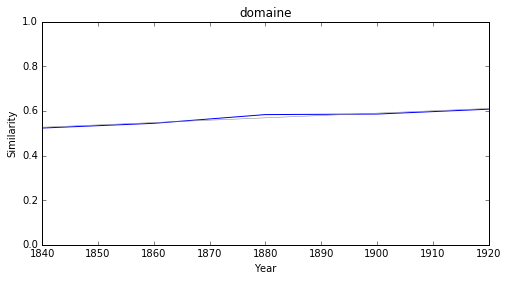

### <i><b>romantisme</i></b>

           token     slope         p
10   législateur -0.001952  0.001201
0     socialisme  0.001888  0.049450
5   matérialisme  0.002210  0.048289
9     territoire  0.002409  0.024115
4       parnasse  0.002535  0.034833
1    renaissance  0.002579  0.005921
7      grammaire  0.002686  0.019628
6    réalisation  0.002942  0.002470
3    journalisme  0.003473  0.048392
8        lyrisme  0.003805  0.023351



législateur


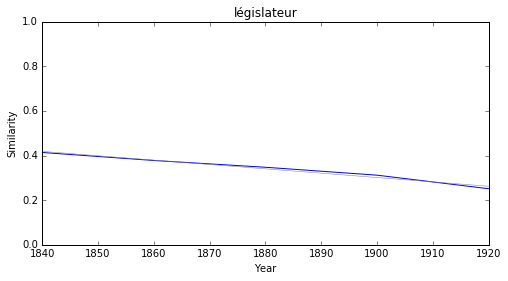

socialisme


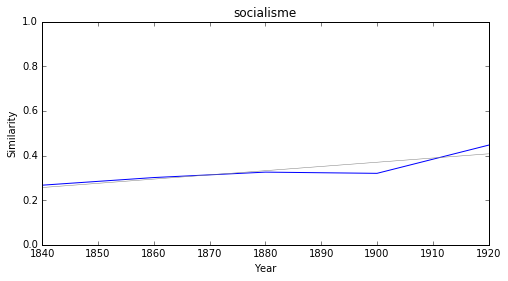

matérialisme


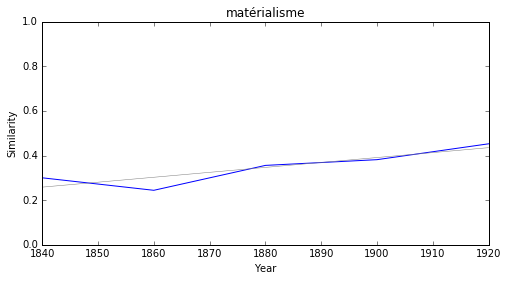

territoire


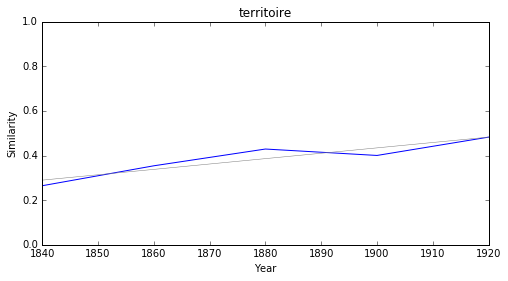

parnasse


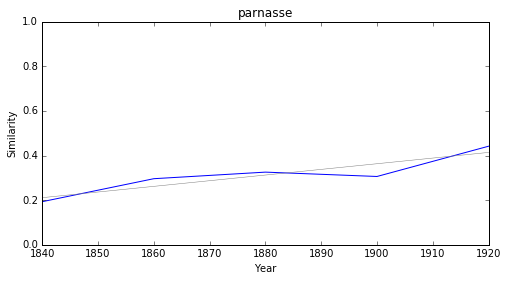

renaissance


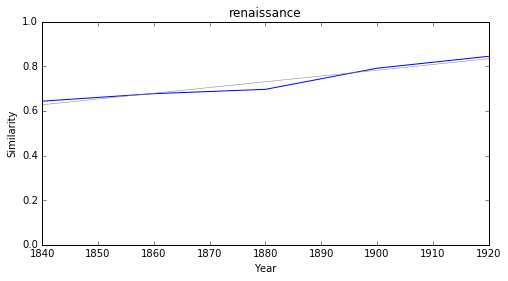

grammaire


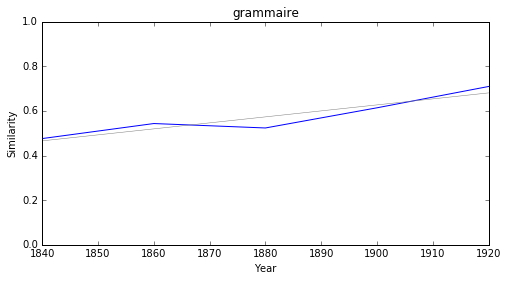

réalisation


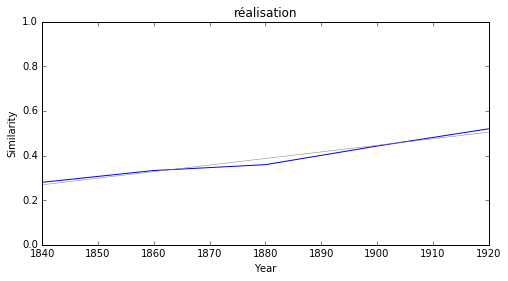

journalisme


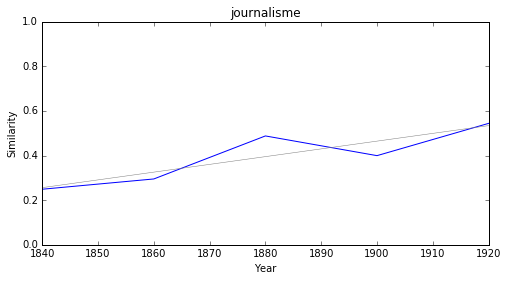

lyrisme


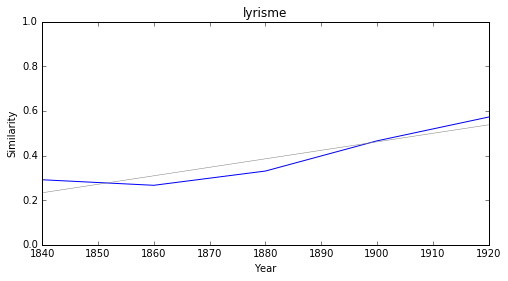

### <i><b>réalisme</i></b>

          token     slope         p
0  matérialisme  0.002210  0.048289
1   réalisation  0.002942  0.002470
5      métrique  0.003019  0.045490
4      hérédité  0.003464  0.011880
2       lyrisme  0.003805  0.023351
3      réaliste  0.005107  0.033174



matérialisme


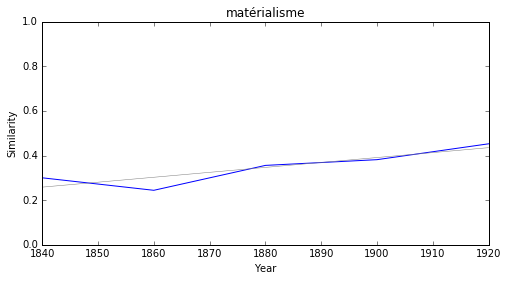

réalisation


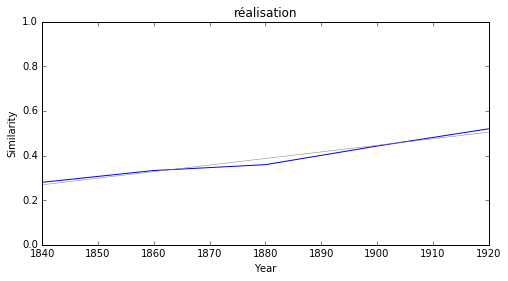

métrique


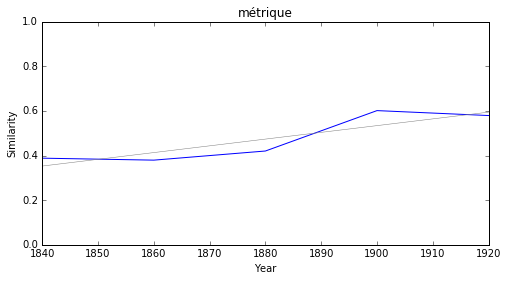

hérédité


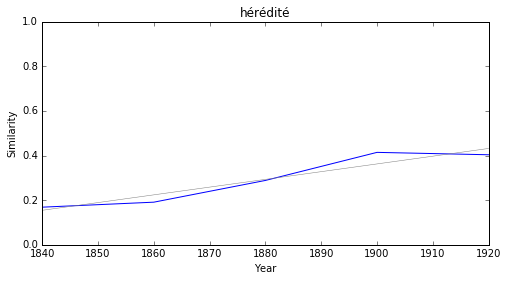

lyrisme


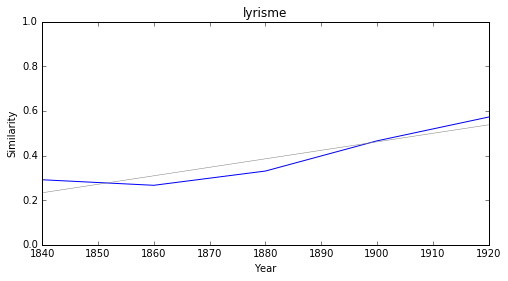

réaliste


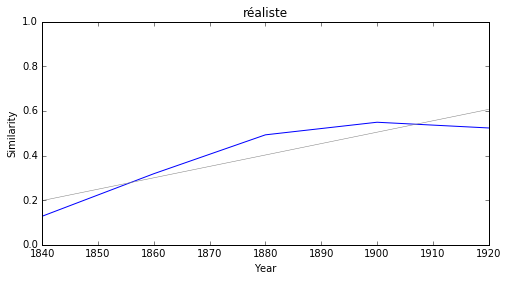

### <i><b>symbolisme</i></b>

         token     slope         p
0     synthèse  0.001765  0.014498
1  réalisation  0.002942  0.002470
3     métrique  0.003019  0.045490
2      lyrisme  0.003805  0.023351



synthèse


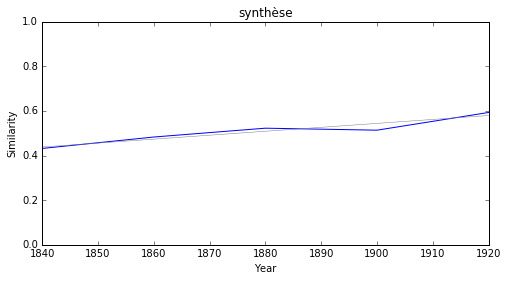

réalisation


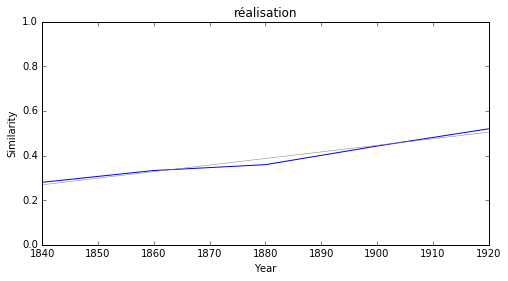

métrique


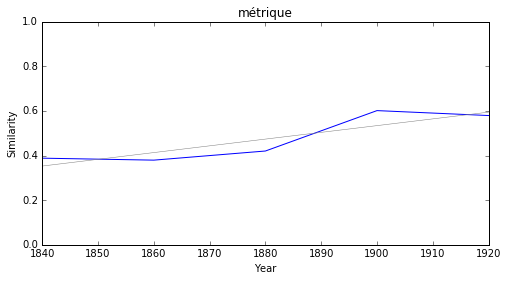

lyrisme


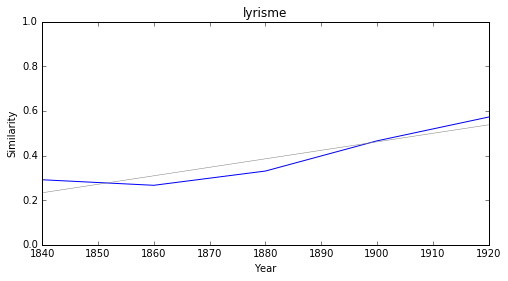

### <i><b>naturalisme</i></b>

        token     slope         p
0  socialisme  0.001888  0.049450
1     lyrisme  0.003805  0.023351



socialisme


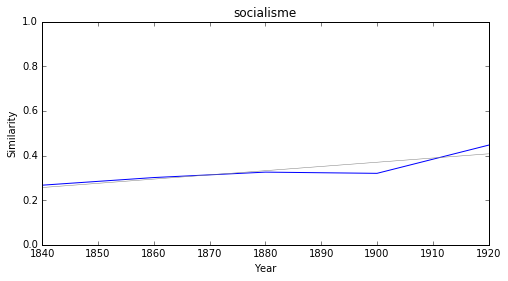

lyrisme


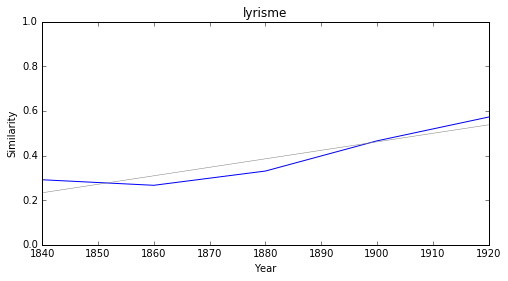

In [199]:
from IPython.display import Markdown, display

for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df3 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df3.sort_values('slope', ascending=True).head(10))
    print('\n\n')
    
    for i, row in df3.sort_values('slope', ascending=True).head(10).iterrows():
        plot_cosine_series('littérature', row['token'], 8, 4)